# Magnet Ramp 02-24-2021

# Imports

In [1]:
import numpy as np
import pandas as pd
import lmfit as lm
from scipy.interpolate import interp1d
import sys
import os
from dateutil import parser
from datetime import datetime
import matplotlib.pyplot as plt
#%matplotlib inline
%matplotlib notebook
from matplotlib.dates import date2num, RRuleLocator, rrulewrapper, DateFormatter, HourLocator

from plotting import config_plots

from hallprobecalib import hpc_ext_path
from hallprobecalib.hpcplots import scatter2d,scatter3d,histo

In [96]:
import pickle as pkl

In [2]:
# import from this folder
from run_info import t0s, tfs, ramps, hysts, adcs

In [3]:
config_plots()

In [4]:
# directories
rawdir = '/home/ckampa/Dropbox/LogFiles/'
pkldir = '/home/ckampa/data/hallprobecalib_extras/datafiles/magnet_ramp/2021-02-24/'
# femmdir = '/home/ckampa/coding/CalibMagnetCalc/FEMM/data/'
plotdir = '/home/ckampa/data/hallprobecalib_extras/plots/magnet_ramp/2021-02-24/'

In [27]:
# data file
rawfile = rawdir+'2021-02-24 094822slow.txt'
pklraw = pkldir+'ramp_2021-02-24_raw.pkl'
pklproc = pkldir+'ramp_2021-02-24_processed.pkl'
# femmfile_70 = femmdir+'gap70_B_vs_I_r0z0_0-200_results.txt'
femmfile_70 = pkldir+'gap70_B_vs_I_r0z0_0-200_results.txt'

In [6]:
# Hall probe ID
probe = '6A0000000D61333A' # on SmarAct, in magnet

In [ ]:
#### TESTING LOADING FIT RESULTS

In [98]:
results = pkl.load(open(pkldir+'ramp_2021-02-24.stable-temp-fits.pkl', 'rb'))

In [101]:
results[0]

# File 1: FEMM Comparison
**DONE 2021-04-22 12:10**
- Saving as: `femm_gmw_compare.py`
- Requires:
    - `configs.py` (which points to data and plot directories)
- Want to compare FEMM to GMW calibration curve

In [ ]:
# imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib notebook
# local
from configs import femmfile_70, plotdir
from plotting import config_plots
config_plots()

In [30]:
# initial loading and setup
df = pd.read_csv(femmfile_70, skiprows=8, names=['I','B'])
# currents and B from GMW excitation data table
currents = np.array([0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200])
GMW_Bs = np.array([0.00000,0.25612,0.50921,0.76165,0.99680,1.14767,1.25025,1.35284,1.42225,1.47993,1.51854])
# currents = np.array([0, 20, 40, 60, 80, 100, 120, 140])
# GMW_Bs = np.array([0.00000,0.25612,0.50921,0.76165,0.99680,1.14767,1.25025,1.35284])
df_GMW = pd.DataFrame({'I':currents, 'B': GMW_Bs})
df_ = df[np.isin(df.I,currents)].copy()
df_GMW.eval('I = I * 2', inplace=True)
df.eval('I = I * 2', inplace=True)
df_.eval('I = I * 2', inplace=True)

In [33]:
# # plotting functions
def make_scatter_plot_ratio(df_GMW=df_GMW, df_FEMM=df, df_FEMM_part=df_, savename=plotdir+'femm_gmw_comparison_ratio'):
    fig = plt.figure()
    ax1 = fig.add_axes((0.1, 0.3, 0.8, 0.6))
    ax2 = fig.add_axes((0.1, 0.1, 0.8, 0.2))
    ax1.plot(df_FEMM.I, df_FEMM.B, linewidth=2, color='red', label='FEMM Calculation', zorder=99)
    ax1.plot(df_GMW.I, df_GMW.B, f'.', markersize=10, color='blue', label='GMW Calibration Curve', zorder=100)
    ax1.plot([280, 280], [-0.5, 1.8], color='black', linestyle='-.', label='Physical Limit of Magnet', zorder=98)
    #r = df_FEMM_part.B.values/df_GMW.B.values
    a = df_FEMM_part.B
    b = df_GMW.B.values
    r = np.divide(a, b, out=np.ones_like(a), where=b!=0)

    ylim = 1.3*np.nanmax(np.abs(r-1))
    # ax2.scatter(df_GMW.I.values, r, color='blue', s=15)
    ax2.plot(df_GMW.I.values, r, f'.', markersize=10, color='blue', zorder=99)
    ax2.plot([280, 280], [0, 3], color='black', linestyle='-.', zorder=98)
    ax2.set_ylim([1-ylim, 1+ylim])
    ax1.set_xticklabels([])
    ax2.set_xlabel('Magnet Current [A]')
    ax2.set_ylabel(r'($|B|_{\mathrm{FEMM}}/|B|_{\mathrm{GMW}}$)')
    ax1.set_ylabel(r'$|B|$ [T]')
    I_min = np.min([df_GMW.I.min(), df_FEMM.I.min()])
    I_max = np.max([df_GMW.I.max(), df_FEMM.I.max()])
    ax1.set_xlim([I_min-10, I_max+10])
    ax1.set_ylim([-0.1, 1.7])
    ax2.set_xlim([I_min-10, I_max+10])
    # ax1.set_xlim([-10, 150])
    # ax2.set_xlim([-10, 150])
    ax1.legend()
    fig.suptitle('FEMM Calculation vs. GMW Calibration Curve: 70 mm Gap')

    # inward labels
    ax1.tick_params(axis='y', which='both', direction='in')
    ax2.tick_params(direction='in')

    fig.savefig(savename+'.pdf')
    fig.savefig(savename+'.png')

    return fig, ax1, ax2

<IPython.core.display.Javascript object>


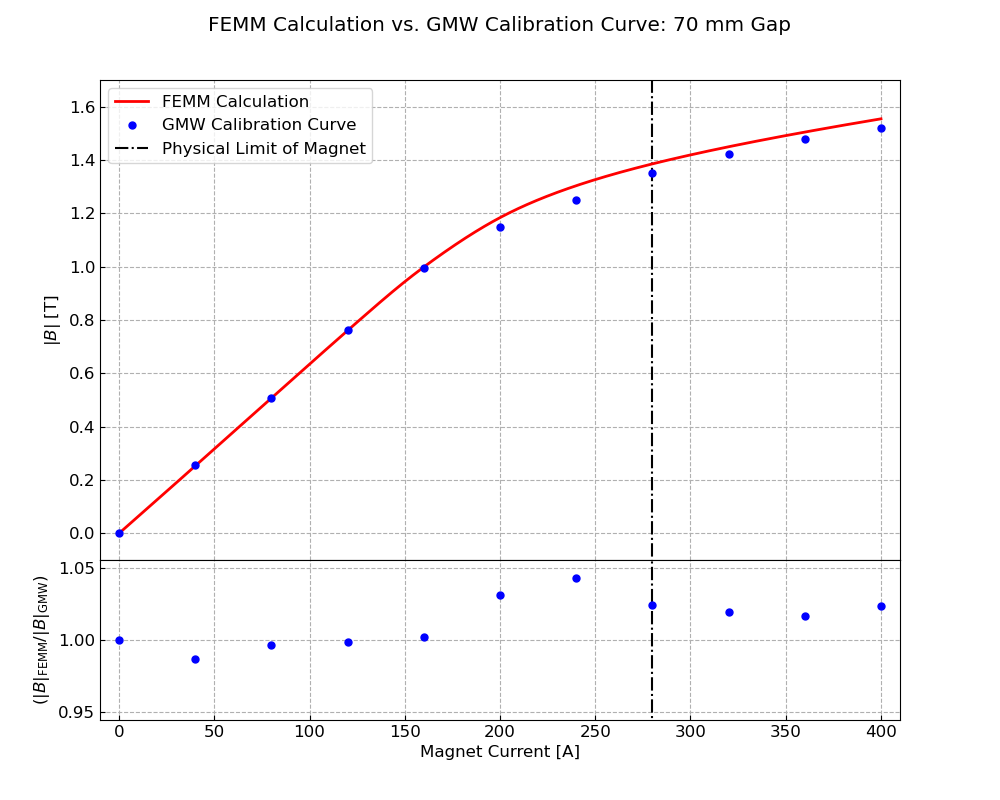

In [34]:
fig, ax1, ax2 = make_scatter_plot_ratio(df_GMW, df, df_, plotdir+'femm_gmw_comparison_ratio')

# File 2: Pre-Process Data
- Saving as: `preprocess_data.py`
- Using all filter steps / decisions up to this point (2021-04-22 12:10). May want another file that generates plots that guide cut decisions.

## Load Raw
**DONE 2021-04-22 12:58**

In [10]:
# DONE
def load_save_raw(rname, pname):
    # grab headers from first line in file and format nicely
    with open(rname, 'r') as file:
        headers = [s.strip(" ").rstrip("\n") for s in str.split(next(file), ',')]
    # load with pandas
    df = pd.read_csv(rname, skiprows=1, names=headers)
    # parse dates and make convenient unit
    dates = [parser.parse(row.Time) for row in df.itertuples()]
    df['Datetime'] = pd.to_datetime(dates)
    df.sort_values(by=['Datetime'], inplace=True)
    df = df.set_index('Datetime')
    df['seconds_delta'] = (df.index - df.index[0]).total_seconds()
    df['hours_delta'] = (df.index - df.index[0]).total_seconds()/60**2
    df['days_delta'] = (df.index - df.index[0]).total_seconds()/(24*60**2)
    # save to pickle
    df.to_pickle(pname)
    return df

# DONE
def get_probe_IDs(df):
    probes = [c[:-6] for c in df.columns if "Raw_X" in c]
    return probes

# NOT ADDING TO FINAL SCRIPTS
def modify_raw(df_raw, cuts, pname):
    # current change in time
    m_C = np.abs(df_raw['Magnet Current [A]'].diff()) < cuts['Current Diff']
    df = df_raw[m_C].copy()
    # time cut
    df = df.query(cuts['Time Query'])
    # no NMR
    n_NMR = ((df['NMR [T]'] <= cuts['No NMR'][0]) & (df['Magnet Current [A]'] >= cuts['No NMR'][1]))
    df = df[~n_NMR]
    # calculations for Hall probes
    probes = get_probe_IDs(df)
    for p in probes:
        # magnitudes
        df[f'{p}_Cal_Bmag'] = (df[f'{p}_Cal_X']**2 + df[f'{p}_Cal_Y']**2 + df[f'{p}_Cal_Z']**2)**(1/2)
        df[f'{p}_Raw_Bmag'] = (df[f'{p}_Raw_X']**2 + df[f'{p}_Raw_Y']**2 + df[f'{p}_Raw_Z']**2)**(1/2)
        # B field angles
        df[f'{p}_Cal_Theta'] = np.arccos(df[f'{p}_Cal_Z']/df[f'{p}_Cal_Bmag'])
        df[f'{p}_Cal_Phi'] = np.arctan2(df[f'{p}_Cal_Y'],df[f'{p}_Cal_X'])
    # extra filter (far away from mean)
    df.sort_values(by=['Magnet Current [A]'], inplace=True)
    masks = []
    dI = cuts['dI']
    for I in cuts['Current Sets']:
        df_ = df.query(f'{I-dI} <= `Magnet Current [A]` <= {I+dI}')
        nmr_mean = df_['NMR [T]'].mean()
        nmr_std = df_['NMR [T]'].std()
        mask = (df_['NMR [T]'] - nmr_mean).abs() <= cuts['N_sigma_NMR'] * nmr_std
        masks.append(mask)
    masks = np.concatenate(masks)
    df = df[masks]
    df.sort_values(by=['Datetime'], inplace=True)
    # save processed df to pickle
    df.to_pickle(pname)
    return df

# def map_process():
#     df_raw = load_raw()
#     df = modify_raw(df_raw)
    

In [11]:
df_raw = load_save_raw(rawfile, pklraw)

In [12]:
df_raw

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1 (new),Coil 2 (old),LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke,...,C90000000D53983A_Cal_T,C50000000D5E473A_Cal_T,6A0000000D61333A_Cal_T,SmarAct_Meas_Angle_1,SmarAct_Meas_Rotation_Angle_1,SmarAct_Meas_Angle_2,SmarAct_Meas_Rotation_Angle_2,seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2021-02-24 09:49:22,2/24/2021 9:49:22 AM,-0.002925,0.000002,8.246499,8.182197,6.857428,7.356476,7.944802,7.024402,14.458421,...,15.623,15.753,15.557,359.999625,-1.0,359.999682,-1.0,0.0,0.000000,0.000000
2021-02-24 09:50:22,2/24/2021 9:50:22 AM,240.072583,26.163733,8.505167,8.515872,6.874896,7.378290,7.996929,7.051631,14.441149,...,15.597,15.702,15.549,359.999625,-1.0,359.999670,-1.0,60.0,0.016667,0.000694
2021-02-24 09:51:22,2/24/2021 9:51:22 AM,240.072640,26.384917,10.040093,10.049843,6.868186,7.492210,8.061913,7.417769,14.417467,...,15.566,15.650,15.539,359.999610,-1.0,359.999660,-1.0,120.0,0.033333,0.001389
2021-02-24 09:51:59,2/24/2021 9:51:59 AM,240.072697,26.509250,11.002189,11.016994,6.908482,7.635952,8.189104,7.726658,14.409135,...,15.541,15.603,15.534,359.999615,-1.0,359.999656,-1.0,157.0,0.043611,0.001817
2021-02-24 09:53:03,2/24/2021 9:53:03 AM,240.072640,26.708217,12.648212,12.592643,7.030270,7.945996,8.495774,8.313150,14.388492,...,15.522,15.567,15.528,359.999619,-1.0,359.999651,-1.0,221.0,0.061389,0.002558
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-05 08:05:03,4/5/2021 8:05:03 AM,160.047520,18.885693,26.896858,26.822971,16.732733,18.459539,18.649643,21.047083,18.768127,...,17.222,17.158,17.702,0.001787,0.0,0.001367,0.0,3449741.0,958.261389,39.927558
2021-04-05 08:06:03,4/5/2021 8:06:03 AM,160.047463,18.885840,26.895796,26.856619,16.735105,18.453161,18.628620,21.054861,18.767283,...,17.227,17.155,17.695,0.001792,0.0,0.001370,0.0,3449801.0,958.278056,39.928252
2021-04-05 08:07:03,4/5/2021 8:07:03 AM,160.047520,18.885925,26.894203,26.892708,16.730320,18.454494,18.626814,21.064997,18.768127,...,17.227,17.158,17.712,0.001788,0.0,0.001370,0.0,3449861.0,958.294722,39.928947


In [13]:
probes = get_probe_IDs(df_raw)
probes

['DF0000000D5E803A',
 'C90000000D53983A',
 'C50000000D5E473A',
 '6A0000000D61333A']

In [14]:
I0s = [0., 128., 144., 160., 176., 192., 208., 224., 240., 256., 272., 282.]

In [15]:
cuts = {'Current Diff': 0.00035,
        'Time Query': '(120.<= hours_delta <= 215.5) or (286.1 <= hours_delta <= 368.)',
        'No NMR': [0.01, 1],
        'Current Sets': I0s,
        'dI': 5.,
        'N_sigma_NMR': 5.,
       }

In [16]:
df = modify_raw(df_raw, cuts, pklproc)

In [17]:
df

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1 (new),Coil 2 (old),LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke,...,C90000000D53983A_Cal_Theta,C90000000D53983A_Cal_Phi,C50000000D5E473A_Cal_Bmag,C50000000D5E473A_Raw_Bmag,C50000000D5E473A_Cal_Theta,C50000000D5E473A_Cal_Phi,6A0000000D61333A_Cal_Bmag,6A0000000D61333A_Raw_Bmag,6A0000000D61333A_Cal_Theta,6A0000000D61333A_Cal_Phi
Datetime,,,,,,,,,,,,,,,,,,,,,
2021-03-01 09:49:43,3/1/2021 9:49:43 AM,0.000707,0.000847,8.544641,8.492877,6.863394,7.433577,8.097095,7.096389,15.888715,...,0.968957,-2.184323,0.000126,463.532092,2.691321,0.081789,0.000917,7.355118e+03,1.632304,3.116651
2021-03-01 09:50:43,3/1/2021 9:50:43 AM,0.000713,0.000647,8.484952,8.425420,6.924854,7.489609,8.071188,7.118377,15.859727,...,0.933636,-2.070294,0.000156,313.792925,2.195223,0.334574,0.000880,7.253640e+03,1.634614,3.121131
2021-03-01 09:51:43,3/1/2021 9:51:43 AM,0.000672,0.001643,8.435831,8.354500,6.909949,7.484150,8.040173,7.108479,15.836957,...,1.039061,-2.477732,0.000127,322.090050,2.327329,0.447258,0.000927,7.381624e+03,1.661890,3.103220
2021-03-01 09:52:43,3/1/2021 9:52:43 AM,0.000700,0.000691,8.337690,8.323365,6.913098,7.457797,8.036749,7.106894,15.808518,...,1.306904,-1.907816,0.000121,310.720131,2.256660,0.365770,0.000898,7.312526e+03,1.599095,3.102054
2021-03-01 09:53:43,3/1/2021 9:53:43 AM,0.000703,0.001220,8.288239,8.268475,6.896706,7.444767,7.997497,7.073971,15.785650,...,0.891178,-1.912466,0.000132,394.818946,2.556766,0.501988,0.000933,7.373243e+03,1.632594,-3.119574
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-11 17:44:47,3/11/2021 5:44:47 PM,281.677420,36.814200,52.021076,51.456760,16.501778,22.724478,23.393492,31.627434,25.738649,...,0.931596,0.235988,0.020028,54110.492781,0.435998,-1.808665,1.306994,3.617199e+06,1.533321,-0.029962
2021-03-11 17:45:47,3/11/2021 5:45:47 PM,281.677420,36.814183,51.975594,51.428474,16.496992,22.704569,23.269421,31.609009,25.743862,...,0.931331,0.234844,0.020066,54210.368833,0.436263,-1.809014,1.307007,3.617301e+06,1.533339,-0.029942
2021-03-11 17:46:47,3/11/2021 5:46:47 PM,281.677420,36.814150,51.974365,51.455513,16.494814,22.697769,23.309382,31.614250,25.736761,...,0.934414,0.245358,0.020067,54212.413136,0.435055,-1.808301,1.306971,3.617085e+06,1.533332,-0.029959


## Initial Plotting (extraneous)

In [18]:
def make_time_plots(df):
    ## TIME PLOTS
    noplot = ['Time', 'seconds_delta', 'hours_delta', 'days_delta']
    # processed
    for col in df.columns:
        if col not in noplot:
            fig = scatter2d(df.index, df[col], markers=False, lines=True, show_plot=False) 
            fig.write_image(plotdir+f"time/all/{col}_vs_time.pdf")
            fig.write_image(plotdir+f"time/all/{col}_vs_time.png")

In [15]:
make_time_plots(df)

## Pick Some Interesting Plots (extraneous)

In [19]:
fig = scatter2d(df_raw.index, df_raw[f"Magnet Current [A]"], markers=True, lines=False, inline=False)

In [17]:
fig = scatter2d(df_raw.index, df_raw[f"Magnet Current [A]"], markers=False, lines=True, inline=False)

In [18]:
df_raw.columns

Index(['Time', 'Magnet Current [A]', 'Magnet Voltage [V]', 'Coil 1 (new)',
       'Coil 2 (old)', 'LCW in Coil1', 'LCW out Coil 1', 'LCW in Coil 2',
       'LCW out Coil 2', 'Yoke', 'Hall Element', 'Floor', 'Roof',
       'Yoke (center magnet)', 'Parameter HVAC sensor', 'Chamber Wall CH13',
       'Chamber Wall CH14', 'Chamber Wall CH15', 'Chamber Wall CH16',
       'Chamber Wall CH17', 'Chamber Wall CH18', 'Chamber Wall CH19',
       'Chamber Wall CH20', 'Desk Ambient', 'Outlet Strip Ambient',
       'Top fo Orange PS Ambient', 'Spare Ambient on desk',
       'TrippLite Ambient 3ft high', 'TrippLite Ambient Floor', 'PS internal',
       'PS Vent1', 'PS Vent2', 'TrippLite HVAC supply',
       'Tripplite HVAC exhaust', 'LCW to PS', 'LCW in barrel', 'ICW in',
       'ICW HE1 out', 'ICW He2 out', 'LCW return magnet', 'LCW to barrel',
       'LCW from PS', 'LCW to magnet', 'NMR [T]', 'NMR [FFT]',
       'DF0000000D5E803A_Raw_X', 'DF0000000D5E803A_Raw_Y',
       'DF0000000D5E803A_Raw_Z', 'C

## Dataframe + LaTeX Table Generation
**DONE 2021-04-22 15:04**

In [40]:
# DONE
def make_timing_df(df, t0s, tfs, ramps, hysts, adcs):
    df_time = pd.DataFrame({'t0':t0s, 'tf':tfs, 'ramp':ramps, 'hyst':hysts, 'adc':adcs})
    df_time['chiller'] = df_time.t0 < '2021-03-05 14:00:01' # CHILLER FAILED
    # loop through to find NMR in range and mean current
    nmrs = []
    Bs = []
    Is = []
    for i, row in enumerate(df_time.itertuples()):
        df_ = df_raw.query(f'"{row.t0}" < index < "{row.tf}"')
        I = np.mean(df_['Magnet Current [A]'])
        B = np.mean(df_['NMR [T]'])
        if B > 0.1:
            nmr = True
        else:
            nmr = False
        nmrs.append(nmr)
        Bs.append(B)
        Is.append(I)
    df_time['NMR'] = nmrs
    df_time['B_NMR'] = Bs
    df_time['I'] = Is
    
    return df_time

# DONE
def timing_checks_latex(df, time_df, writefile=None):
    out_str = ''
    # write header
    out_str += '\\begin{table}[h]\n'
    out_str += '\\caption{Detailed measurement information. The main ramping measurement was monotonic in current '\
    +'and was preceded and succeeded by hysteresis measurements (n.b. "PS ADC"$=$Power Supply ADC)}\n'\
    +'\\begin{adjustwidth}{-2cm}{}\n'
    out_str += '\\begin{tabular}{|r|r|r|l|l|r|r|c|c|c|c|}\n\\hline\n'
    out_str += 'Index & \\begin{tabular}[c]{@{}l@{}}Current\\\\(mean)\\end{tabular} & PS ADC & Start Time &'\
    +'End Time & \\begin{tabular}[c]{@{}l@{}}Hours\\\\Data\\end{tabular} &'\
    +' \\begin{tabular}[c]{@{}l@{}}\\# \\\\Meas.\\end{tabular} & Ramp? &'\
    +'\\begin{tabular}[c]{@{}l@{}}Hys-\\\\teresis?\\end{tabular} &'\
    +'Chiller? & \\begin{tabular}[c]{@{}l@{}}NMR in\\\\range?\\end{tabular} \\\\ \\hline \\hline\n'
    # loop through time df
    for i, row in enumerate(time_df.itertuples()):
        df_ = df_raw.query(f'"{row.t0}" < index < "{row.tf}"')
        dhours = (datetime.strptime(row.tf, '%Y-%m-%d %H:%M:%S')-\
                  datetime.strptime(row.t0, '%Y-%m-%d %H:%M:%S')).total_seconds() / 60 / 60
        n = len(df_)
        mean_dt = np.mean(np.diff(df_.index) * 1e-9).item()
        hours_mean = mean_dt * n / 60 / 60
        #out_str += f'${i}$ & ${I:0.1f}$ & ${row.adc}$ & {row.t0[5:-3]} & {row.tf[5:-3]} & ${dhours:0.1f}$ & ${n}$ &'
        out_str += f'${i}$ & ${row.I:0.3f}$ & ${row.adc}$ & {row.t0[5:-3]} & {row.tf[5:-3]} & ${dhours:0.1f}$ & ${n}$ &'
        if row.ramp:
            out_str += ' \\checkmark &'
        else:
            out_str += ' &'
        if row.hyst:
            out_str += ' \\checkmark &'
        else:
            out_str += ' &'
        if row.chiller:
            out_str += ' \\checkmark &'
        else:
            out_str += ' &'
        if row.NMR:
            out_str += ' \\checkmark'
        out_str += ' \\\\ \\hline\n'
    # write footer
    out_str += '\\end{tabular}\n\\end{adjustwidth}\n\\label{tab:data}\n\\end{table}\n'
    
    if writefile is None:
        print(out_str)
    else:
        with open(writefile, 'w') as f:
            f.write(out_str)
            
    return out_str

In [22]:
len(t0s), len(tfs), len(ramps), len(hysts), len(adcs)

(24, 24, 24, 24, 24)

In [23]:
df_time = make_timing_df(df_raw, t0s, tfs, ramps, hysts, adcs)

In [24]:
df_time

,t0,tf,ramp,hyst,adc,chiller,NMR,B_NMR,I
0,2021-02-24 09:57:00,2021-02-25 10:35:45,False,True,"750,000",True,True,1.207960,240.069467
1,2021-02-25 10:36:15,2021-02-26 11:47:45,False,True,"700,000",True,True,1.158911,224.065923
2,2021-02-26 11:53:00,2021-03-01 09:12:45,False,True,"750,000",True,True,1.208438,240.069009
3,2021-03-01 09:18:30,2021-03-01 16:47:45,True,False,0,True,False,0.000000,0.000850
4,2021-03-01 16:51:30,2021-03-02 09:11:45,True,False,"100,000",True,False,0.000000,32.011006
5,2021-03-02 09:16:30,2021-03-02 16:53:45,True,False,"200,000",True,False,0.000000,64.021711
6,2021-03-02 16:57:30,2021-03-03 09:12:45,True,False,"300,000",True,False,0.000000,96.028746
7,2021-03-03 09:16:30,2021-03-03 17:11:45,True,False,"400,000",True,True,0.732467,128.038948
8,2021-03-03 17:15:30,2021-03-04 09:10:45,True,False,"450,000",True,True,0.821564,144.044132
9,2021-03-04 09:14:45,2021-03-04 16:49:45,True,True,"500,000",True,True,0.906698,160.047885


In [25]:
# latex_file = None
latex_file = plotdir+'data_summary_latex.txt'
timing_checks_latex(df_raw, df_time, writefile=latex_file)

## Some additional plotting / planning (extraneous)

In [266]:
dict(df_time.iloc[0])

{'t0': '2021-02-24 09:57:00',
 'tf': '2021-02-25 10:35:45',
 'ramp': False,
 'hyst': True,
 'adc': '750,000',
 'chiller': True,
 'NMR': True,
 'I': 240.0694674329533}

In [267]:
df_time.iloc[0].t0

'2021-02-24 09:57:00'

In [162]:
# check current stability
for row in df_time.itertuples():
    #fig, ax = plt.subplots()
    df_ = df_raw.query(f'"{row.t0}" < index < "{row.tf}"')
    I = df_['Magnet Current [A]']
    print(row.Index)
    print(I.describe())
    print(I.max()-I.min())

0
count    1479.000000
mean      240.069467
std         0.000428
min       240.069013
25%       240.069240
50%       240.069353
75%       240.069580
max       240.072470
Name: Magnet Current [A], dtype: float64
0.003456667000023117
1
count    1512.000000
mean      224.065923
std         0.000138
min       224.065440
25%       224.065780
50%       224.065893
75%       224.066063
max       224.066177
Name: Magnet Current [A], dtype: float64
0.0007366670000124032
2
count    4161.000000
mean      240.069009
std         0.000184
min       240.068503
25%       240.068900
50%       240.068957
75%       240.069183
max       240.069580
Name: Magnet Current [A], dtype: float64
0.001076667000006637
3
count    450.000000
mean       0.000850
std        0.000250
min       -0.003696
25%        0.000778
50%        0.000864
75%        0.000954
max        0.001250
Name: Magnet Current [A], dtype: float64
0.0049464339999999996
4
count    981.000000
mean      32.011006
std        0.000044
min       32.010

- Looks fine

In [23]:
probe

'6A0000000D61333A'

2021-02-24 09:57:00


<IPython.core.display.Javascript object>


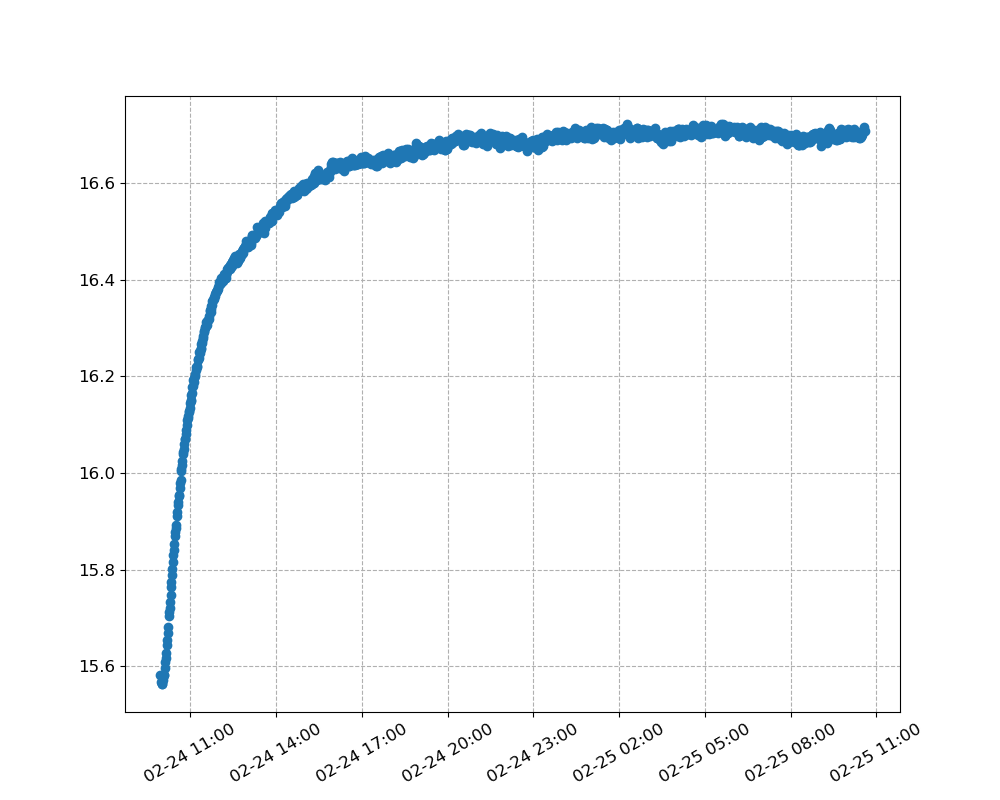

2021-02-25 10:36:15


<IPython.core.display.Javascript object>


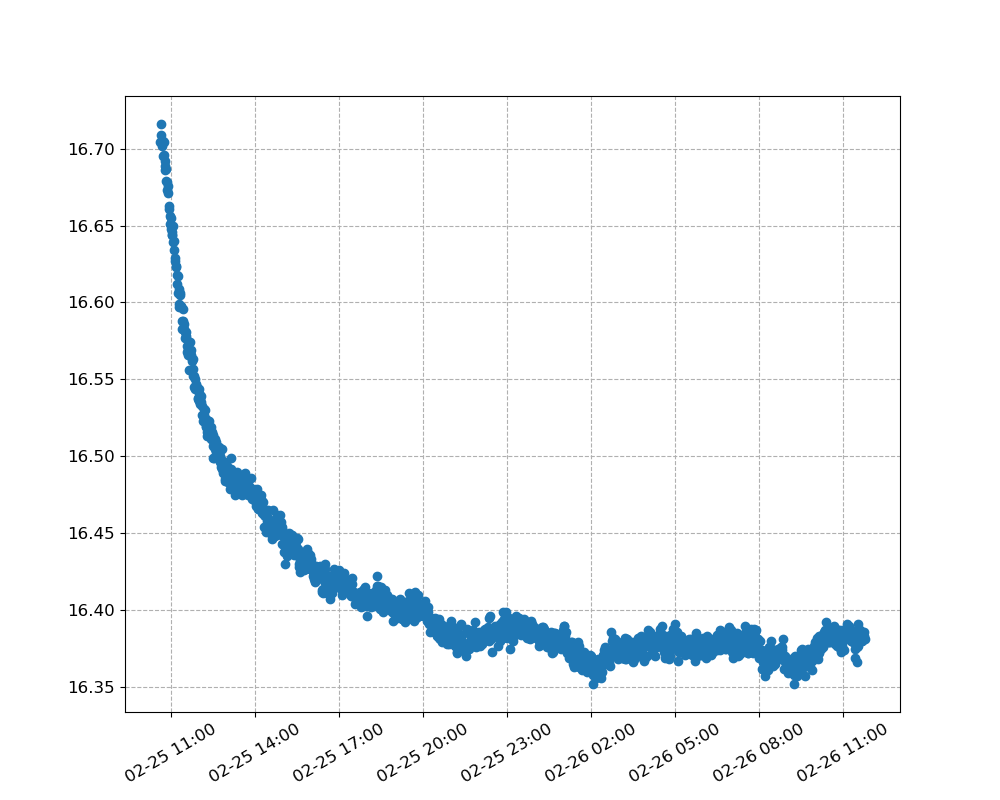

2021-02-26 11:53:00


<IPython.core.display.Javascript object>


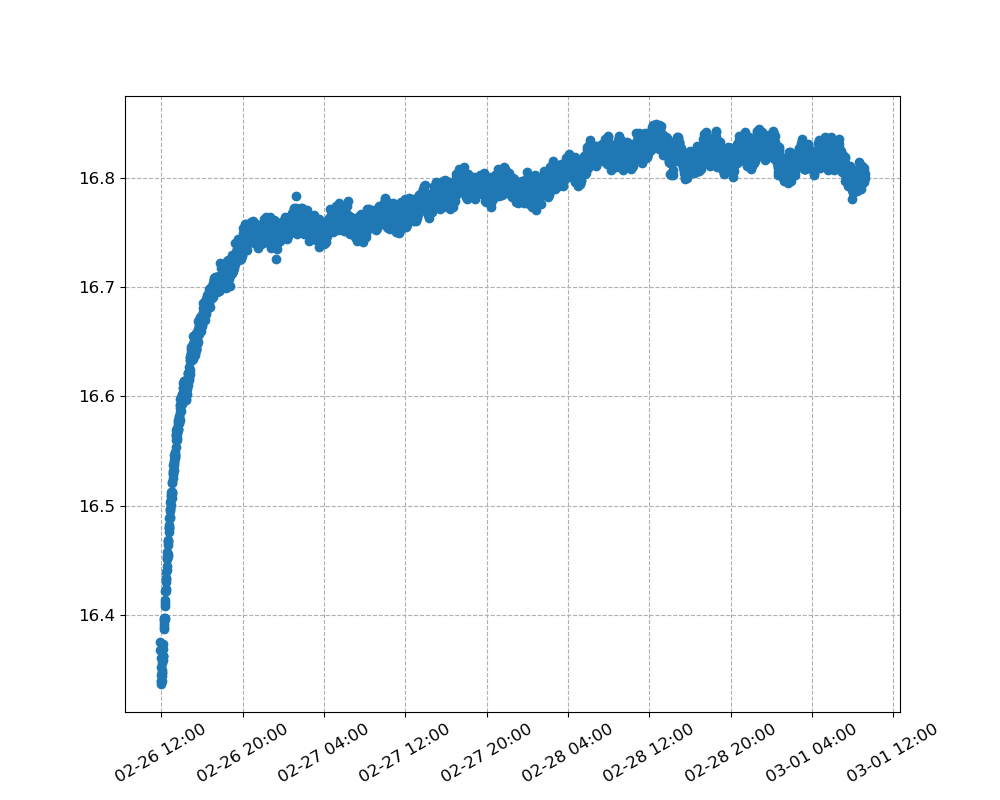

2021-03-01 09:18:30


<IPython.core.display.Javascript object>


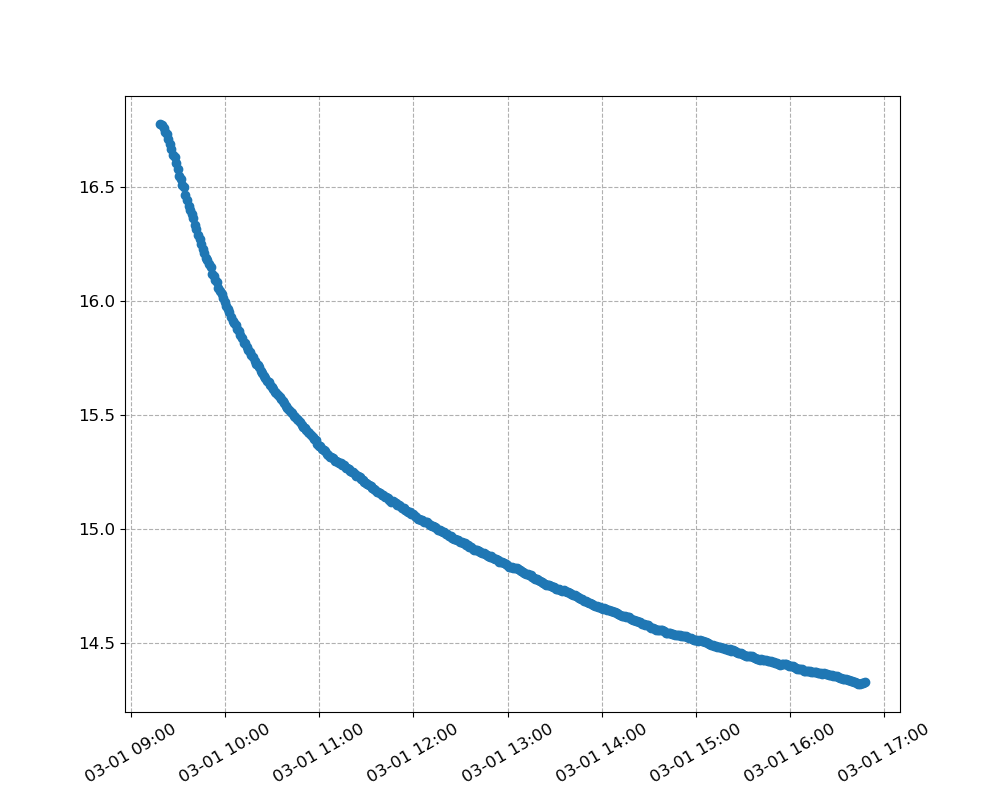

2021-03-01 16:51:30


<IPython.core.display.Javascript object>


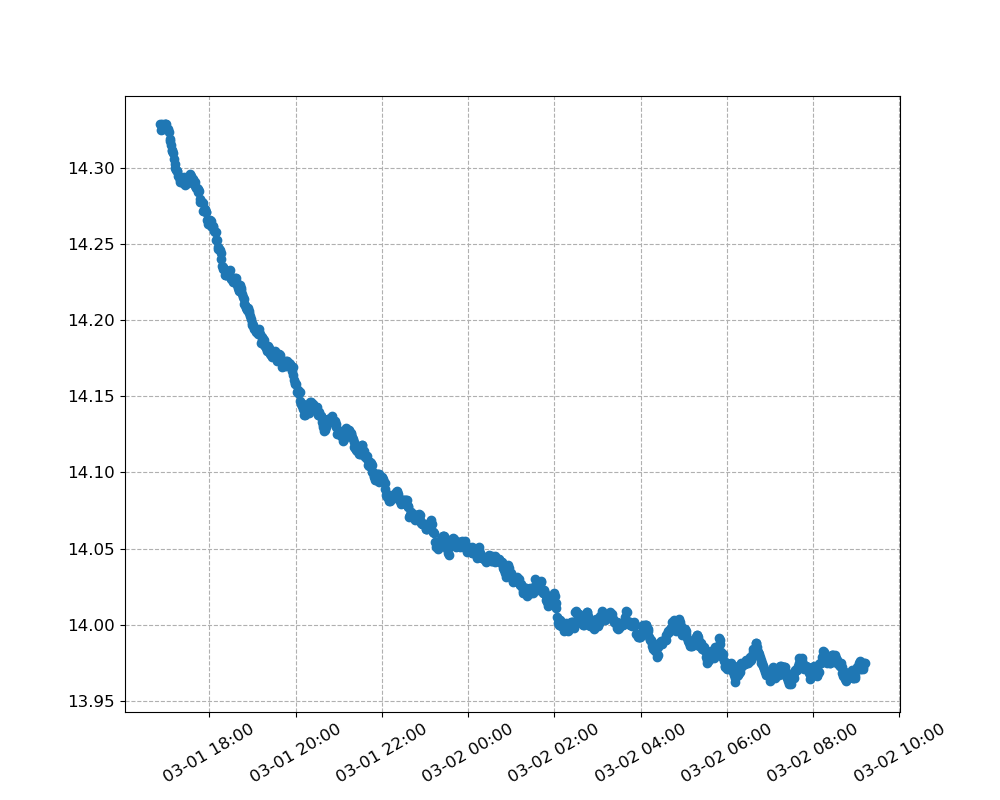

In [166]:
# check change in temperature
for row in df_time[:5].itertuples():
# for row in df_time.itertuples():
    print(row.t0)
    fig, ax = plt.subplots()
    df_ = df_raw.query(f'"{row.t0}" < index < "{row.tf}"')
    #I = df_['Magnet Current [A]']
    #print(row.Index)
    #print(I.describe())
    #print(I.max()-I.min())
    
    
    dates = date2num(df_.index)
    ax.plot_date(dates, df_[f'{probe}_Cal_T'])
    
    N_maj = 8
    run_hours = (datetime.strptime(row.tf, '%Y-%m-%d %H:%M:%S')\
                 -datetime.strptime(row.t0, '%Y-%m-%d %H:%M:%S')).total_seconds() / 60 / 60
    interv = int(run_hours // N_maj)
    if interv == 0:
        interv = 1
    hours = HourLocator(interval=interv)
#     if  run_hours <= 10:
#         hours = HourLocator(interval=1)
#     elif run_hours <= 24:
#         hours = HourLocator(interval=4)
#     else:
#         hours = HourLocator(interval=12)
    ax.xaxis.set_major_locator(hours)
    formatter = DateFormatter('%m-%d %H:%M')
    ax.xaxis.set_major_formatter(formatter)
    ax.xaxis.set_tick_params(rotation=30,) #labelsize=10)

2021-02-24 09:57:00


<IPython.core.display.Javascript object>


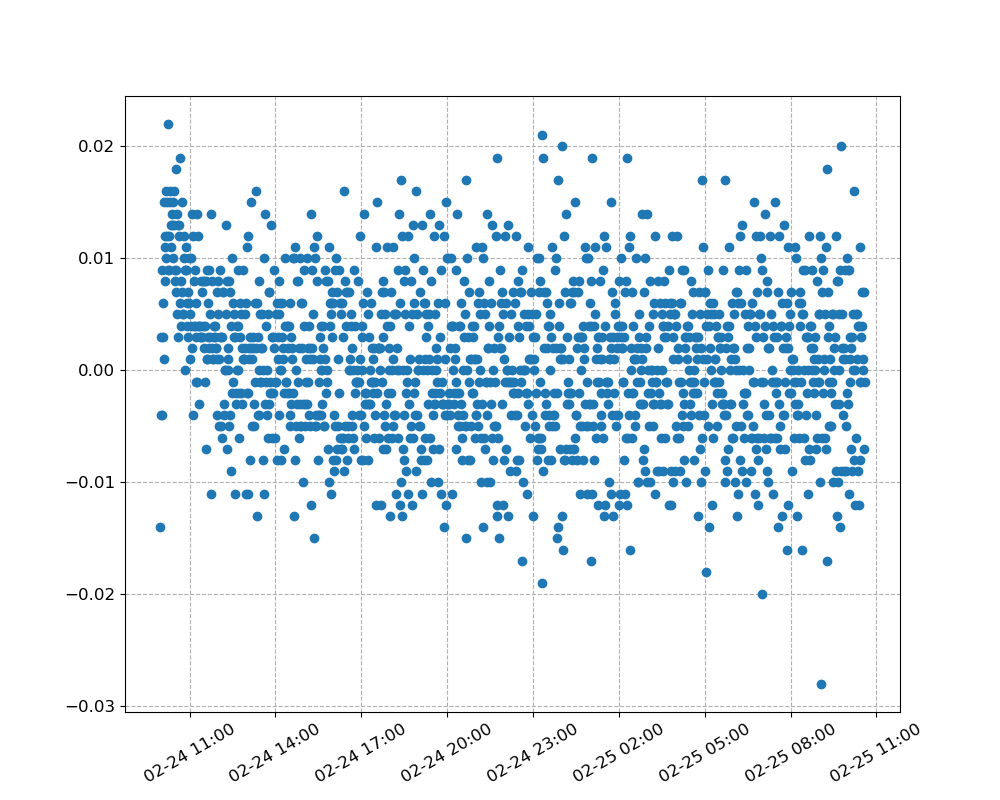

2021-02-25 10:36:15


<IPython.core.display.Javascript object>


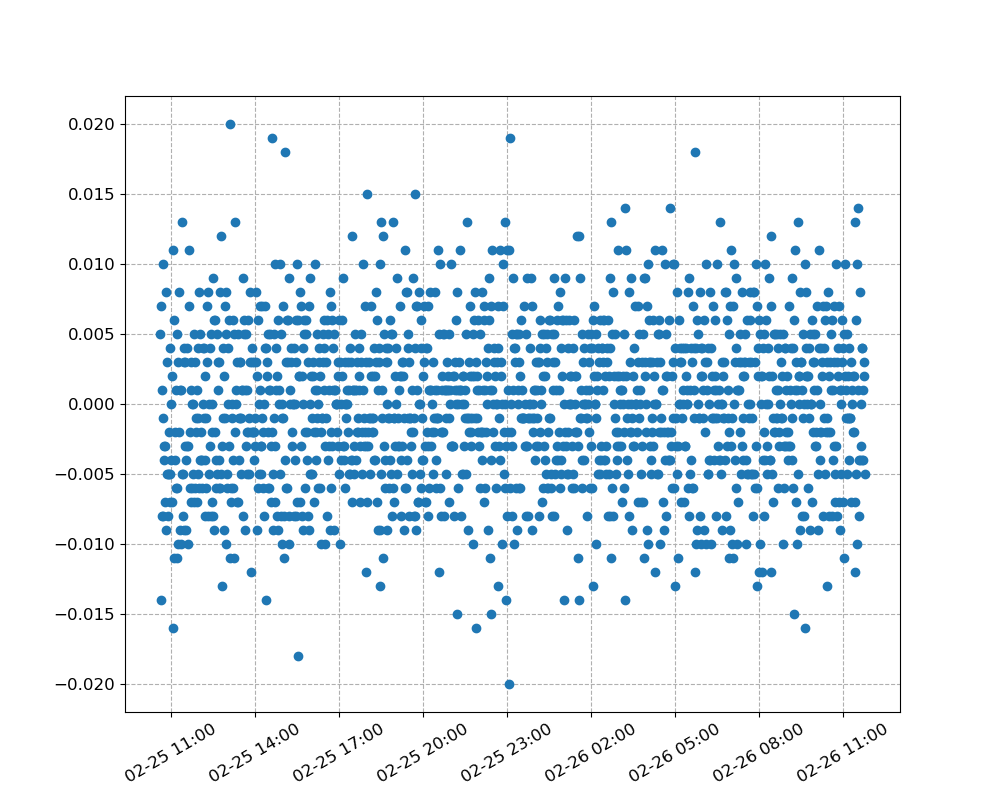

2021-02-26 11:53:00


<IPython.core.display.Javascript object>


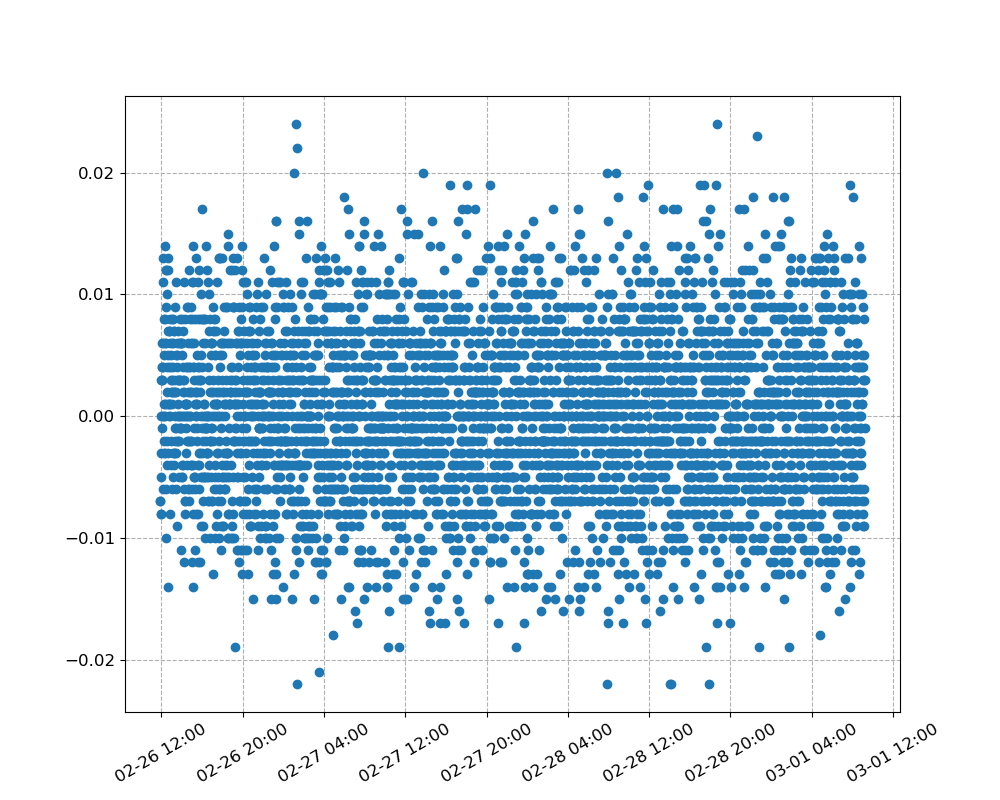

2021-03-01 09:18:30


<IPython.core.display.Javascript object>


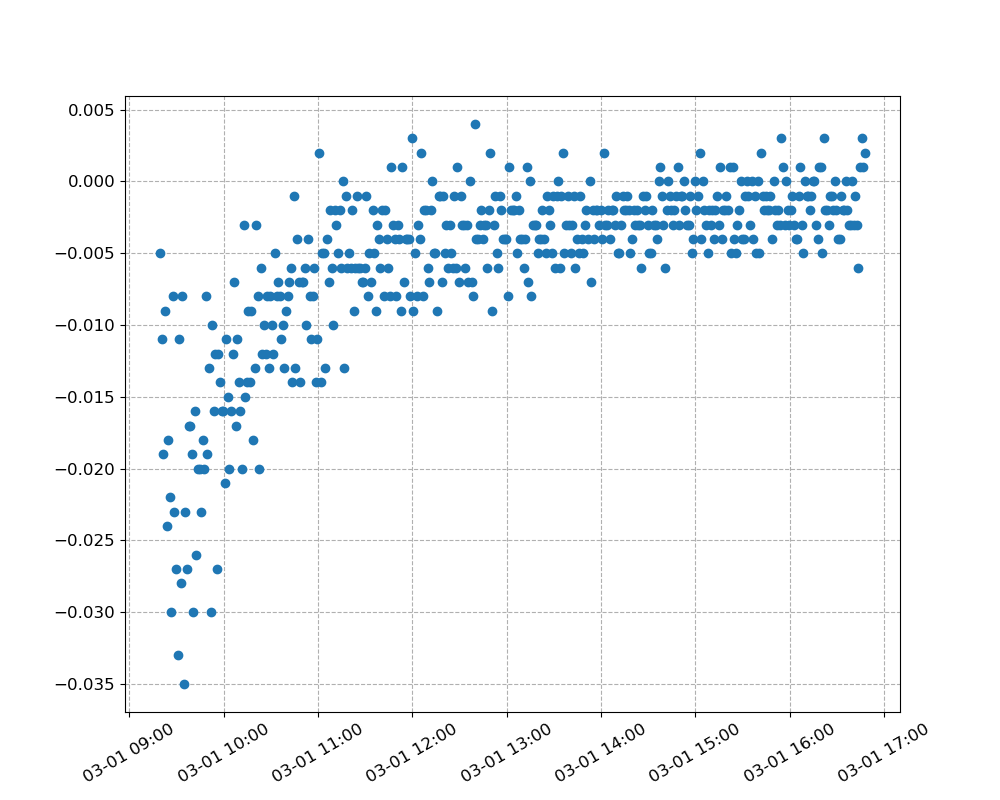

2021-03-01 16:51:30


<IPython.core.display.Javascript object>


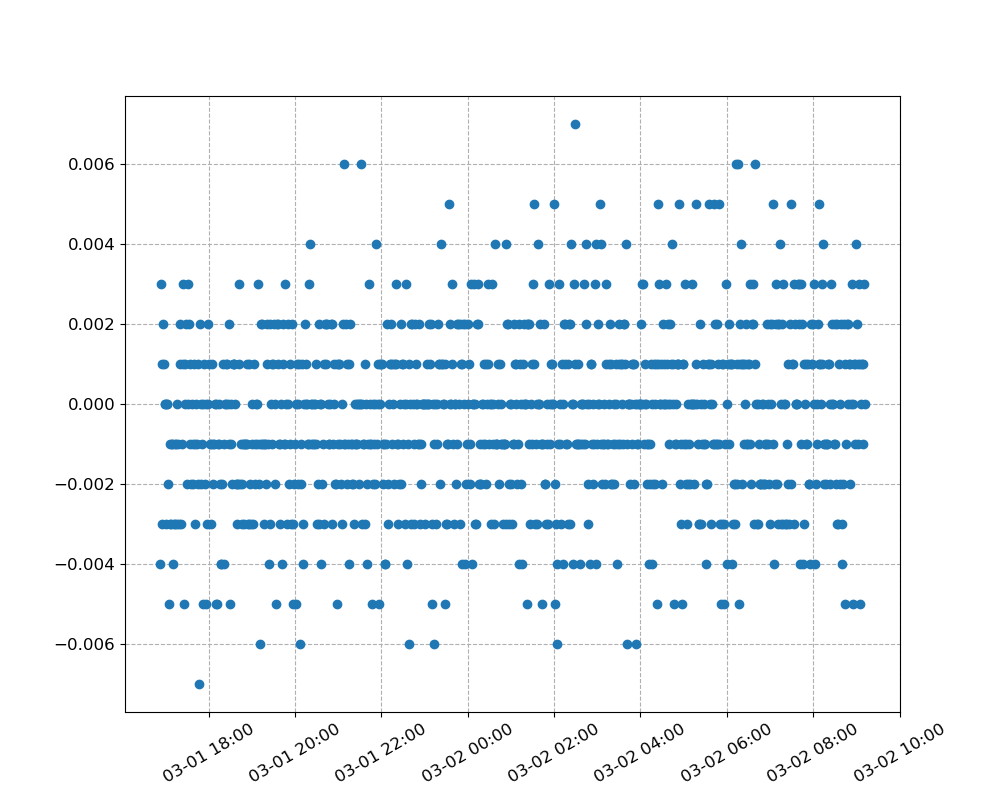

In [167]:
# check change in temperature
for row in df_time[:5].itertuples():
# for row in df_time.itertuples():
    print(row.t0)
    fig, ax = plt.subplots()
    df_ = df_raw.query(f'"{row.t0}" < index < "{row.tf}"')
    #I = df_['Magnet Current [A]']
    #print(row.Index)
    #print(I.describe())
    #print(I.max()-I.min())
#     T = np.diff(df_[f'{probe}_Cal_T']) / np.diff(df_.index.total_seconds()) * 60 * 10 # change per 10 min.
    n = 1# 5
    #T = np.diff(df_[f'{probe}_Cal_T'], n=n) / np.array(1e-9*np.diff(df_.index, n=n), dtype=np.float64) * 60 # change per 10 min.
    T = np.diff(df_[f'{probe}_Cal_T'], n=n)
    #     (df_.index[1]-df_.index[0]).total_seconds()
    dates = date2num(df_.index[n:])
    ax.plot_date(dates, T) #df_[f'{probe}_Cal_T'])
    
    N_maj = 8
    run_hours = (datetime.strptime(row.tf, '%Y-%m-%d %H:%M:%S')\
                 -datetime.strptime(row.t0, '%Y-%m-%d %H:%M:%S')).total_seconds() / 60 / 60
    interv = int(run_hours // N_maj)
    if interv == 0:
        interv = 1
    hours = HourLocator(interval=interv)
#     if  run_hours <= 10:
#         hours = HourLocator(interval=1)
#     elif run_hours <= 24:
#         hours = HourLocator(interval=4)
#     else:
#         hours = HourLocator(interval=12)
    ax.xaxis.set_major_locator(hours)
    formatter = DateFormatter('%m-%d %H:%M')
    ax.xaxis.set_major_formatter(formatter)
    ax.xaxis.set_tick_params(rotation=30,) #labelsize=10)

## Temperature Stability
**DONE 2021-04-22 21:44**
- Fit an exponential decay to Yoke temperature change. Remove one time constant from beginning of each run.
- Save relevant fit information (pickled DataFrame? **dict with fit results?**)
- Should have a function to do the fitting for one run
- Second function to run fit for all runs and combine into "cleaned" dataframe

In [59]:
# DONE
def mod_exp(t, **params):
    return params['A'] * np.exp(-t / params['B']) + params['C']

# def mod_ln(t, **params):
#     return params['A'] * np.log(params['B'] * t) + params['C']

# def mod_pow(t, **params):
#     return params['A'] * t**params['B'] + params['C']

# DONE WITH PLOTS
def fit_t_exp(run_num, df_time, df_raw, ycol=f'{probe}_Cal_T'):
    df_t = df_time.iloc[run_num]
    df_ = df_raw.query(f'"{df_t.t0}" < index < "{df_t.tf}"').copy()
    df_['hours_delta'] = (df_.index - df_.index[0]).total_seconds()/60**2
    if df_['hours_delta'].max() > 100.:
        df_2 = df_.query('hours_delta < 100')
    else:
        df_2 = df_
    model = lm.Model(mod_exp, independent_vars=['t'])
#     model = lm.Model(mod_ln, independent_vars=['t'])
#     model = lm.Model(mod_pow, independent_vars=['t'])
    params = lm.Parameters()
#     params.add('A', value=-1, max=0, vary=True)
    params.add('A', value=1, vary=True)
    #params.add('B', value=-1, max=0, vary=True)
    params.add('B', value=1, min=0, vary=True)
    params.add('C', value=0, vary=True)
    result = model.fit(df_2[ycol].values, t=df_2.hours_delta.values,
                       params=params, weights=1/(5e-2)*np.ones_like(df_2.hours_delta.values))
    return result, df_.hours_delta.max(), df_

In [60]:
i = 4 # 0
result, hmax, df_ = fit_t_exp(i, df_time, df_raw)

In [29]:
hmax

16.333333333333336

In [30]:
result.params['B'].value

5.196849620330102

In [31]:
result

<IPython.core.display.Javascript object>


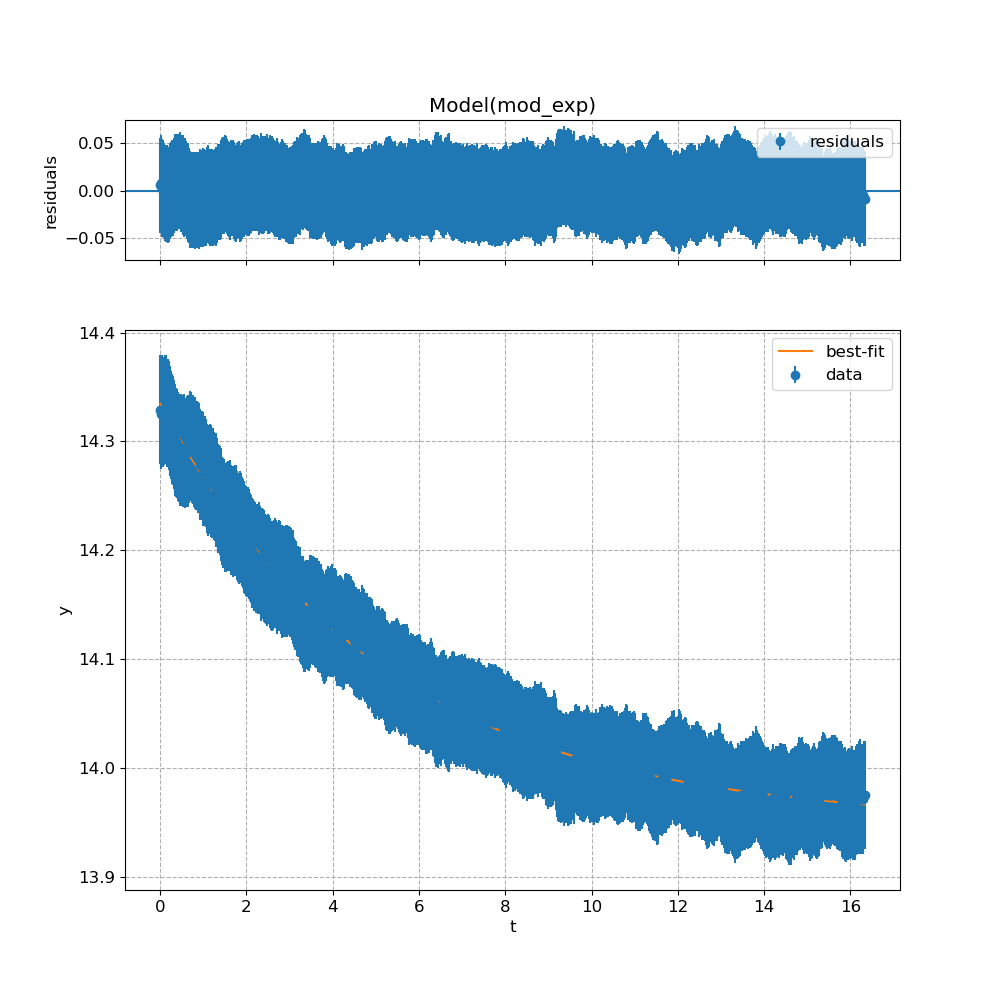

(<Figure size 1000x1000 with 2 Axes>, GridSpec(2, 1, height_ratios=[1, 4]))

In [32]:
result.plot()

In [33]:
# pick out the bad piece where the water chiller failed
run_num = 11
df_t = df_time.iloc[run_num]
df_ = df_raw.query(f'"{df_t.t0}" < index < "{df_t.tf}"').copy()
fig = scatter2d(df_.index, df_[f"Yoke (center magnet)"], markers=False, lines=True, inline=False)

Set Point 0:
$\chi^2_{\mathrm{red.}} =$0.2029497421892836
Decay constant: $\Tau=$3.5105072271715283 hours
Total Time: 24.643333333333334 hours
Total Time / Decay Time: 7.019878250810172

dT/dtime (deg C / hour) @ t = 0: 0.6094286779200246
dT/dtime (deg C / hour) @ t = Decay constant: 0.22419628146706957


<IPython.core.display.Javascript object>


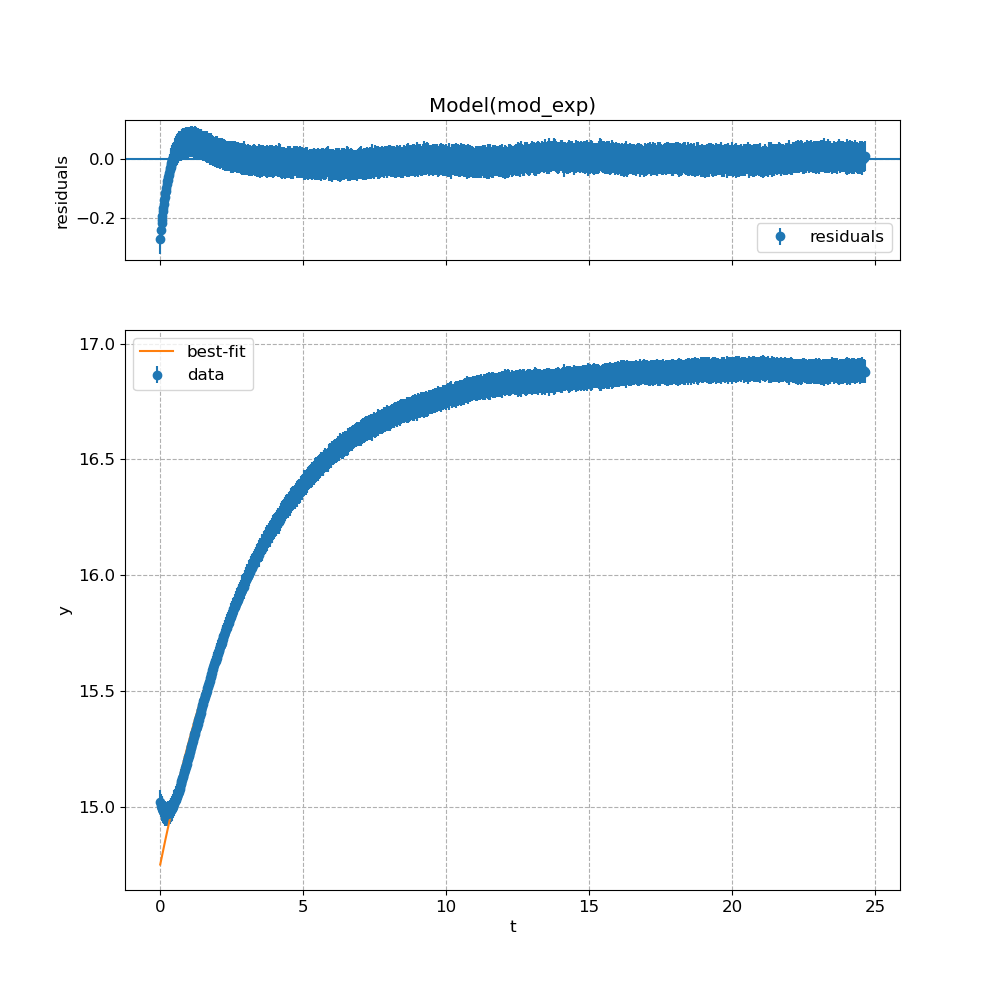

Set Point 1:
$\chi^2_{\mathrm{red.}} =$0.01396937015002141
Decay constant: $\Tau=$3.7074288868229264 hours
Total Time: 25.18722222222222 hours
Total Time / Decay Time: 6.79371688334833

dT/dtime (deg C / hour) @ t = 0: -0.2069396448424735
dT/dtime (deg C / hour) @ t = Decay constant: -0.07612884090086591


<IPython.core.display.Javascript object>


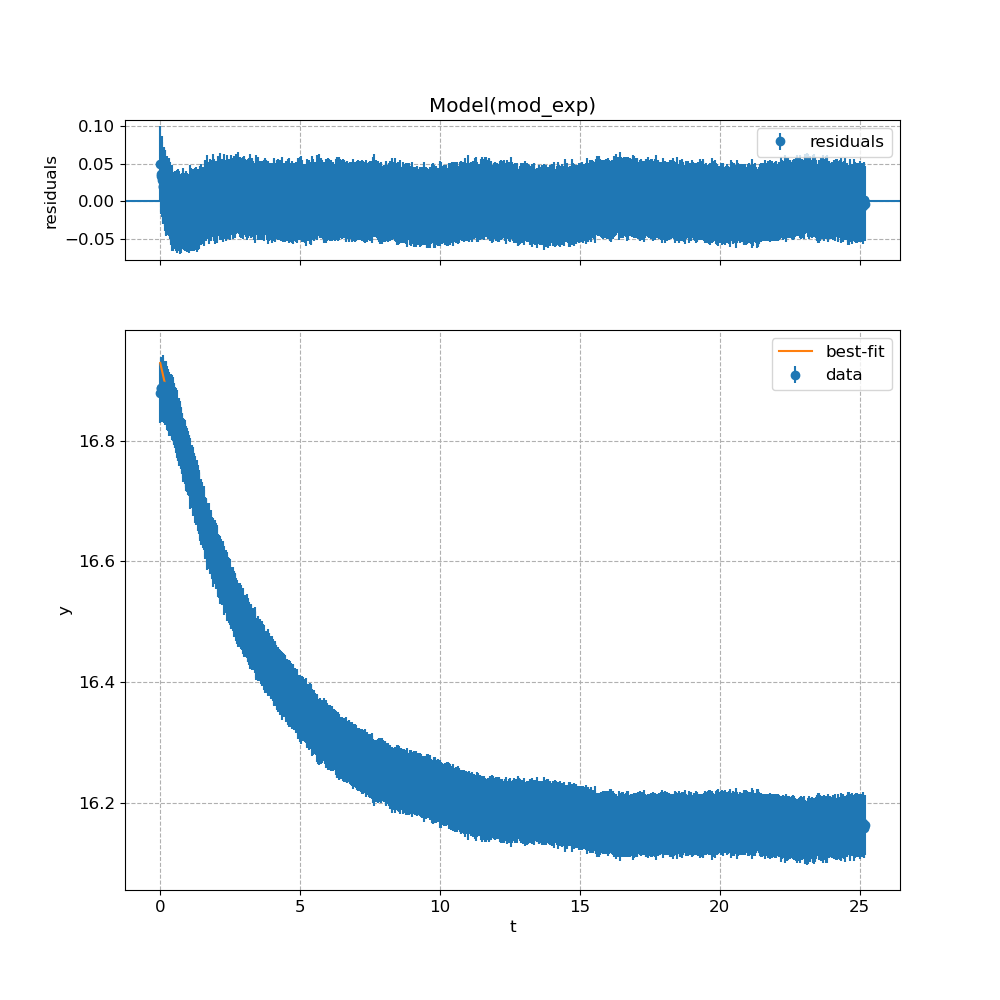

Set Point 2:
$\chi^2_{\mathrm{red.}} =$0.4395845031789799
Decay constant: $\Tau=$5.59323293344379 hours
Total Time: 69.32750000000001 hours
Total Time / Decay Time: 12.394888756638036

dT/dtime (deg C / hour) @ t = 0: 0.16244270429445667
dT/dtime (deg C / hour) @ t = Decay constant: 0.059759331278222576


<IPython.core.display.Javascript object>


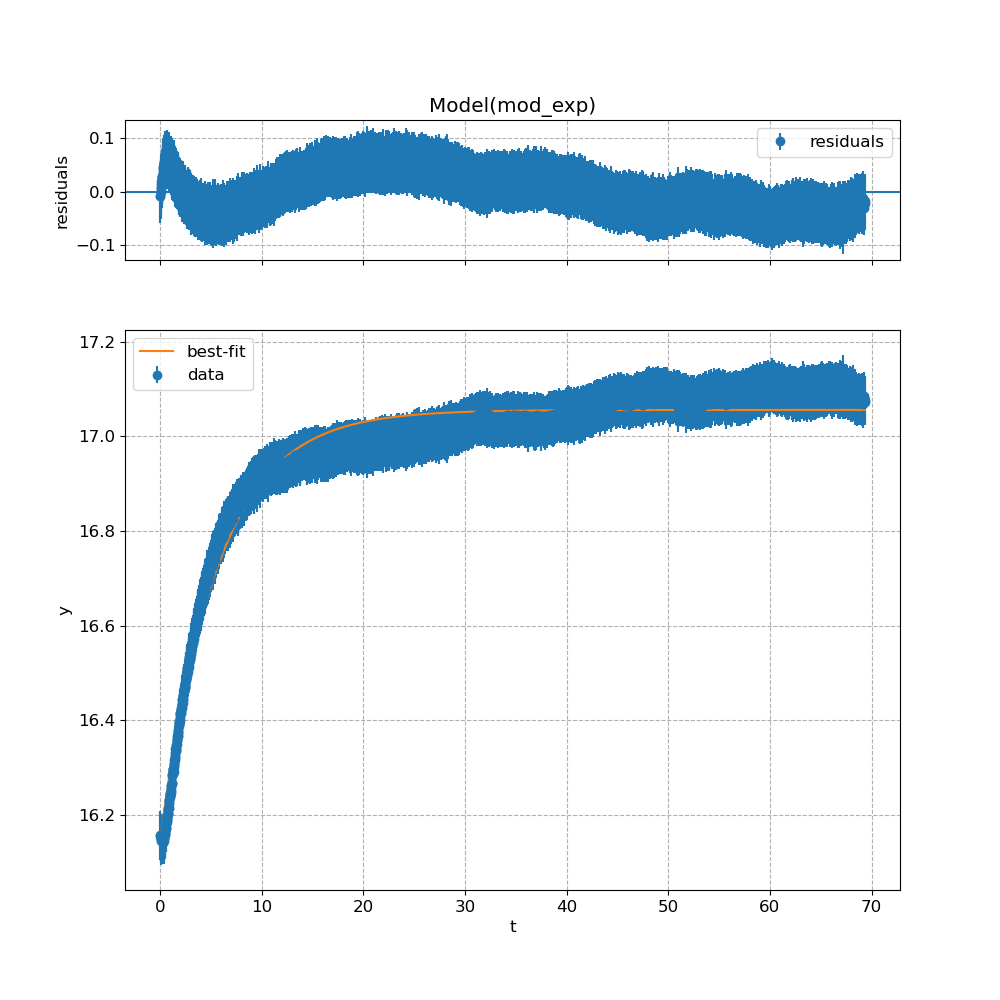

Set Point 3:
$\chi^2_{\mathrm{red.}} =$0.47362054347002036
Decay constant: $\Tau=$4.036181600139565 hours
Total Time: 7.485 hours
Total Time / Decay Time: 1.8544755270033393

dT/dtime (deg C / hour) @ t = 0: -1.3482946719614832
dT/dtime (deg C / hour) @ t = Decay constant: -0.4960098904556236


<IPython.core.display.Javascript object>


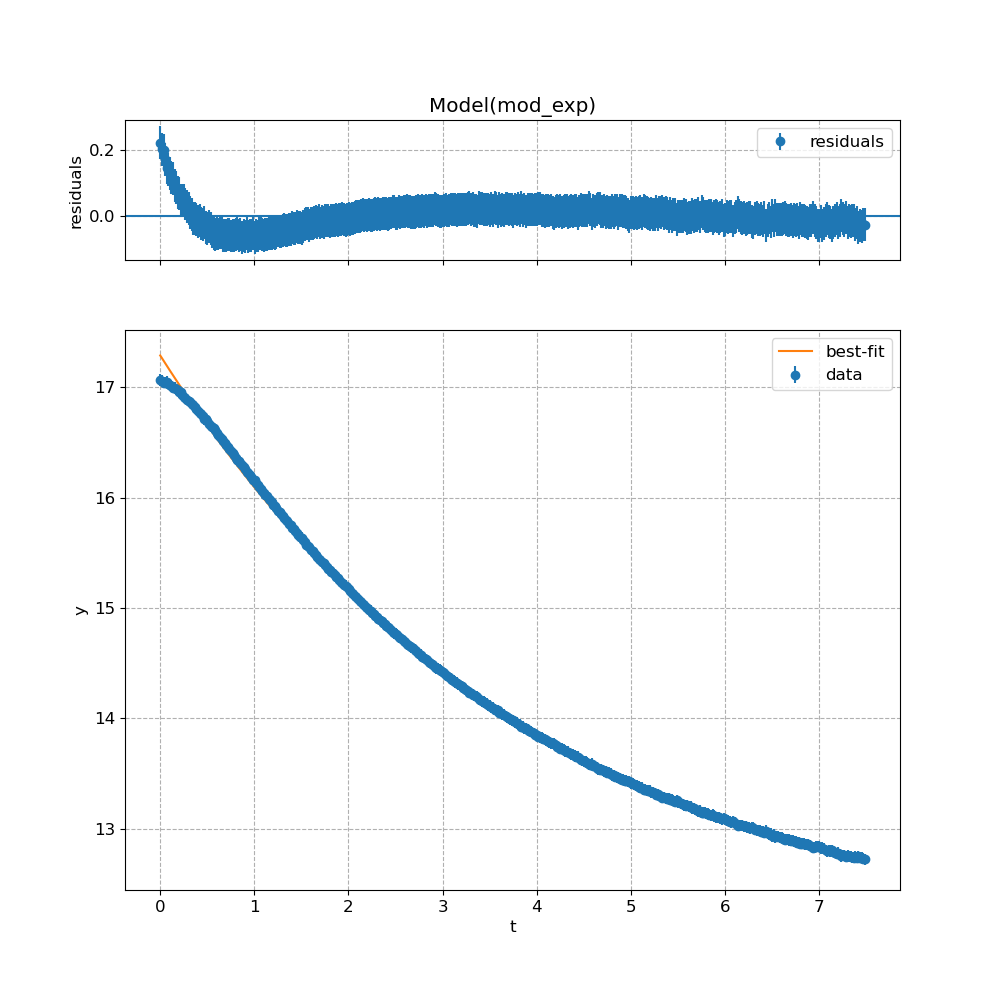

Set Point 4:
$\chi^2_{\mathrm{red.}} =$0.03825886180668111
Decay constant: $\Tau=$4.395685241233774 hours
Total Time: 16.333333333333336 hours
Total Time / Decay Time: 3.7157649915690785

dT/dtime (deg C / hour) @ t = 0: -0.17334818408629882
dT/dtime (deg C / hour) @ t = Decay constant: -0.06377123308975192


<IPython.core.display.Javascript object>


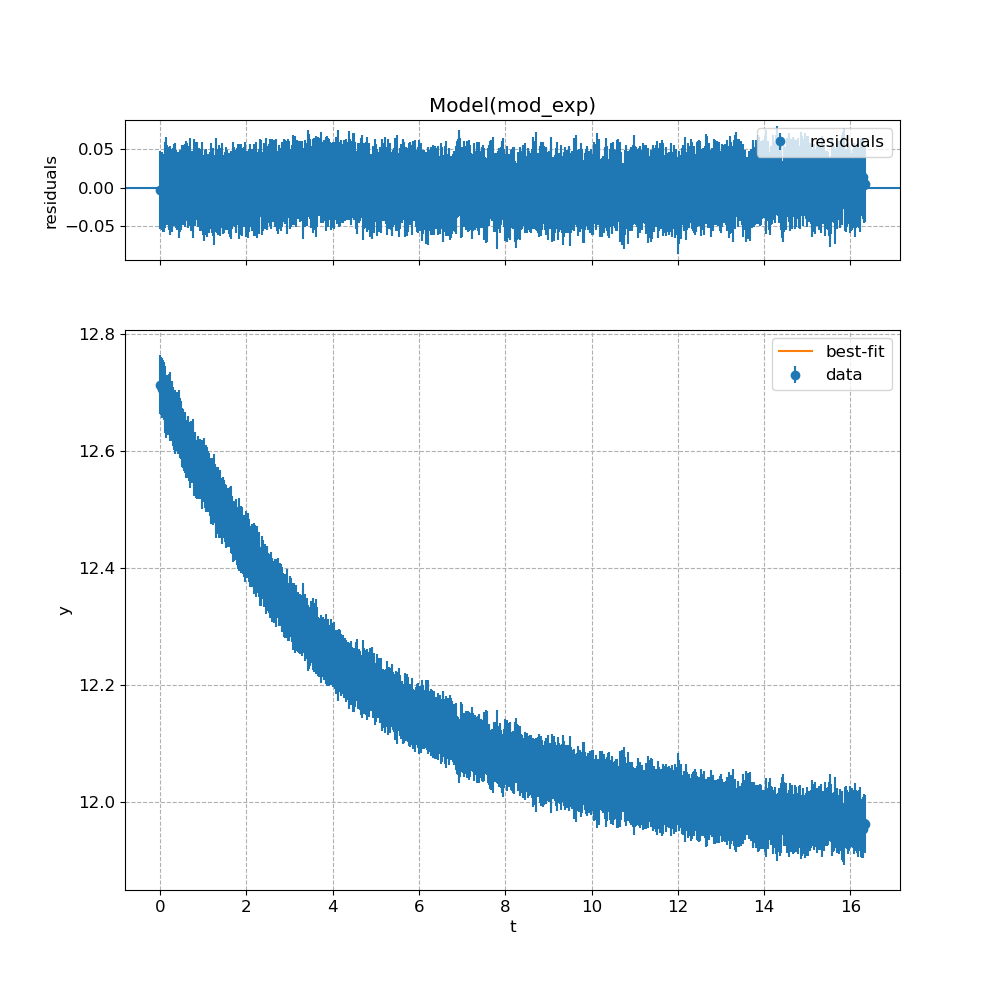

Set Point 5:
$\chi^2_{\mathrm{red.}} =$0.0412998055443026
Decay constant: $\Tau=$3.69797675637773 hours
Total Time: 7.616666666666666 hours
Total Time / Decay Time: 2.0596848407796378

dT/dtime (deg C / hour) @ t = 0: 0.06271291317417559
dT/dtime (deg C / hour) @ t = Decay constant: 0.023070791452748898


<IPython.core.display.Javascript object>


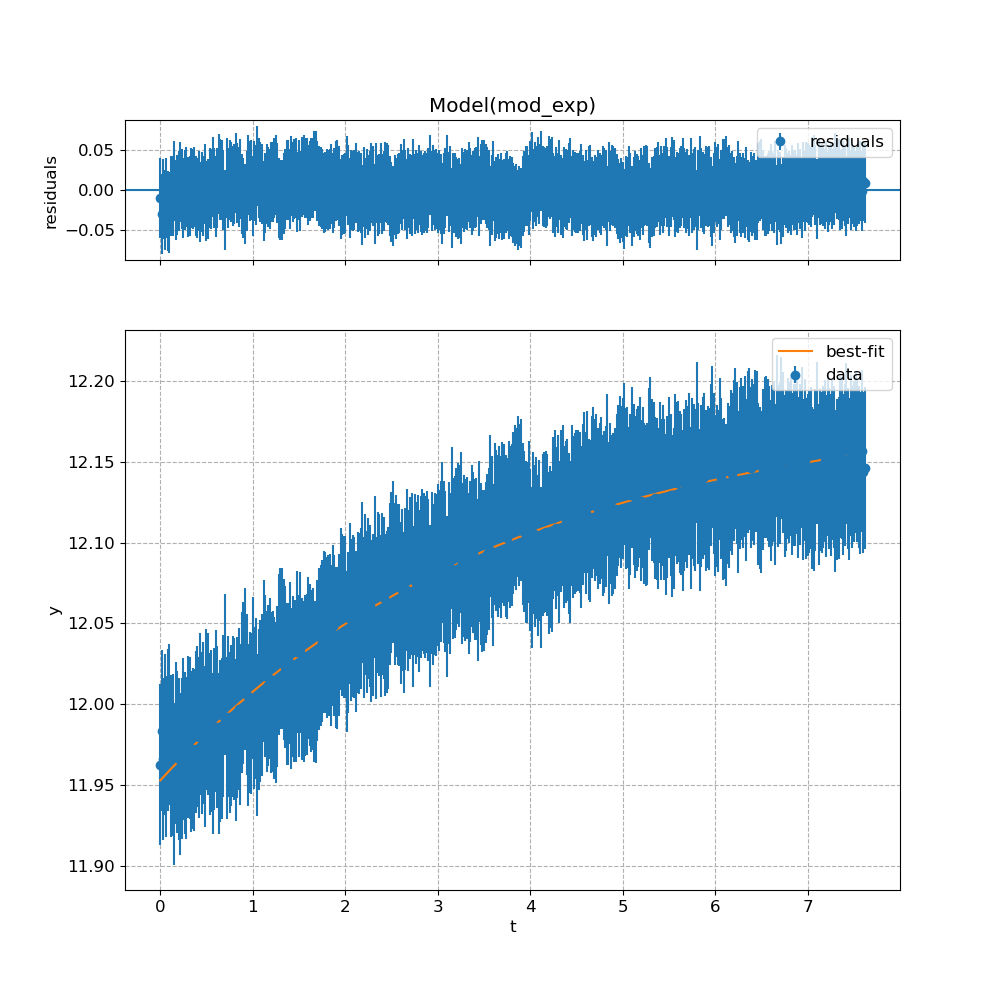

Set Point 6:
$\chi^2_{\mathrm{red.}} =$0.02892447277673406
Decay constant: $\Tau=$3.9817650071345305 hours
Total Time: 16.250000000000004 hours
Total Time / Decay Time: 4.081104728903699

dT/dtime (deg C / hour) @ t = 0: 0.11175475271544195
dT/dtime (deg C / hour) @ t = Decay constant: 0.04111227597720951


<IPython.core.display.Javascript object>


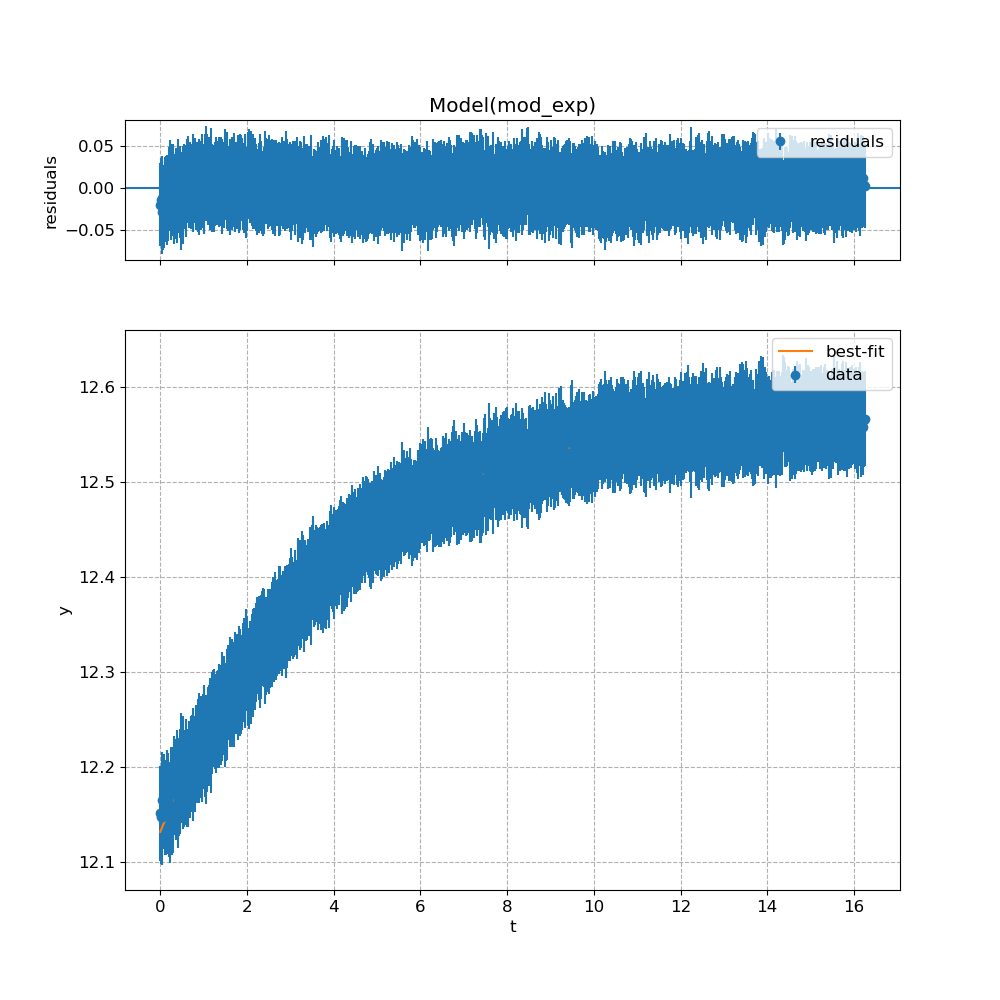

Set Point 7:
$\chi^2_{\mathrm{red.}} =$0.02652508216756346
Decay constant: $\Tau=$4.319510978665866 hours
Total Time: 7.916111111111111 hours
Total Time / Decay Time: 1.832640581354906

dT/dtime (deg C / hour) @ t = 0: 0.146447970560702
dT/dtime (deg C / hour) @ t = Decay constant: 0.05387519757056289


<IPython.core.display.Javascript object>


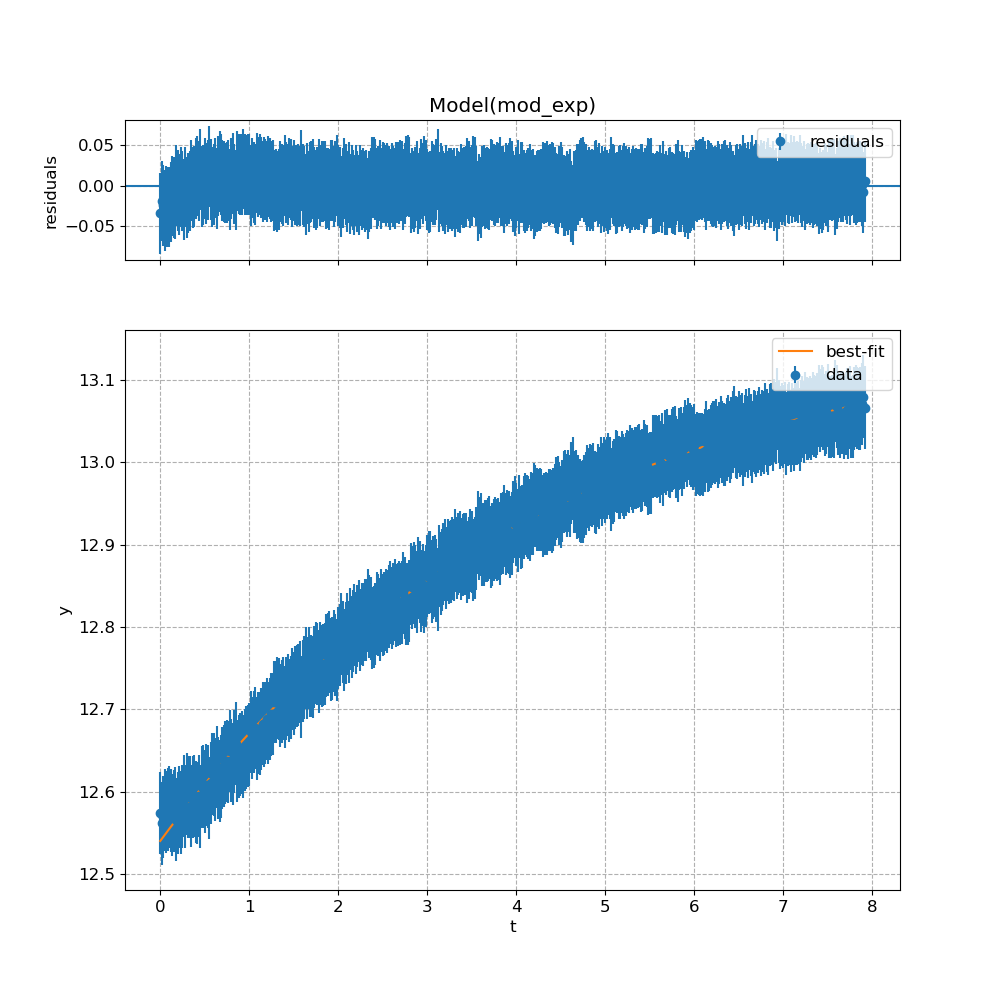

Set Point 8:
$\chi^2_{\mathrm{red.}} =$0.01291184542607567
Decay constant: $\Tau=$3.940381904995559 hours
Total Time: 15.91611111111111 hours
Total Time / Decay Time: 4.039230585982769

dT/dtime (deg C / hour) @ t = 0: 0.11823720078019093
dT/dtime (deg C / hour) @ t = Decay constant: 0.043497035348692266


<IPython.core.display.Javascript object>


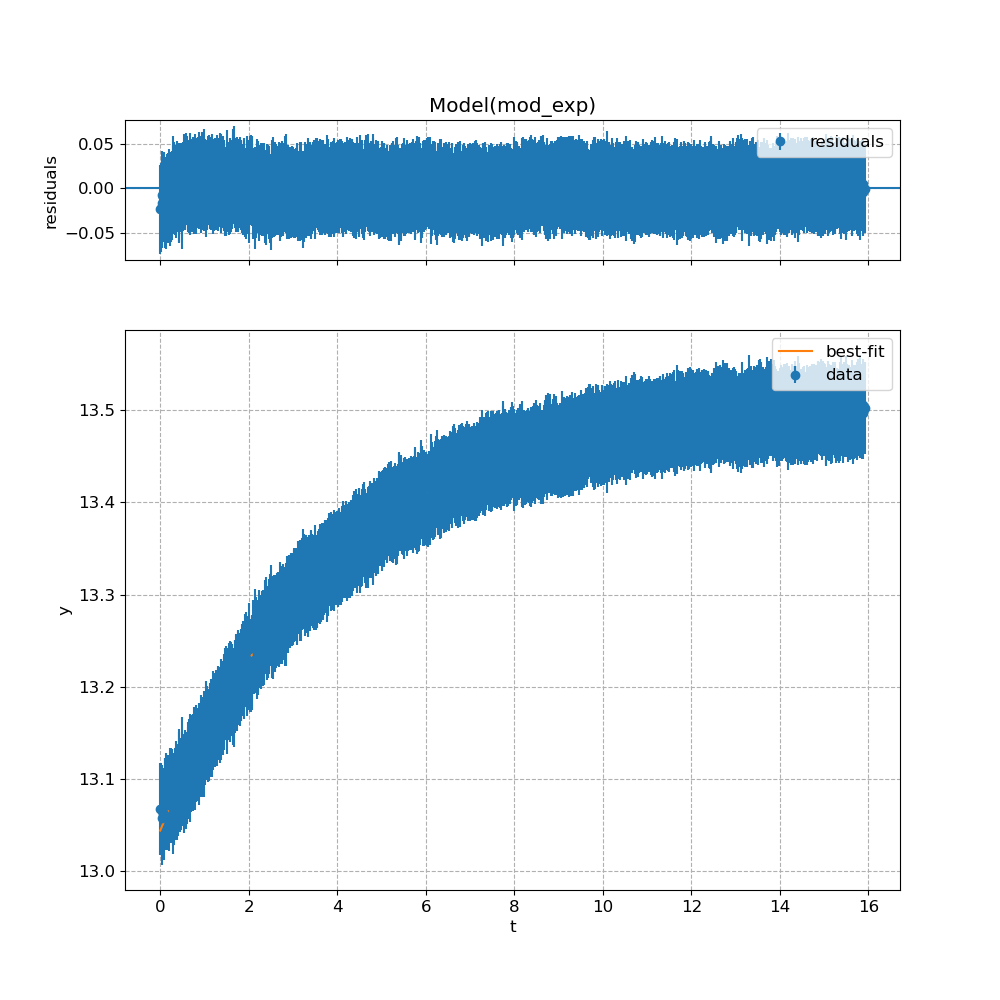

Set Point 9:
$\chi^2_{\mathrm{red.}} =$0.01535615339977329
Decay constant: $\Tau=$4.125696733801385 hours
Total Time: 7.579444444444444 hours
Total Time / Decay Time: 1.8371307765660234

dT/dtime (deg C / hour) @ t = 0: 0.11233710877996618
dT/dtime (deg C / hour) @ t = Decay constant: 0.041326512800789486


<IPython.core.display.Javascript object>


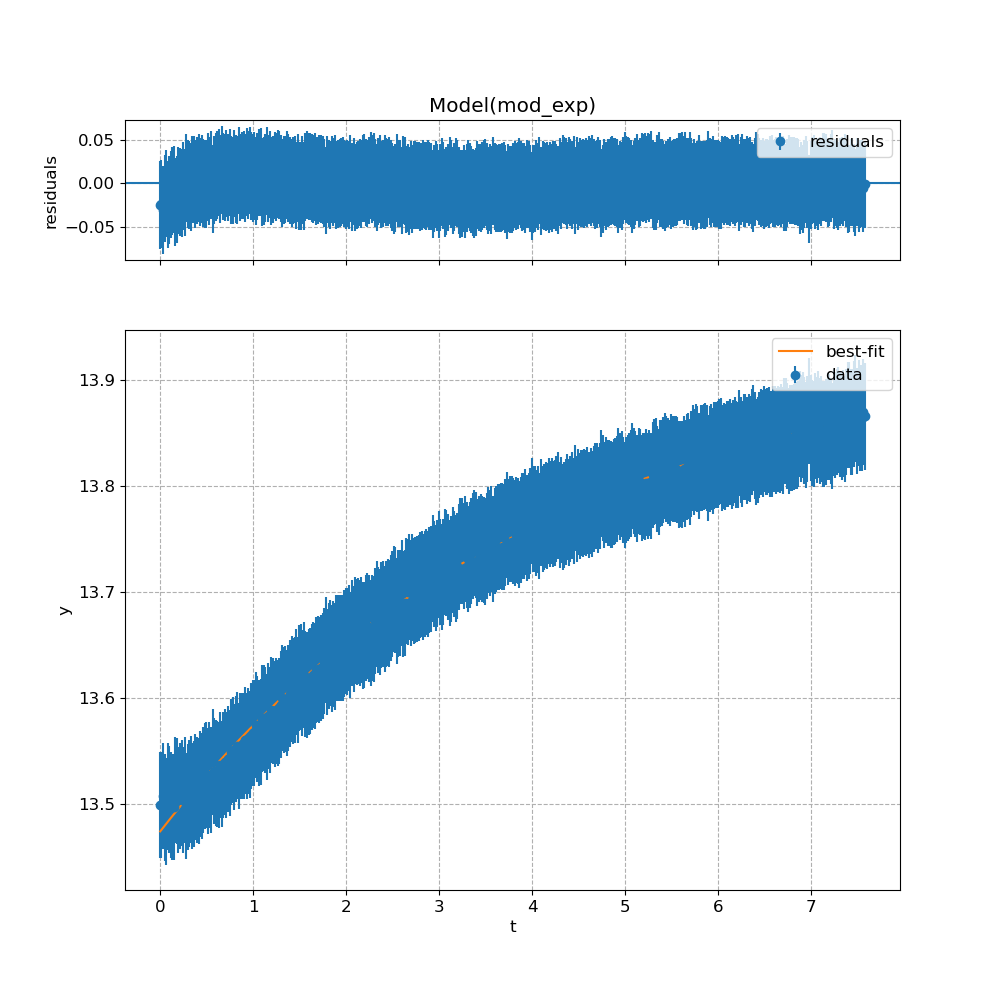

Set Point 10:
$\chi^2_{\mathrm{red.}} =$0.007989626404184711
Decay constant: $\Tau=$4.008752819770599 hours
Total Time: 16.533055555555556 hours
Total Time / Decay Time: 4.124239208268685

dT/dtime (deg C / hour) @ t = 0: 0.13939599666709915
dT/dtime (deg C / hour) @ t = Decay constant: 0.05128092135542867


<IPython.core.display.Javascript object>


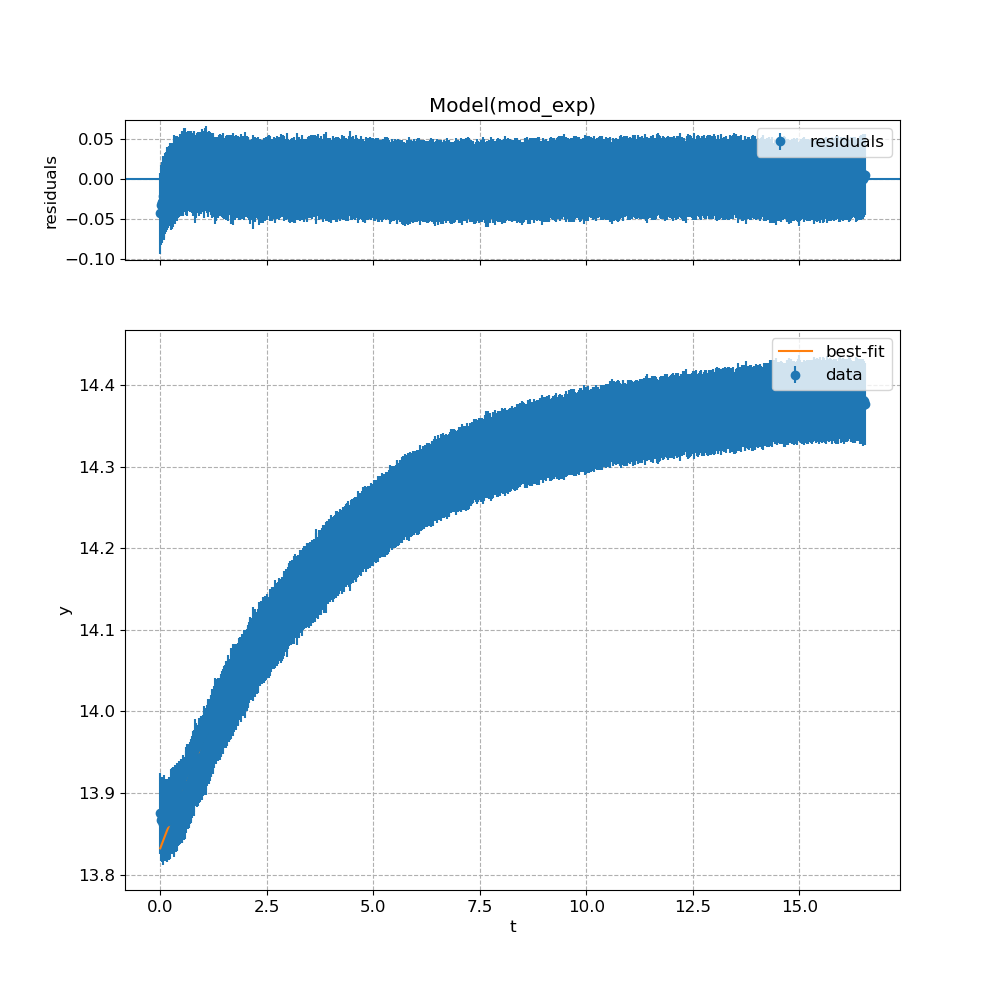

Set Point 11:
$\chi^2_{\mathrm{red.}} =$0.0266319829719998
Decay constant: $\Tau=$5.502666083980974 hours
Total Time: 4.499444444444445 hours
Total Time / Decay Time: 0.8176844416460148

dT/dtime (deg C / hour) @ t = 0: 0.13240553906040875
dT/dtime (deg C / hour) @ t = Decay constant: 0.048709275717546754


<IPython.core.display.Javascript object>


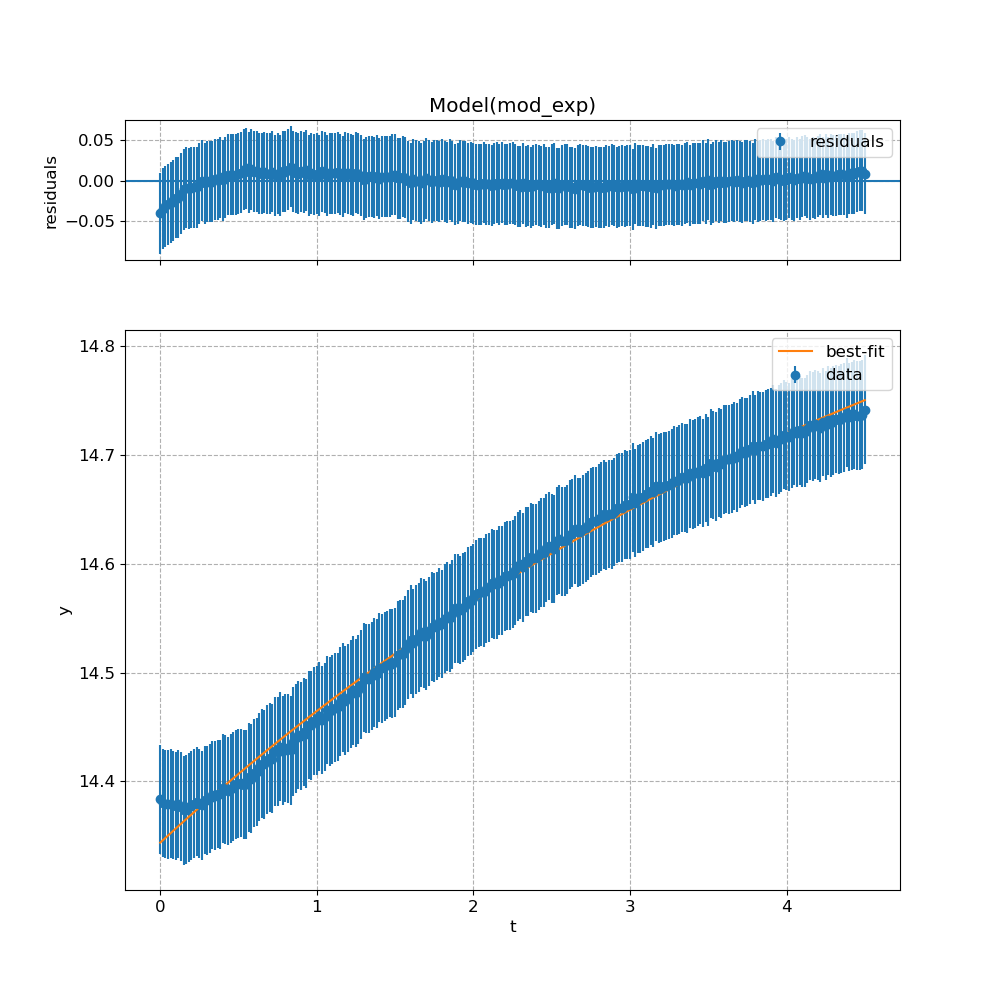

Set Point 12:
$\chi^2_{\mathrm{red.}} =$0.6059706433028973
Decay constant: $\Tau=$4.266090972194761 hours
Total Time: 9.749444444444444 hours
Total Time / Decay Time: 2.2853343981618566

dT/dtime (deg C / hour) @ t = 0: 0.8230663328985636
dT/dtime (deg C / hour) @ t = Decay constant: 0.30278918259375187


<IPython.core.display.Javascript object>


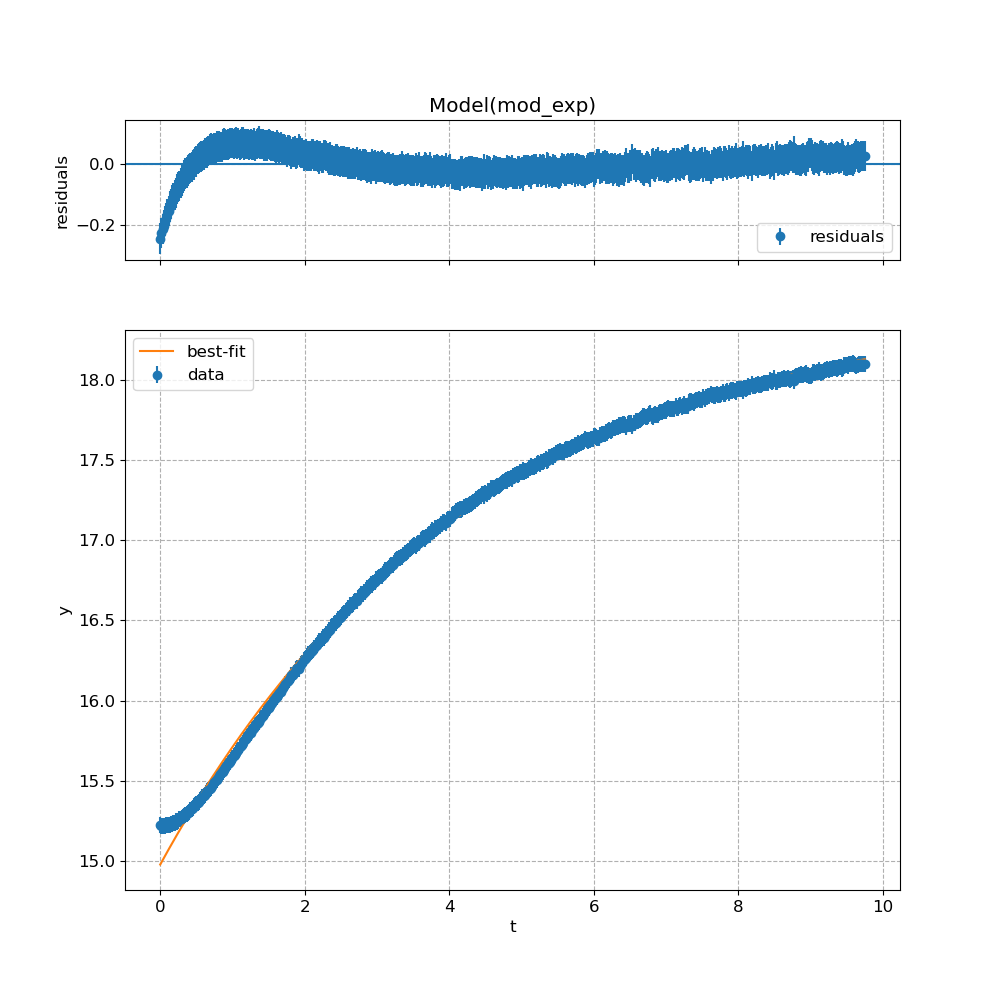

Set Point 13:
$\chi^2_{\mathrm{red.}} =$0.07412517617965599
Decay constant: $\Tau=$4.2468867890036766 hours
Total Time: 15.566666666666666 hours
Total Time / Decay Time: 3.6654300997551714

dT/dtime (deg C / hour) @ t = 0: 0.3057612980570823
dT/dtime (deg C / hour) @ t = Decay constant: 0.11248329546109426


<IPython.core.display.Javascript object>


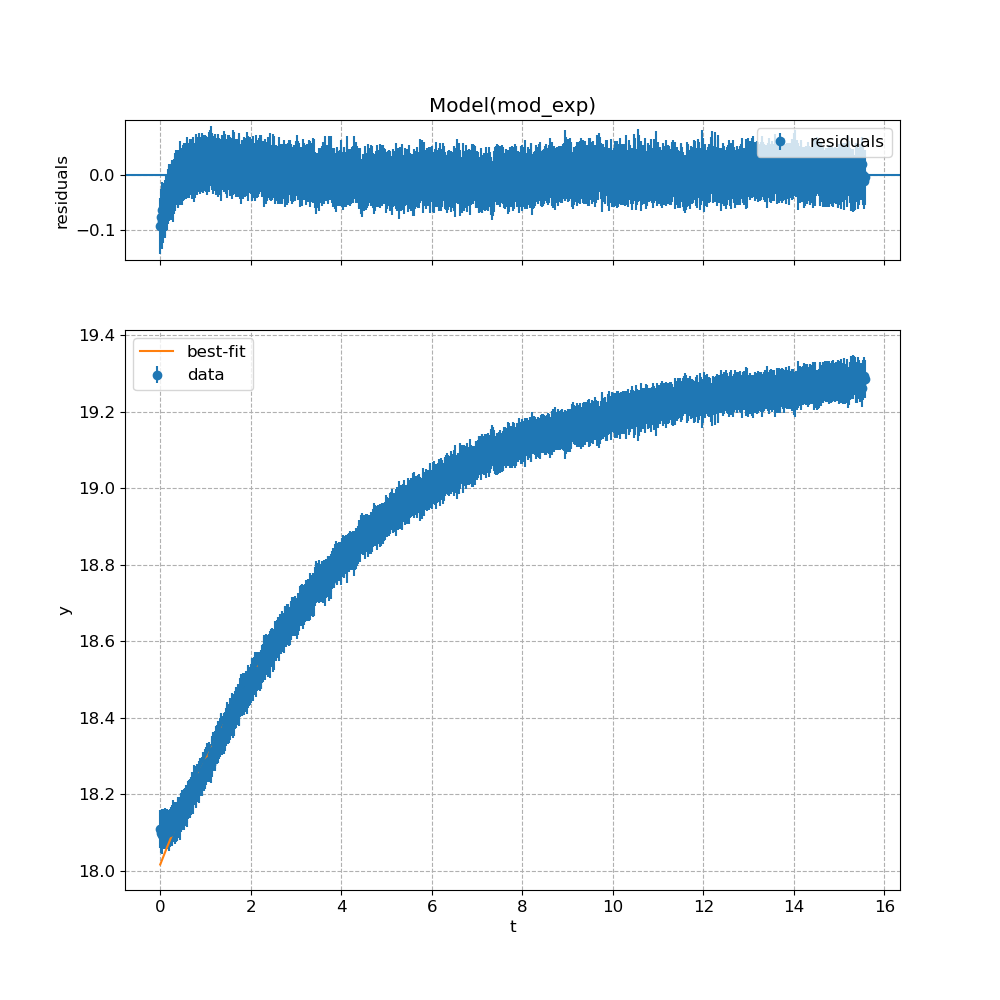

Set Point 14:
$\chi^2_{\mathrm{red.}} =$0.12556987257733399
Decay constant: $\Tau=$4.661638217941628 hours
Total Time: 8.249166666666667 hours
Total Time / Decay Time: 1.7695853433922488

dT/dtime (deg C / hour) @ t = 0: 0.2536449981670045
dT/dtime (deg C / hour) @ t = Decay constant: 0.09331078018160913


<IPython.core.display.Javascript object>


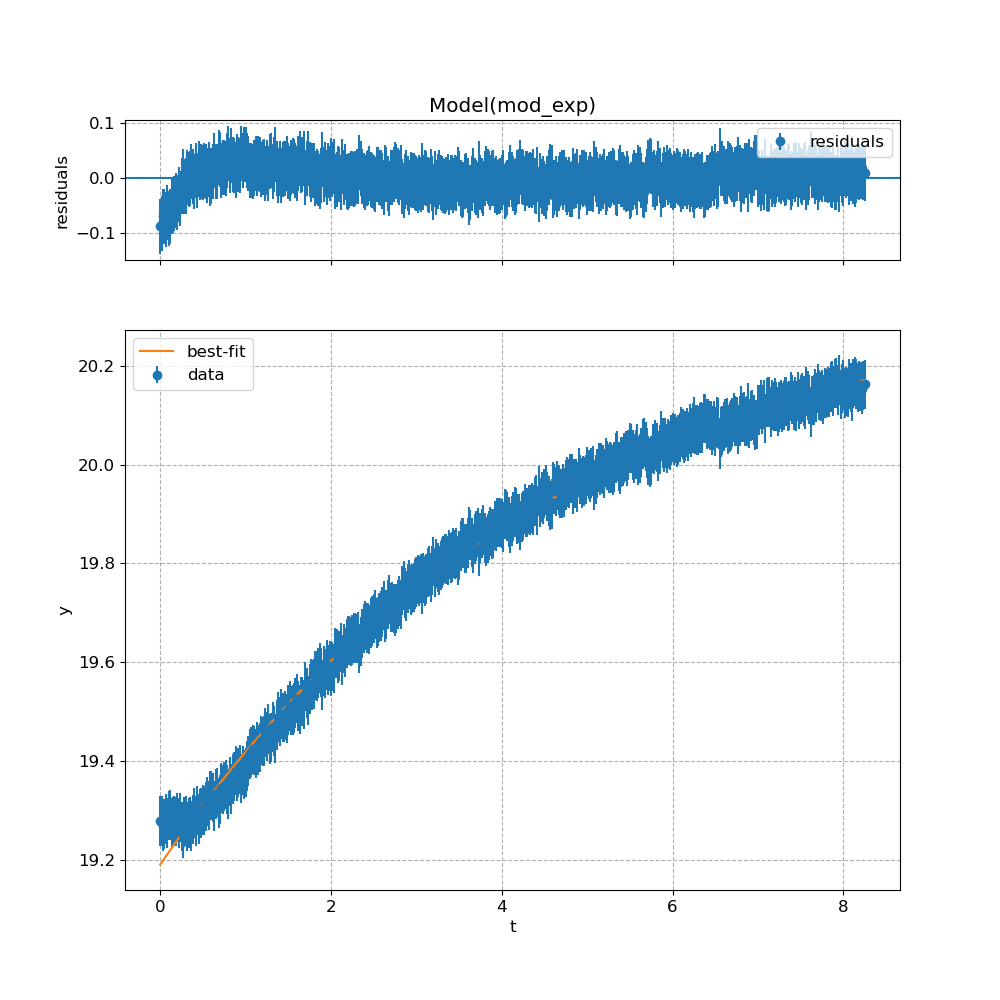

Set Point 15:
$\chi^2_{\mathrm{red.}} =$0.13870443671002752
Decay constant: $\Tau=$4.093509650580043 hours
Total Time: 15.460277777777778 hours
Total Time / Decay Time: 3.776778143319409

dT/dtime (deg C / hour) @ t = 0: 0.31788036456638447
dT/dtime (deg C / hour) @ t = Decay constant: 0.11694165087605587


<IPython.core.display.Javascript object>


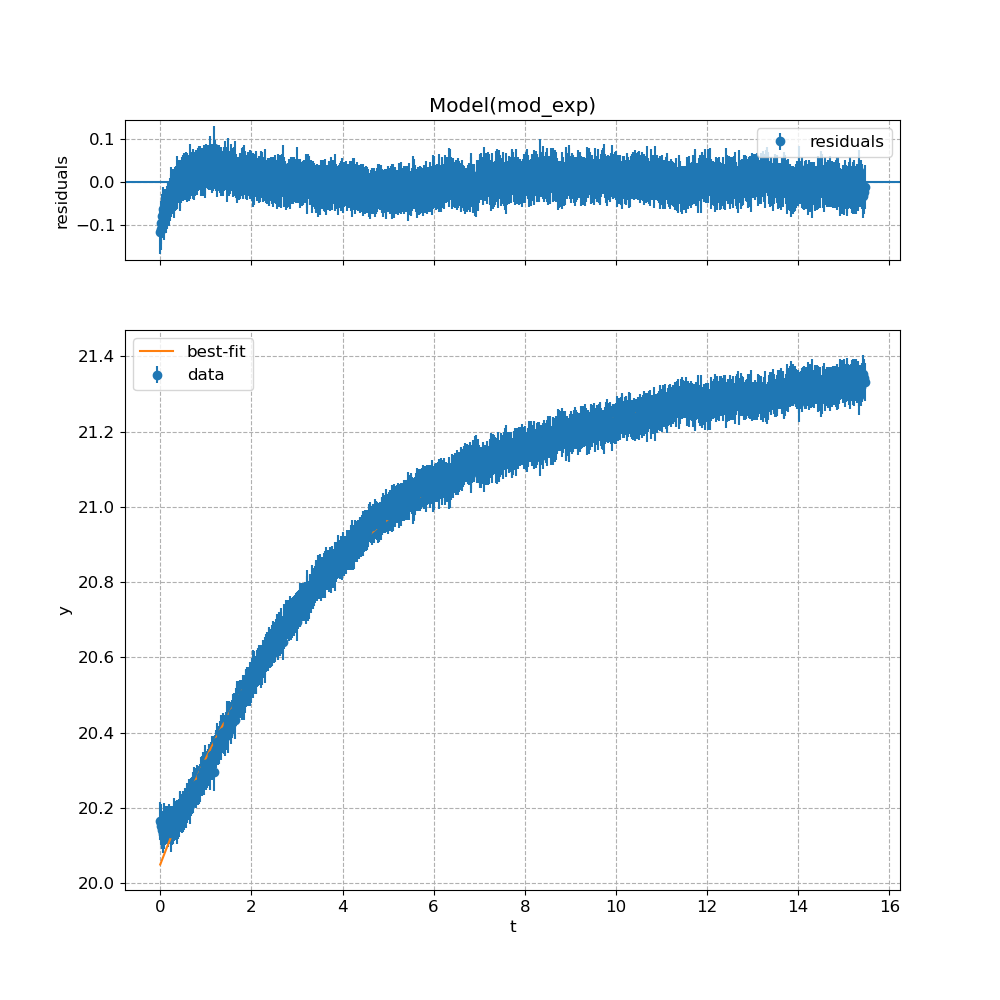

Set Point 16:
$\chi^2_{\mathrm{red.}} =$0.1940028265305575
Decay constant: $\Tau=$5.198996988089618 hours
Total Time: 9.432777777777778 hours
Total Time / Decay Time: 1.8143456900220039

dT/dtime (deg C / hour) @ t = 0: 0.29628648750252823
dT/dtime (deg C / hour) @ t = Decay constant: 0.10899770744907962


<IPython.core.display.Javascript object>


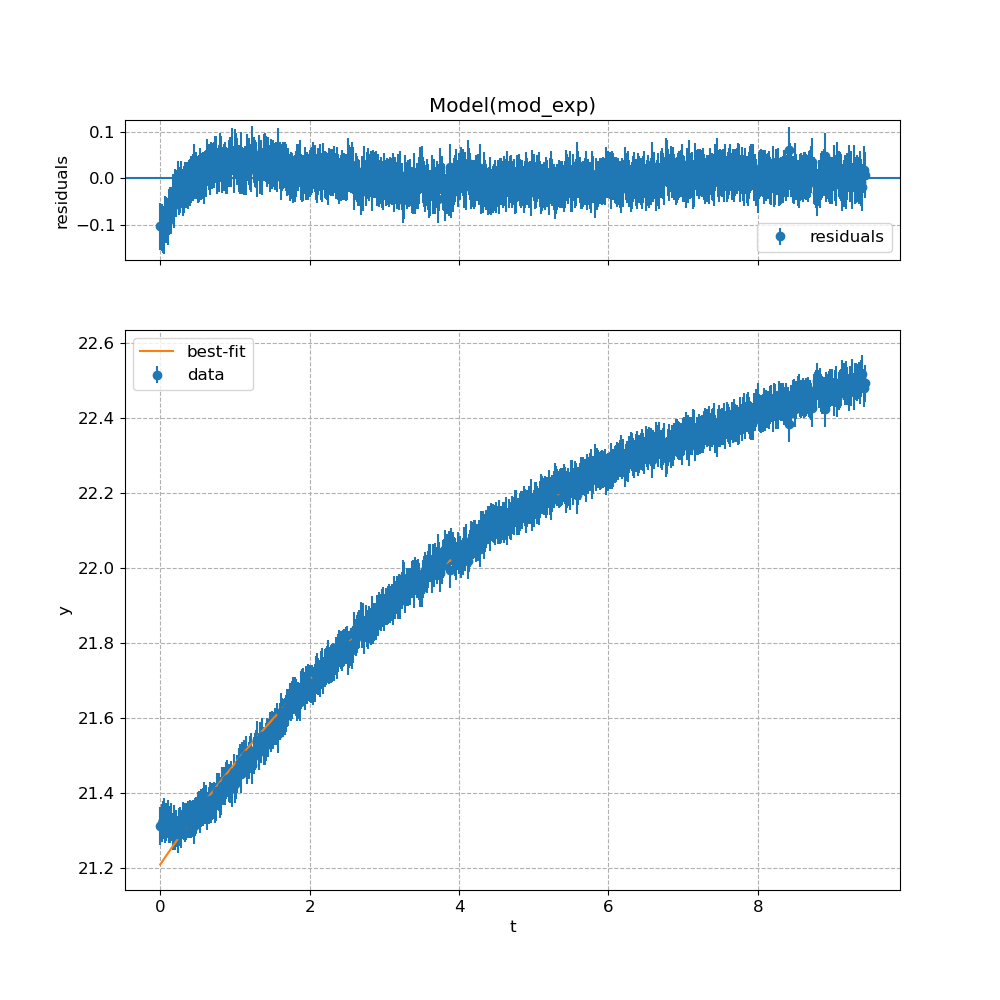

Set Point 17:
$\chi^2_{\mathrm{red.}} =$0.20245797184402234
Decay constant: $\Tau=$4.601350508468281 hours
Total Time: 15.31611111111111 hours
Total Time / Decay Time: 3.3286121287486115

dT/dtime (deg C / hour) @ t = 0: 0.39031627321659784
dT/dtime (deg C / hour) @ t = Decay constant: 0.14358933247104202


<IPython.core.display.Javascript object>


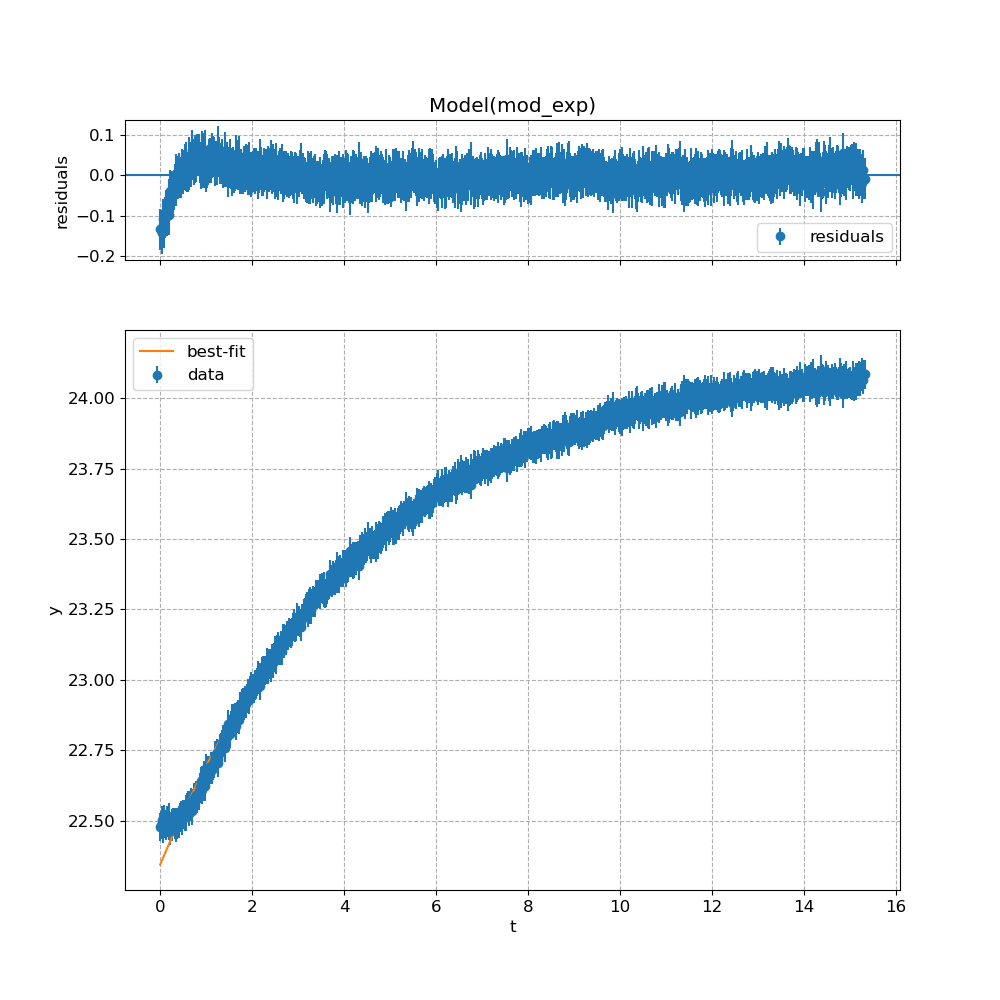

Set Point 18:
$\chi^2_{\mathrm{red.}} =$0.293411204808031
Decay constant: $\Tau=$5.942819928766746 hours
Total Time: 7.8325 hours
Total Time / Decay Time: 1.3179770031540228

dT/dtime (deg C / hour) @ t = 0: 0.2064293723279744
dT/dtime (deg C / hour) @ t = Decay constant: 0.07594112213338683


<IPython.core.display.Javascript object>


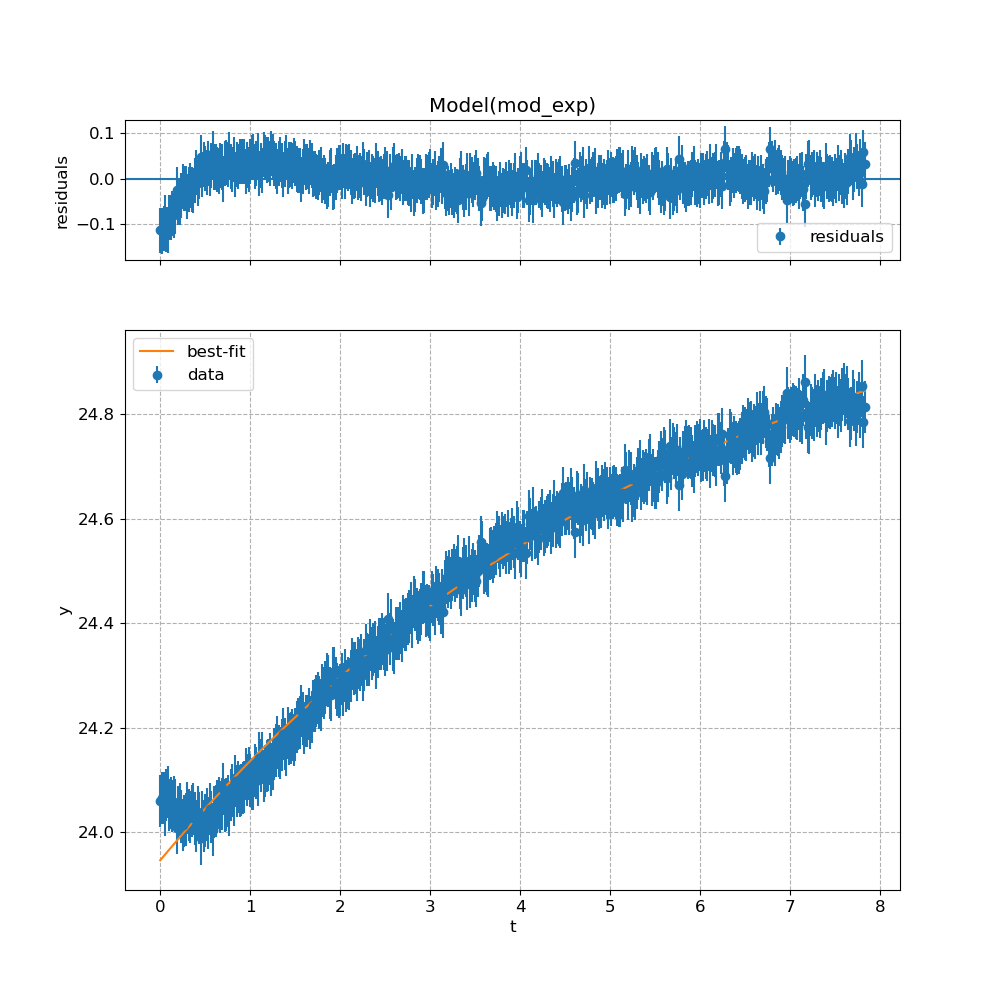

Set Point 19:
$\chi^2_{\mathrm{red.}} =$0.20573109624811262
Decay constant: $\Tau=$3.7672124485143996 hours
Total Time: 15.383333333333333 hours
Total Time / Decay Time: 4.083479109175207

dT/dtime (deg C / hour) @ t = 0: -0.12312354465538616
dT/dtime (deg C / hour) @ t = Decay constant: -0.04529462080287059


<IPython.core.display.Javascript object>


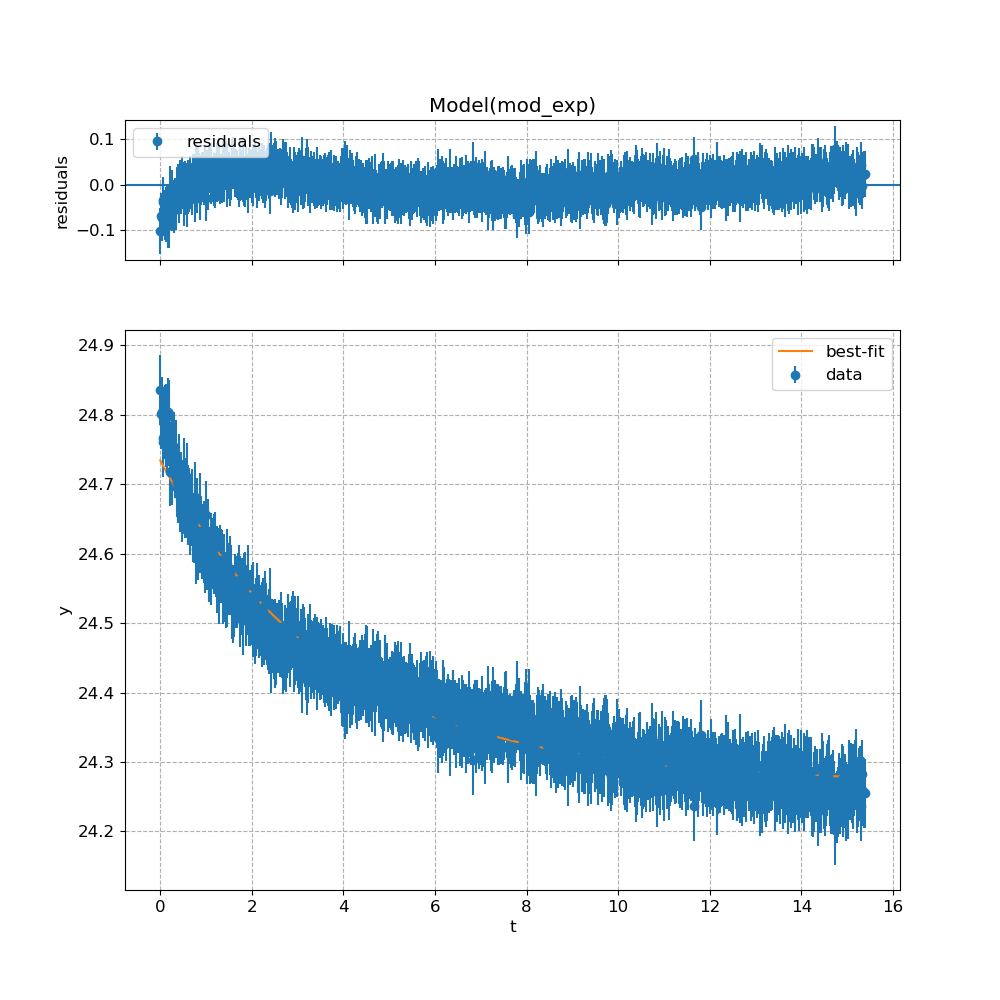

Set Point 20:
$\chi^2_{\mathrm{red.}} =$0.10536709364429508
Decay constant: $\Tau=$2.821787676383905 hours
Total Time: 9.149722222222222 hours
Total Time / Decay Time: 3.242526820425946

dT/dtime (deg C / hour) @ t = 0: -0.37811246786281605
dT/dtime (deg C / hour) @ t = Decay constant: -0.13909980337732772


<IPython.core.display.Javascript object>


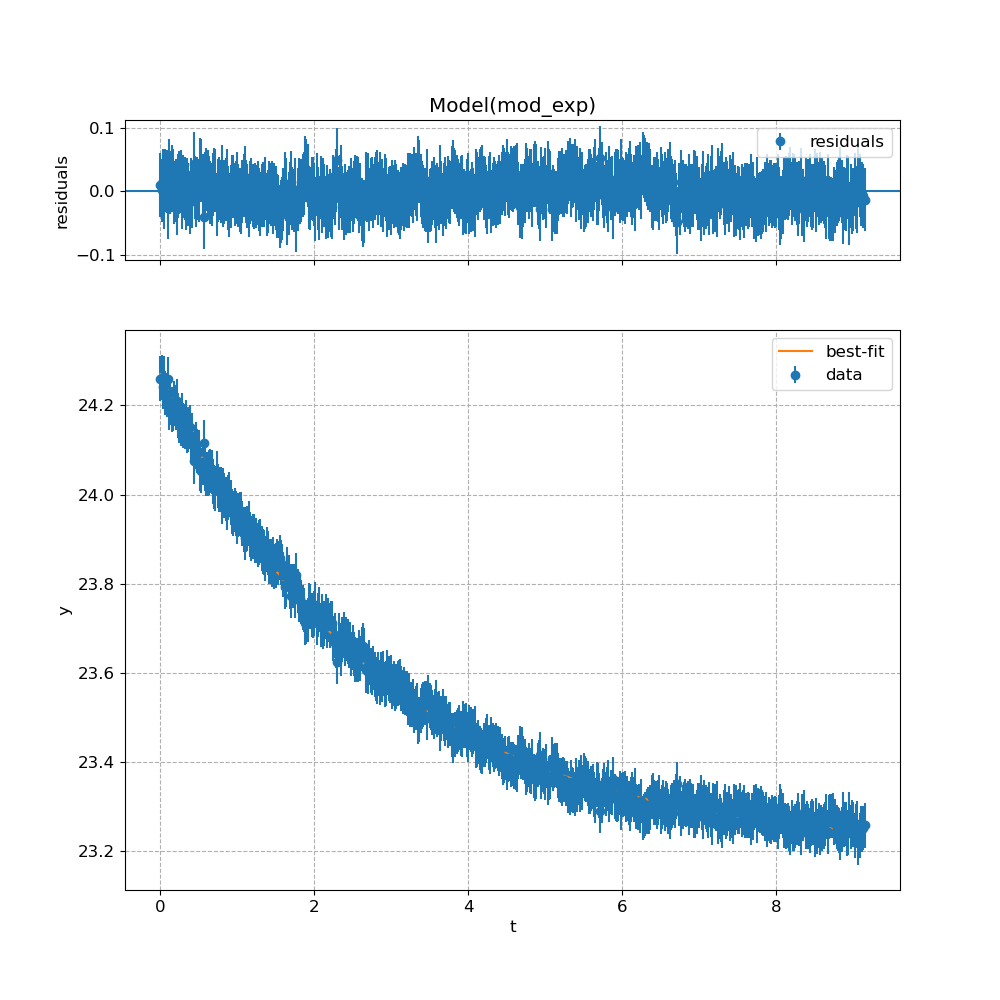

Set Point 21:
$\chi^2_{\mathrm{red.}} =$0.45938444022328523
Decay constant: $\Tau=$3.522302257261388 hours
Total Time: 70.83277777777779 hours
Total Time / Decay Time: 20.109795413426763

dT/dtime (deg C / hour) @ t = 0: -0.626974263653751
dT/dtime (deg C / hour) @ t = Decay constant: -0.23065094174181847


<IPython.core.display.Javascript object>


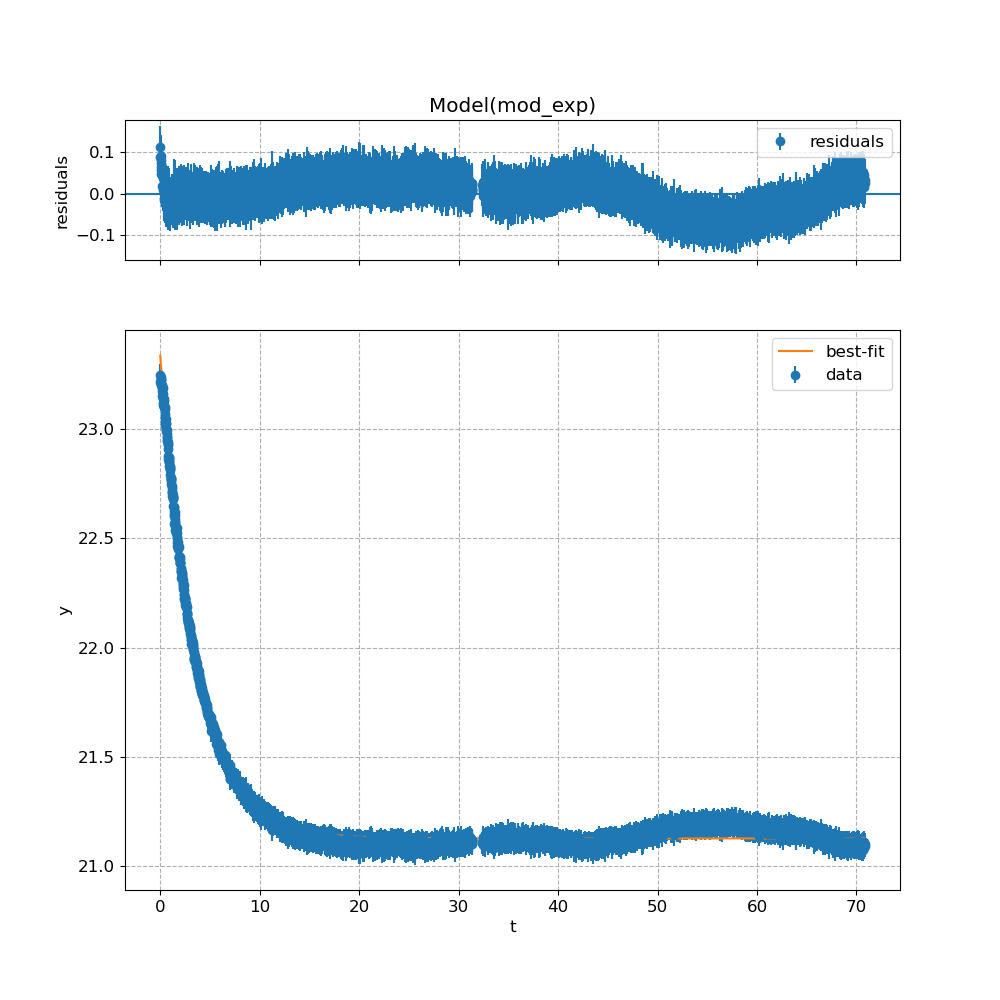

Set Point 22:
$\chi^2_{\mathrm{red.}} =$0.12261086584432175
Decay constant: $\Tau=$4.205581703923916 hours
Total Time: 16.249722222222225 hours
Total Time / Decay Time: 3.8638465178457513

dT/dtime (deg C / hour) @ t = 0: -0.46581108697804335
dT/dtime (deg C / hour) @ t = Decay constant: -0.17136232236894472


<IPython.core.display.Javascript object>


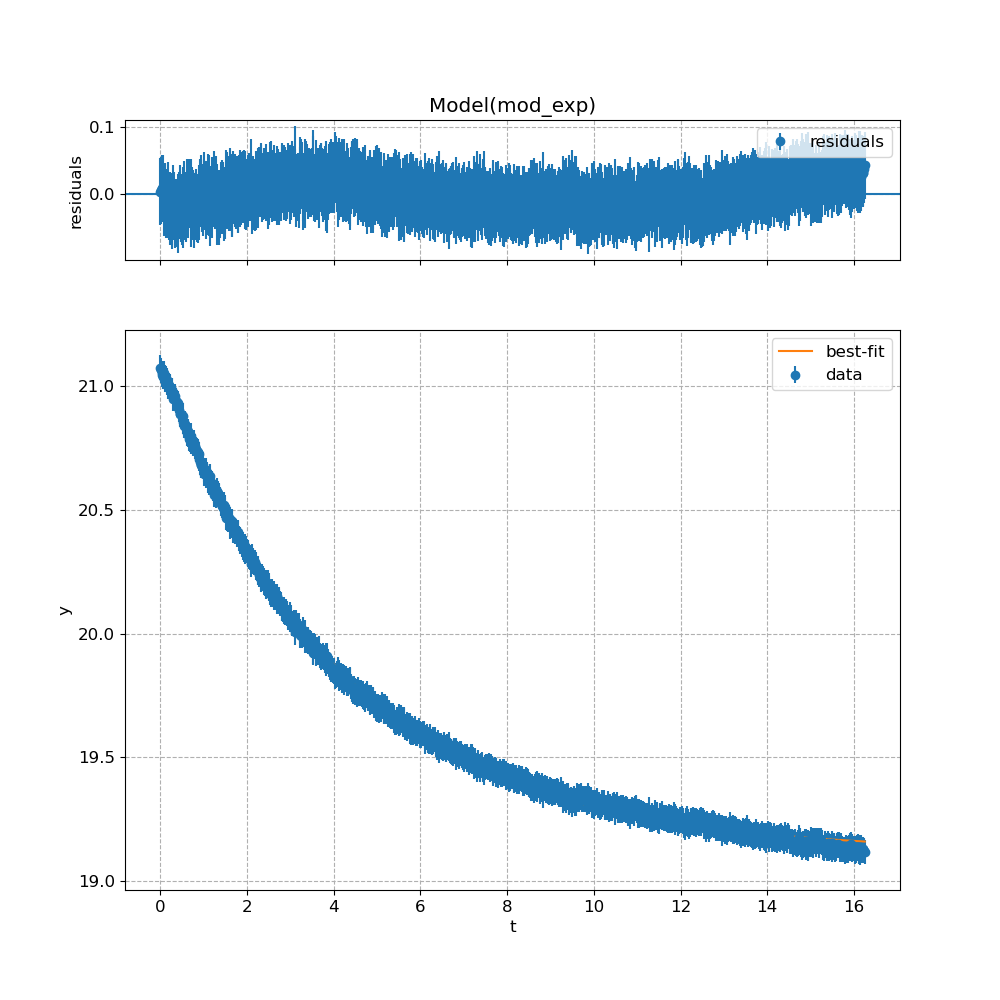

Set Point 23:
$\chi^2_{\mathrm{red.}} =$1.4169936575620012
Decay constant: $\Tau=$5.8984030833878585 hours
Total Time: 478.2708333333333 hours
Total Time / Decay Time: 81.0847998300295

dT/dtime (deg C / hour) @ t = 0: -0.2791037469504274
dT/dtime (deg C / hour) @ t = Decay constant: -0.10267653045697889


<IPython.core.display.Javascript object>


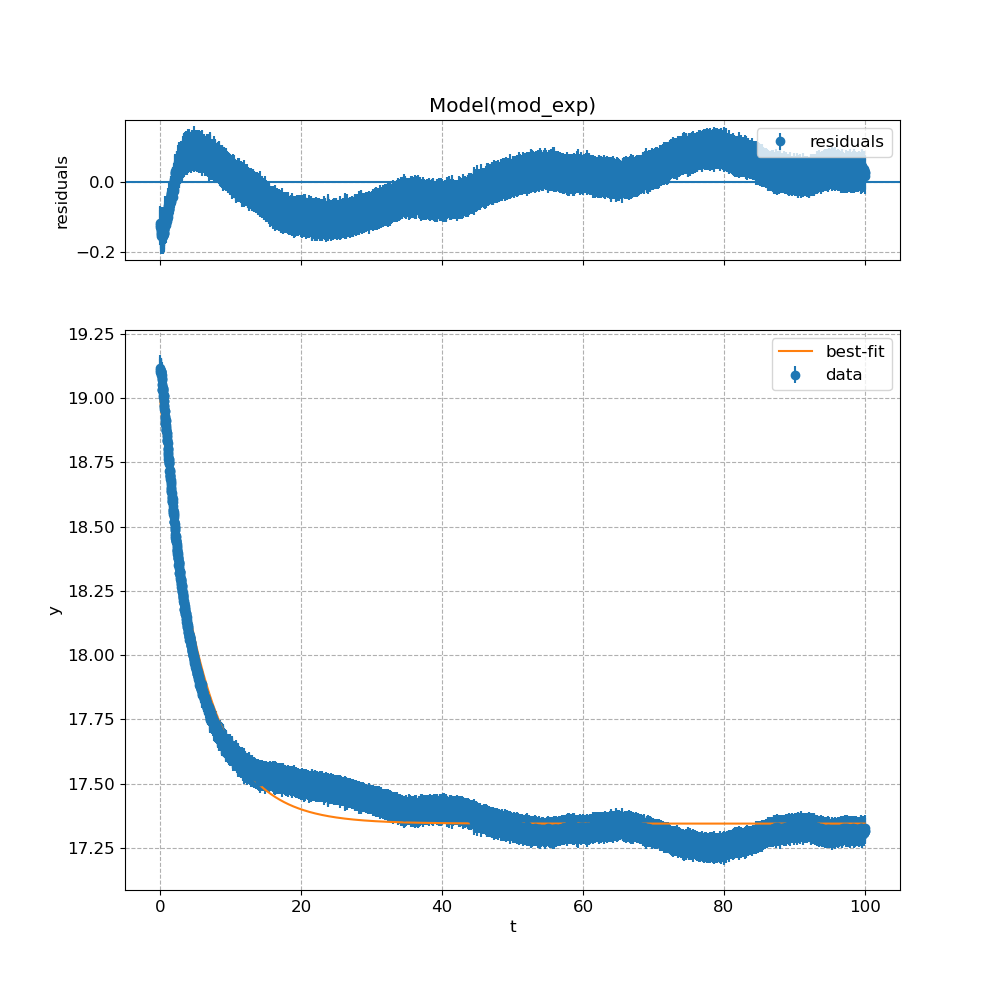

In [143]:
for i in range(len(df_time)):
    print(f'Set Point {i}:')
    result, hmax, df_ = fit_t_exp(i, df_time, df_raw, 'Yoke (center magnet)')
#     result, hmax, df_ = fit_t_exp(i, df_time, df_raw, f'{probe}_Cal_T')
    print(r'$\chi^2_{\mathrm{red.}} =$'+f'{result.redchi}')
    print(r'Decay constant: $\Tau=$'+f"{result.params['B'].value} hours")
    print(f'Total Time: {hmax} hours')
    print(f'Total Time / Decay Time: {hmax/result.params["B"].value}\n')
    print(f'dT/dtime (deg C / hour) @ t = 0: {-result.params["A"]/result.params["B"]}')
    print(f'dT/dtime (deg C / hour) @ t = Decay constant: {-result.params["A"]/result.params["B"]/np.exp(1)}')
    result.plot()

In [ ]:
# new cleaning procedure

In [65]:
dfs = []

In [66]:
for i in range(len(df_time)):
    print(f'Set Point {i}:')
#     result, hmax, df_ = fit_t_exp(i, df_time, df_raw, f'{probe}_Cal_T')
    result, hmax, df_ = fit_t_exp(i, df_time, df_raw, 'Yoke (center magnet)')
#     result, hmax, df_ = fit_t_exp(i, df_time, df_raw, f'{probe}_Cal_T')
    print(r'$\chi^2_{\mathrm{red.}} =$'+f'{result.redchi}')
    print(r'Decay constant: $\Tau=$'+f"{result.params['B'].value} hours")
    print(f'Total Time: {hmax} hours')
    print(f'Total Time / Decay Time: {hmax/result.params["B"].value}\n')
#     result.plot()
    tau = result.params["B"].value
#     if tau > 100.: # FIX ME!!!
#           tau = 2.
    if hmax/tau < 1: # FIX ME!!!
        df_ = df_.query(f'hours_delta > {tau/2}')
    else:
        df_ = df_.query(f'hours_delta > {tau}')
    df_['run'] = i
    dfs.append(df_)

Set Point 0:
$\chi^2_{\mathrm{red.}} =$0.2029497421892836
Decay constant: $\Tau=$3.5105072271715283 hours
Total Time: 24.643333333333334 hours
Total Time / Decay Time: 7.019878250810172

Set Point 1:
$\chi^2_{\mathrm{red.}} =$0.01396937015002141
Decay constant: $\Tau=$3.7074288868229264 hours
Total Time: 25.18722222222222 hours
Total Time / Decay Time: 6.79371688334833

Set Point 2:
$\chi^2_{\mathrm{red.}} =$0.4395845031789799
Decay constant: $\Tau=$5.59323293344379 hours
Total Time: 69.32750000000001 hours
Total Time / Decay Time: 12.394888756638036

Set Point 3:
$\chi^2_{\mathrm{red.}} =$0.47362054347002036
Decay constant: $\Tau=$4.036181600139565 hours
Total Time: 7.485 hours
Total Time / Decay Time: 1.8544755270033393

Set Point 4:
$\chi^2_{\mathrm{red.}} =$0.03825886180668111
Decay constant: $\Tau=$4.395685241233774 hours
Total Time: 16.333333333333336 hours
Total Time / Decay Time: 3.7157649915690785

Set Point 5:
$\chi^2_{\mathrm{red.}} =$0.0412998055443026
Decay constant: $\Tau

In [67]:
df_clean = pd.concat(dfs)
df_clean.drop(columns=['seconds_delta', 'hours_delta', 'days_delta'], inplace=True)
df_clean['seconds_delta'] = (df_clean.index - df_clean.index[0]).total_seconds()
df_clean['hours_delta'] = (df_clean.index - df_clean.index[0]).total_seconds()/60**2
df_clean['days_delta'] = (df_clean.index - df_clean.index[0]).total_seconds()/(24*60**2)

In [68]:
df_clean

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1 (new),Coil 2 (old),LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke,...,C50000000D5E473A_Cal_T,6A0000000D61333A_Cal_T,SmarAct_Meas_Angle_1,SmarAct_Meas_Rotation_Angle_1,SmarAct_Meas_Angle_2,SmarAct_Meas_Rotation_Angle_2,run,seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2021-02-24 13:28:38,2/24/2021 1:28:38 PM,240.069750,28.571600,29.840097,28.007162,7.107207,10.018359,10.879767,13.184784,15.563291,...,16.468,16.509,0.000686,0.0,0.000606,0.0,0,0.0,0.000000,0.000000
2021-02-24 13:29:38,2/24/2021 1:29:38 PM,240.069580,28.571800,29.787987,28.031197,7.115325,10.044732,10.914607,13.178277,15.564605,...,16.467,16.511,0.000685,0.0,0.000610,0.0,0,60.0,0.016667,0.000694
2021-02-24 13:30:38,2/24/2021 1:30:38 PM,240.069580,28.571950,29.807564,28.020391,7.117673,10.037371,10.909006,13.181531,15.567900,...,16.469,16.510,0.000685,0.0,0.000609,0.0,0,120.0,0.033333,0.001389
2021-02-24 13:31:39,2/24/2021 1:31:39 PM,240.069580,28.572000,29.803446,28.041353,7.122602,10.033122,10.869917,13.189683,15.573018,...,16.468,16.512,0.000690,0.0,0.000610,0.0,0,181.0,0.050278,0.002095
2021-02-24 13:32:37,2/24/2021 1:32:37 PM,240.069693,28.572150,29.791532,28.036276,7.136472,10.048101,10.879786,13.194210,15.577725,...,16.470,16.517,0.000685,0.0,0.000613,0.0,0,239.0,0.066389,0.002766
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-05 08:05:03,4/5/2021 8:05:03 AM,160.047520,18.885693,26.896858,26.822971,16.732733,18.459539,18.649643,21.047083,18.768127,...,17.158,17.702,0.001787,0.0,0.001367,0.0,23,3436585.0,954.606944,39.775289
2021-04-05 08:06:03,4/5/2021 8:06:03 AM,160.047463,18.885840,26.895796,26.856619,16.735105,18.453161,18.628620,21.054861,18.767283,...,17.155,17.695,0.001792,0.0,0.001370,0.0,23,3436645.0,954.623611,39.775984
2021-04-05 08:07:03,4/5/2021 8:07:03 AM,160.047520,18.885925,26.894203,26.892708,16.730320,18.454494,18.626814,21.064997,18.768127,...,17.158,17.712,0.001788,0.0,0.001370,0.0,23,3436705.0,954.640278,39.776678


In [69]:
df_clean.query('3 <= run <= 18')

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1 (new),Coil 2 (old),LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke,...,C50000000D5E473A_Cal_T,6A0000000D61333A_Cal_T,SmarAct_Meas_Angle_1,SmarAct_Meas_Rotation_Angle_1,SmarAct_Meas_Angle_2,SmarAct_Meas_Rotation_Angle_2,run,seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2021-03-01 13:21:43,3/1/2021 1:21:43 PM,0.000849,0.000395,7.688446,7.691459,6.898076,7.368879,7.800656,6.925324,12.731566,...,14.935,14.766,0.001877,0.0,0.001132,0.0,3,431585.0,119.884722,4.995197
2021-03-01 13:22:43,3/1/2021 1:22:43 PM,0.001091,-0.001118,7.643955,7.702847,6.885967,7.356124,7.805821,6.908267,12.722416,...,14.934,14.764,0.001877,0.0,0.001134,0.0,3,431645.0,119.901389,4.995891
2021-03-01 13:23:43,3/1/2021 1:23:43 PM,0.001039,-0.000333,7.624253,7.710751,6.905254,7.374886,7.772696,6.924972,12.710895,...,14.935,14.760,0.001880,0.0,0.001134,0.0,3,431705.0,119.918056,4.996586
2021-03-01 13:24:43,3/1/2021 1:24:43 PM,0.000718,0.000996,7.651546,7.712375,6.935202,7.386232,7.751643,6.941383,12.705977,...,14.931,14.755,0.001880,0.0,0.001132,0.0,3,431765.0,119.934722,4.997280
2021-03-01 13:25:43,3/1/2021 1:25:43 PM,0.001004,-0.000206,7.638594,7.720768,6.922057,7.367510,7.786451,6.953355,12.700392,...,14.929,14.754,0.001876,0.0,0.001134,0.0,3,431825.0,119.951389,4.997975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-11 17:46:47,3/11/2021 5:46:47 PM,281.677420,36.814150,51.974365,51.455513,16.494814,22.697769,23.309382,31.614250,25.736761,...,19.369,20.426,0.000533,0.0,0.001049,0.0,18,1311489.0,364.302500,15.179271
2021-03-11 17:47:47,3/11/2021 5:47:47 PM,281.677477,36.814183,51.953983,51.460171,16.498129,22.703094,23.390150,31.622131,25.739260,...,19.364,20.405,0.000536,0.0,0.001047,0.0,18,1311549.0,364.319167,15.179965
2021-03-11 17:48:47,3/11/2021 5:48:47 PM,281.677647,36.814433,51.900555,51.444550,16.515627,22.720036,23.383900,31.625975,25.749882,...,19.362,20.378,0.000530,0.0,0.001051,0.0,18,1311609.0,364.335833,15.180660


In [70]:
len(df_clean)

47321

In [71]:
df_clean.columns

Index(['Time', 'Magnet Current [A]', 'Magnet Voltage [V]', 'Coil 1 (new)',
       'Coil 2 (old)', 'LCW in Coil1', 'LCW out Coil 1', 'LCW in Coil 2',
       'LCW out Coil 2', 'Yoke', 'Hall Element', 'Floor', 'Roof',
       'Yoke (center magnet)', 'Parameter HVAC sensor', 'Chamber Wall CH13',
       'Chamber Wall CH14', 'Chamber Wall CH15', 'Chamber Wall CH16',
       'Chamber Wall CH17', 'Chamber Wall CH18', 'Chamber Wall CH19',
       'Chamber Wall CH20', 'Desk Ambient', 'Outlet Strip Ambient',
       'Top fo Orange PS Ambient', 'Spare Ambient on desk',
       'TrippLite Ambient 3ft high', 'TrippLite Ambient Floor', 'PS internal',
       'PS Vent1', 'PS Vent2', 'TrippLite HVAC supply',
       'Tripplite HVAC exhaust', 'LCW to PS', 'LCW in barrel', 'ICW in',
       'ICW HE1 out', 'ICW He2 out', 'LCW return magnet', 'LCW to barrel',
       'LCW from PS', 'LCW to magnet', 'NMR [T]', 'NMR [FFT]',
       'DF0000000D5E803A_Raw_X', 'DF0000000D5E803A_Raw_Y',
       'DF0000000D5E803A_Raw_Z', 'C

In [83]:
#df_ = df_clean.query('run == 23')
df_ = df_clean.query('run == 4')

<IPython.core.display.Javascript object>


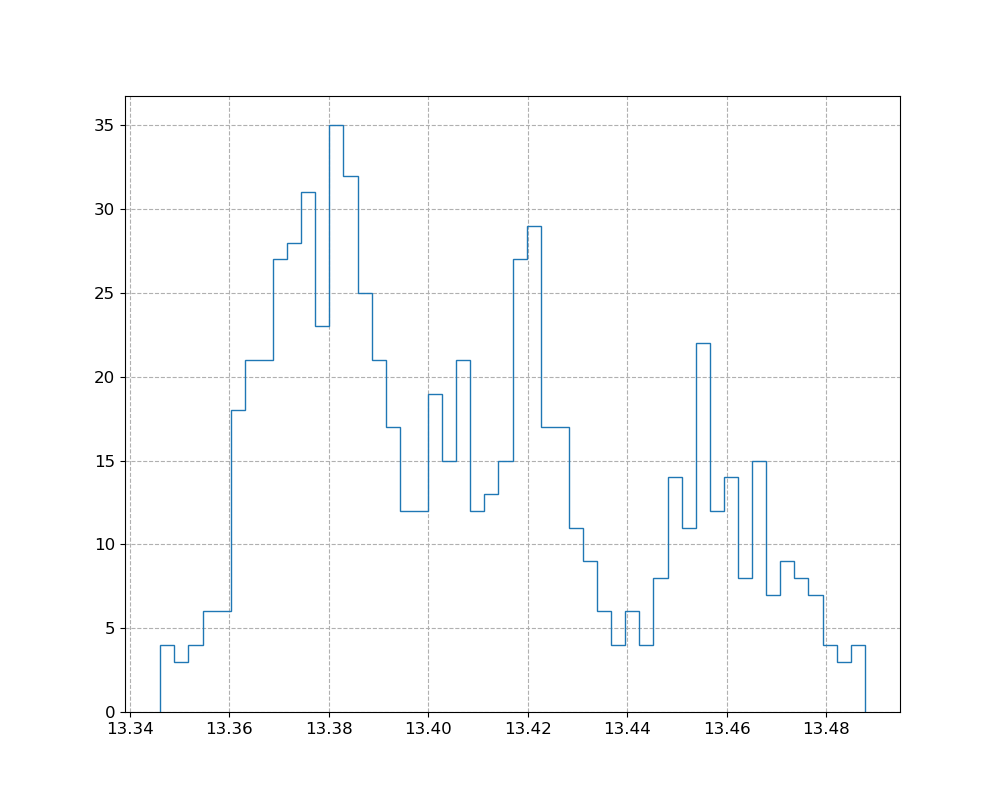

count    717.000000
mean      13.407523
std        0.034891
min       13.346132
25%       13.378274
50%       13.401557
75%       13.429406
max       13.487753
Name: Floor, dtype: float64

In [87]:
#y = 'Roof'
y = 'Floor'
#y = 'Chamber Wall CH13'
fig, ax = plt.subplots()
ax.hist(df_[y], bins=50, histtype='step')
df_[y].describe()

## "Inspect Column" Plotting and Getting Histogram Label (ADD TO PLOTTING)

In [92]:
# get label
def get_label(data, bins):
    over = (data > np.max(bins)).sum()
    under = (data < np.min(bins)).sum()
    data_ = data[(data <= np.max(bins)) & (data >= np.min(bins))]
    mean = f'{np.mean(data_):.3E}'
    std = f'{np.std(data_, ddof=1):.3E}'
    label = f'mean: {mean:>15}\nstddev: {std:>15}\nIntegral: {len(data):>17}\n'\
    +f'Underflow: {under:>16}\nOverflow: {over:>16}'
    return label

# inspect NMR
def inspect_col(run_num, df_time, df_clean, bins_in_sigma=15, nsig=1, ycol='NMR [T]'):
    df_t = df_time.iloc[run_num]
    df_ = df_clean.query(f'"{df_t.t0}" < index < "{df_t.tf}"').copy()
    min_ = df_[ycol].min()
    max_ = df_[ycol].max()
    std_ = df_[ycol].std()
    mean_ = df_[ycol].mean()
    size_bin = 2 * std_ / bins_in_sigma
    print(f'bin size = {size_bin}')
    if size_bin < 1e-10:
        size_bin = 1e-1
    if abs(max_-min_) < 1e-7:
        bins = np.array([min_-1, min_, min_+1])
    else:
        bins = np.arange(min_-1e-5, max_+size_bin+1e-5, size_bin)
    data = df_[ycol].values
    print(len(data))
    label = get_label(data, bins)
    print(label)
    
    # plot
    fig, ax = plt.subplots()
    n, bins_, patches = ax.hist(data, bins, histtype='step', label=label)
    nm = np.max(n)
    ax.plot([mean_,mean_], [0,1.1*nm], 'k--', label='mean')
    ax.plot([mean_-nsig*std_,mean_-nsig*std_], [0,1.1*nm], 'r-.', label=f'{nsig}'+r'$\sigma$ from mean')
    ax.plot([mean_+nsig*std_,mean_+nsig*std_], [0,1.1*nm], 'r-.',) #label=r'$1\sigma$ from mean')
    ax.set_xlabel(ycol)
    ax.set_title(f'Set Point {run_num}')
    ax.legend()
    return fig, ax

bin size = 2.3928890482437685e-06
1268
mean:       1.209E+00
stddev:       1.795E-05
Integral:              1268
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


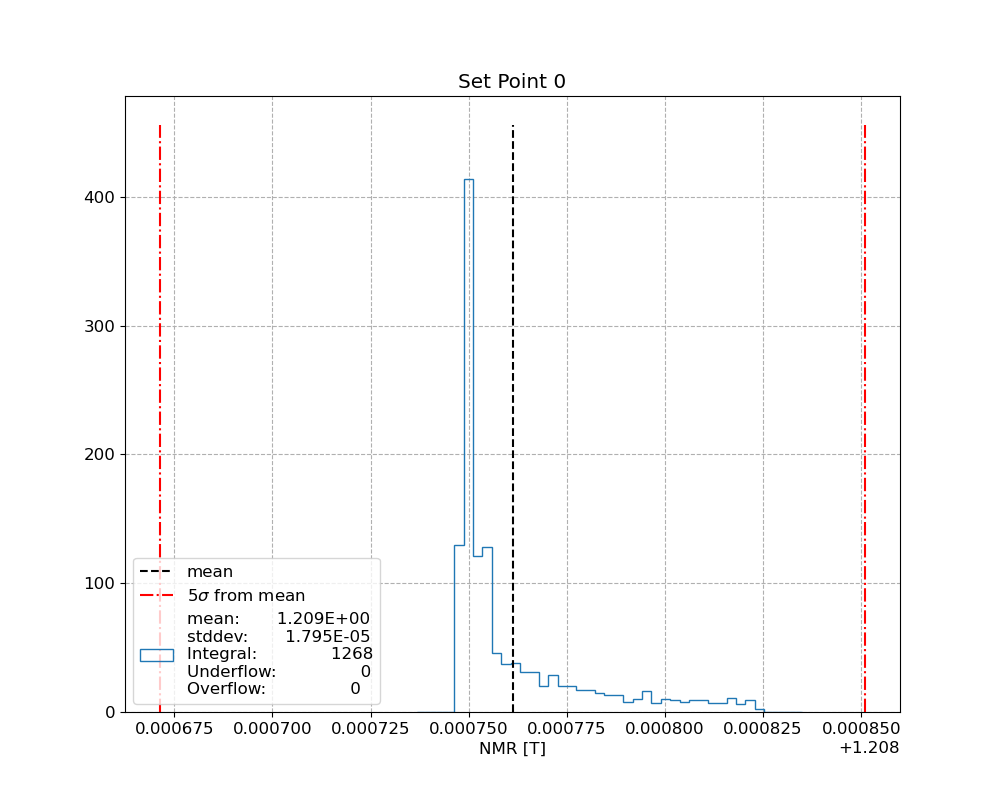

bin size = 9.068487484204034e-07
1289
mean:       1.164E+00
stddev:       6.801E-06
Integral:              1289
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


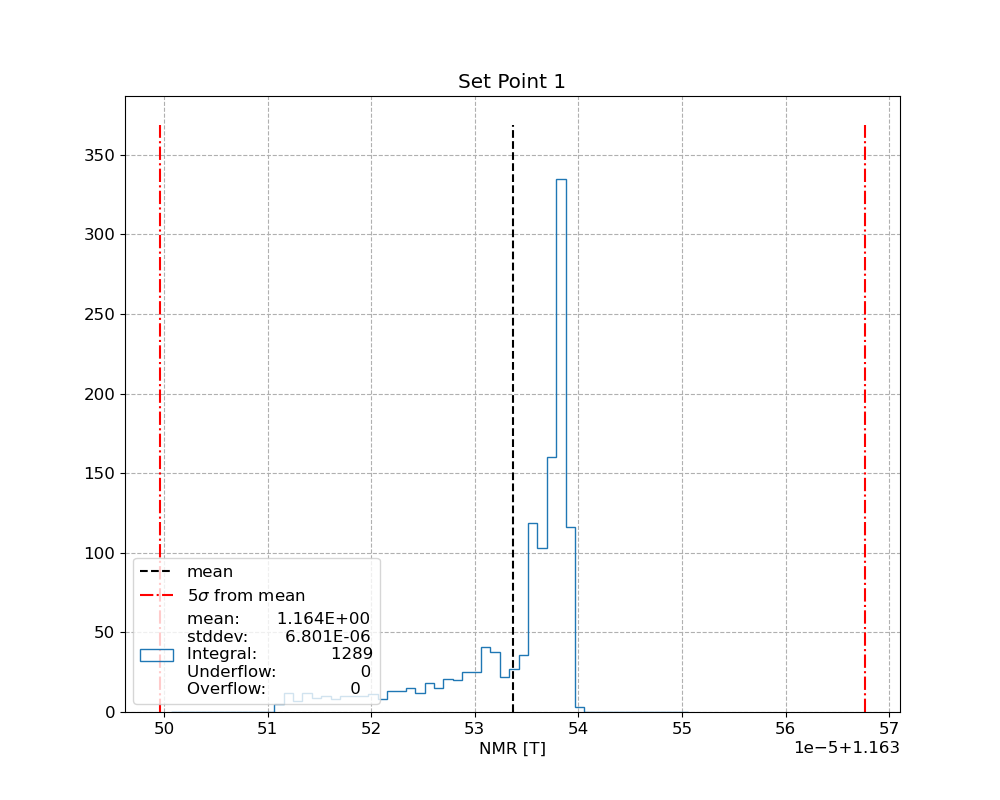

bin size = 8.329698138506746e-07
3825
mean:       1.208E+00
stddev:       6.247E-06
Integral:              3825
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


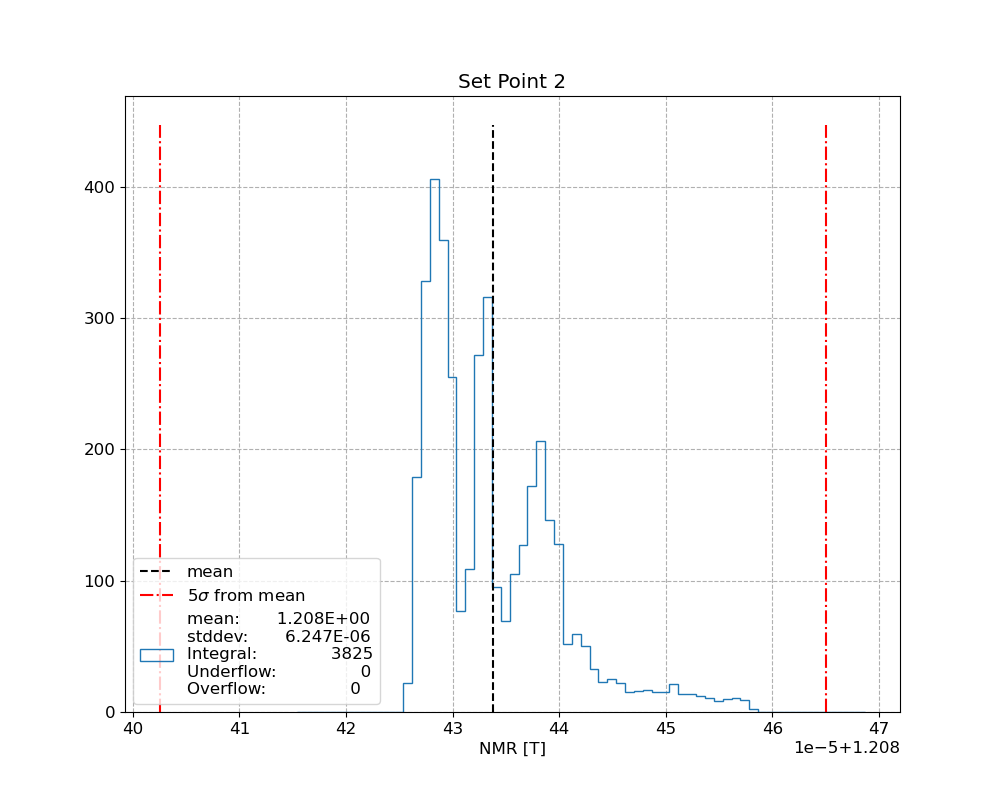

bin size = 0.0
207
mean:       0.000E+00
stddev:       0.000E+00
Integral:               207
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


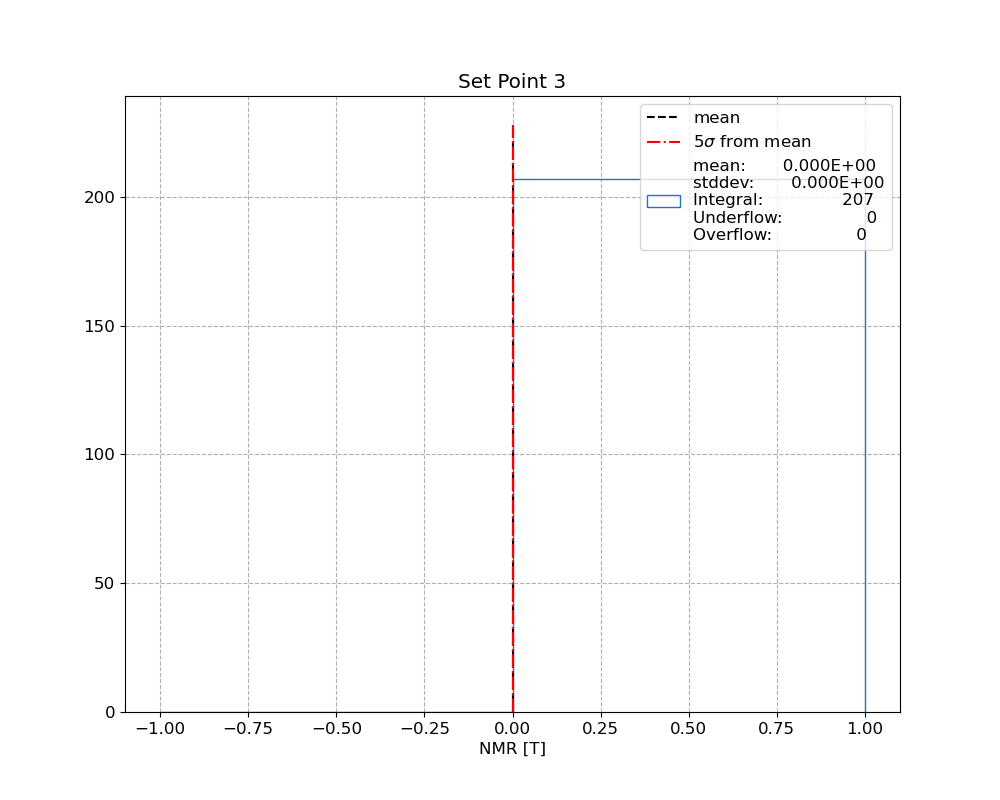

bin size = 0.0
717
mean:       0.000E+00
stddev:       0.000E+00
Integral:               717
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


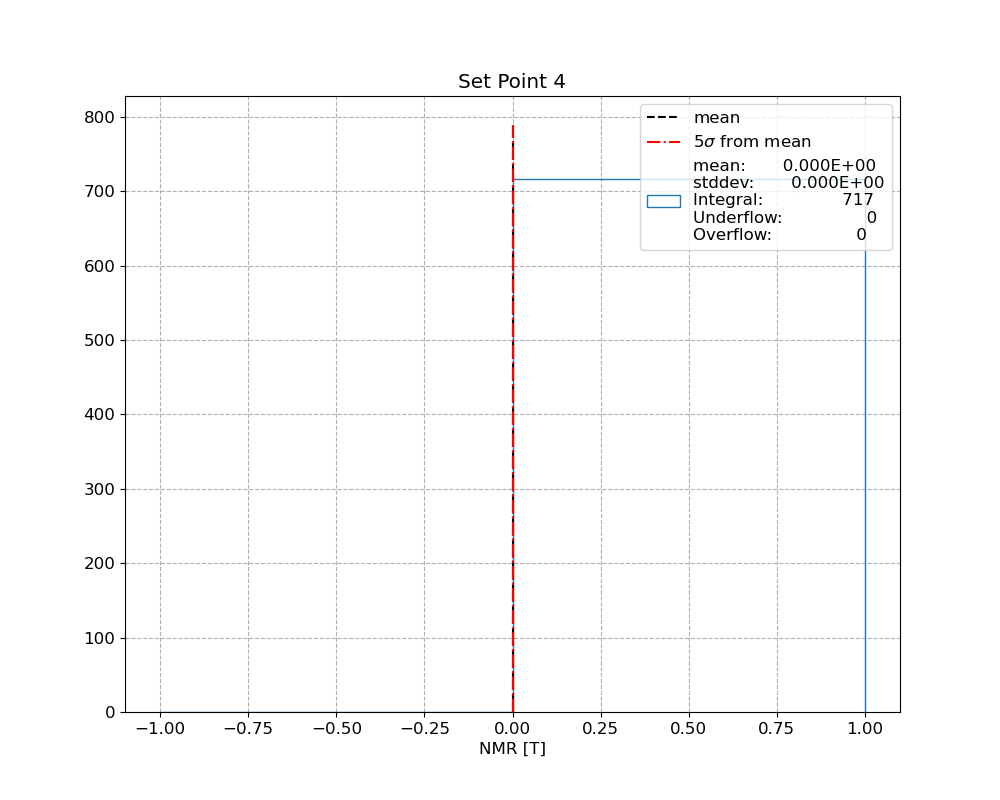

bin size = 0.0
236
mean:       0.000E+00
stddev:       0.000E+00
Integral:               236
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


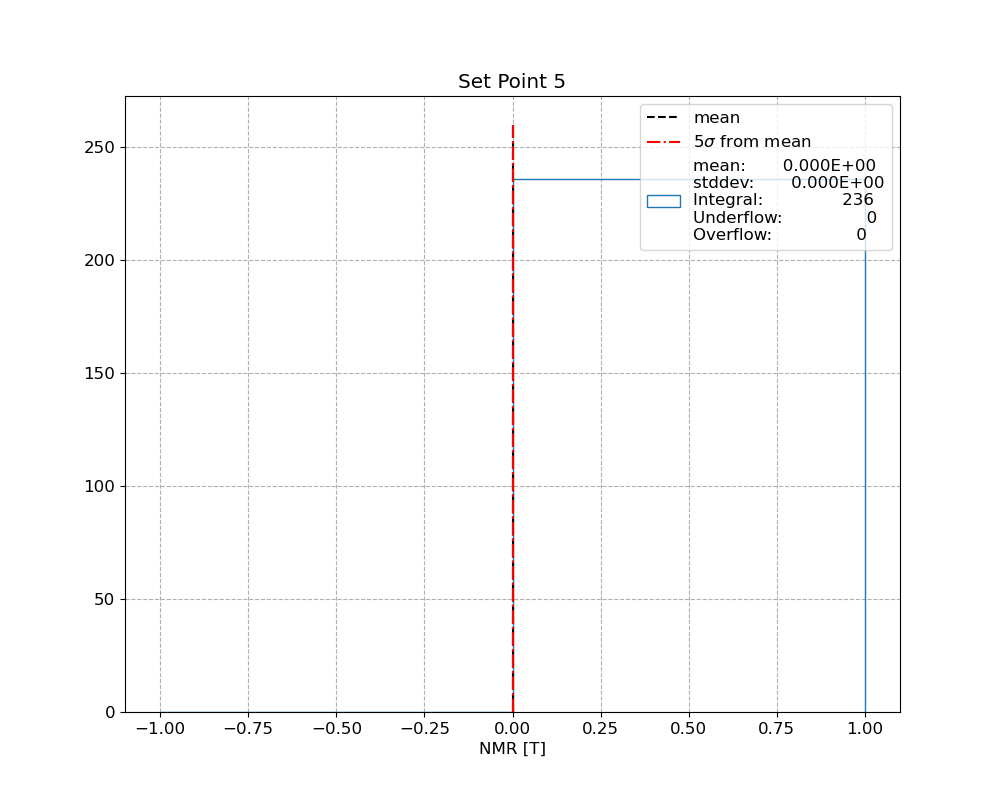

bin size = 0.0
737
mean:       0.000E+00
stddev:       0.000E+00
Integral:               737
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


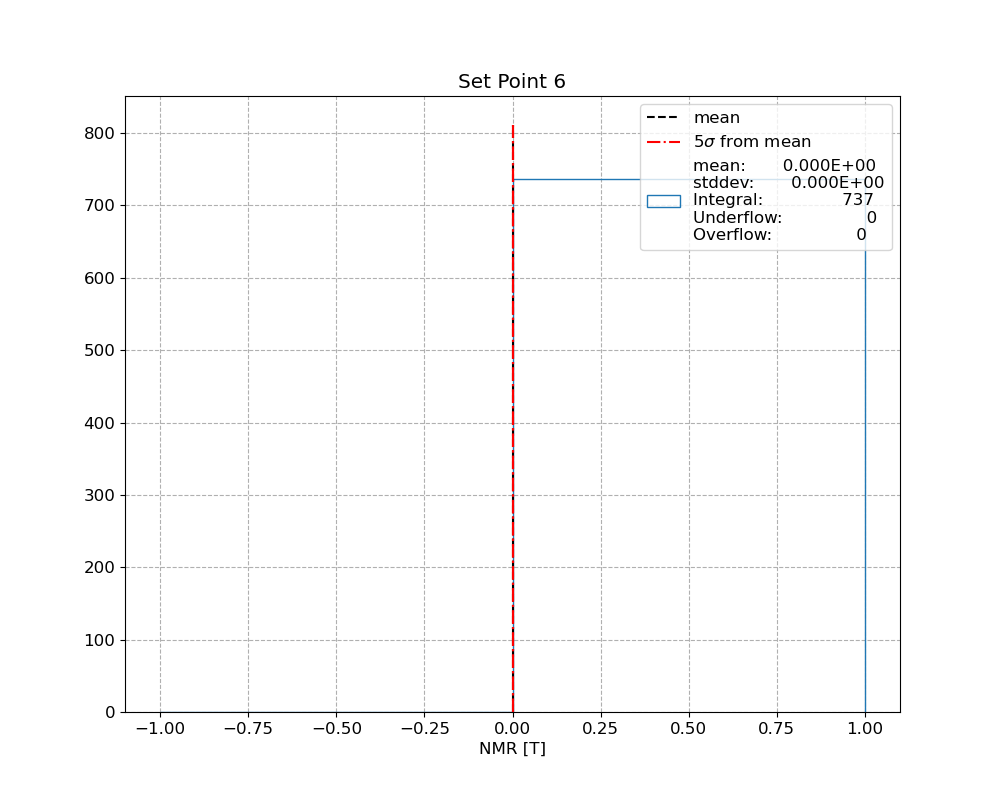

bin size = 4.44007290914976e-08
216
mean:       7.340E-01
stddev:       3.330E-07
Integral:               216
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


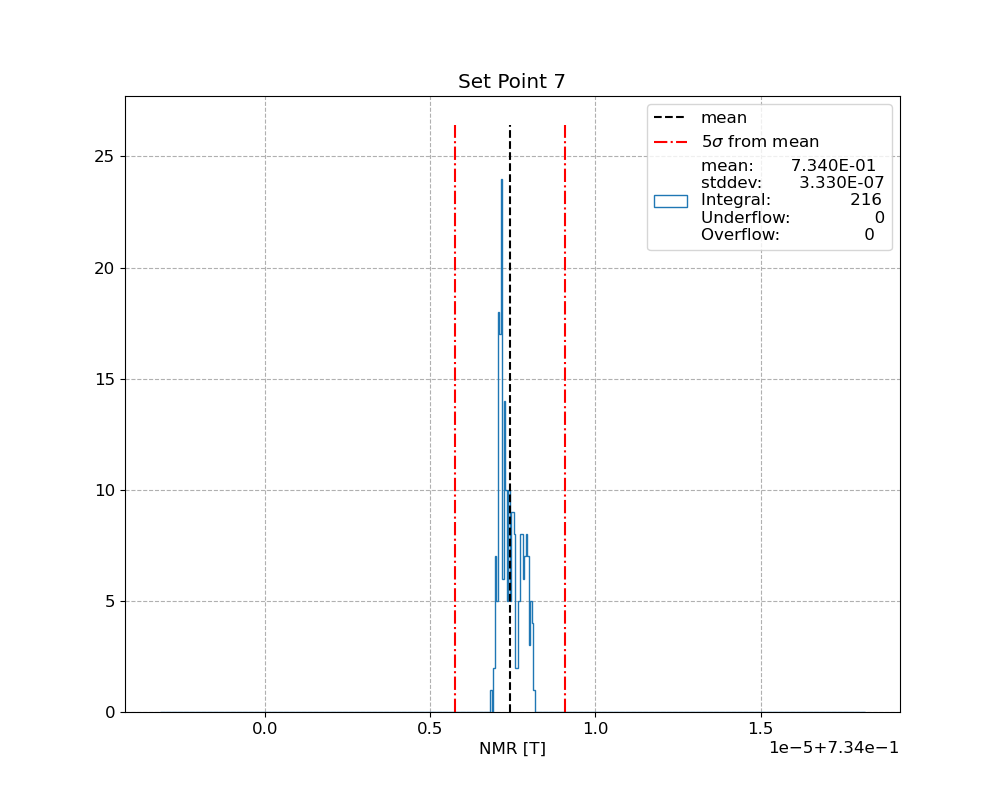

bin size = 5.979913056977691e-08
719
mean:       8.224E-01
stddev:       4.485E-07
Integral:               719
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


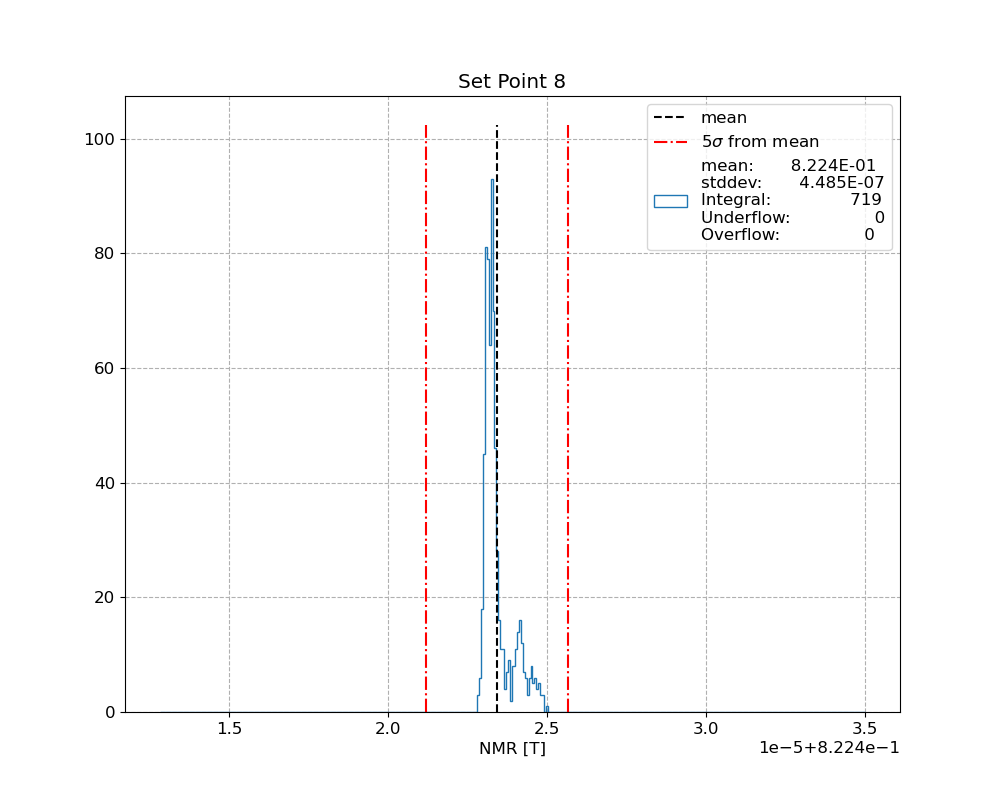

bin size = 9.83603560949877e-08
208
mean:       9.067E-01
stddev:       7.377E-07
Integral:               208
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


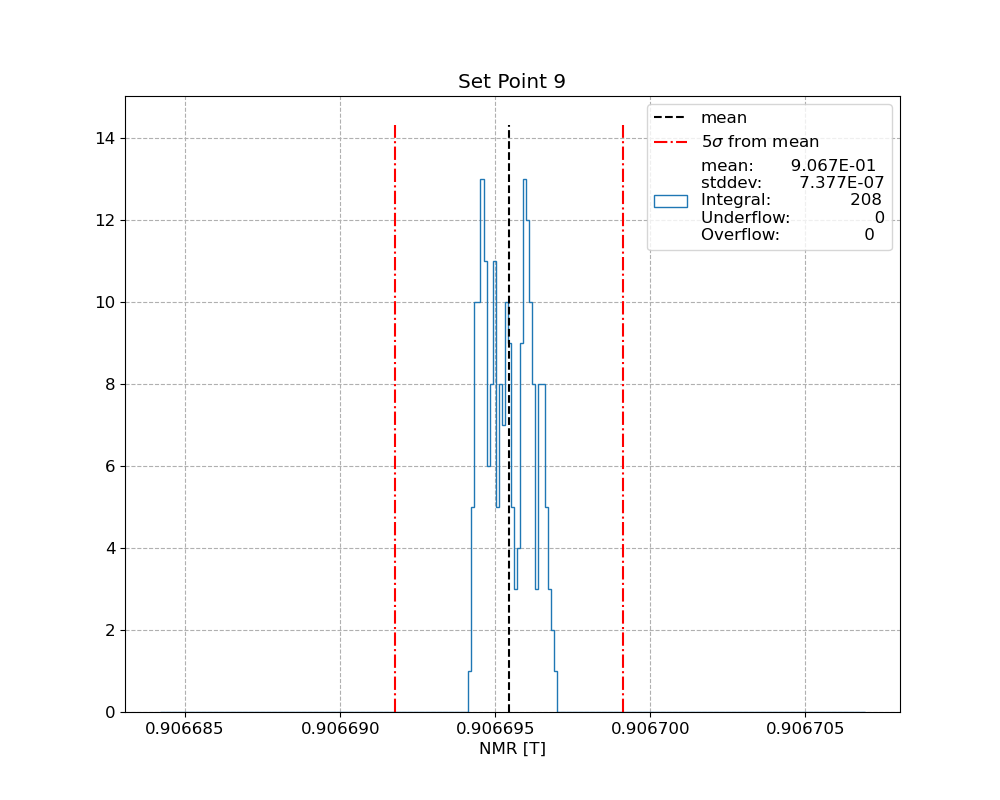

bin size = 2.845060471235138e-07
752
mean:       9.840E-01
stddev:       2.134E-06
Integral:               752
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


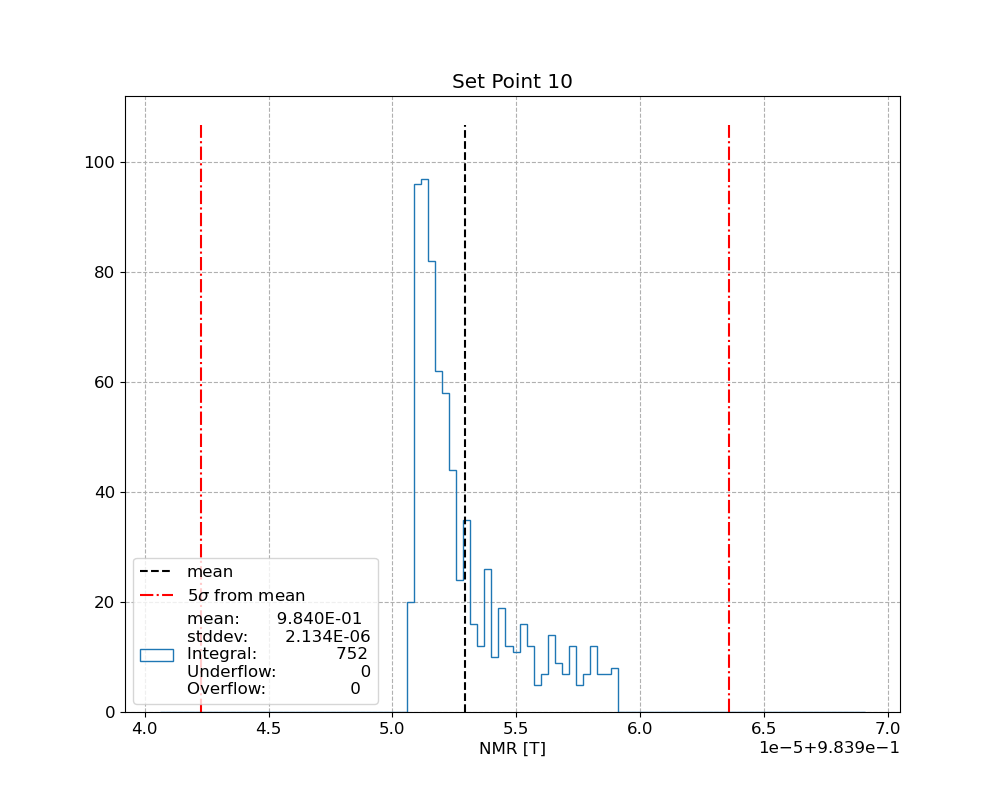

bin size = 2.2397208371537382e-07
105
mean:       1.051E+00
stddev:       1.680E-06
Integral:               105
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


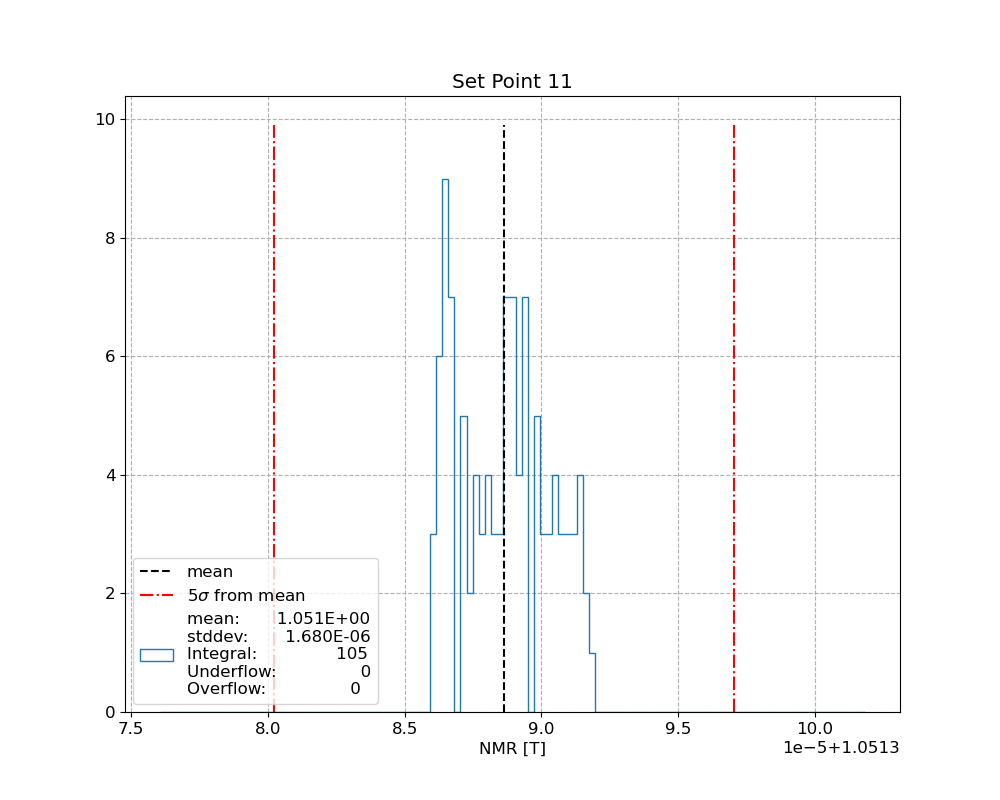

bin size = 2.1195488542749954e-06
330
mean:       1.050E+00
stddev:       1.590E-05
Integral:               330
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


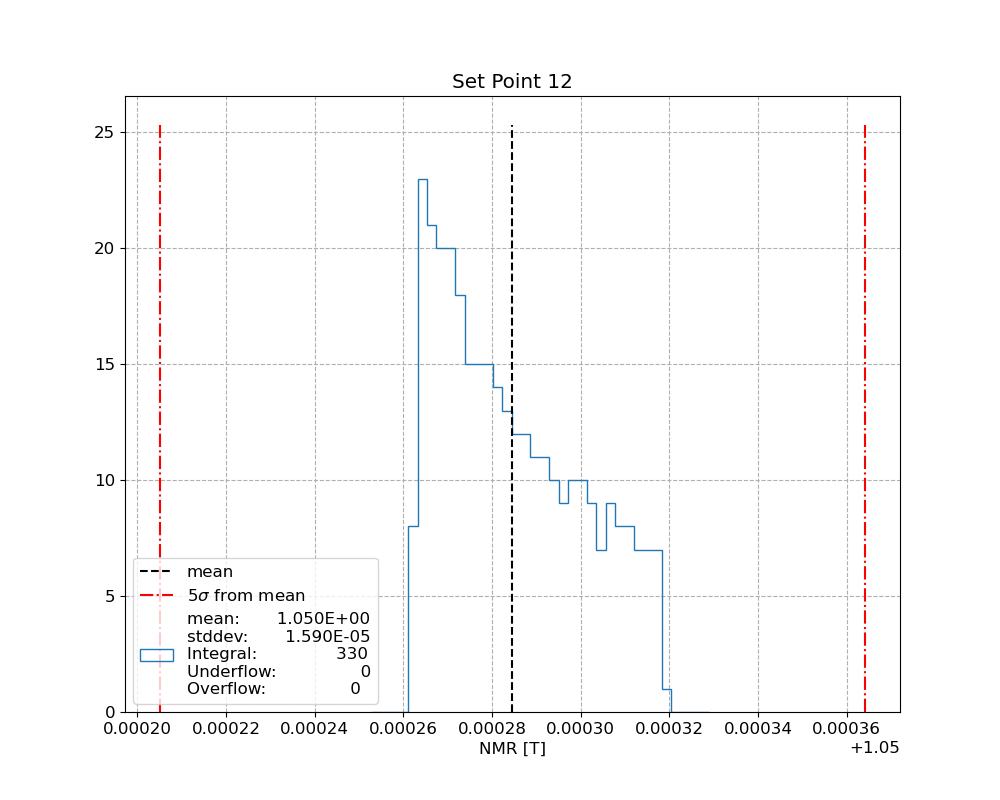

bin size = 1.249663743287432e-06
680
mean:       1.110E+00
stddev:       9.372E-06
Integral:               680
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


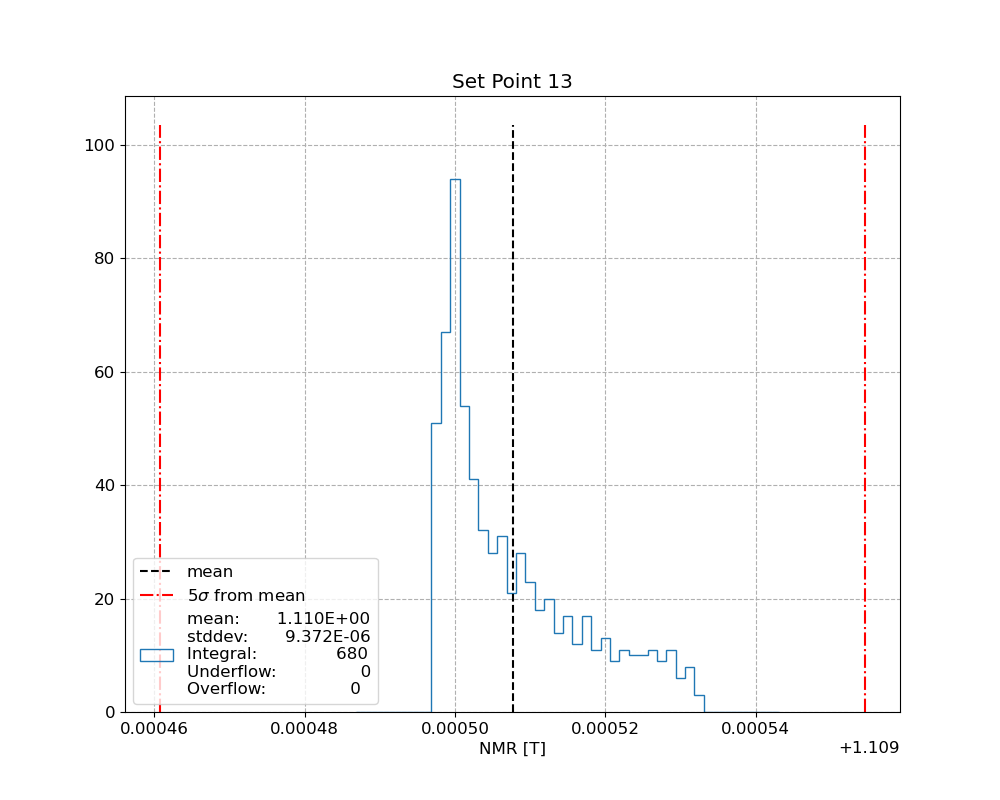

bin size = 0.0021074916670464233
216
mean:       1.160E+00
stddev:       1.581E-02
Integral:               216
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


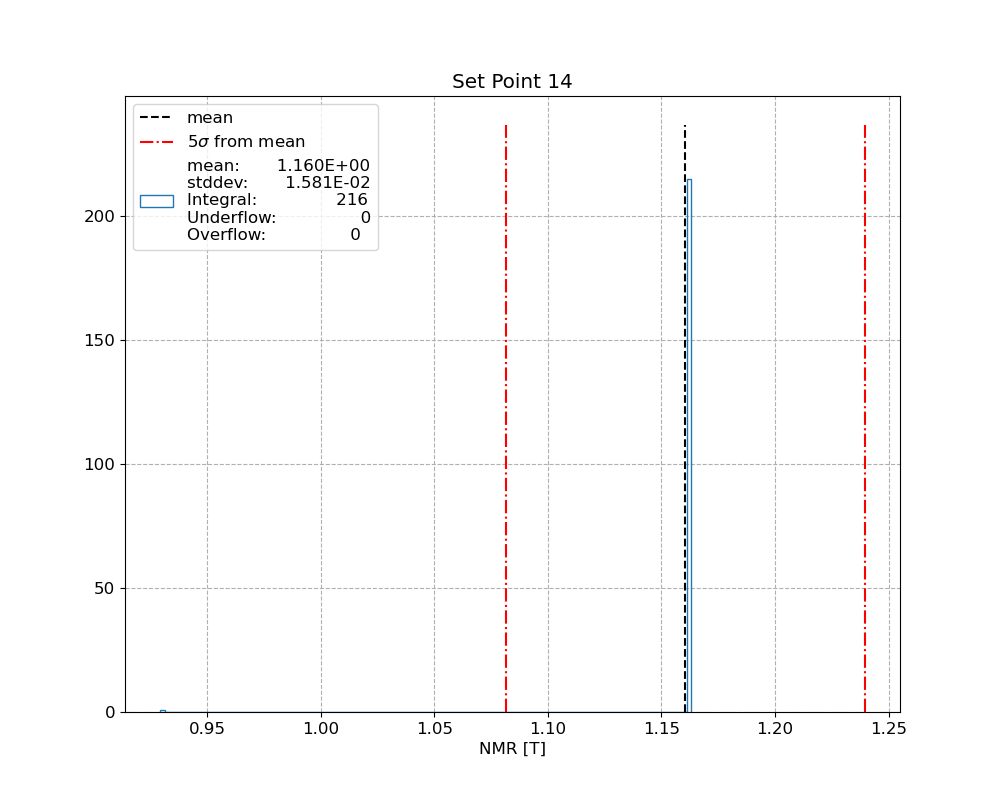

bin size = 1.6148447254298291e-06
682
mean:       1.209E+00
stddev:       1.211E-05
Integral:               682
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


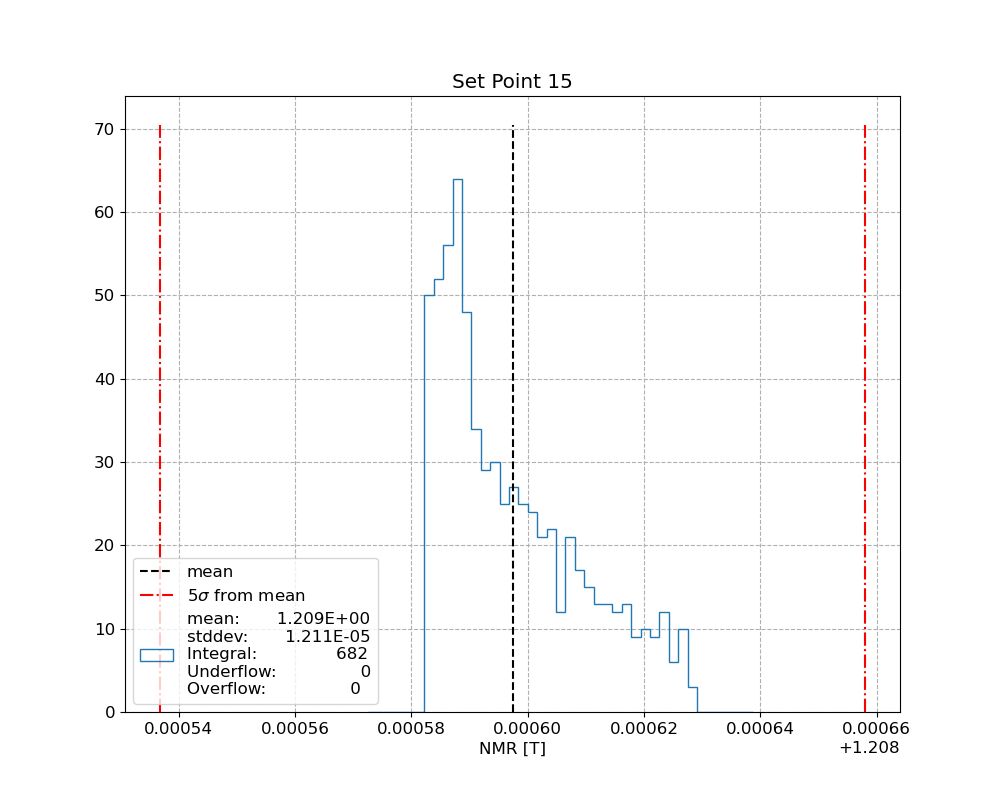

bin size = 1.3993194060142418e-06
255
mean:       1.251E+00
stddev:       1.049E-05
Integral:               255
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


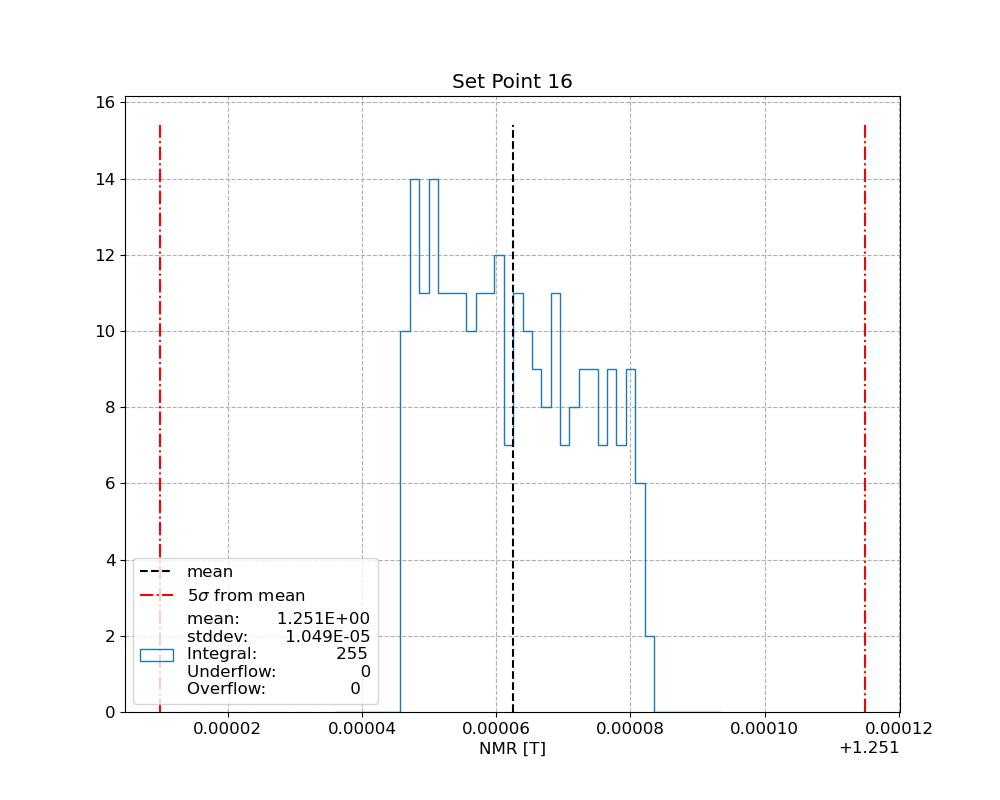

bin size = 3.26990324708015e-06
643
mean:       1.289E+00
stddev:       2.452E-05
Integral:               643
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


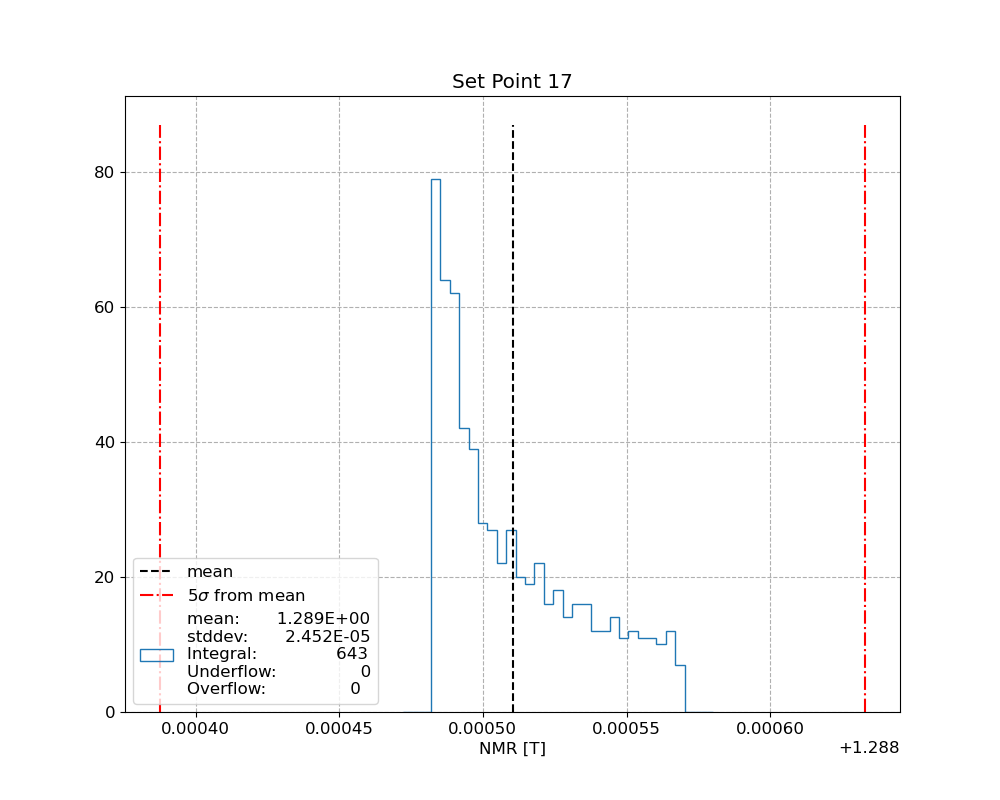

bin size = 6.920379346740343e-07
114
mean:       1.308E+00
stddev:       5.190E-06
Integral:               114
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


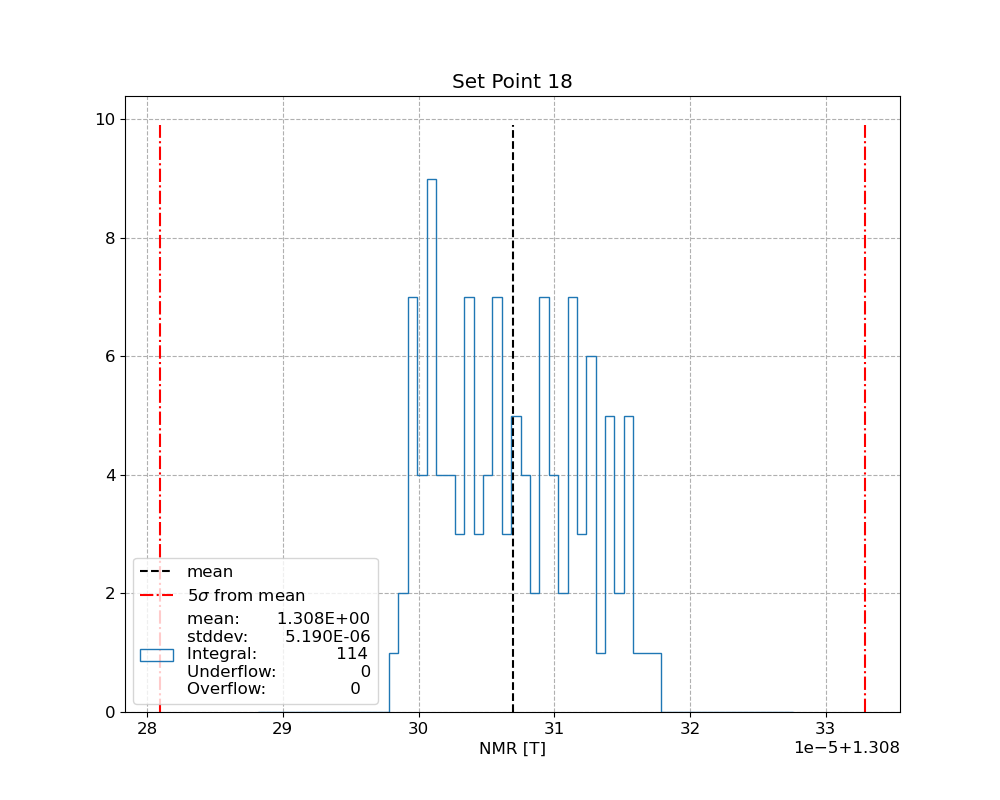

bin size = 1.091100810675712e-06
697
mean:       1.288E+00
stddev:       8.183E-06
Integral:               697
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


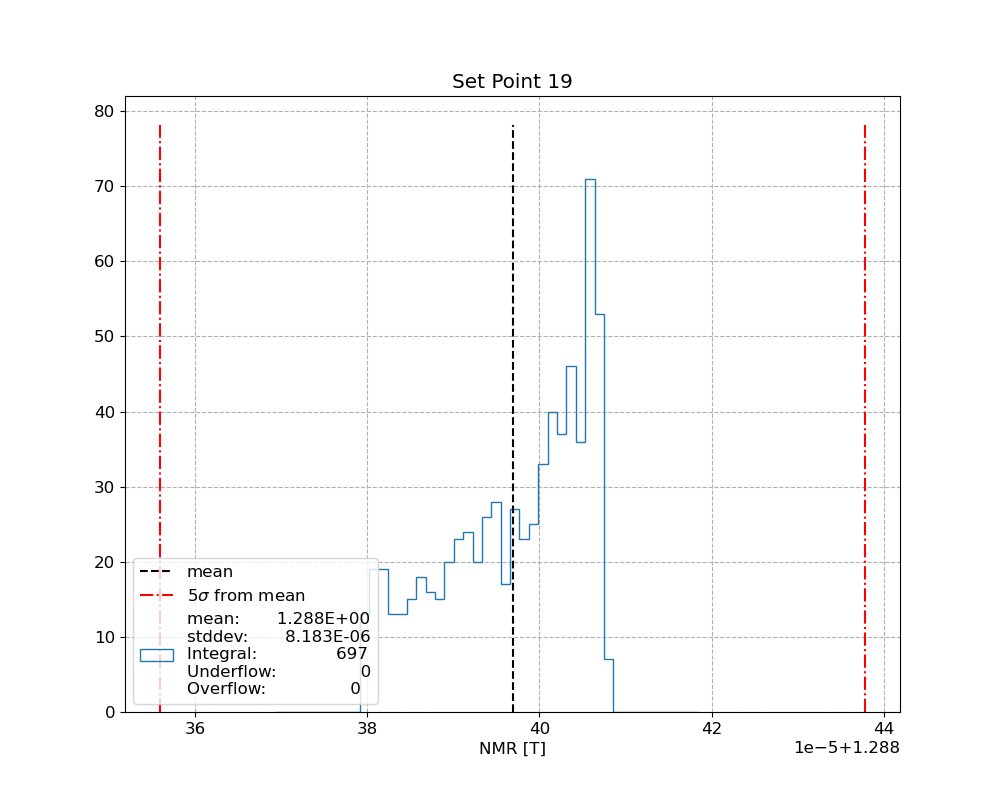

bin size = 1.8682791042698268e-06
380
mean:       1.251E+00
stddev:       1.401E-05
Integral:               380
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


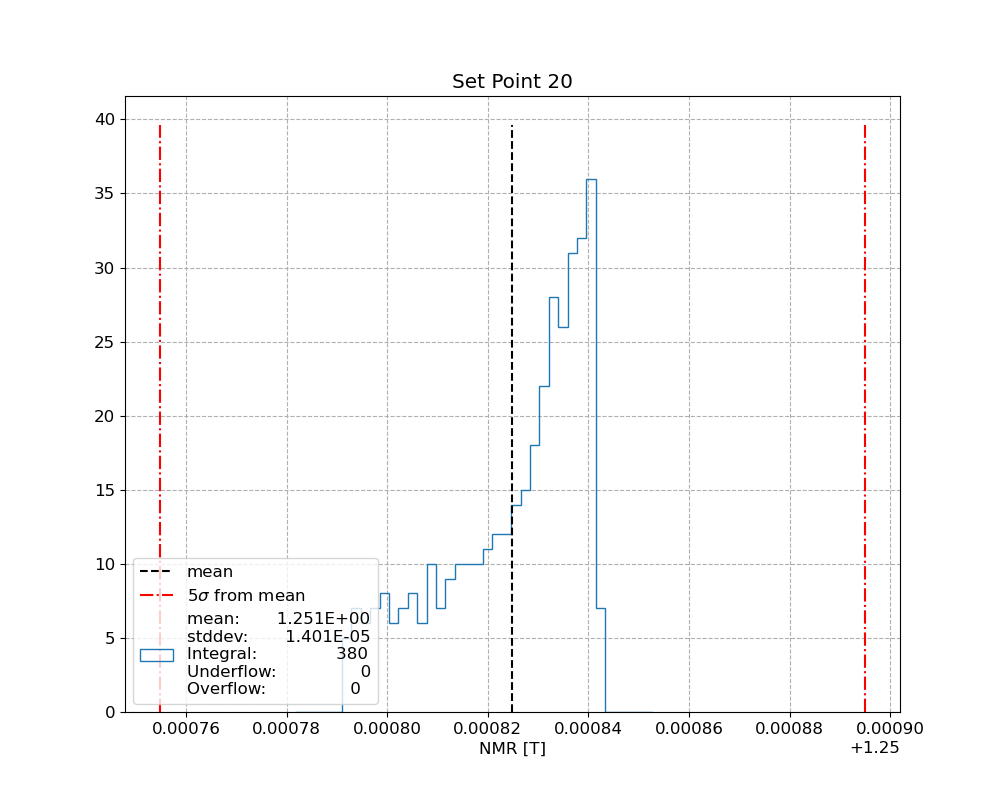

bin size = 0.004907582890208636
3979
mean:       1.160E+00
stddev:       3.681E-02
Integral:              3979
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


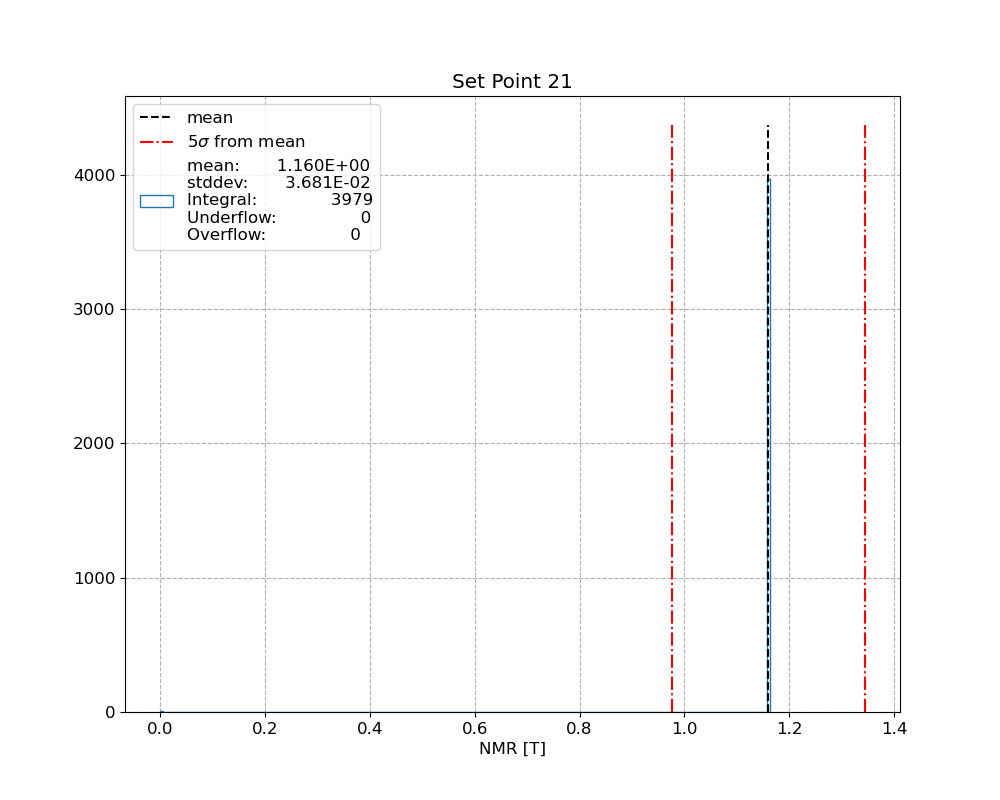

bin size = 2.440430973960446e-06
723
mean:       1.051E+00
stddev:       1.830E-05
Integral:               723
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


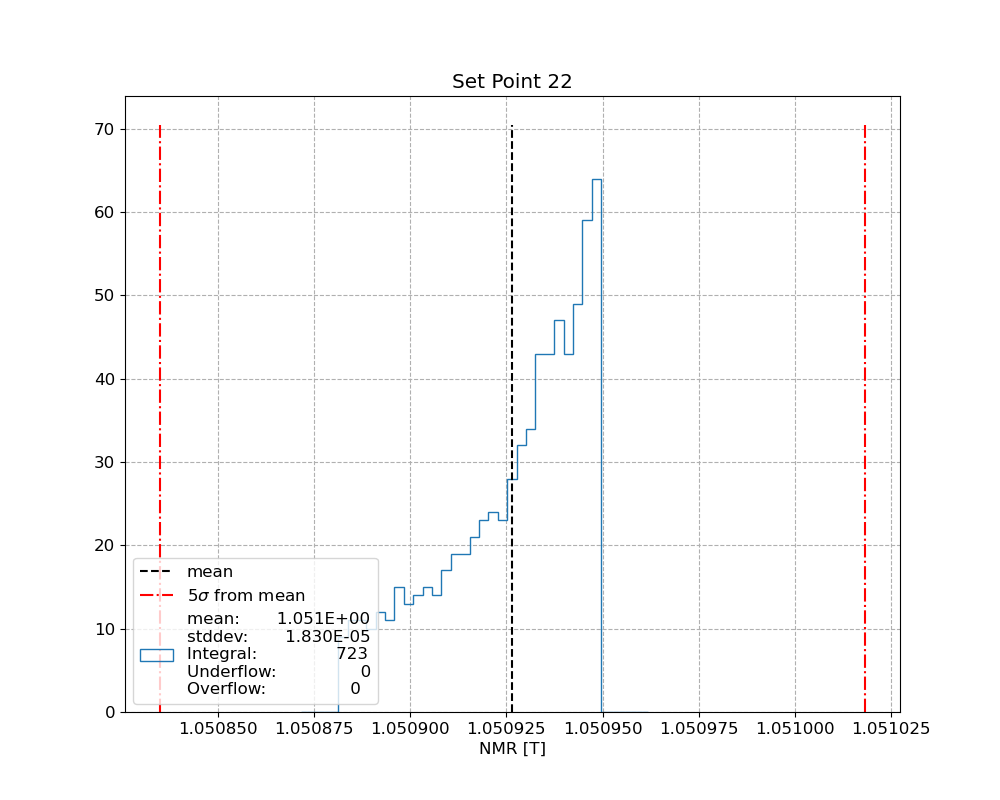

bin size = 0.001242548388752773
28343
mean:       9.057E-01
stddev:       9.319E-03
Integral:             28343
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


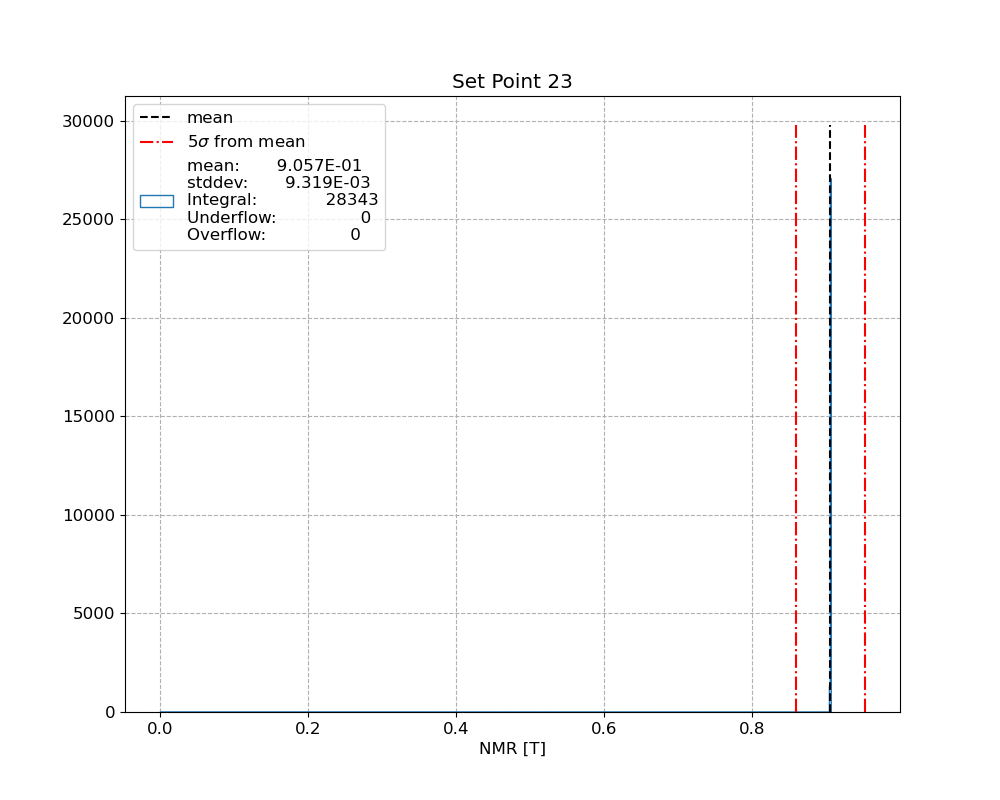

In [131]:
#steps = np.arange(0, 7) # fine
#steps = np.arange(7, 19) # fine
#steps = np.arange(19, 24) # fine
steps = np.arange(0, 24)
for s in steps:
    fig, ax = inspect_col(s, df_time, df_clean, bins_in_sigma=15,
                         nsig=5, ycol='NMR [T]')

- This suggests that we can filter outliers by removing any point s.t. B_NMR > 5 sigma away from mean(B_NMR)
- But should be careful for cases when mean(NMR) < 0.1 (or something like that) -- then leave everything

## Filter Outliers [NMR]
**DONE 2021-04-22 22:33**
- Run twice, filtering points greater than 7$\sigma$ away each time

In [88]:
def filter_outliers(run_num, df_time, df_clean, nsig=5, ycol='NMR [T]'):
    df_t = df_time.iloc[run_num]
    df_ = df_clean.query(f'"{df_t.t0}" < index < "{df_t.tf}"').copy()
#     min_ = df_[ycol].min()
#     max_ = df_[ycol].max()
    std_ = df_[ycol].std()
    mean_ = df_[ycol].mean()
    min_ = mean_ - nsig*std_
    max_ = mean_ + nsig*std_
#     print(len(df_))
    if mean_ > 0.1:
        df_ = df_.query(f'{min_} < `{ycol}` < {max_}').copy()
#     print(len(df_))
    return df_

In [89]:
n = 14
df_ = filter_outliers(n, df_time, df_clean, nsig=5, ycol='NMR [T]')

In [138]:
df_

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1 (new),Coil 2 (old),LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke,...,C50000000D5E473A_Cal_T,6A0000000D61333A_Cal_T,SmarAct_Meas_Angle_1,SmarAct_Meas_Rotation_Angle_1,SmarAct_Meas_Angle_2,SmarAct_Meas_Rotation_Angle_2,run,seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2021-03-09 13:57:45,3/9/2021 1:57:45 PM,224.065327,27.400033,35.483452,35.257240,14.206568,18.014700,18.593485,23.196791,20.238882,...,17.699,18.298,0.001053,0.0,0.001180,0.0,14,1124947.0,312.485278,13.020220
2021-03-09 13:58:45,3/9/2021 1:58:45 PM,224.065327,27.400100,35.488937,35.271206,14.213860,18.018133,18.605360,23.222874,20.239412,...,17.697,18.305,0.001048,0.0,0.001176,0.0,14,1125007.0,312.501944,13.020914
2021-03-09 13:59:45,3/9/2021 1:59:45 PM,224.065383,27.400200,35.444096,35.270634,14.224093,18.018349,18.613585,23.236162,20.239374,...,17.700,18.312,0.001054,0.0,0.001176,0.0,14,1125067.0,312.518611,13.021609
2021-03-09 14:00:45,3/9/2021 2:00:45 PM,224.065270,27.400300,35.441174,35.256867,14.215939,18.012344,18.602945,23.228338,20.241043,...,17.703,18.298,0.001051,0.0,0.001177,0.0,14,1125127.0,312.535278,13.022303
2021-03-09 14:01:45,3/9/2021 2:01:45 PM,224.065213,27.400283,35.431072,35.292511,14.195924,18.008478,18.591305,23.217115,20.242613,...,17.701,18.289,0.001048,0.0,0.001178,0.0,14,1125187.0,312.551944,13.022998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-09 17:28:45,3/9/2021 5:28:45 PM,224.065327,27.407050,35.440525,35.346859,14.282669,18.076462,18.682955,23.293873,20.457270,...,17.725,18.346,0.001036,0.0,0.001178,0.0,14,1137607.0,316.001944,13.166748
2021-03-09 17:29:45,3/9/2021 5:29:45 PM,224.065440,27.407217,35.445396,35.324726,14.286609,18.089571,18.710670,23.284122,20.458193,...,17.723,18.351,0.001033,0.0,0.001174,0.0,14,1137667.0,316.018611,13.167442
2021-03-09 17:30:45,3/9/2021 5:30:45 PM,224.065440,27.407400,35.476173,35.322514,14.293862,18.090239,18.694456,23.292713,20.457622,...,17.719,18.348,0.001035,0.0,0.001181,0.0,14,1137727.0,316.035278,13.168137


bin size = 7.379177146883936e-07
215
mean:       1.162E+00
stddev:       5.534E-06
Integral:               215
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


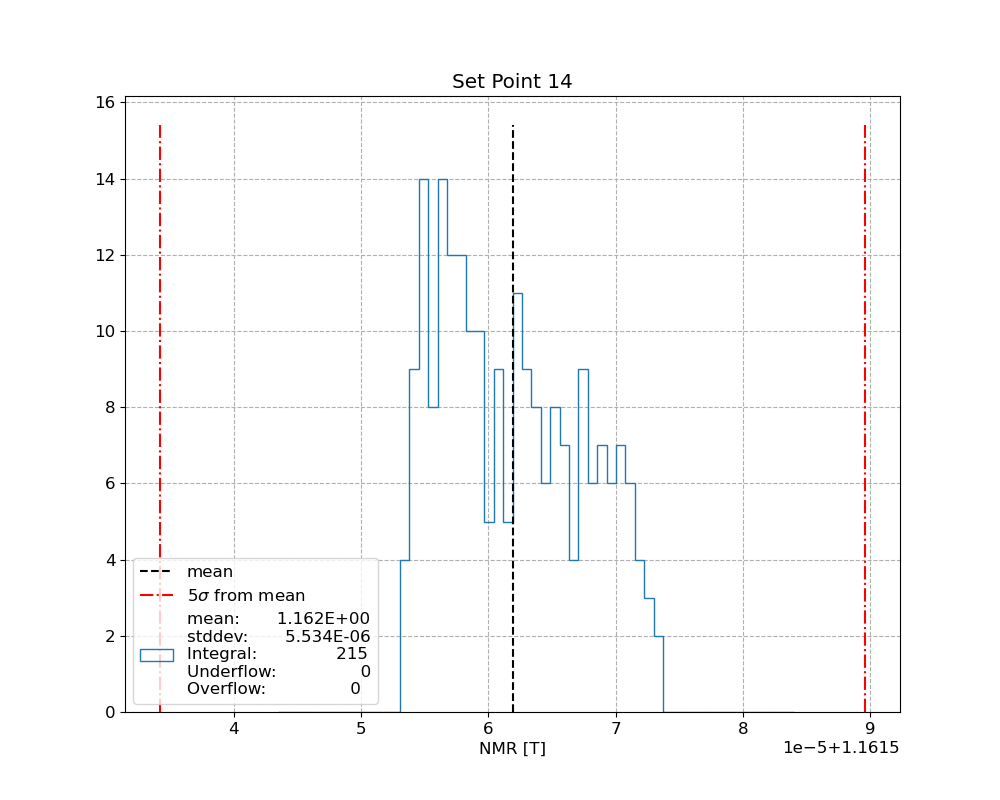

In [139]:
fig, ax = inspect_col(n, df_time, df_, bins_in_sigma=15, nsig=5, ycol='NMR [T]')

In [94]:
# filter bad NMR
dfs = []

bin size = 2.3928890482437685e-06
1268
mean:       1.209E+00
stddev:       1.795E-05
Integral:              1268
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


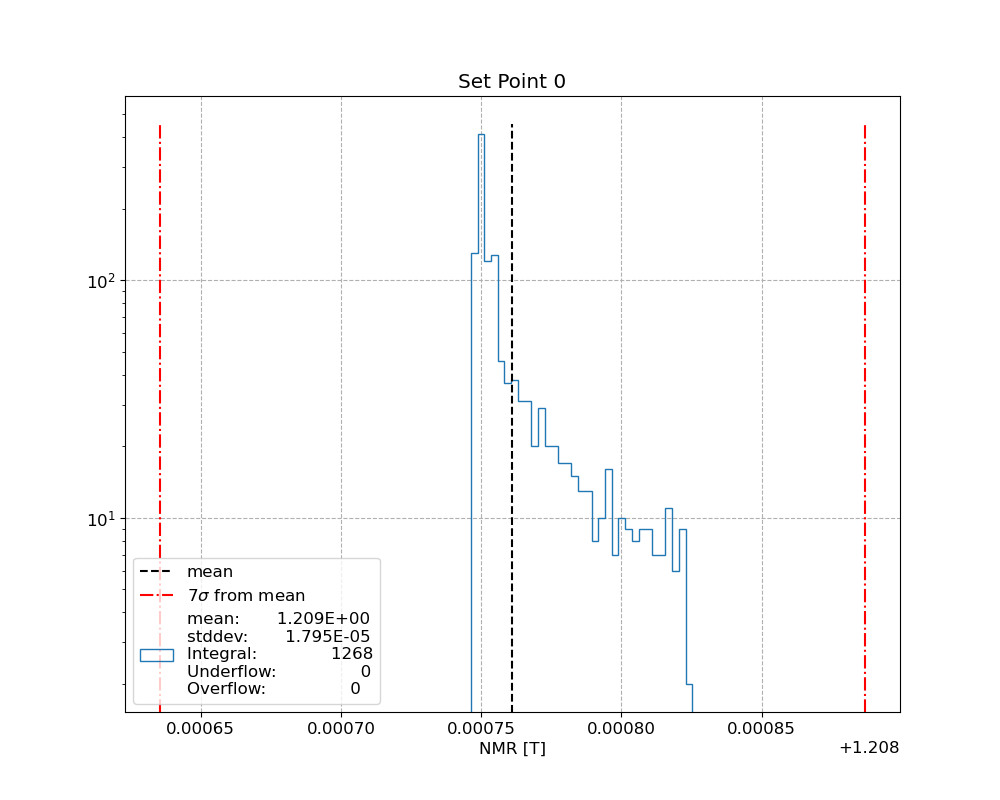

bin size = 2.3928890482437685e-06
1268
mean:       1.209E+00
stddev:       1.795E-05
Integral:              1268
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


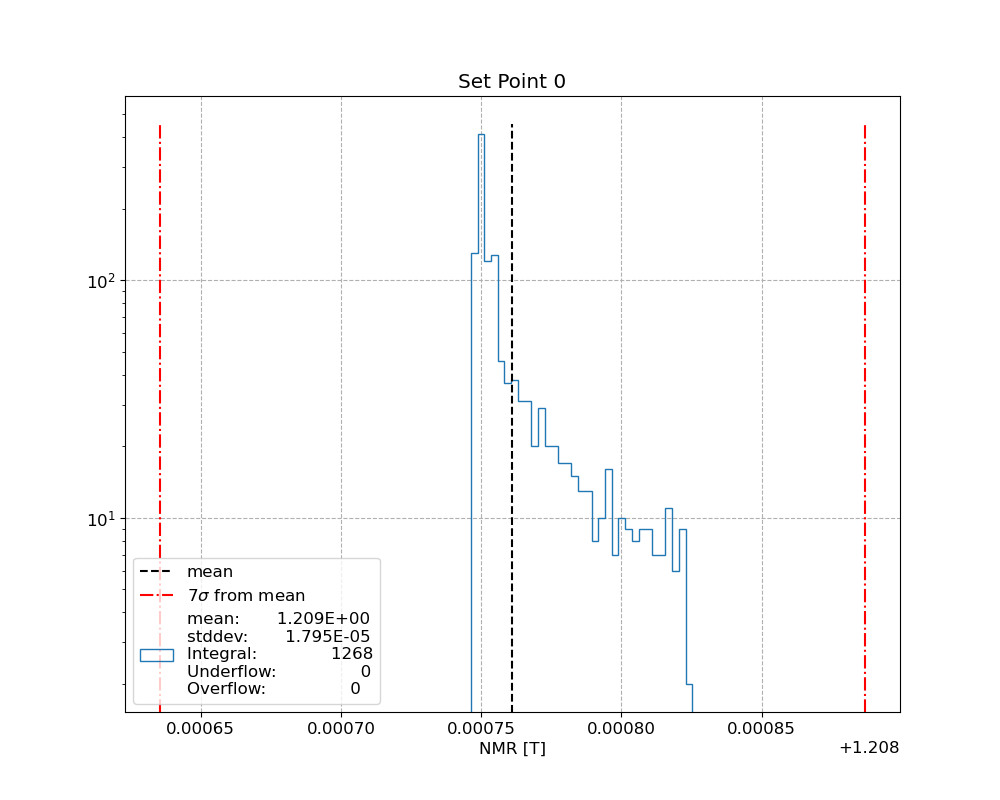

bin size = 9.068487484204034e-07
1289
mean:       1.164E+00
stddev:       6.801E-06
Integral:              1289
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


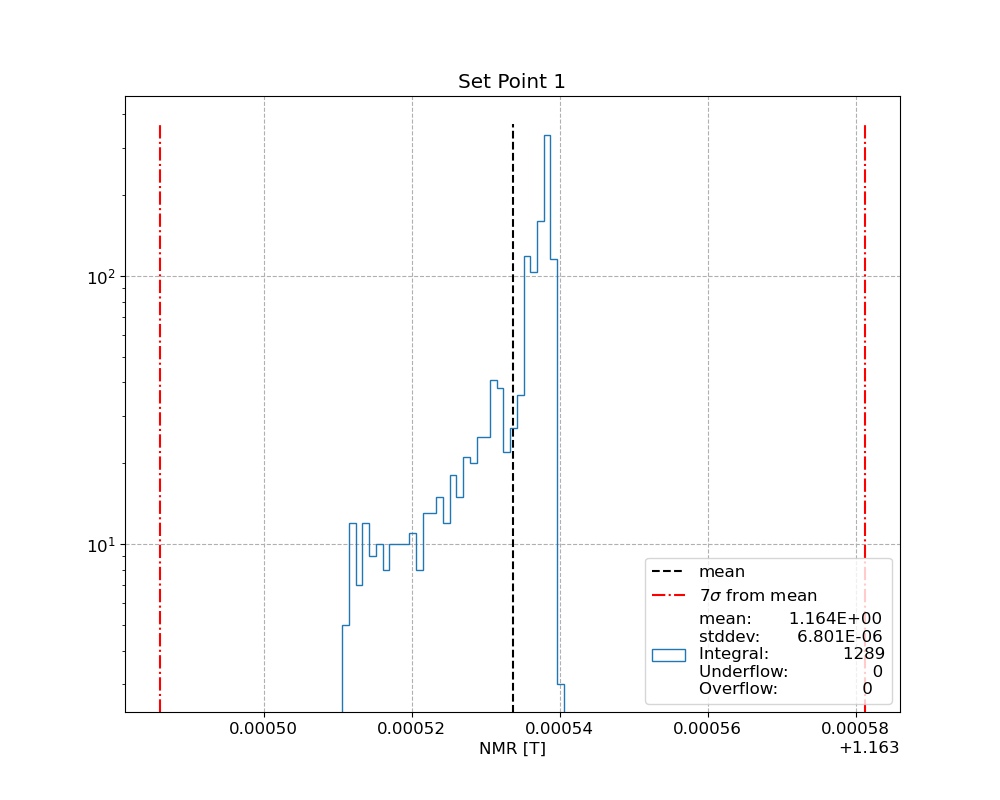

bin size = 9.068487484204034e-07
1289
mean:       1.164E+00
stddev:       6.801E-06
Integral:              1289
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


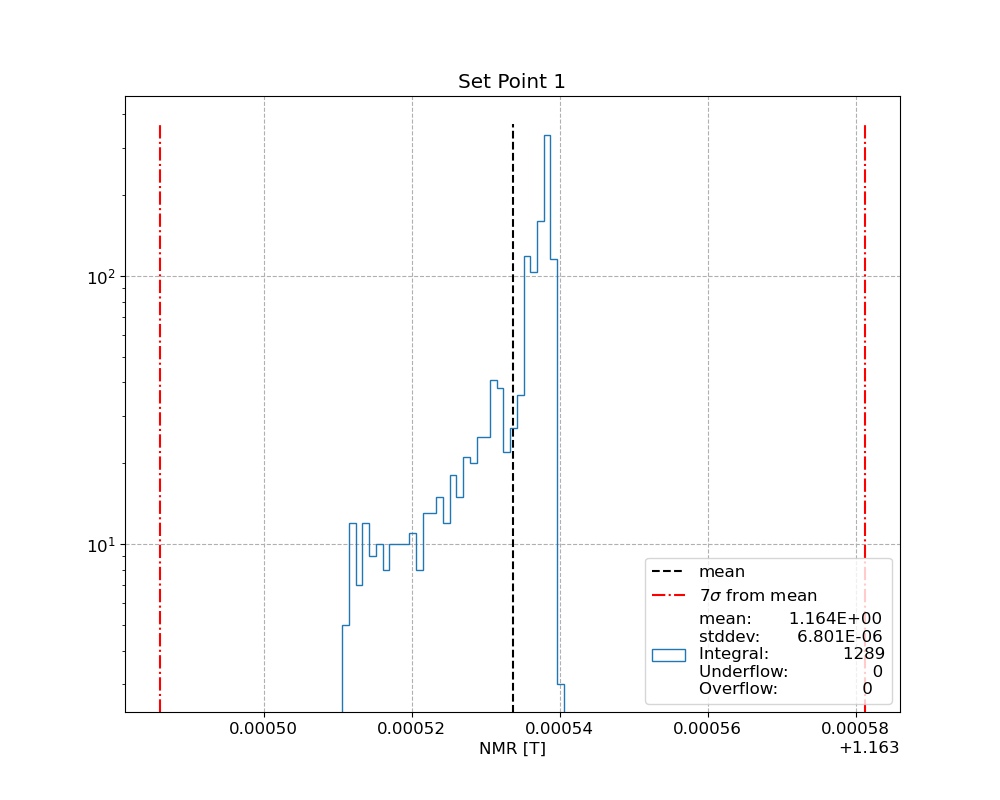

bin size = 8.329698138506746e-07
3825
mean:       1.208E+00
stddev:       6.247E-06
Integral:              3825
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


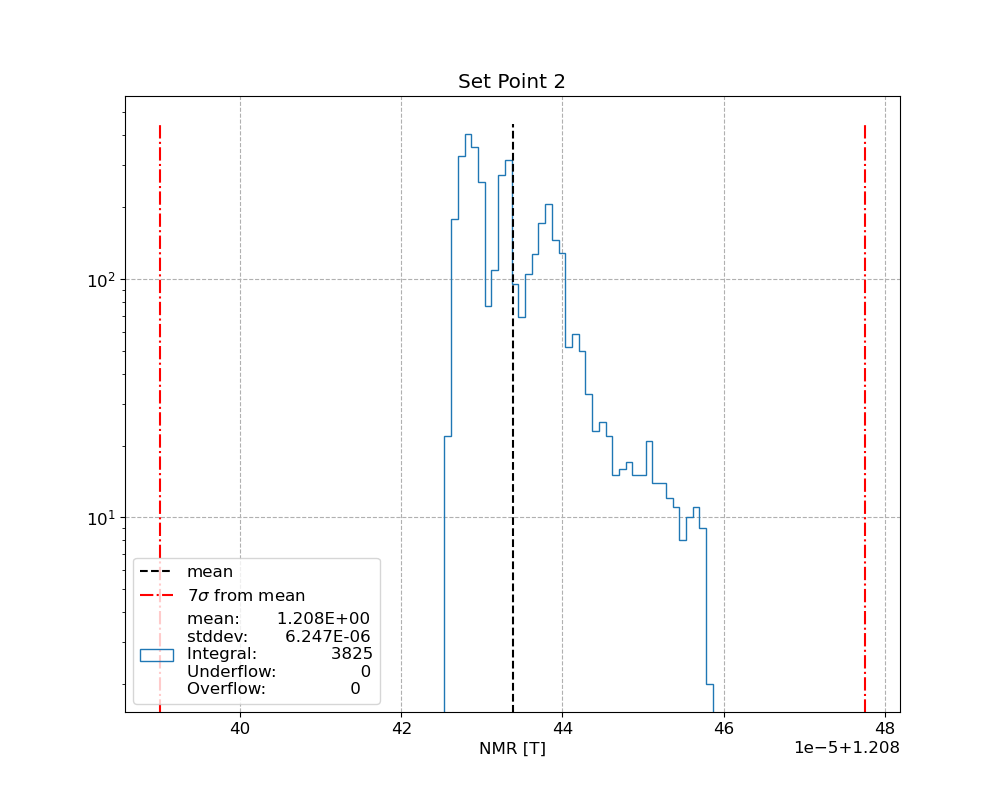

bin size = 8.329698138506746e-07
3825
mean:       1.208E+00
stddev:       6.247E-06
Integral:              3825
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


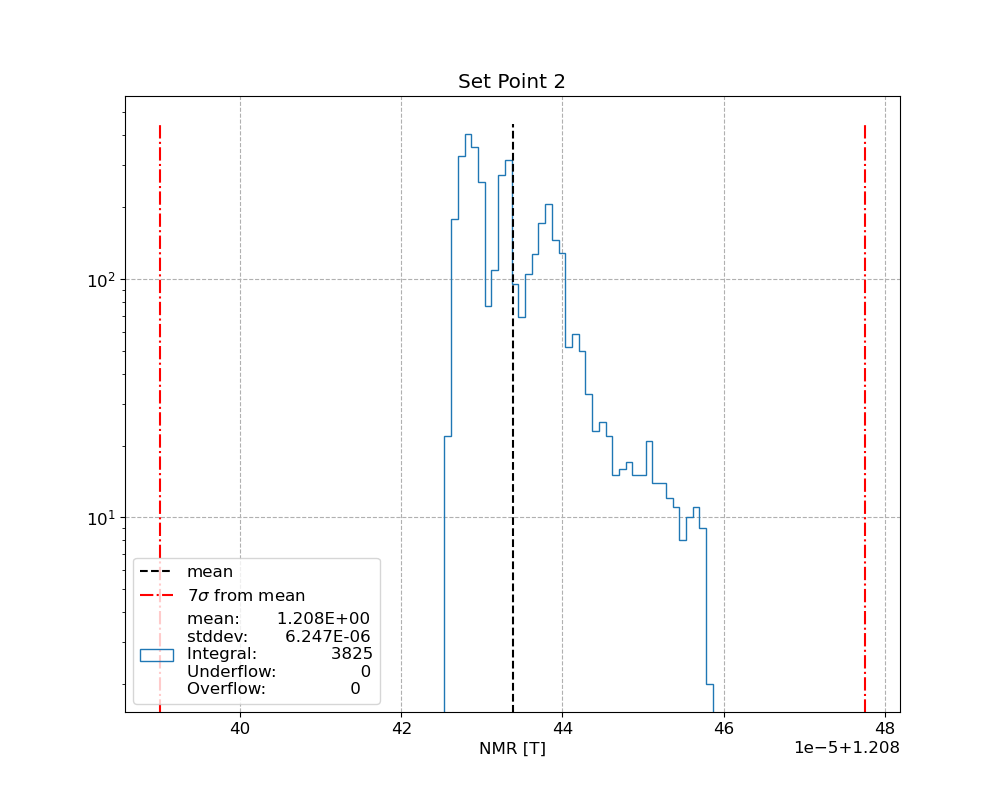

bin size = 0.0
207
mean:       0.000E+00
stddev:       0.000E+00
Integral:               207
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


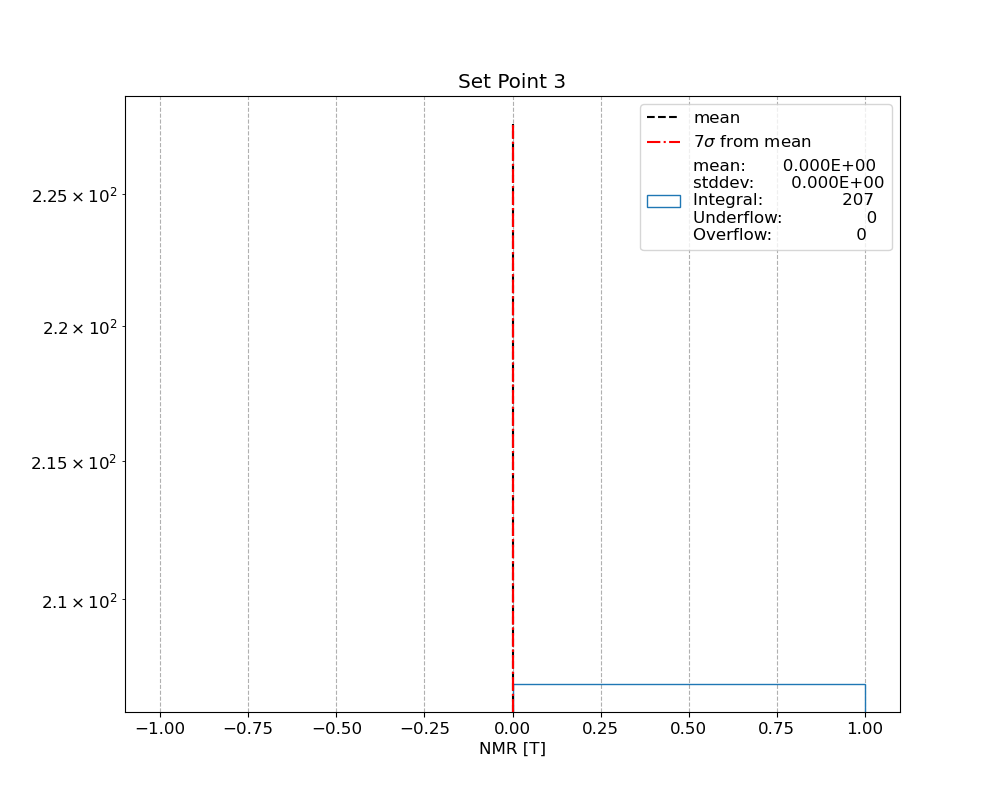

bin size = 0.0
207
mean:       0.000E+00
stddev:       0.000E+00
Integral:               207
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


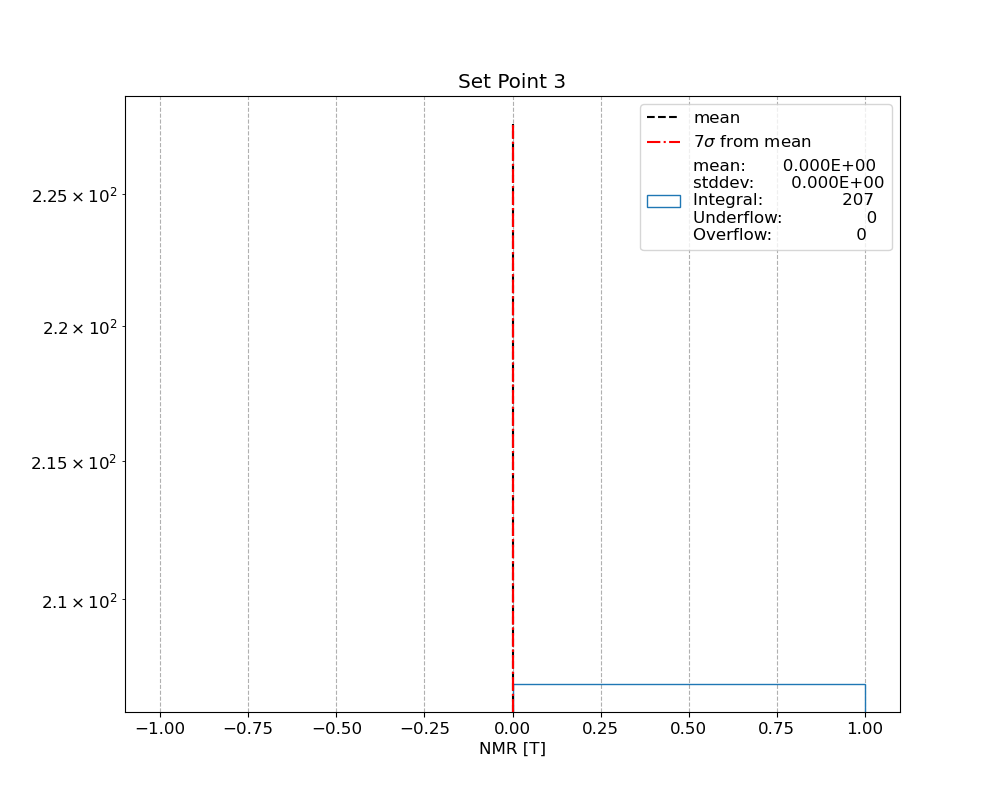

bin size = 0.0
717
mean:       0.000E+00
stddev:       0.000E+00
Integral:               717
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


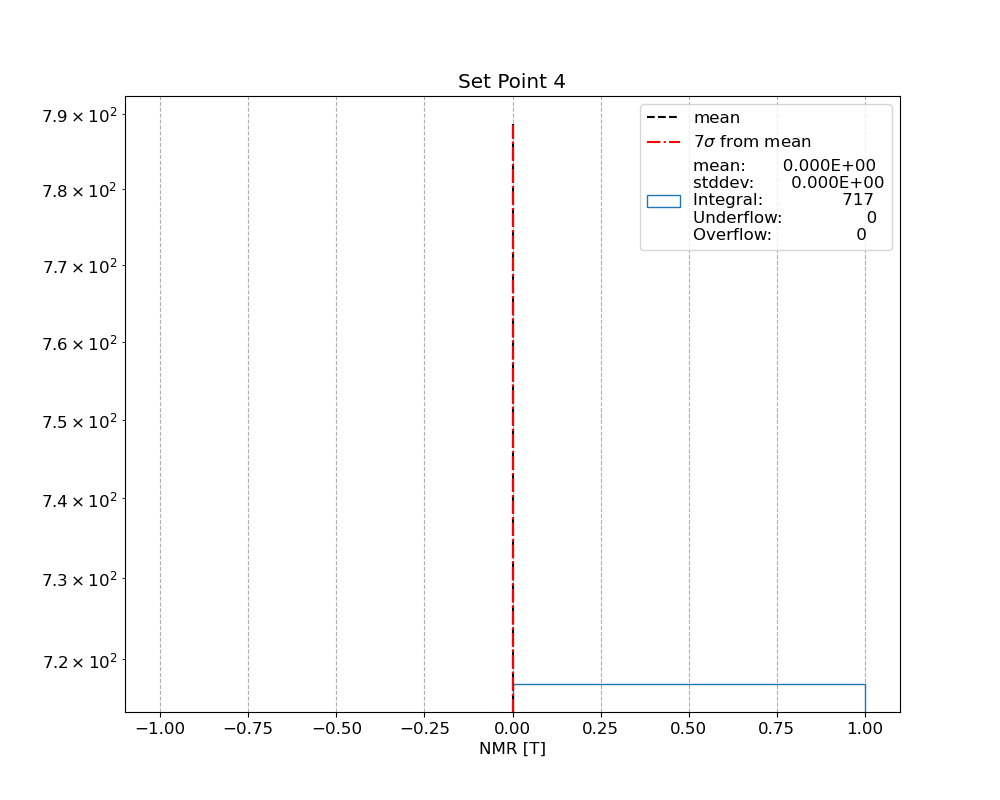

bin size = 0.0
717
mean:       0.000E+00
stddev:       0.000E+00
Integral:               717
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


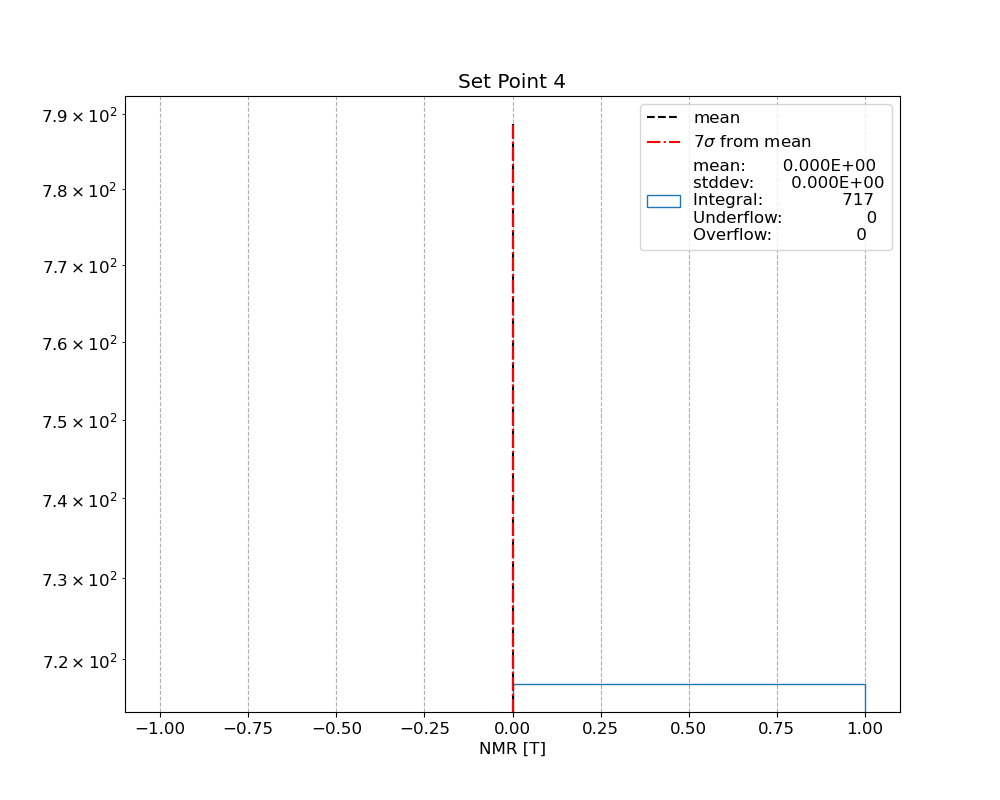

bin size = 0.0
236
mean:       0.000E+00
stddev:       0.000E+00
Integral:               236
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


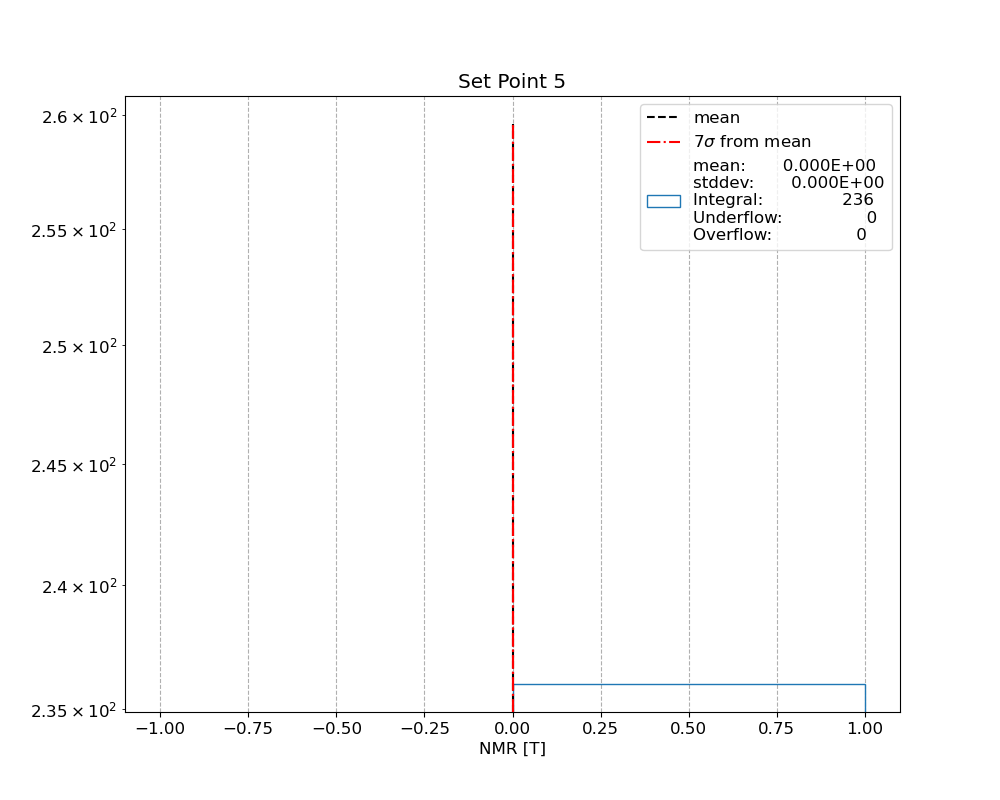

bin size = 0.0
236
mean:       0.000E+00
stddev:       0.000E+00
Integral:               236
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


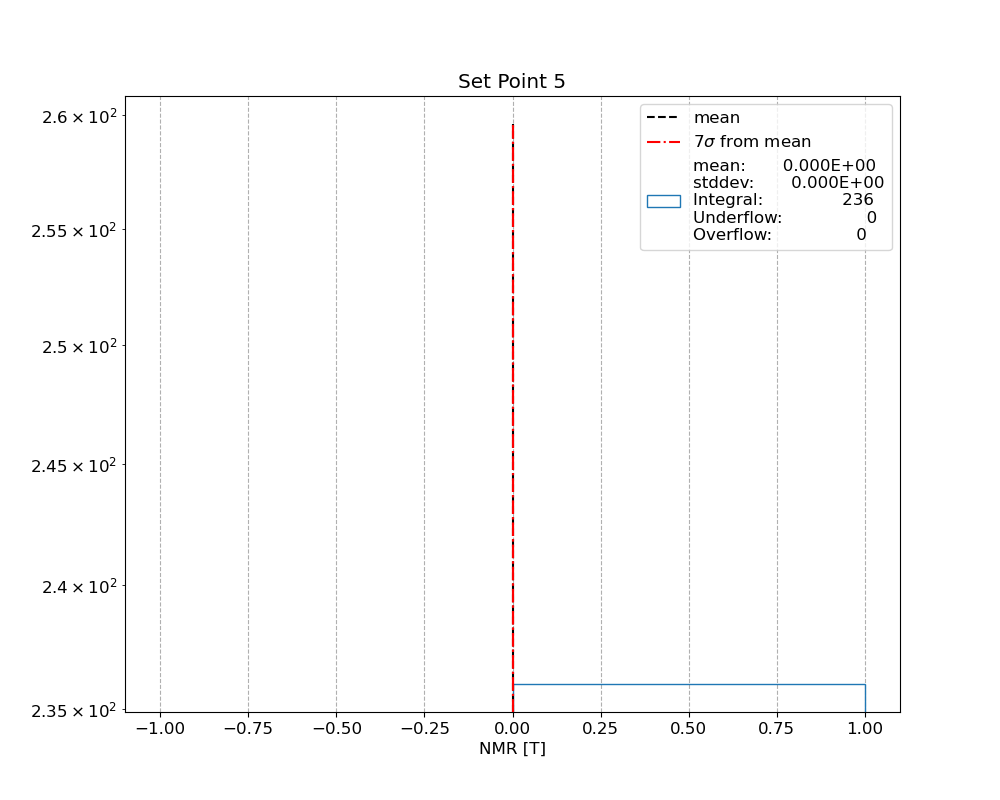

bin size = 0.0
737
mean:       0.000E+00
stddev:       0.000E+00
Integral:               737
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


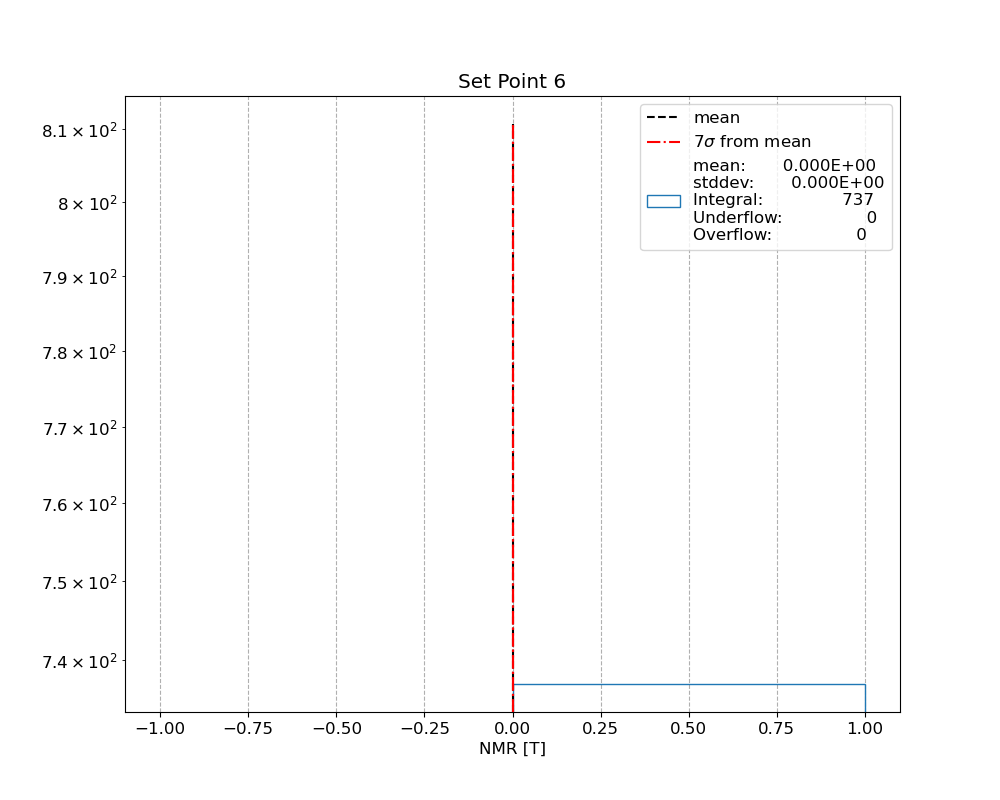

bin size = 0.0
737
mean:       0.000E+00
stddev:       0.000E+00
Integral:               737
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


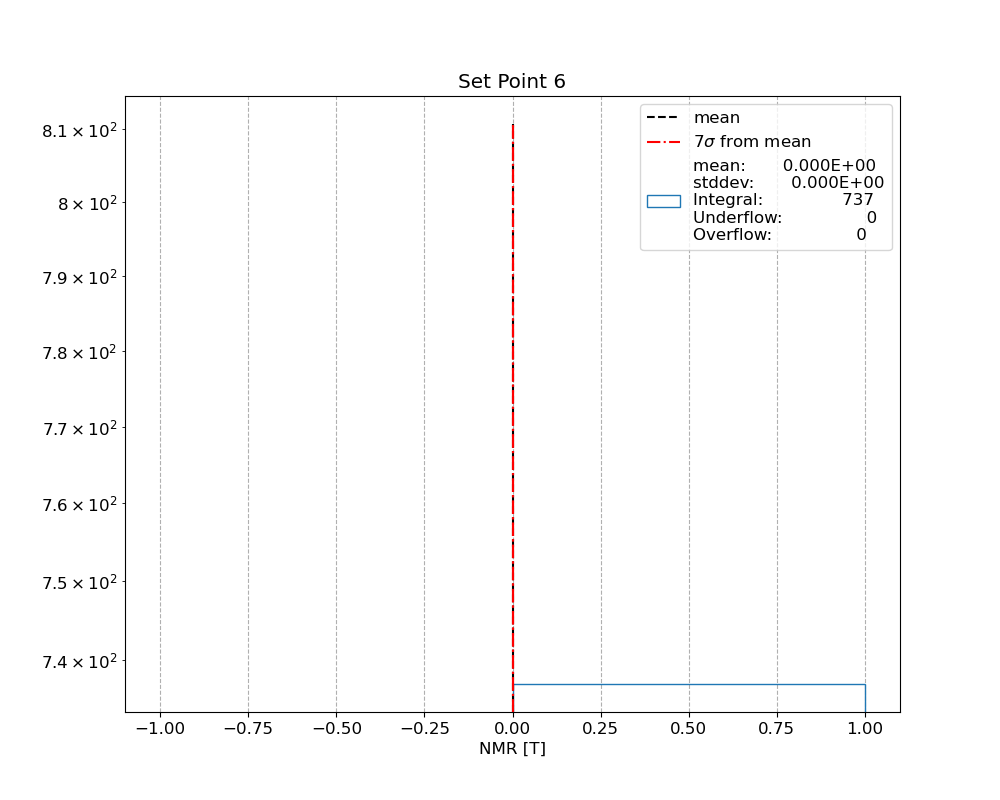

bin size = 4.44007290914976e-08
216
mean:       7.340E-01
stddev:       3.330E-07
Integral:               216
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


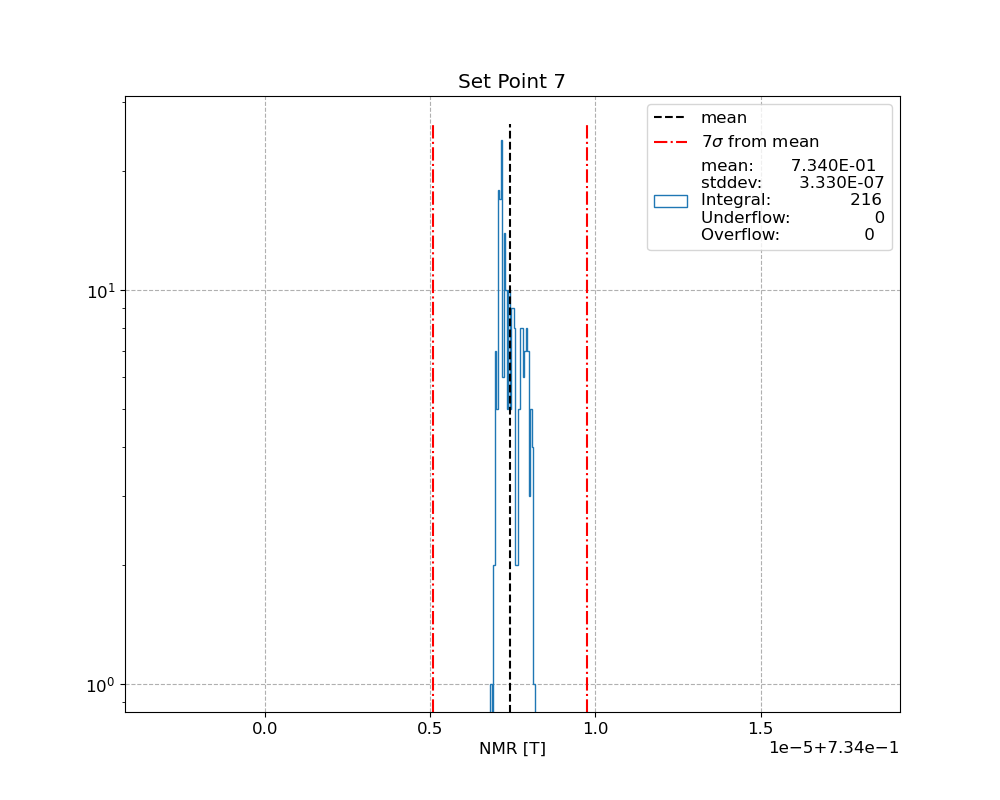

bin size = 4.44007290914976e-08
216
mean:       7.340E-01
stddev:       3.330E-07
Integral:               216
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


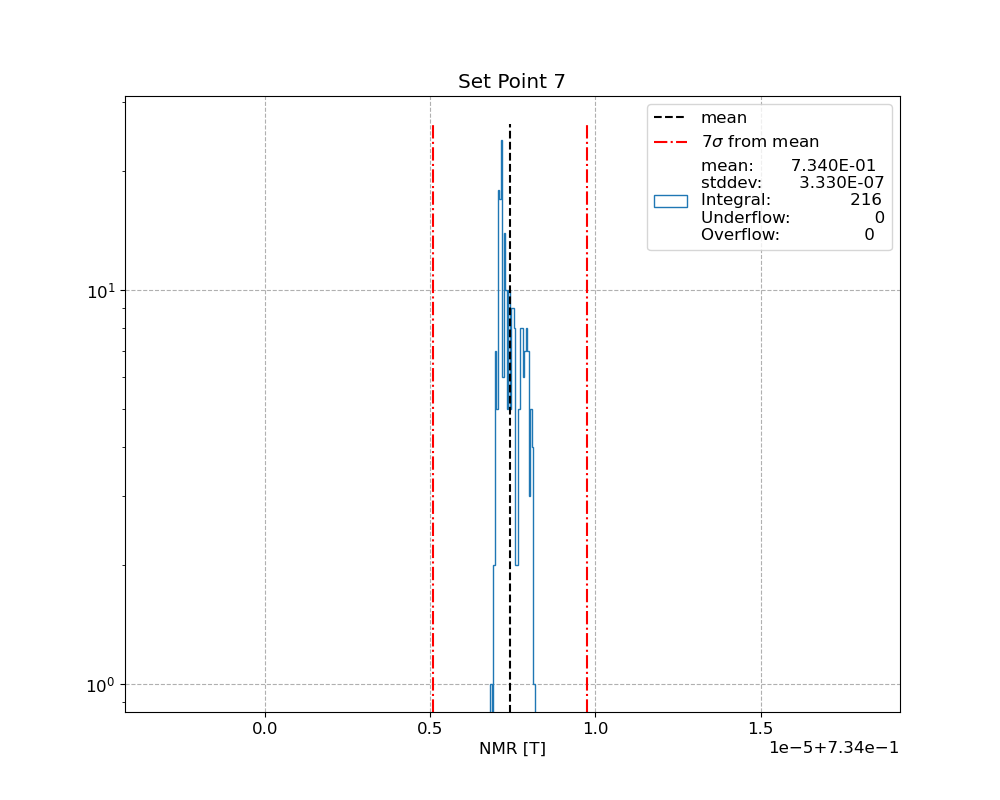

bin size = 5.979913056977691e-08
719
mean:       8.224E-01
stddev:       4.485E-07
Integral:               719
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


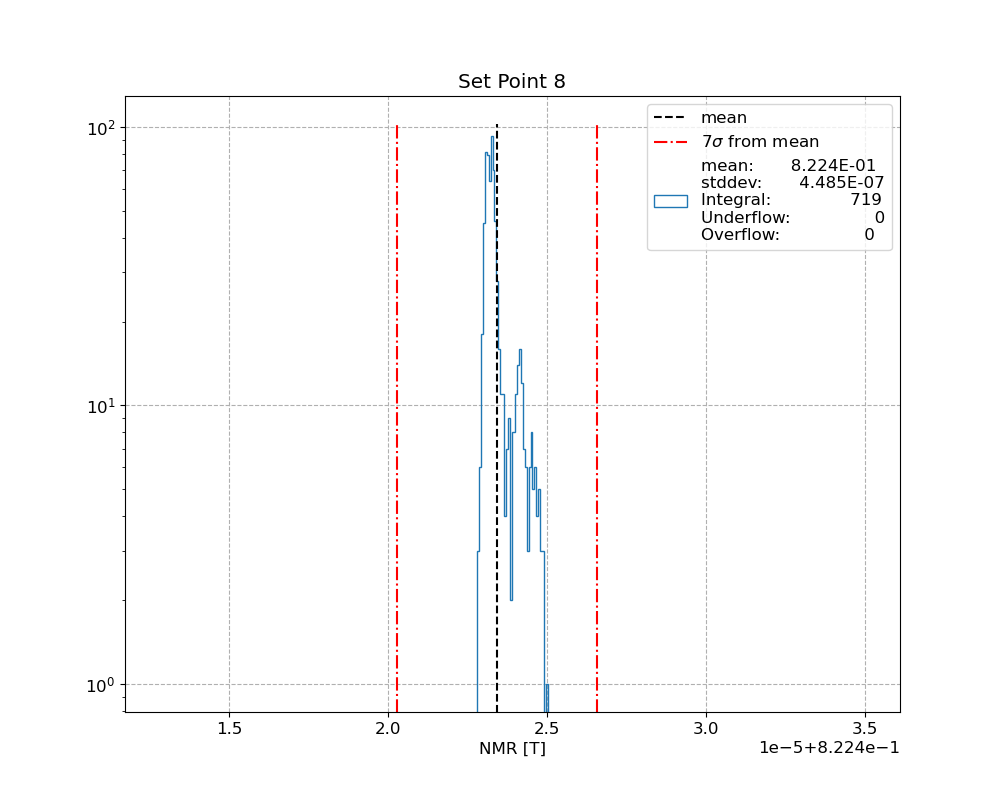

bin size = 5.979913056977691e-08
719
mean:       8.224E-01
stddev:       4.485E-07
Integral:               719
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


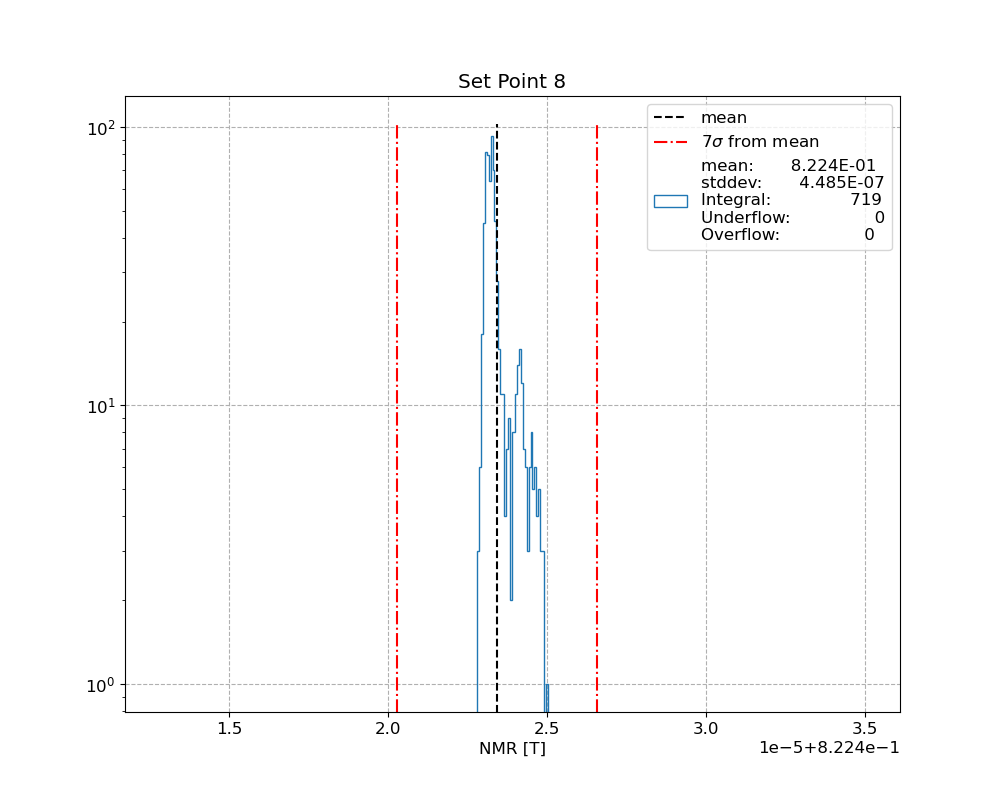

bin size = 9.83603560949877e-08
208
mean:       9.067E-01
stddev:       7.377E-07
Integral:               208
Underflow:                0
Overflow:                0


<ipython-input-92-62565034b5f4>:34: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



<IPython.core.display.Javascript object>


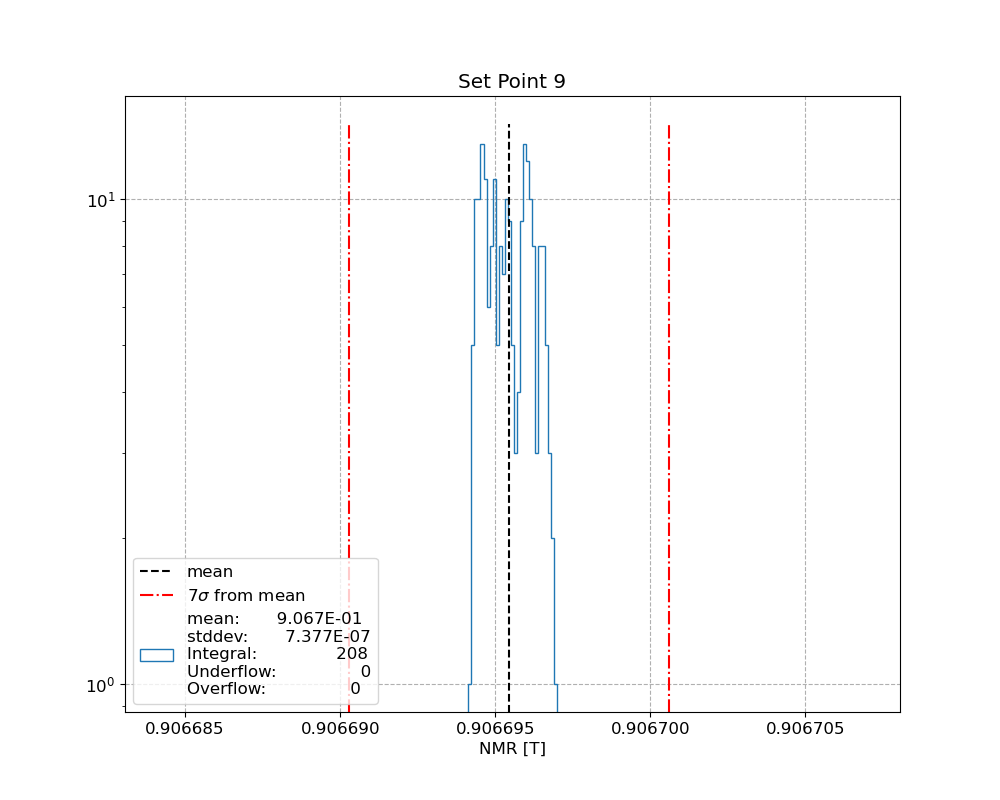

bin size = 9.83603560949877e-08
208
mean:       9.067E-01
stddev:       7.377E-07
Integral:               208
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


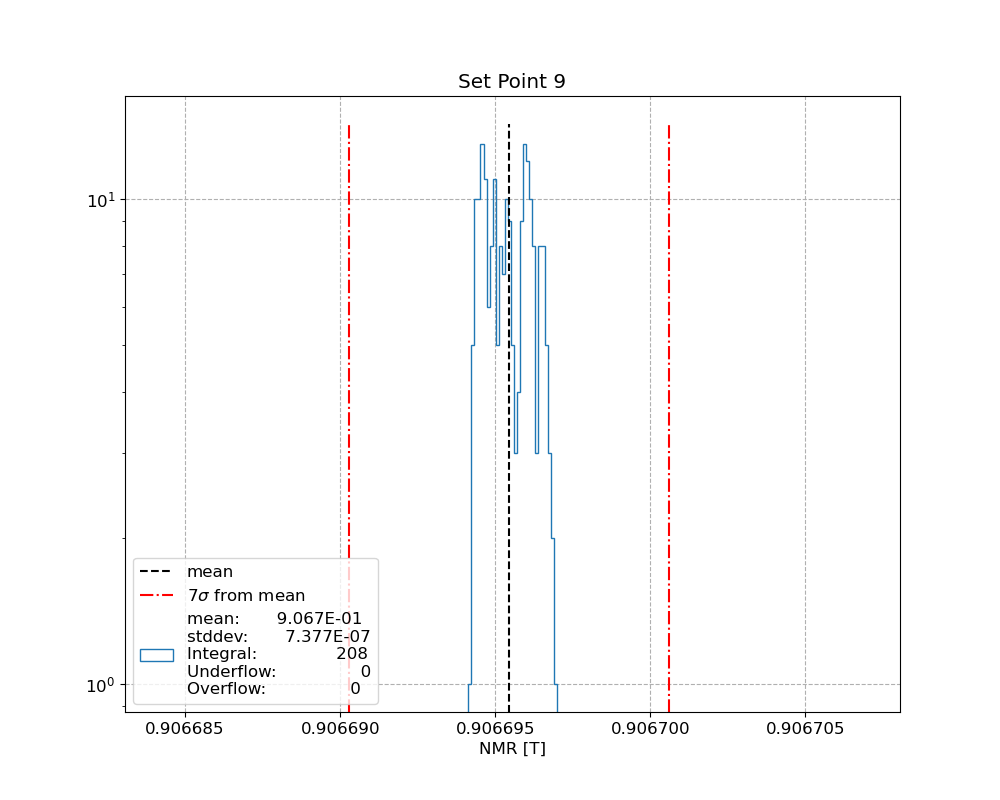

bin size = 2.845060471235138e-07
752
mean:       9.840E-01
stddev:       2.134E-06
Integral:               752
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


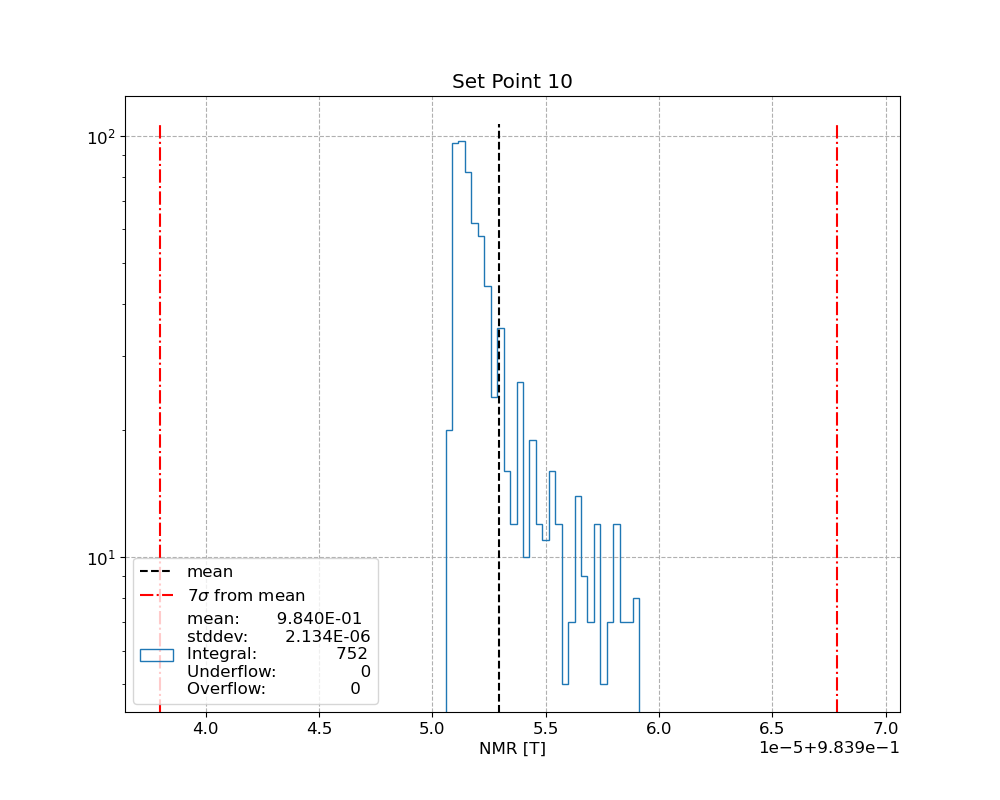

bin size = 2.845060471235138e-07
752
mean:       9.840E-01
stddev:       2.134E-06
Integral:               752
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


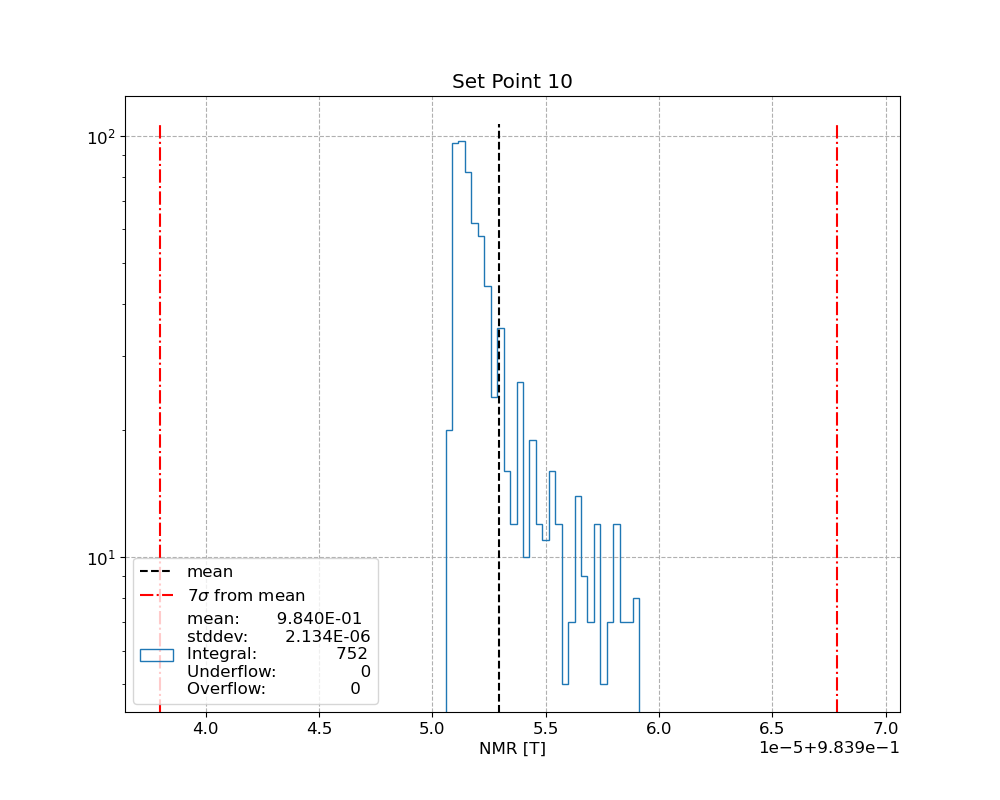

bin size = 2.2397208371537382e-07
105
mean:       1.051E+00
stddev:       1.680E-06
Integral:               105
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


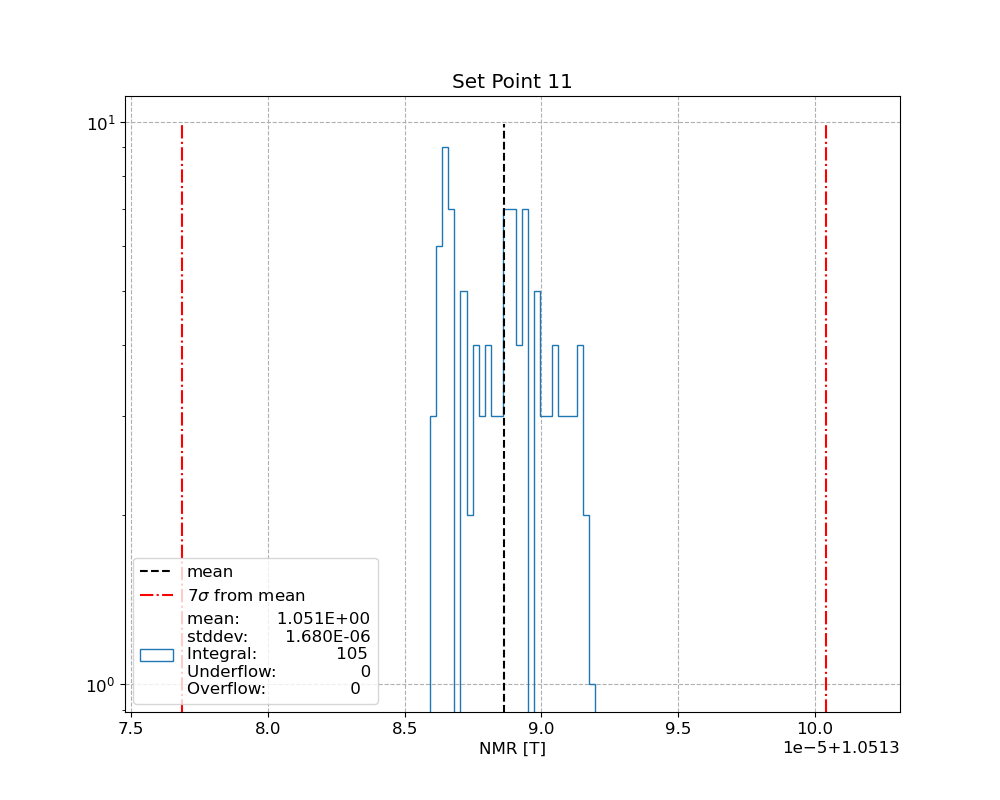

bin size = 2.2397208371537382e-07
105
mean:       1.051E+00
stddev:       1.680E-06
Integral:               105
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


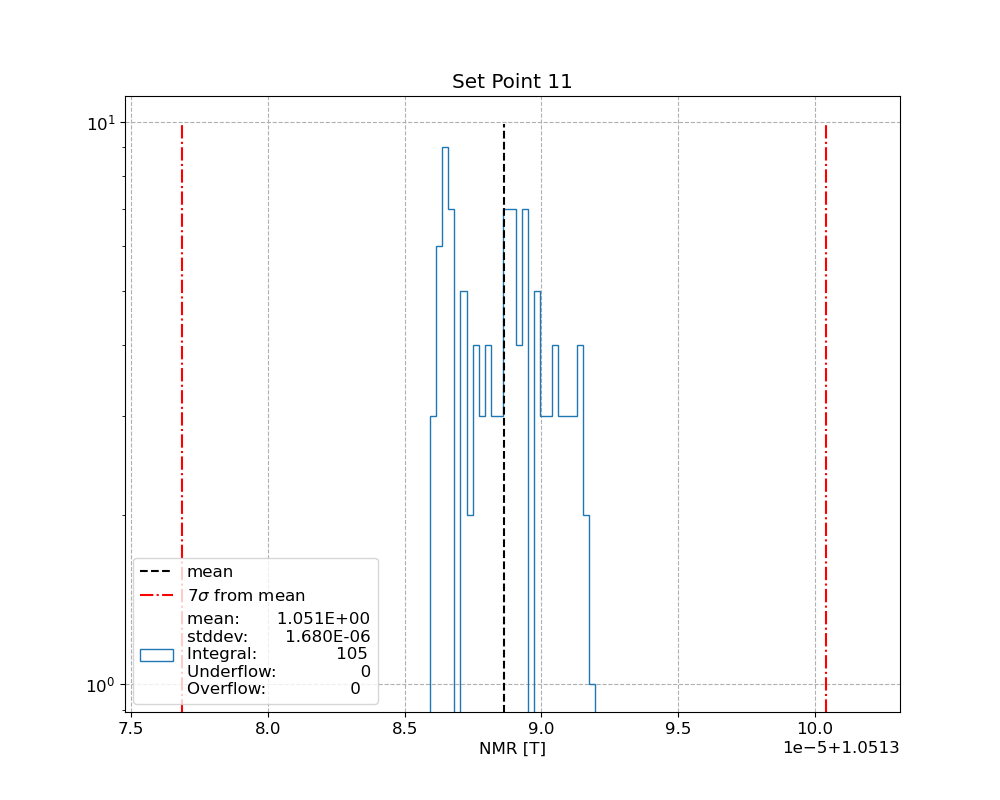

bin size = 2.1195488542749954e-06
330
mean:       1.050E+00
stddev:       1.590E-05
Integral:               330
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


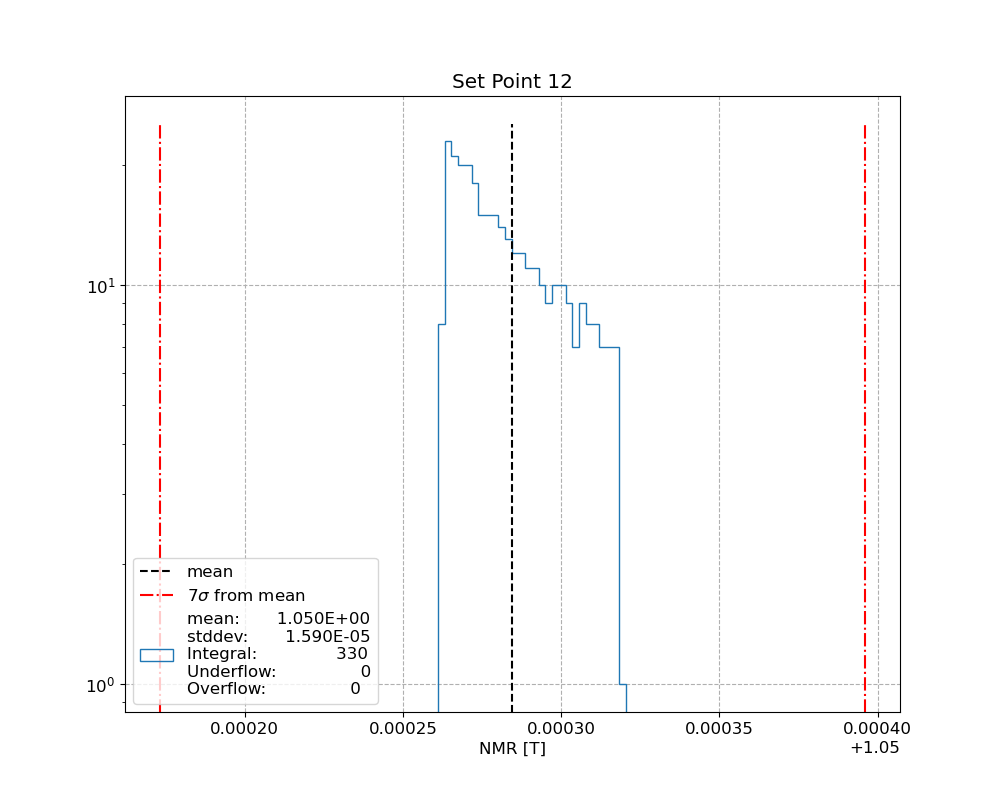

bin size = 2.1195488542749954e-06
330
mean:       1.050E+00
stddev:       1.590E-05
Integral:               330
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


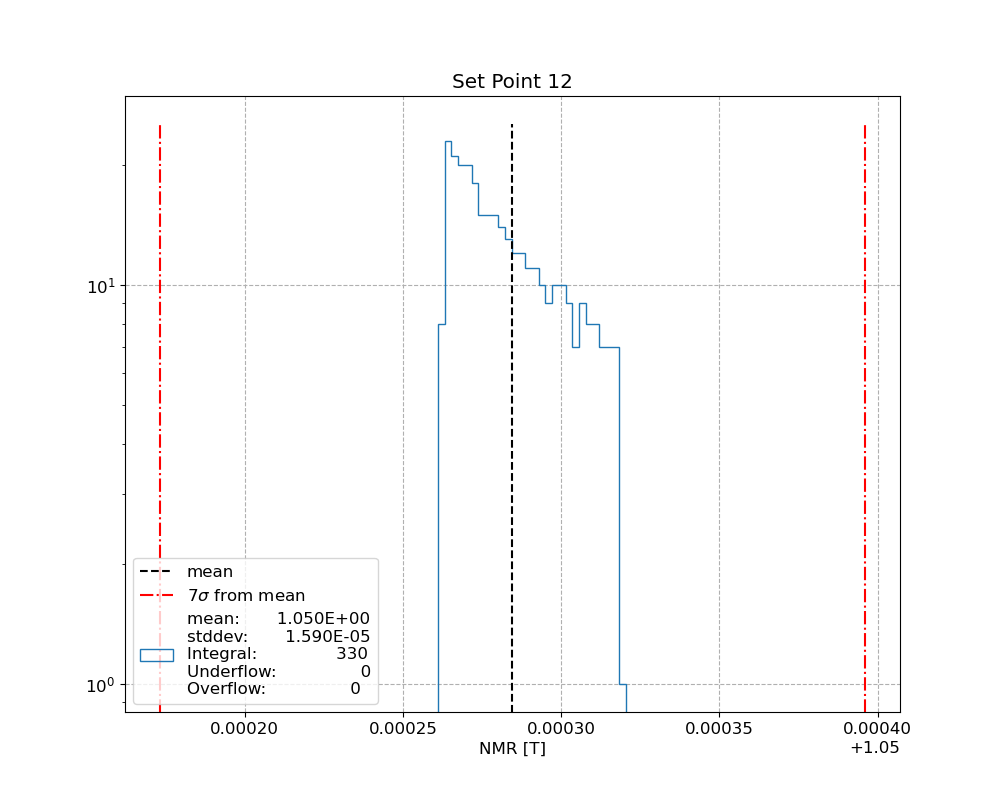

bin size = 1.249663743287432e-06
680
mean:       1.110E+00
stddev:       9.372E-06
Integral:               680
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


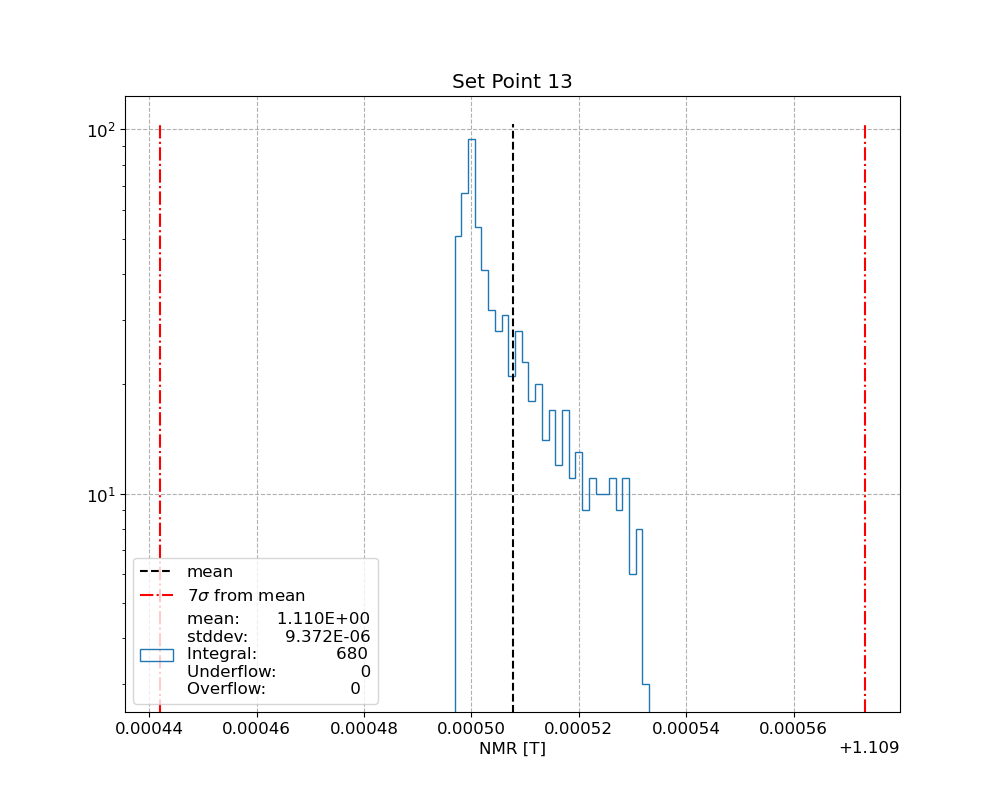

bin size = 1.249663743287432e-06
680
mean:       1.110E+00
stddev:       9.372E-06
Integral:               680
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


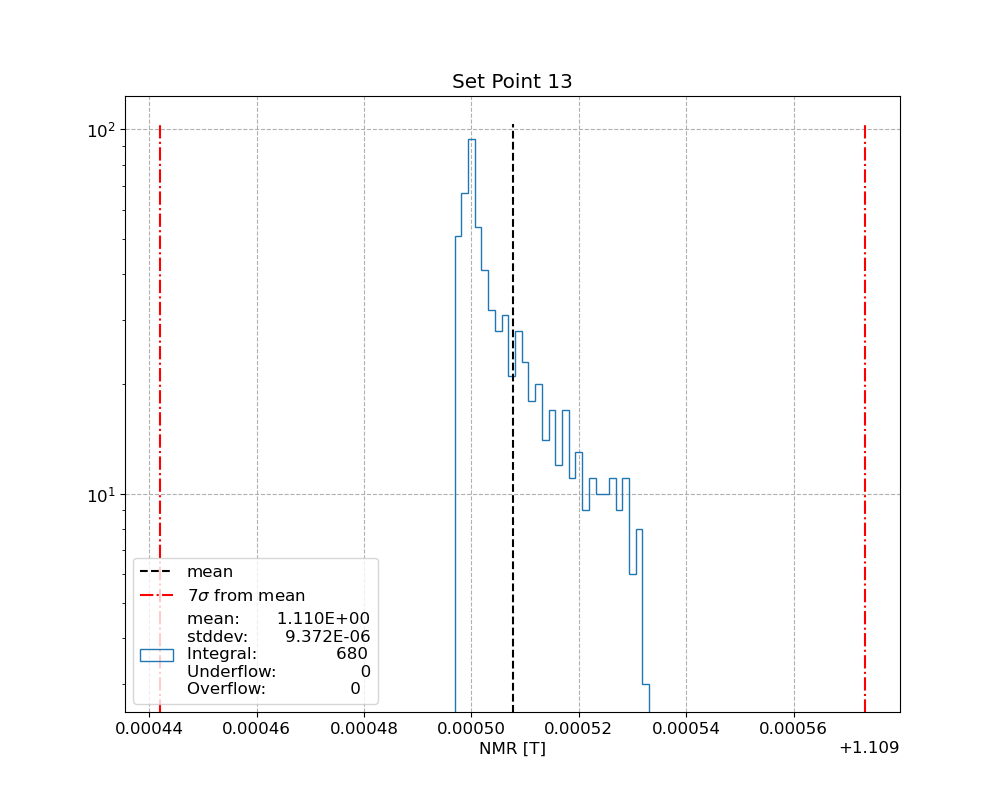

bin size = 0.0021074916670464233
216
mean:       1.160E+00
stddev:       1.581E-02
Integral:               216
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


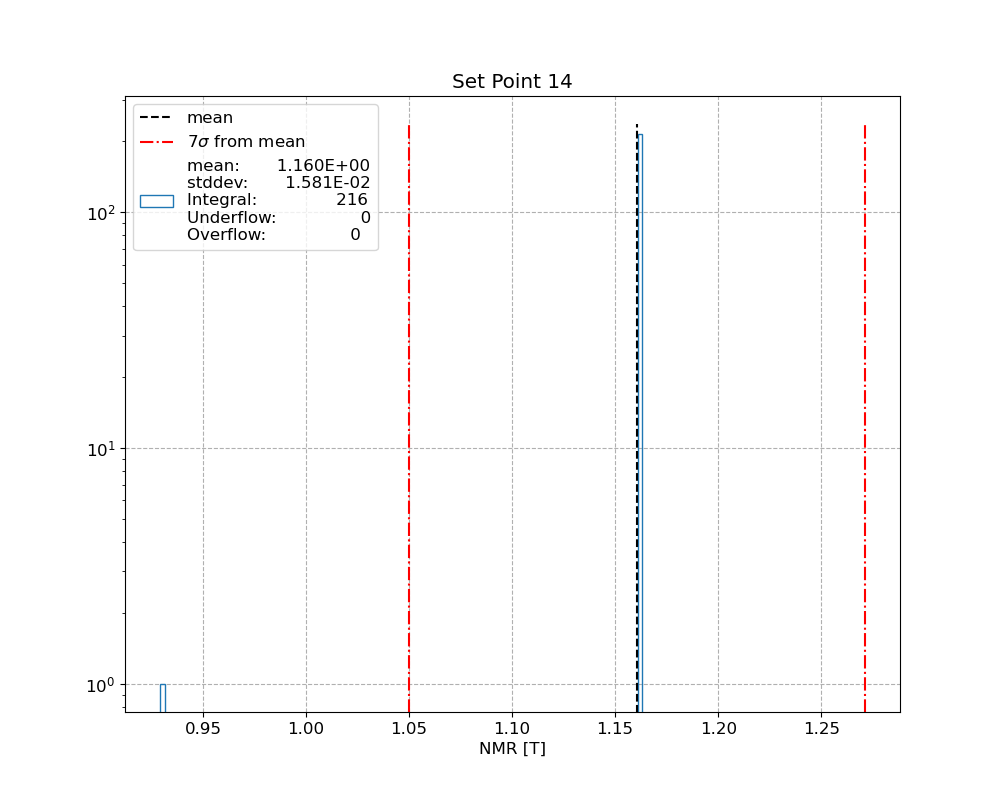

bin size = 7.379177146883936e-07
215
mean:       1.162E+00
stddev:       5.534E-06
Integral:               215
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


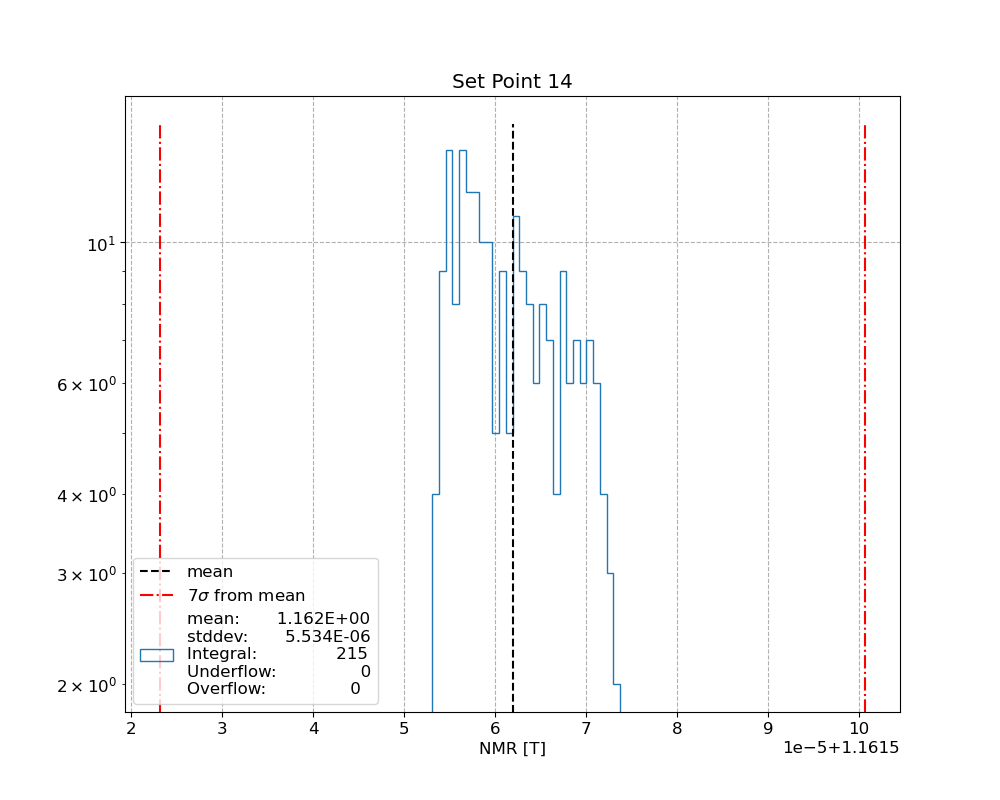

bin size = 1.6148447254298291e-06
682
mean:       1.209E+00
stddev:       1.211E-05
Integral:               682
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


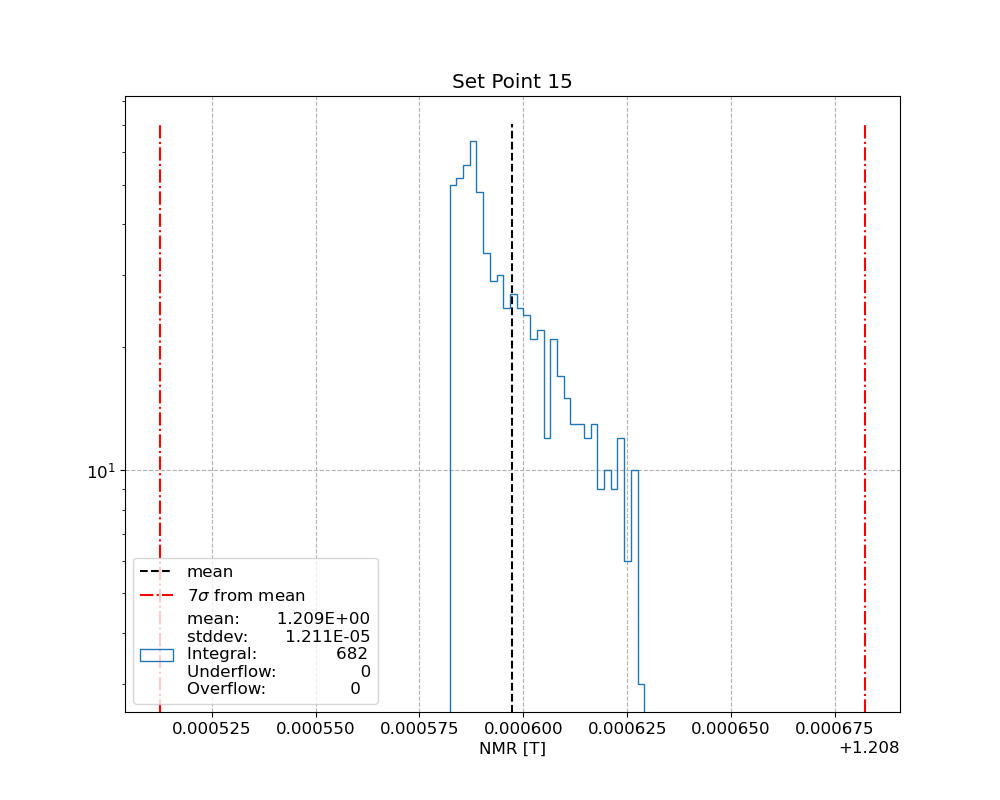

bin size = 1.6148447254298291e-06
682
mean:       1.209E+00
stddev:       1.211E-05
Integral:               682
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


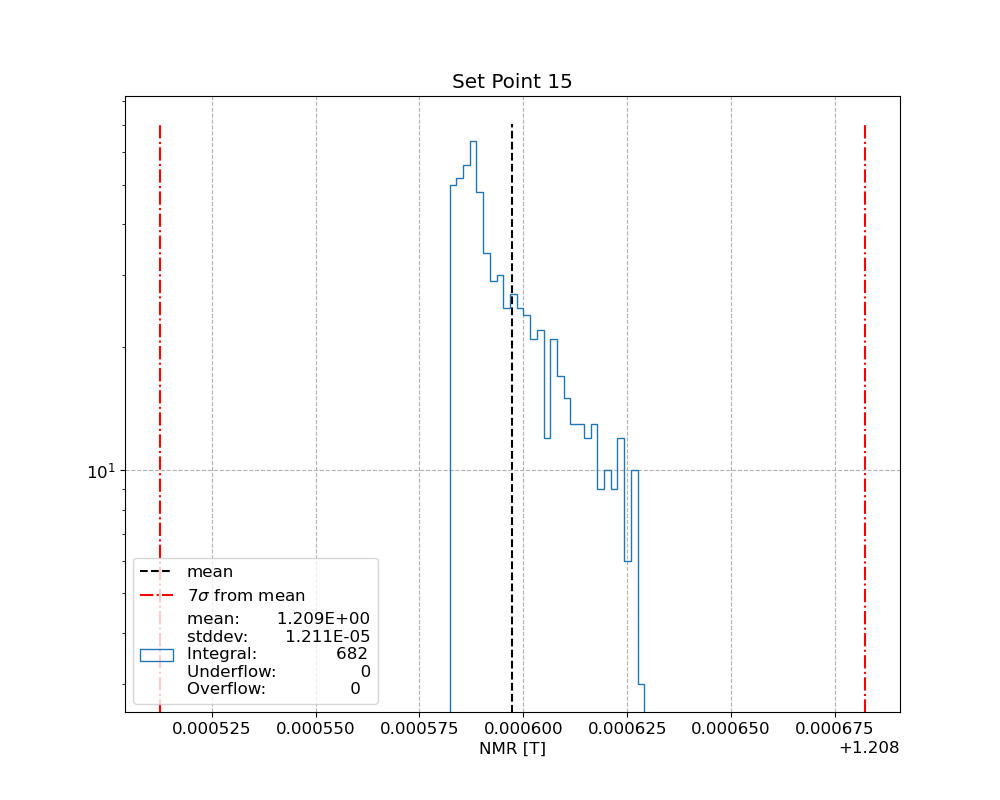

bin size = 1.3993194060142418e-06
255
mean:       1.251E+00
stddev:       1.049E-05
Integral:               255
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


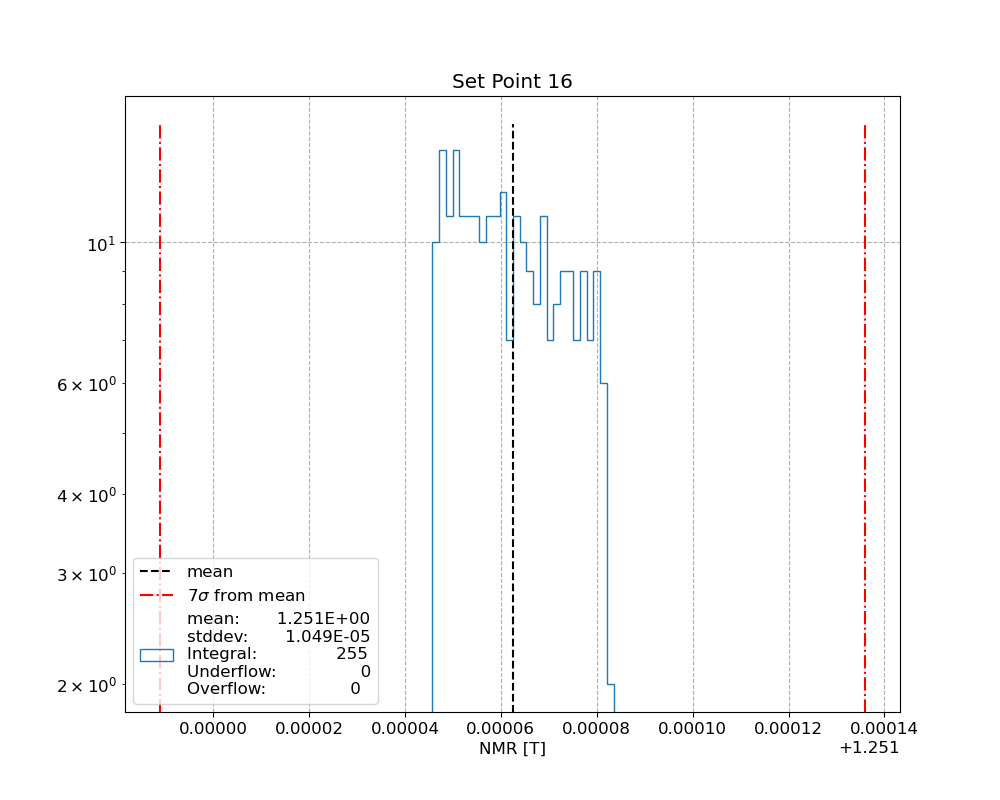

bin size = 1.3993194060142418e-06
255
mean:       1.251E+00
stddev:       1.049E-05
Integral:               255
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


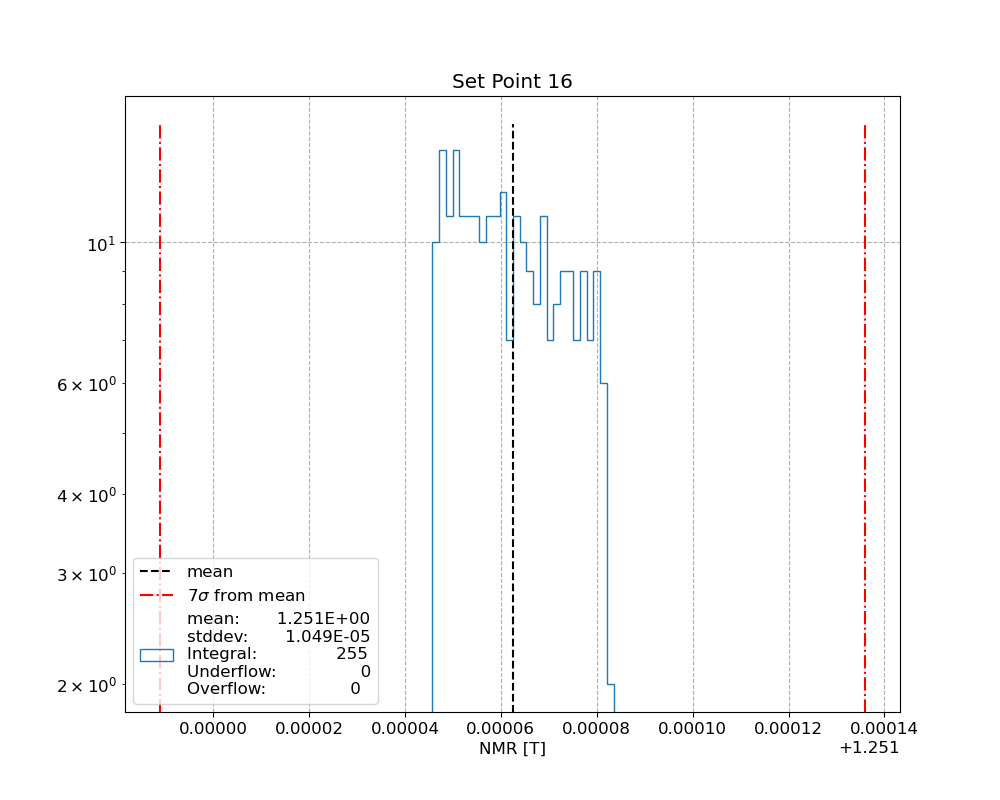

bin size = 3.26990324708015e-06
643
mean:       1.289E+00
stddev:       2.452E-05
Integral:               643
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


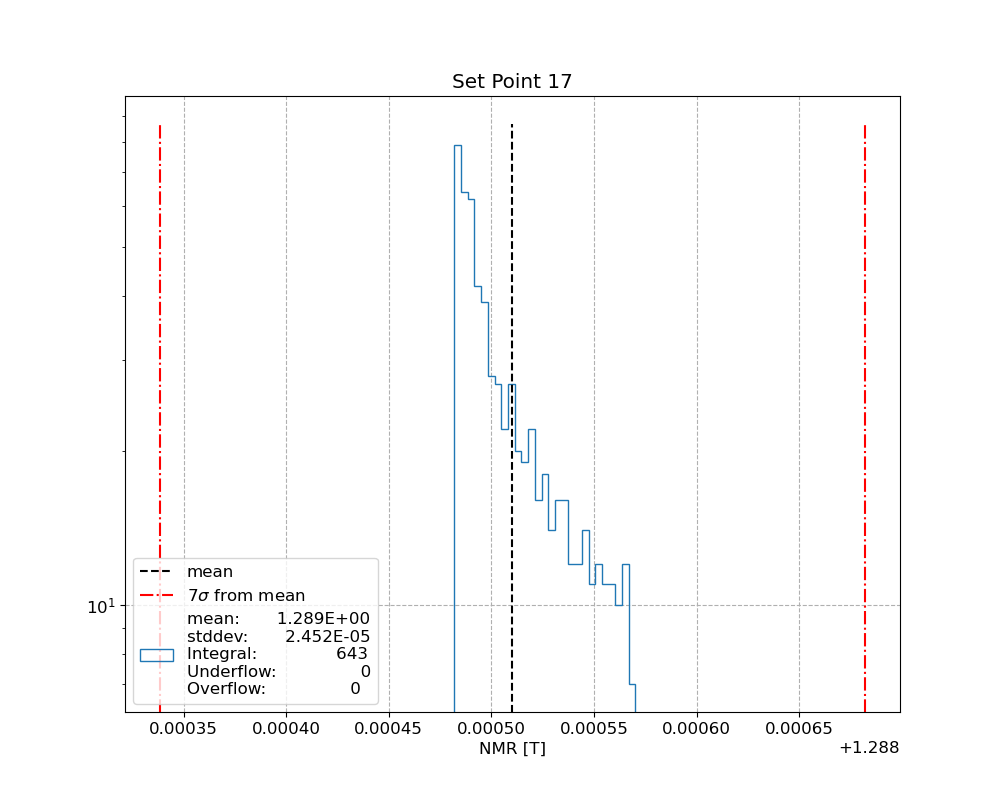

bin size = 3.26990324708015e-06
643
mean:       1.289E+00
stddev:       2.452E-05
Integral:               643
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


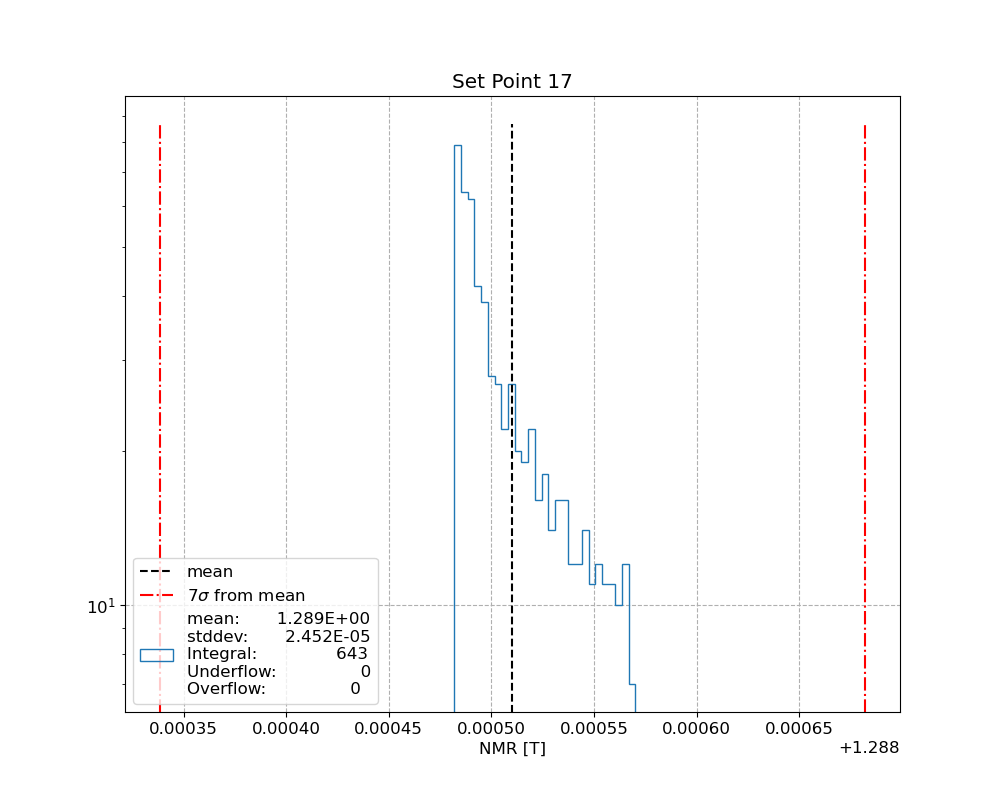

bin size = 6.920379346740343e-07
114
mean:       1.308E+00
stddev:       5.190E-06
Integral:               114
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


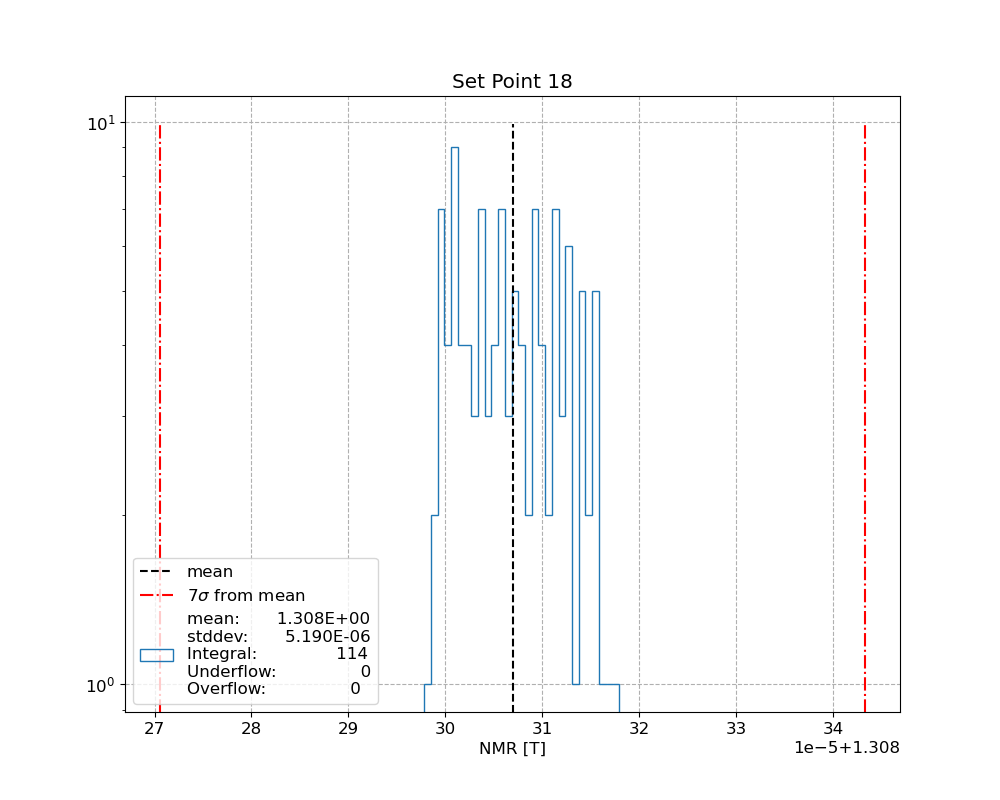

bin size = 6.920379346740343e-07
114
mean:       1.308E+00
stddev:       5.190E-06
Integral:               114
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


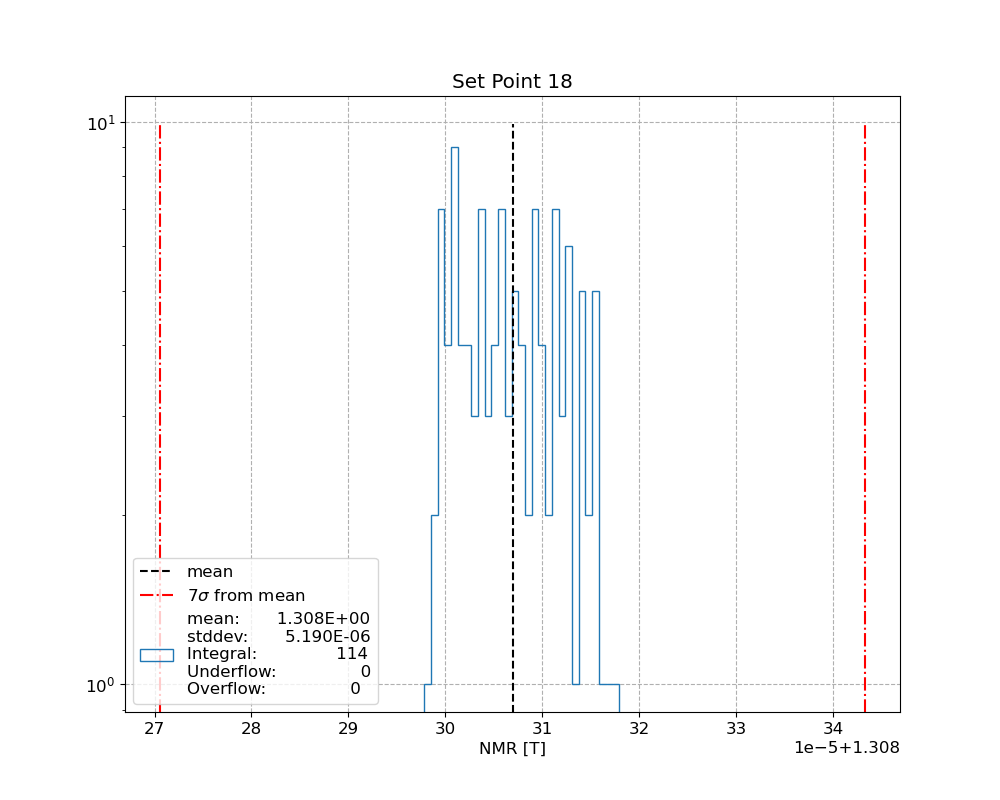

bin size = 1.091100810675712e-06
697
mean:       1.288E+00
stddev:       8.183E-06
Integral:               697
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


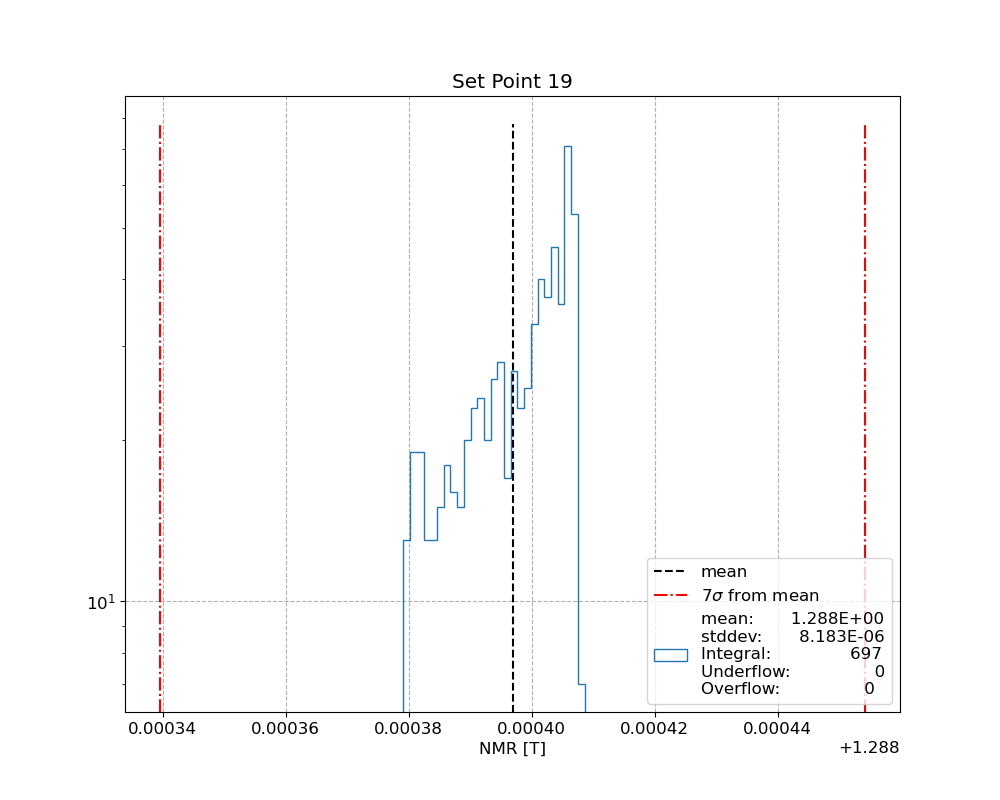

bin size = 1.091100810675712e-06
697
mean:       1.288E+00
stddev:       8.183E-06
Integral:               697
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


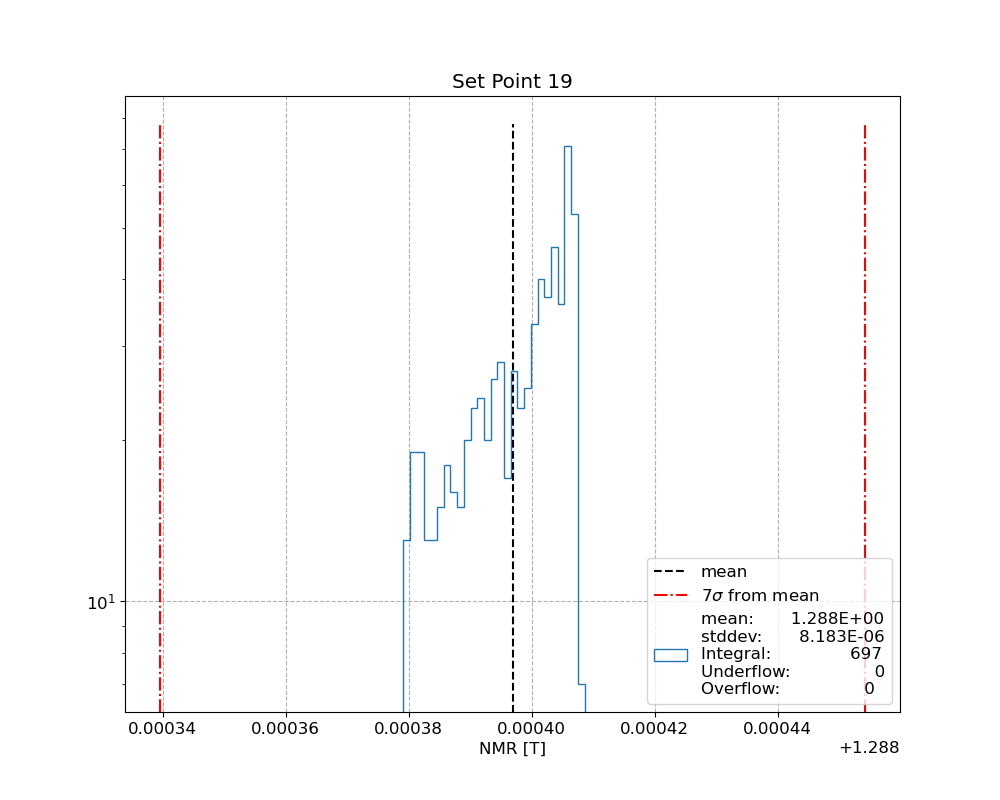

bin size = 1.8682791042698268e-06
380
mean:       1.251E+00
stddev:       1.401E-05
Integral:               380
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


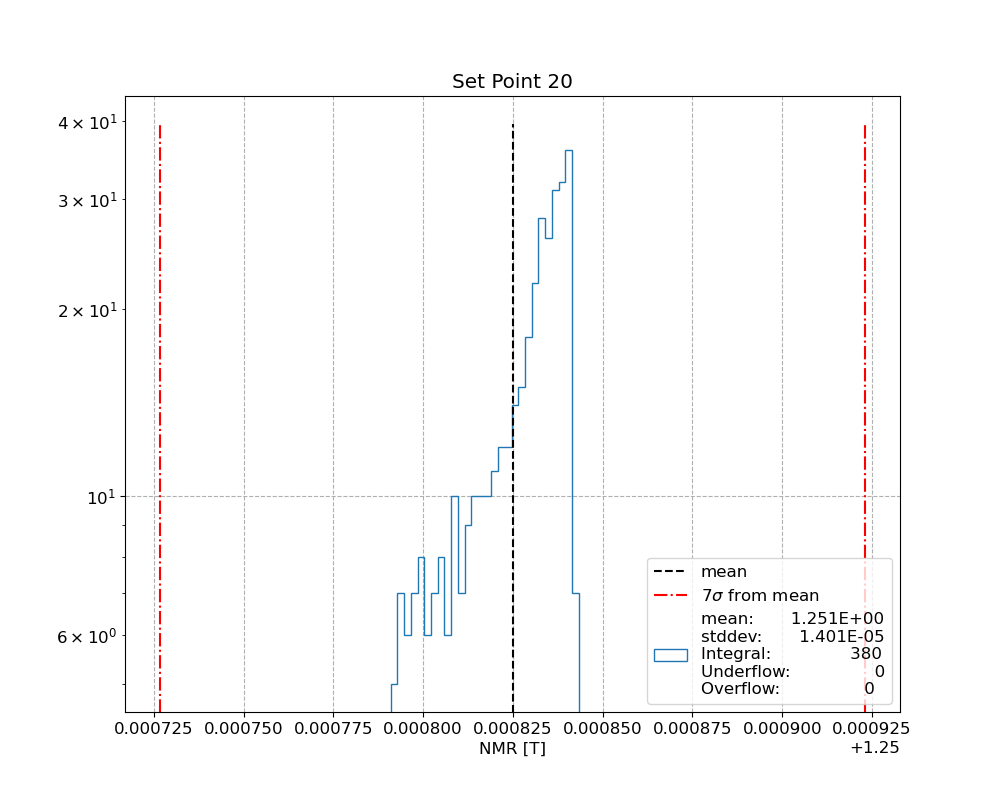

bin size = 1.8682791042698268e-06
380
mean:       1.251E+00
stddev:       1.401E-05
Integral:               380
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


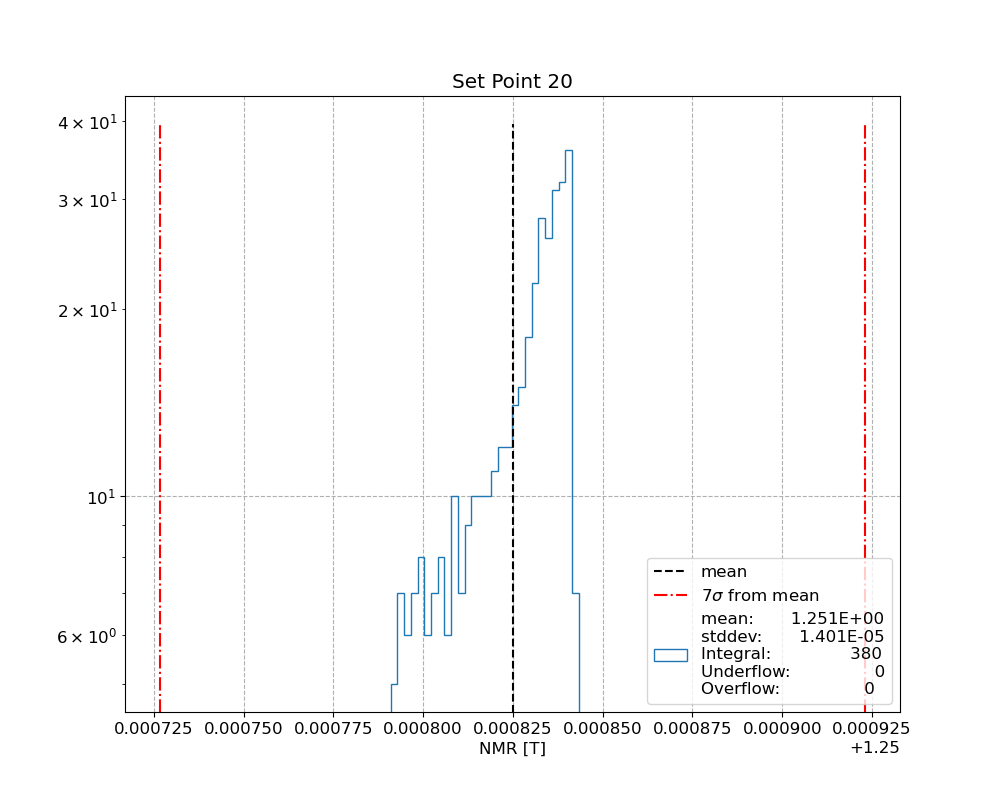

bin size = 0.004907582890208636
3979
mean:       1.160E+00
stddev:       3.681E-02
Integral:              3979
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


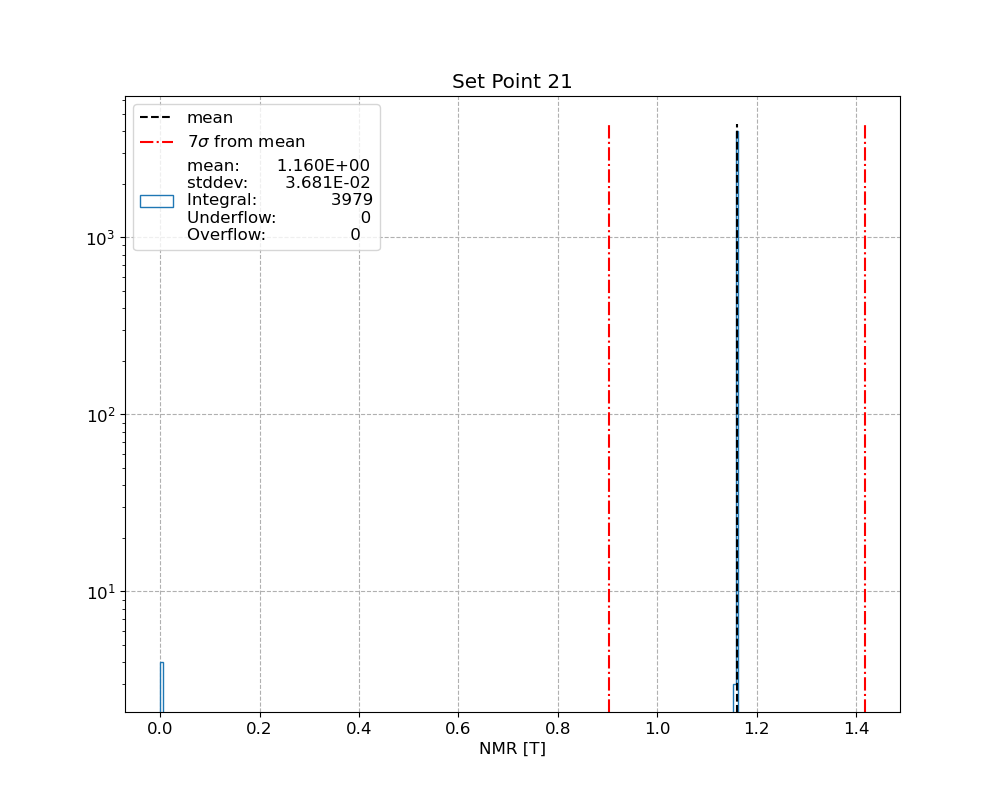

bin size = 2.108152823435008e-06
3972
mean:       1.161E+00
stddev:       1.581E-05
Integral:              3972
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


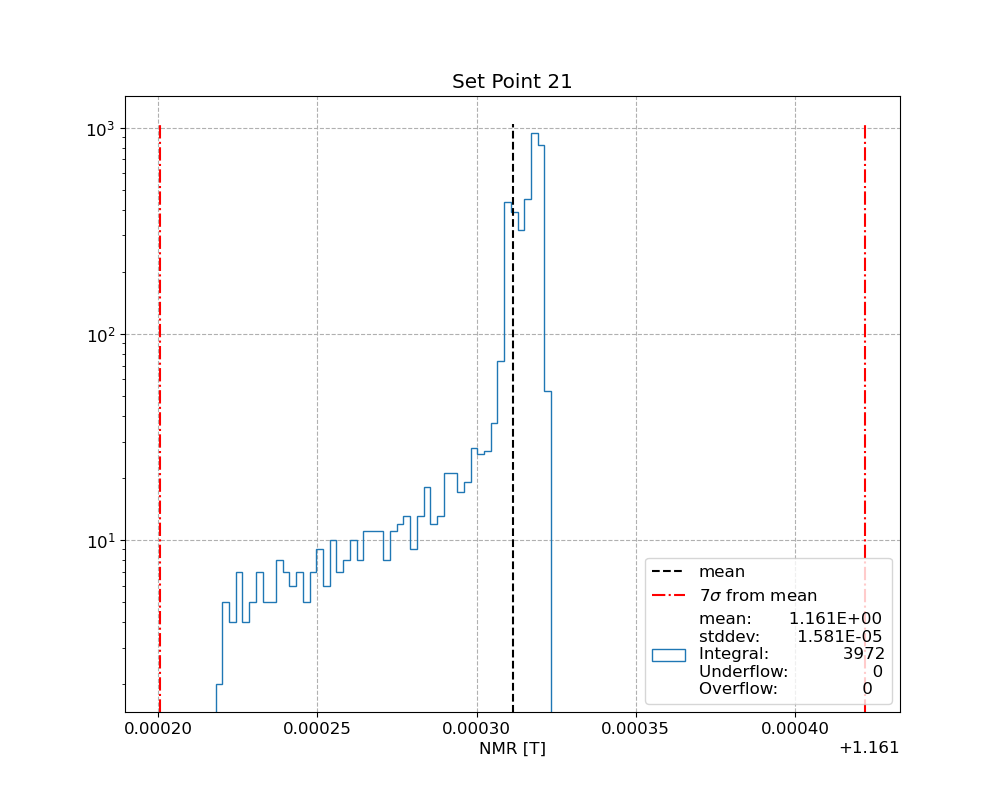

bin size = 2.440430973960446e-06
723
mean:       1.051E+00
stddev:       1.830E-05
Integral:               723
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


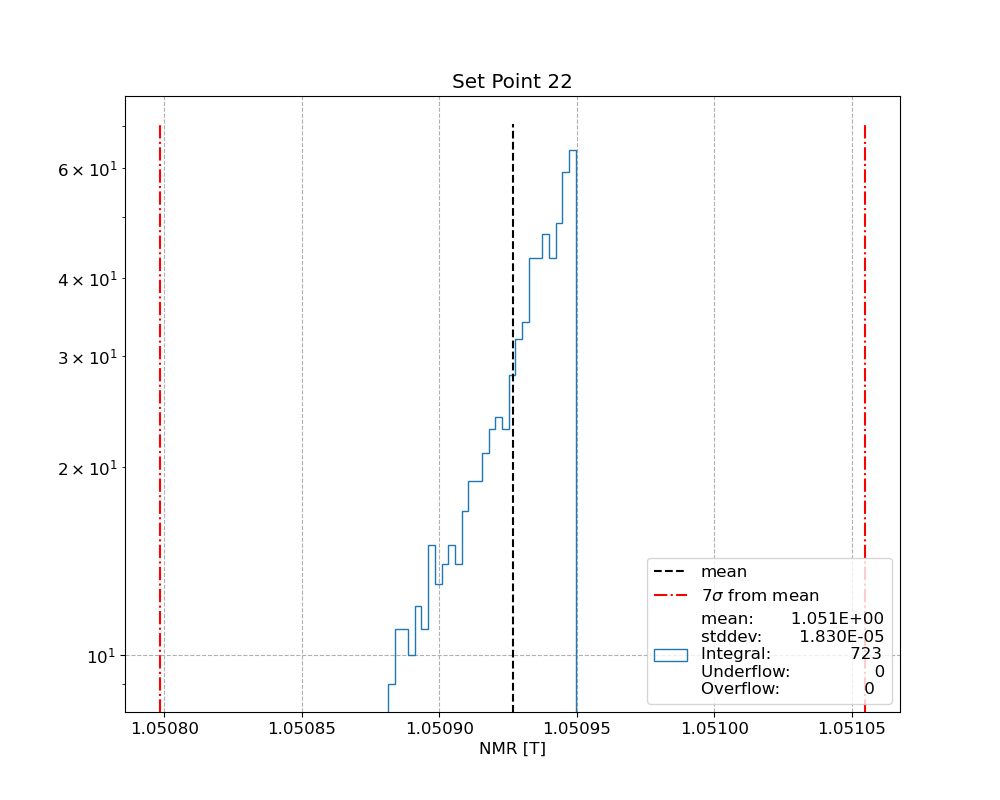

bin size = 2.440430973960446e-06
723
mean:       1.051E+00
stddev:       1.830E-05
Integral:               723
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


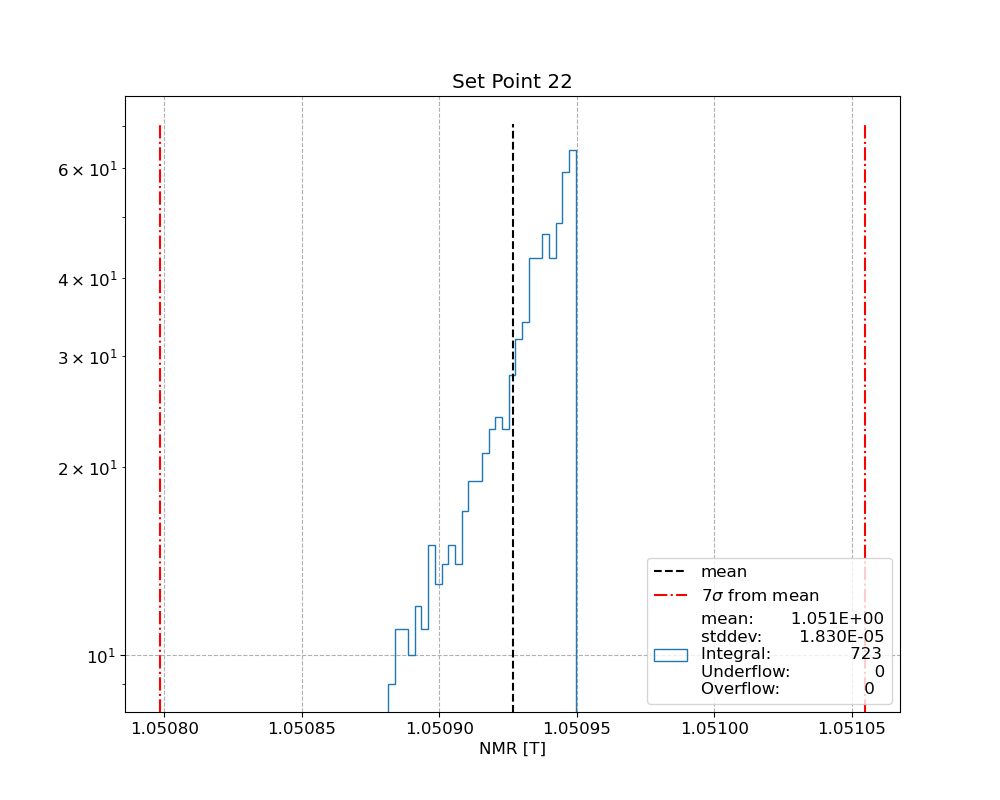

bin size = 0.001242548388752773
28343
mean:       9.057E-01
stddev:       9.319E-03
Integral:             28343
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


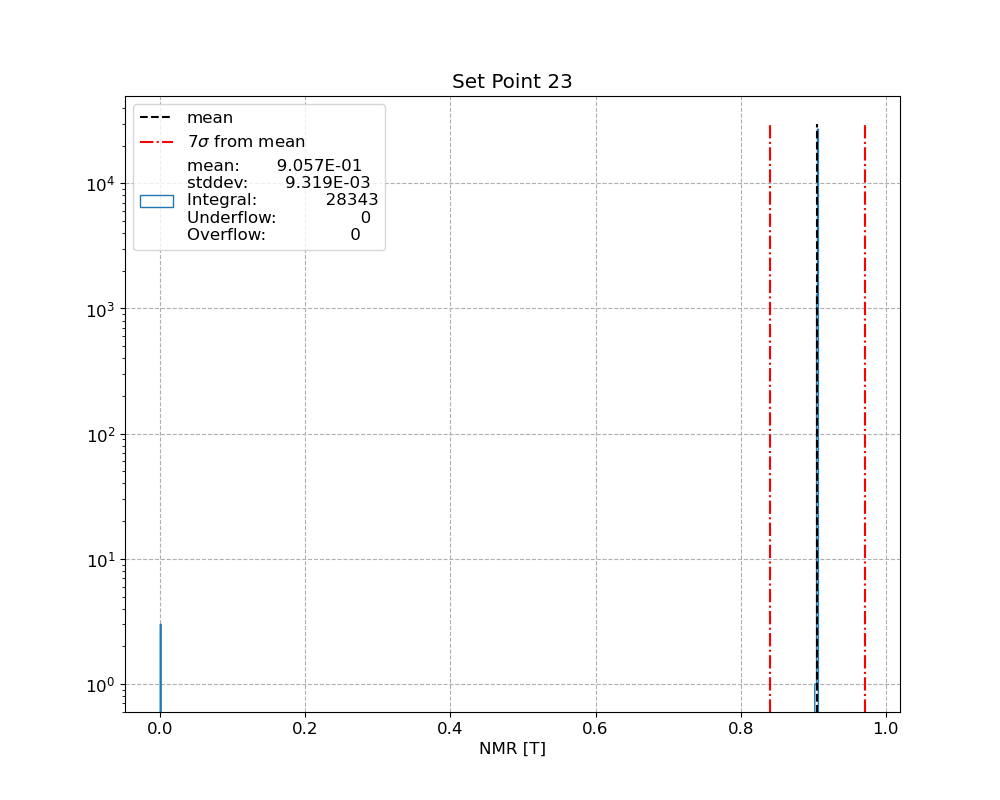

bin size = 3.154610157260023e-06
28338
mean:       9.058E-01
stddev:       2.366E-05
Integral:             28338
Underflow:                0
Overflow:                0


<IPython.core.display.Javascript object>


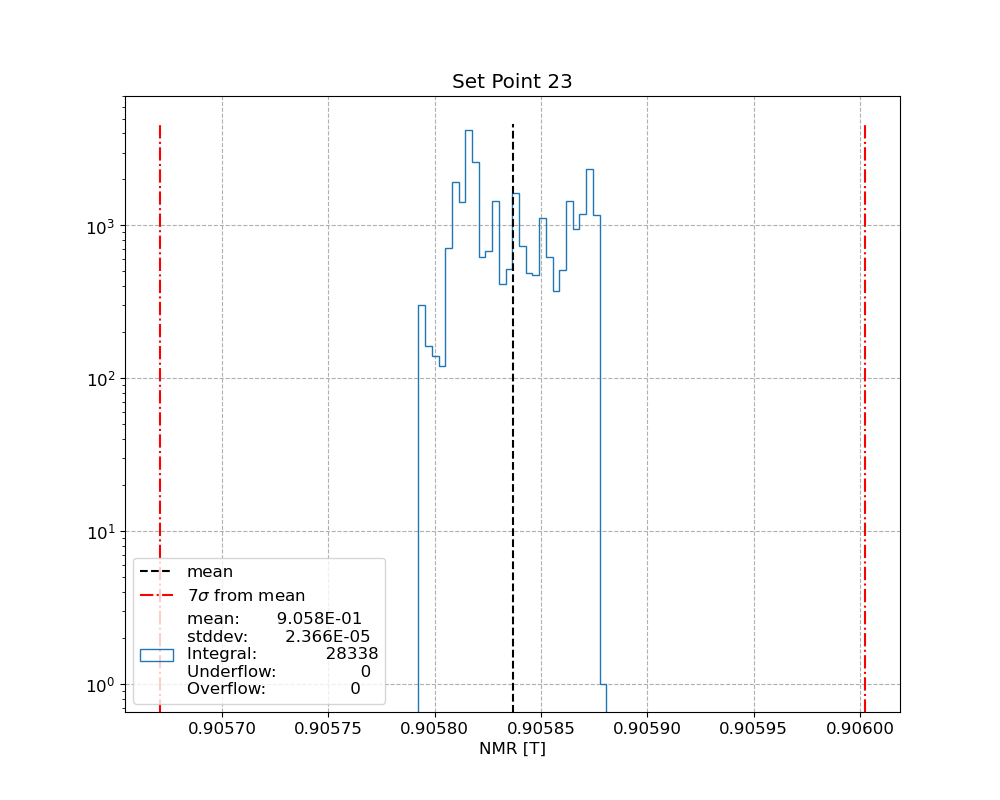

In [95]:
n = 7
steps = np.arange(0, 24)
for s in steps:
    fig, ax = inspect_col(s, df_time, df_clean, bins_in_sigma=15,
                         #nsig=5, ycol='NMR [T]')
                          nsig=n, ycol='NMR [T]')
    ax.set_yscale('log')
    # filter 2 times
    df_ = filter_outliers(s, df_time, df_clean, nsig=n, ycol='NMR [T]')
    df_ = filter_outliers(s, df_time, df_, nsig=n, ycol='NMR [T]')
    dfs.append(df_)
    fig, ax = inspect_col(s, df_time, df_, bins_in_sigma=15,
                         nsig=n, ycol='NMR [T]')
    ax.set_yscale('log')

In [194]:
df_clean2 = pd.concat(dfs)
# df_clean.drop(columns=['seconds_delta', 'hours_delta', 'days_delta'], inplace=True)
# df_clean['seconds_delta'] = (df_clean.index - df_clean.index[0]).total_seconds()
# df_clean['hours_delta'] = (df_clean.index - df_clean.index[0]).total_seconds()/60**2
# df_clean['days_delta'] = (df_clean.index - df_clean.index[0]).total_seconds()/(24*60**2)

In [195]:
df_clean2

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1 (new),Coil 2 (old),LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke,...,C50000000D5E473A_Cal_T,6A0000000D61333A_Cal_T,SmarAct_Meas_Angle_1,SmarAct_Meas_Rotation_Angle_1,SmarAct_Meas_Angle_2,SmarAct_Meas_Rotation_Angle_2,run,seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2021-02-24 13:28:38,2/24/2021 1:28:38 PM,240.069750,28.571600,29.840097,28.007162,7.107207,10.018359,10.879767,13.184784,15.563291,...,16.468,16.509,0.000686,0.0,0.000606,0.0,0,0.0,0.000000,0.000000
2021-02-24 13:29:38,2/24/2021 1:29:38 PM,240.069580,28.571800,29.787987,28.031197,7.115325,10.044732,10.914607,13.178277,15.564605,...,16.467,16.511,0.000685,0.0,0.000610,0.0,0,60.0,0.016667,0.000694
2021-02-24 13:30:38,2/24/2021 1:30:38 PM,240.069580,28.571950,29.807564,28.020391,7.117673,10.037371,10.909006,13.181531,15.567900,...,16.469,16.510,0.000685,0.0,0.000609,0.0,0,120.0,0.033333,0.001389
2021-02-24 13:31:39,2/24/2021 1:31:39 PM,240.069580,28.572000,29.803446,28.041353,7.122602,10.033122,10.869917,13.189683,15.573018,...,16.468,16.512,0.000690,0.0,0.000610,0.0,0,181.0,0.050278,0.002095
2021-02-24 13:32:37,2/24/2021 1:32:37 PM,240.069693,28.572150,29.791532,28.036276,7.136472,10.048101,10.879786,13.194210,15.577725,...,16.470,16.517,0.000685,0.0,0.000613,0.0,0,239.0,0.066389,0.002766
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-05 08:05:03,4/5/2021 8:05:03 AM,160.047520,18.885693,26.896858,26.822971,16.732733,18.459539,18.649643,21.047083,18.768127,...,17.158,17.702,0.001787,0.0,0.001367,0.0,23,3436585.0,954.606944,39.775289
2021-04-05 08:06:03,4/5/2021 8:06:03 AM,160.047463,18.885840,26.895796,26.856619,16.735105,18.453161,18.628620,21.054861,18.767283,...,17.155,17.695,0.001792,0.0,0.001370,0.0,23,3436645.0,954.623611,39.775984
2021-04-05 08:07:03,4/5/2021 8:07:03 AM,160.047520,18.885925,26.894203,26.892708,16.730320,18.454494,18.626814,21.064997,18.768127,...,17.158,17.712,0.001788,0.0,0.001370,0.0,23,3436705.0,954.640278,39.776678


In [196]:
df_clean2.query('3 <= run <= 18')

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1 (new),Coil 2 (old),LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke,...,C50000000D5E473A_Cal_T,6A0000000D61333A_Cal_T,SmarAct_Meas_Angle_1,SmarAct_Meas_Rotation_Angle_1,SmarAct_Meas_Angle_2,SmarAct_Meas_Rotation_Angle_2,run,seconds_delta,hours_delta,days_delta
Datetime,,,,,,,,,,,,,,,,,,,,,
2021-03-01 13:21:43,3/1/2021 1:21:43 PM,0.000849,0.000395,7.688446,7.691459,6.898076,7.368879,7.800656,6.925324,12.731566,...,14.935,14.766,0.001877,0.0,0.001132,0.0,3,431585.0,119.884722,4.995197
2021-03-01 13:22:43,3/1/2021 1:22:43 PM,0.001091,-0.001118,7.643955,7.702847,6.885967,7.356124,7.805821,6.908267,12.722416,...,14.934,14.764,0.001877,0.0,0.001134,0.0,3,431645.0,119.901389,4.995891
2021-03-01 13:23:43,3/1/2021 1:23:43 PM,0.001039,-0.000333,7.624253,7.710751,6.905254,7.374886,7.772696,6.924972,12.710895,...,14.935,14.760,0.001880,0.0,0.001134,0.0,3,431705.0,119.918056,4.996586
2021-03-01 13:24:43,3/1/2021 1:24:43 PM,0.000718,0.000996,7.651546,7.712375,6.935202,7.386232,7.751643,6.941383,12.705977,...,14.931,14.755,0.001880,0.0,0.001132,0.0,3,431765.0,119.934722,4.997280
2021-03-01 13:25:43,3/1/2021 1:25:43 PM,0.001004,-0.000206,7.638594,7.720768,6.922057,7.367510,7.786451,6.953355,12.700392,...,14.929,14.754,0.001876,0.0,0.001134,0.0,3,431825.0,119.951389,4.997975
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-11 17:46:47,3/11/2021 5:46:47 PM,281.677420,36.814150,51.974365,51.455513,16.494814,22.697769,23.309382,31.614250,25.736761,...,19.369,20.426,0.000533,0.0,0.001049,0.0,18,1311489.0,364.302500,15.179271
2021-03-11 17:47:47,3/11/2021 5:47:47 PM,281.677477,36.814183,51.953983,51.460171,16.498129,22.703094,23.390150,31.622131,25.739260,...,19.364,20.405,0.000536,0.0,0.001047,0.0,18,1311549.0,364.319167,15.179965
2021-03-11 17:48:47,3/11/2021 5:48:47 PM,281.677647,36.814433,51.900555,51.444550,16.515627,22.720036,23.383900,31.625975,25.749882,...,19.362,20.378,0.000530,0.0,0.001051,0.0,18,1311609.0,364.335833,15.180660


In [197]:
len(df_clean2)

47308

In [198]:
probes

['DF0000000D5E803A',
 'C90000000D53983A',
 'C50000000D5E473A',
 '6A0000000D61333A']

In [199]:
## DO OTHER BASIC CALCULATIONS
# calculations for Hall probes
for p in probes:
    # magnitudes
    df_clean2[f'{p}_Cal_Bmag'] = (df_clean2[f'{p}_Cal_X']**2 + df_clean2[f'{p}_Cal_Y']**2 + df_clean2[f'{p}_Cal_Z']**2)**(1/2)
    df_clean2[f'{p}_Raw_Bmag'] = (df_clean2[f'{p}_Raw_X']**2 + df_clean2[f'{p}_Raw_Y']**2 + df_clean2[f'{p}_Raw_Z']**2)**(1/2)
    # B field angles
    df_clean2[f'{p}_Cal_Theta'] = np.arccos(df_clean2[f'{p}_Cal_Z']/df_clean2[f'{p}_Cal_Bmag'])
    df_clean2[f'{p}_Cal_Phi'] = np.arctan2(df_clean2[f'{p}_Cal_Y'],df_clean2[f'{p}_Cal_X'])

In [200]:
ramp_ind = df_time.query('ramp == True').index.values
hyst_ind = df_time.query('hyst == True').index.values

In [201]:
df_ramp = df_clean2[np.isin(df_clean2.run, ramp_ind)]
df_hyst = df_clean2[np.isin(df_clean2.run, hyst_ind)]

In [202]:
df_ramp.run.unique()

array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18])

In [203]:
df_hyst.run.unique()

array([ 0,  1,  2,  9, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23])

In [204]:
len(df_hyst)

42930

In [205]:
len(df_ramp)

6816

In [206]:
# old ramp
len(df)

2001

In [207]:
##### PROCESSING DONE

## Hysteresis First Look

In [168]:
### look at hysteresis

In [208]:
t0 = '2021-03-09 09:17:00'
tf = '2021-03-09 17:33:00'
df_ = df_raw.query(f'"{t0}" < index < "{tf}"')

In [209]:
df_['Magnet Current [A]'].describe()

count    496.000000
mean     224.065366
std        0.000108
min      224.065100
25%      224.065327
50%      224.065383
75%      224.065440
max      224.066347
Name: Magnet Current [A], dtype: float64

In [210]:
df_time.query('hyst == True').adc.unique()

array(['750,000', '700,000', '500,000', '600,000', '800,000', '850,000'],
      dtype=object)

In [211]:
df_time

,t0,tf,ramp,hyst,adc,chiller
0,2021-02-24 09:57:00,2021-02-25 10:35:45,False,True,"750,000",True
1,2021-02-25 10:36:15,2021-02-26 11:47:45,False,True,"700,000",True
2,2021-02-26 11:53:00,2021-03-01 09:12:45,False,True,"750,000",True
3,2021-03-01 09:18:30,2021-03-01 16:47:45,True,False,0,True
4,2021-03-01 16:51:30,2021-03-02 09:11:45,True,False,"100,000",True
5,2021-03-02 09:16:30,2021-03-02 16:53:45,True,False,"200,000",True
6,2021-03-02 16:57:30,2021-03-03 09:12:45,True,False,"300,000",True
7,2021-03-03 09:16:30,2021-03-03 17:11:45,True,False,"400,000",True
8,2021-03-03 17:15:30,2021-03-04 09:10:45,True,False,"450,000",True
9,2021-03-04 09:14:45,2021-03-04 16:49:45,True,True,"500,000",True


<IPython.core.display.Javascript object>


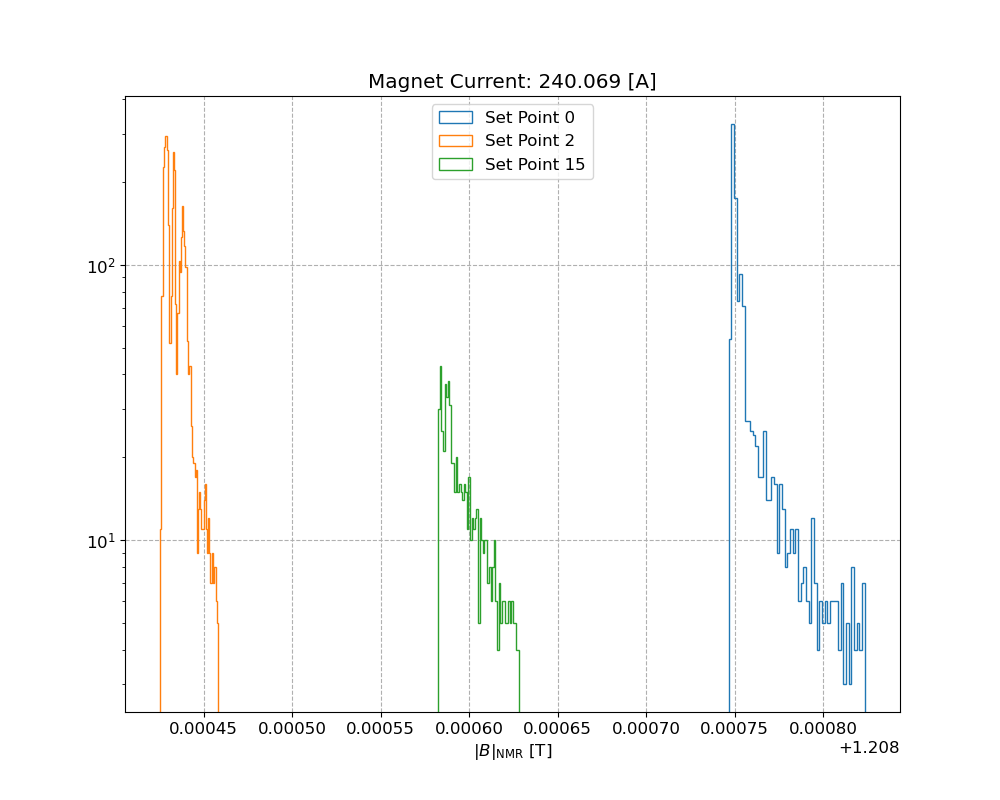

1.2087611461277603, 1.7946667861828263e-05
1.2084338065759477, 6.24727360388006e-06
1.2085973895674487, 1.2111335440723719e-05


<IPython.core.display.Javascript object>


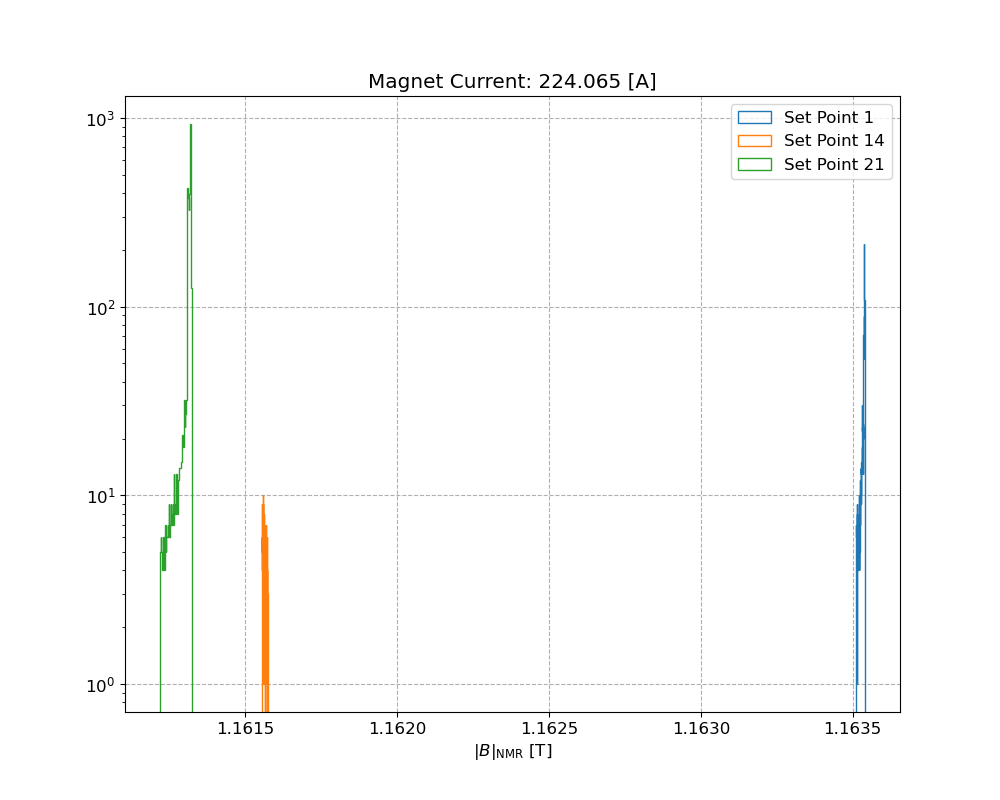

1.163533642382467, 6.801365613153025e-06
1.1615619027906976, 5.534382860162952e-06
1.1613112740568983, 1.581114617576256e-05


<IPython.core.display.Javascript object>


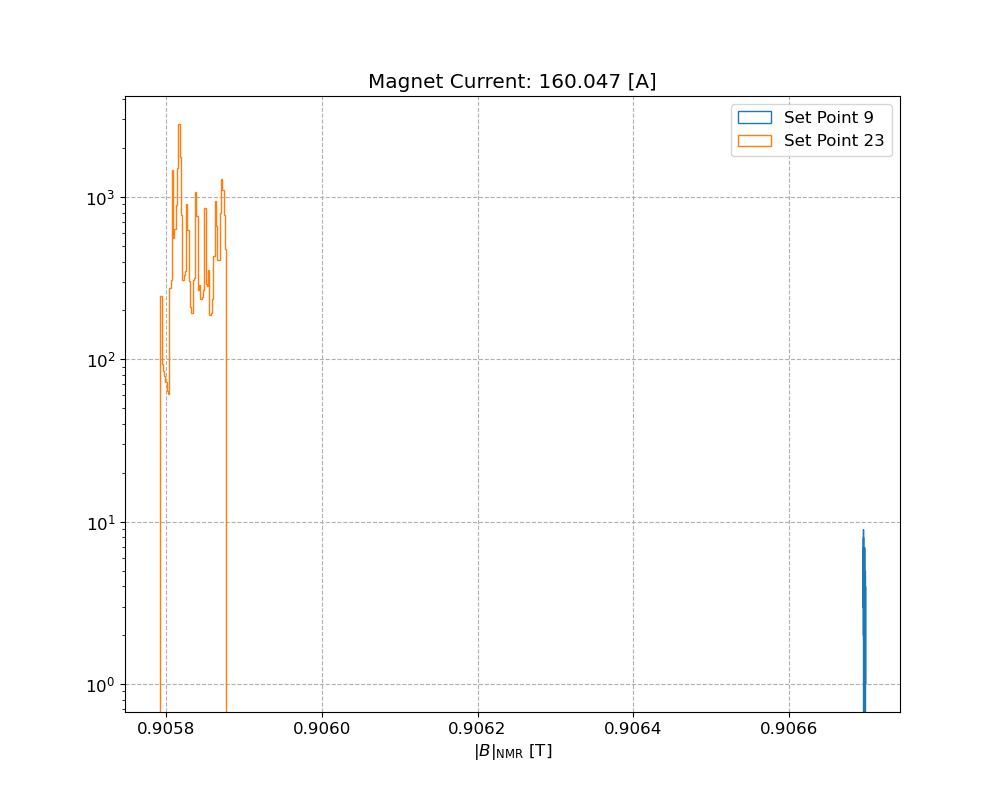

0.9066954416874999, 7.377026707124077e-07
0.9058365411994141, 2.3659576179450175e-05


<IPython.core.display.Javascript object>


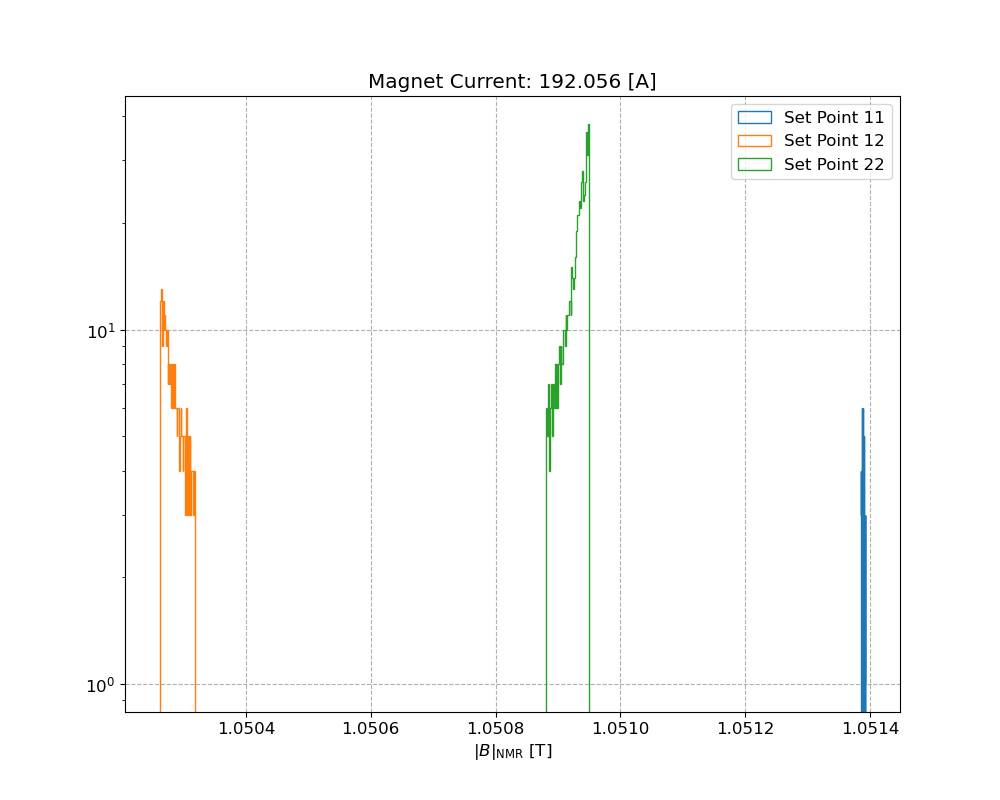

1.0513886258190475, 1.6797906278653036e-06
1.0502846176333334, 1.5896616407062466e-05
1.0509265851147993, 1.8303232304703344e-05


<IPython.core.display.Javascript object>


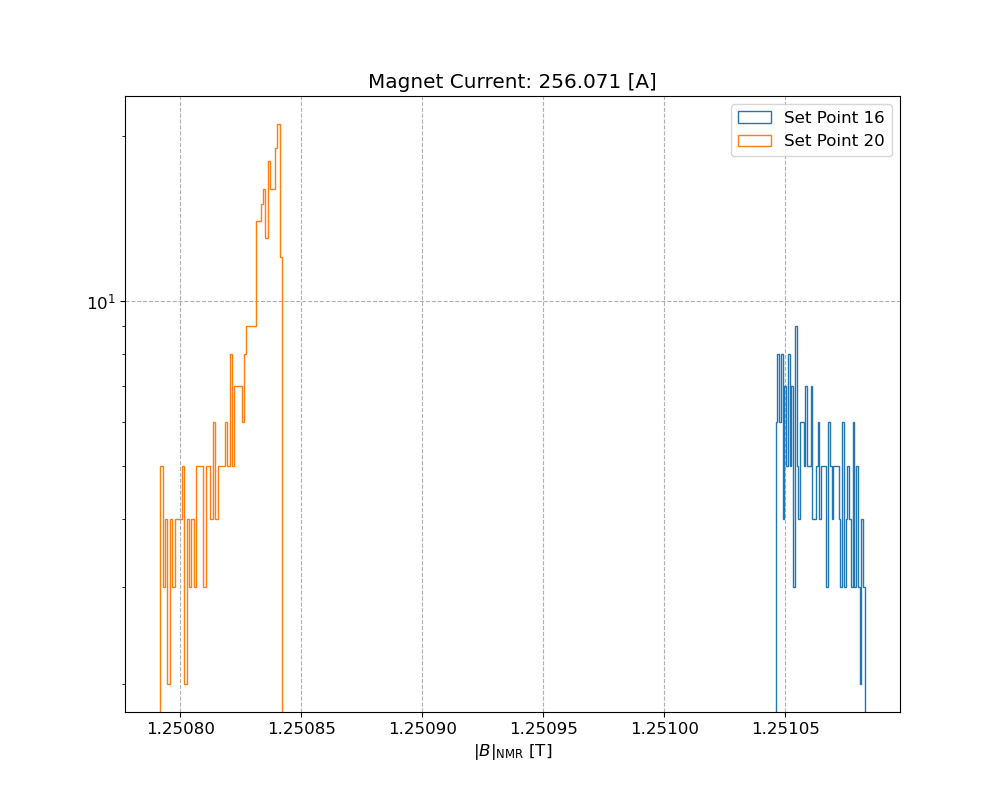

1.2510624297803923, 1.0494895545106813e-05
1.2508248984210528, 1.4012093282023701e-05


<IPython.core.display.Javascript object>


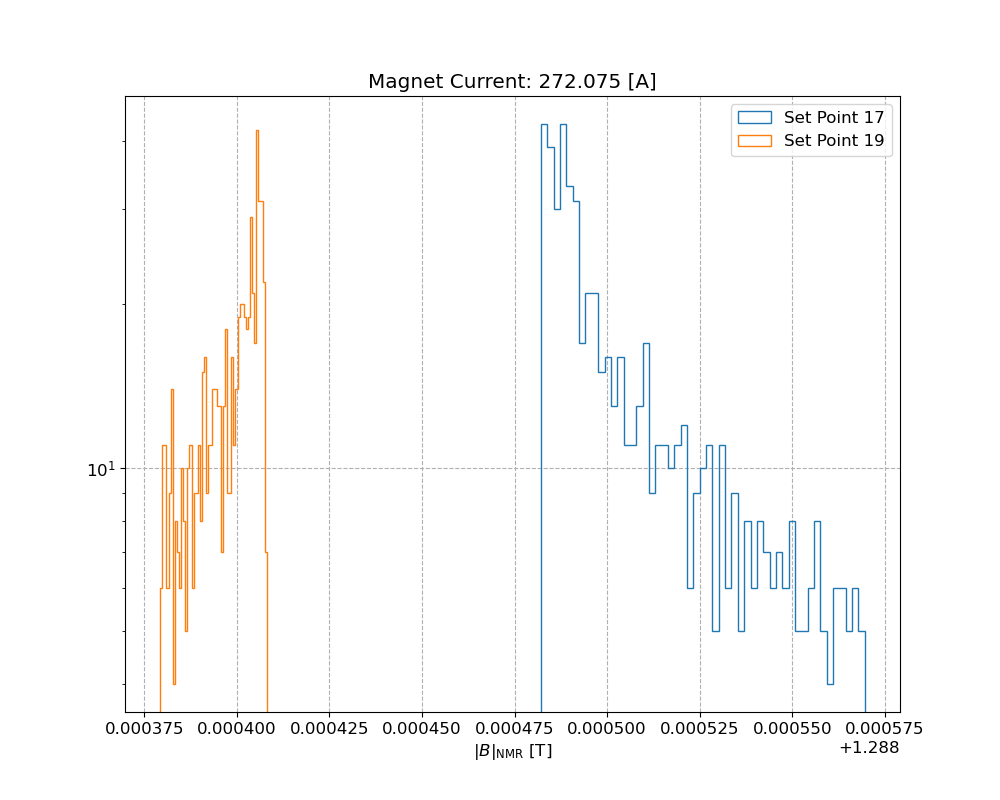

1.2885103130606532, 2.4524274353101124e-05
1.2883968784849353, 8.18325608006784e-06


In [212]:
# plots checking NMR (histogram)
df_hyst_t = df_time.query('hyst == True')
adc_hyst = df_hyst_t.adc.unique()
for a_ in adc_hyst:
#     print(a_, type(a_))
    fig, ax = plt.subplots()
    dfs = df_hyst_t.query(f'adc == "{a_}"')
    df_ = df_hyst.query(f'"{dfs.iloc[0].t0}" < index < "{dfs.iloc[0].tf}"')
    mB = df_['NMR [T]'].mean()
    sB = df_['NMR [T]'].std()
    B0 = mB - 1*sB
    Bf = mB + 1*sB
    #B0 = df_['NMR [T]'].min() * 0.99
    #Bf = df_['NMR [T]'].max() * 1.01
    nb = 51
    bins_ = np.linspace(B0, Bf, nb)
    for row in dfs.itertuples():
#         print(row.t0)
#         df_ = df_hyst.query(f'("{row.t0}" < index < "{row.tf}") & (`NMR [T]` > 0.1)')
        df_ = df_hyst.query(f'("{row.t0}" < index < "{row.tf}")')
        mB = df_['NMR [T]'].mean()
        sB = df_['NMR [T]'].std()
        print(f'{mB}, {sB}')
#         nS = 1#.5
#         df_ = df_.query(f'{mB - nS*sB} < `NMR [T]` < {mB + nS*sB}')
#         I = df_['Magnet Current [A]'].mean()
#         n, bins, patches = ax.hist(df_['NMR [T]'], bins=bins_, histtype='step',label=f'Set Point {row.Index}')
        n, bins, patches = ax.hist(df_['NMR [T]'], bins=nb, histtype='step',label=f'Set Point {row.Index}')
    I = df_['Magnet Current [A]'].mean()
    ax.set_xlabel(r'$|B|_{\mathrm{NMR}}$ [T]')
#     ax.set_ylabel('Count')
    ax.set_yscale('log')
    ax.set_title(f'Magnet Current: {I:0.3f} [A]')
    ax.legend()

In [ ]:
# regress temp.

In [214]:
def lin_NMR(temp, **params):
    return params['b'] + params['m'] * temp

In [215]:
def regress_temp_NMR(df, x='Yoke (center magnet)', y='NMR [T]', I=160, dI=5., make_plot=True, verbose=True):
    # prep data
    df_ = df.query(f'{I-dI} <= `Magnet Current [A]` <= {I+dI}')
    Imean = df_['Magnet Current [A]'].mean()
    x = df_[x].values
    y = df_[y].values
    ix = np.argsort(x)
    x = x[ix]
    y = y[ix]
    # lmfit
    model = lm.Model(lin_NMR, independent_vars=['temp'])
    params = lm.Parameters()
    params.add('b', value=0, vary=True)
    params.add('m', value=0, vary=True)
    result = model.fit(y, temp=x, params=params, weights=1/(1e-6) * np.ones_like(x),)# scale_covar=False)
    if verbose:
        print(result.fit_report())
    if make_plot:
        result.plot()
    return result, x, y, Imean

In [ ]:
# i = 0
b:  1.21042639 +/- 2.2758e-06 (0.00%) (init = 0)
m: -9.9339e-05 +/- 1.3576e-07 (0.14%) (init = 0)

In [223]:
# i = 0
lin_NMR(15., **result.params)

1.2089363056093565

In [ ]:
# i = 2
b:  1.20997242 +/- 2.7248e-06 (0.00%) (init = 0)
m: -9.0367e-05 +/- 1.6003e-07 (0.18%) (init = 0)

In [221]:
# i = 2
lin_NMR(15., **result.params)

1.208616914559894

In [224]:
# i = 2 - i = 0 @ T = 15 deg C
1.208616914559894 - 1.2089363056093565

-0.00031939104946254737

[[Model]]
    Model(lin_NMR)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 64
    # data points      = 1268
    # variables        = 2
    chi-square         = 962.524338
    reduced chi-square = 0.76028779
    Akaike info crit   = -345.507441
    Bayesian info crit = -335.217049
[[Variables]]
    b:  1.21042639 +/- 2.2758e-06 (0.00%) (init = 0)
    m: -9.9339e-05 +/- 1.3576e-07 (0.14%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(b, m) = -1.000


<IPython.core.display.Javascript object>


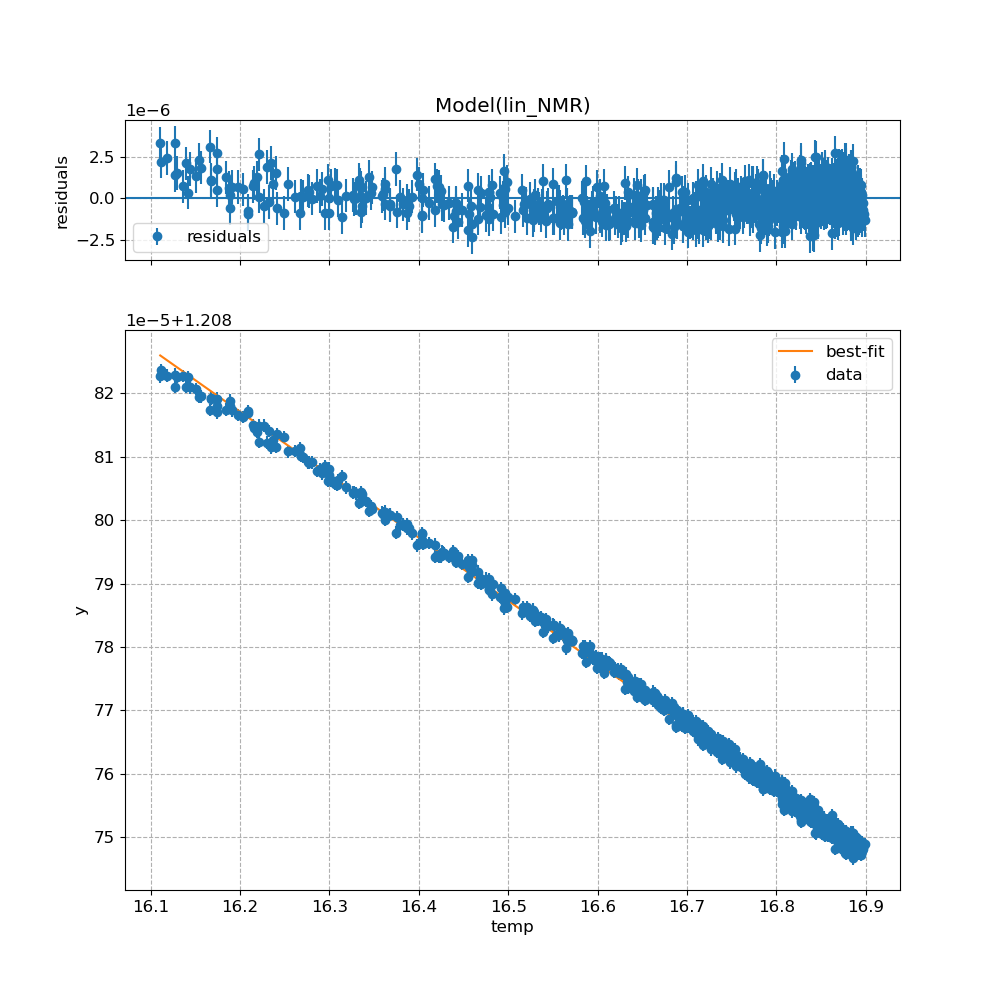

In [222]:
i = 0 # 2
df_ = df_hyst.query(f'"{df_time.iloc[i].t0}" < index < "{df_time.iloc[i].tf}"')
result, x, y, Imean = regress_temp_NMR(df_, I=240.)

In [218]:
df_['Magnet Current [A]'].describe()

count    1268.000000
mean      240.069361
std         0.000142
min       240.069013
25%       240.069240
50%       240.069297
75%       240.069523
max       240.069750
Name: Magnet Current [A], dtype: float64

<IPython.core.display.Javascript object>


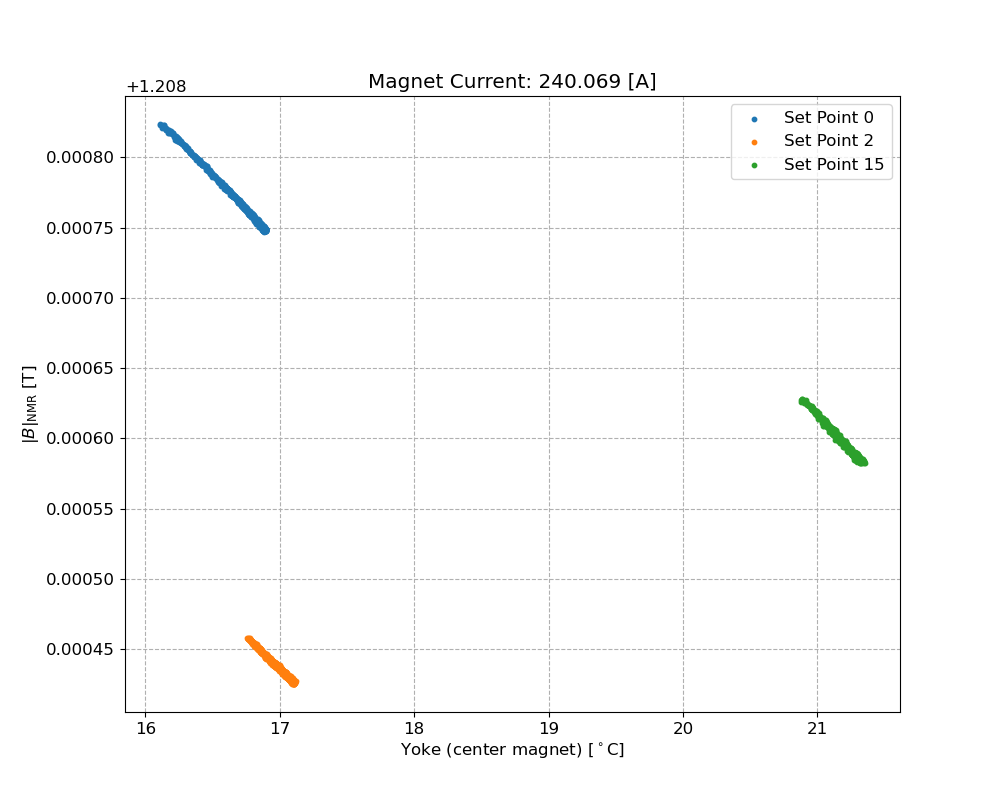

<IPython.core.display.Javascript object>


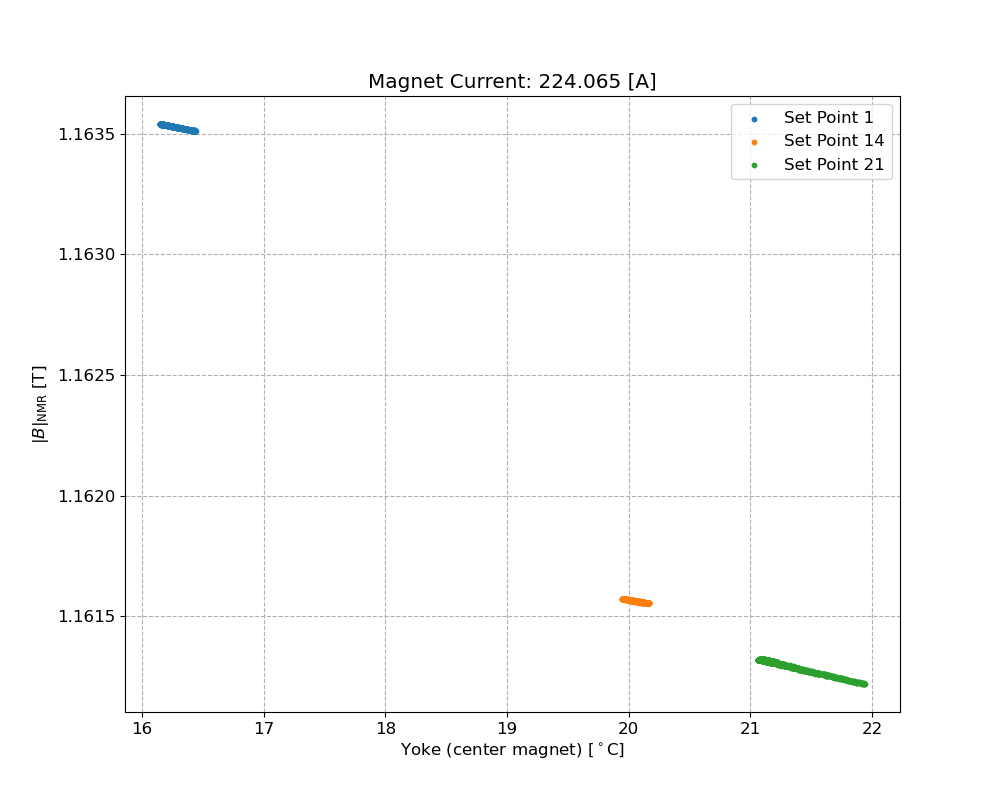

<IPython.core.display.Javascript object>


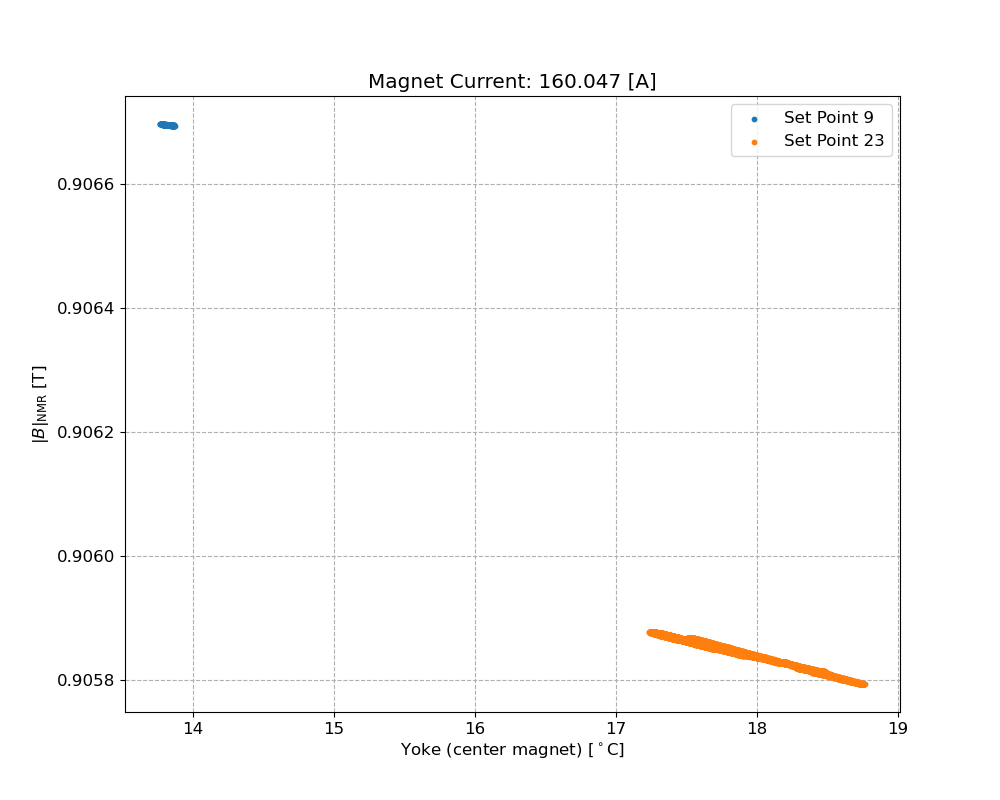

<IPython.core.display.Javascript object>


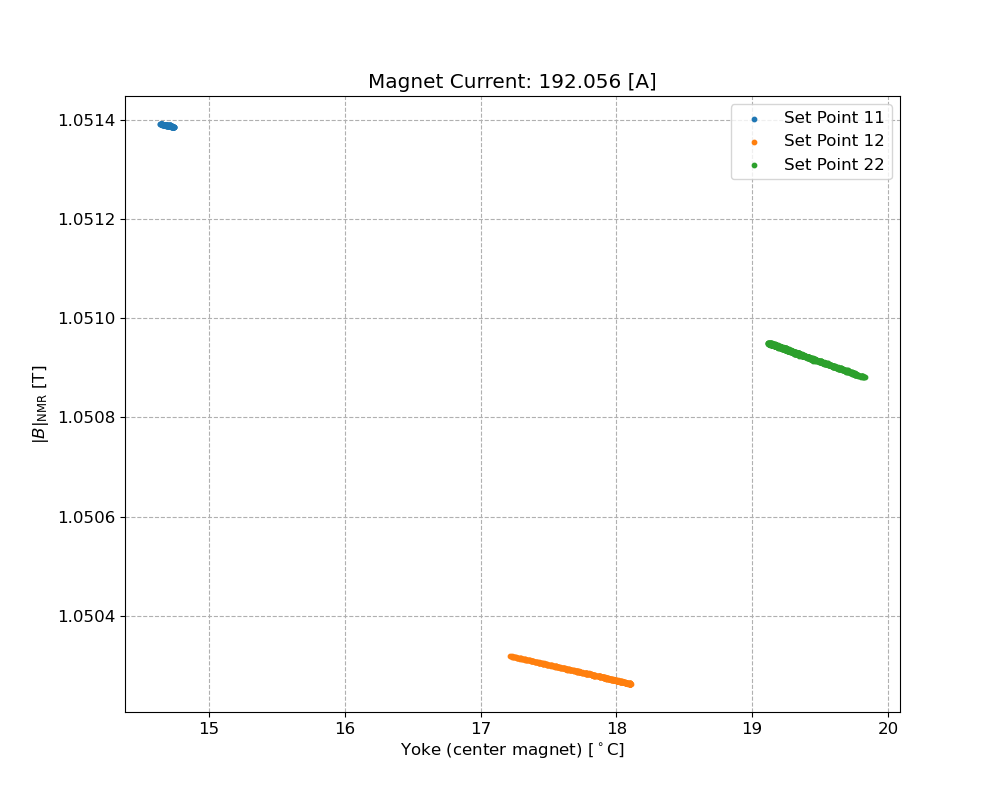

<IPython.core.display.Javascript object>


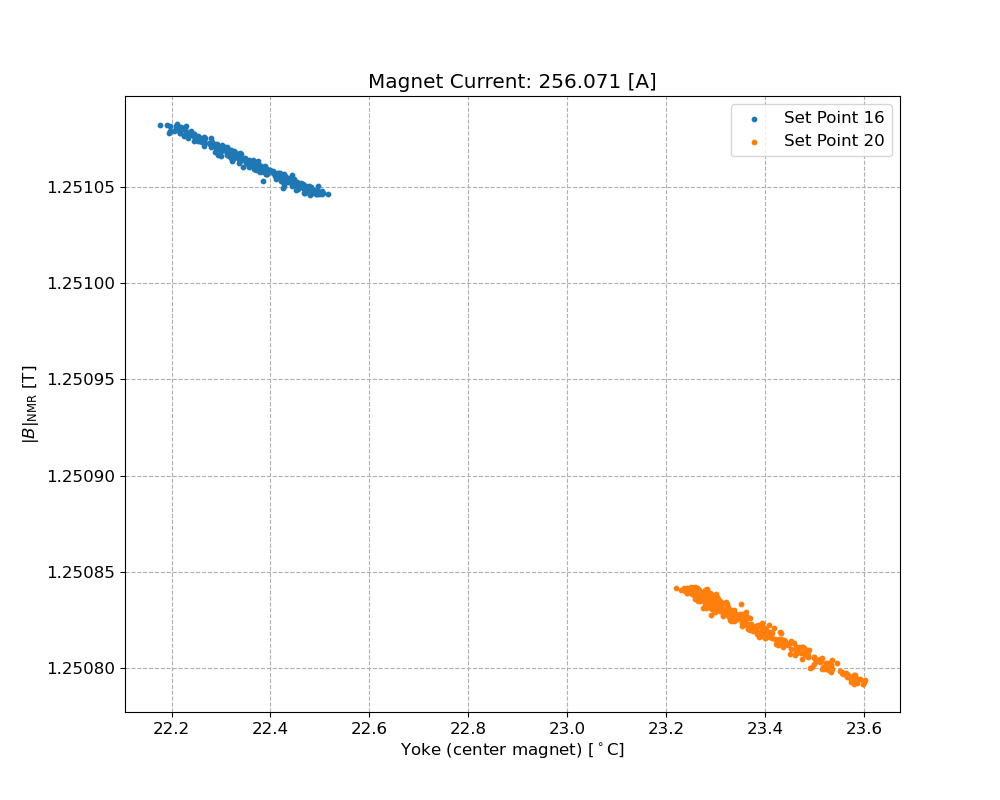

<IPython.core.display.Javascript object>


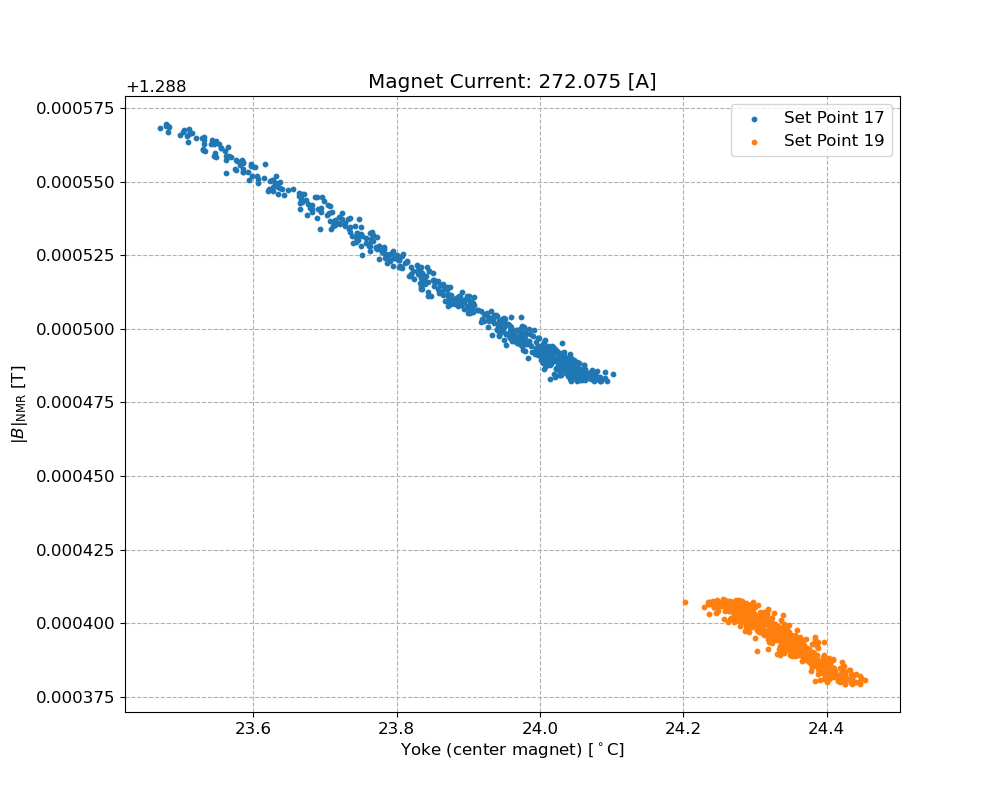

In [213]:
# plots checking NMR vs. Temp.
df_hyst_t = df_time.query('hyst == True')
adc_hyst = df_hyst_t.adc.unique()
for a_ in adc_hyst:
#     print(a_, type(a_))
    fig, ax = plt.subplots()
    dfs = df_hyst_t.query(f'adc == "{a_}"')
    df_ = df_hyst.query(f'"{dfs.iloc[0].t0}" < index < "{dfs.iloc[0].tf}"')
    #mB = df_['NMR [T]'].mean()
    #sB = df_['NMR [T]'].std()
    #B0 = mB - 1*sB
    #Bf = mB + 1*sB
    #B0 = df_['NMR [T]'].min() * 0.99
    #Bf = df_['NMR [T]'].max() * 1.01
    #nb = 51
    #bins_ = np.linspace(B0, Bf, nb)
    for row in dfs.itertuples():
#         print(row.t0)
#         df_ = df_hyst.query(f'("{row.t0}" < index < "{row.tf}") & (`NMR [T]` > 0.1)')
        df_ = df_hyst.query(f'("{row.t0}" < index < "{row.tf}")')
        #mB = df_['NMR [T]'].mean()
        #sB = df_['NMR [T]'].std()
        #print(f'{mB}, {sB}')
#         nS = 1#.5
#         df_ = df_.query(f'{mB - nS*sB} < `NMR [T]` < {mB + nS*sB}')
#         I = df_['Magnet Current [A]'].mean()
#         n, bins, patches = ax.hist(df_['NMR [T]'], bins=bins_, histtype='step',label=f'Set Point {row.Index}')
#         n, bins, patches = ax.hist(df_['NMR [T]'], bins=nb, histtype='step',label=f'Set Point {row.Index}')
        ax.scatter(df_['Yoke (center magnet)'], df_['NMR [T]'], s=10, label=f'Set Point {row.Index}')
    I = df_['Magnet Current [A]'].mean()
    ax.set_xlabel(r'Yoke (center magnet) [$^\circ$C]')
    ax.set_ylabel(r'$|B|_{\mathrm{NMR}}$ [T]')
#     ax.set_ylabel('Count')
    #ax.set_yscale('log')
    ax.set_title(f'Magnet Current: {I:0.3f} [A]')
    ax.legend()

## Some Old Stuff (LOOK)

In [169]:
############

In [30]:
fig = scatter2d(df.index, df[f"{probe}_Cal_Theta"], markers=True, lines=False, inline=False)

In [32]:
fig = scatter2d(df.index, df[f"{probe}_Cal_Theta"], markers=False, lines=True, inline=False)

In [33]:
fig = scatter2d(df.index, df[f"{probe}_Cal_Phi"], markers=False, lines=True, inline=False)

In [35]:
fig = scatter2d(df.index, df[f"Magnet Current [A]"], markers=False, lines=True, inline=False)

In [177]:
fig = scatter2d(2*[df[f"Magnet Current [A]"]], [df['NMR [T]'], df[f'{probe}_Cal_Bmag']],
                markers=True, lines=False, inline=False)

In [45]:
# lo = 143.5
# hi = 145.5
lo = 160.
hi = 160.1
df_ = df.query(f'({lo} <= `Magnet Current [A]` <= {hi})')

<IPython.core.display.Javascript object>


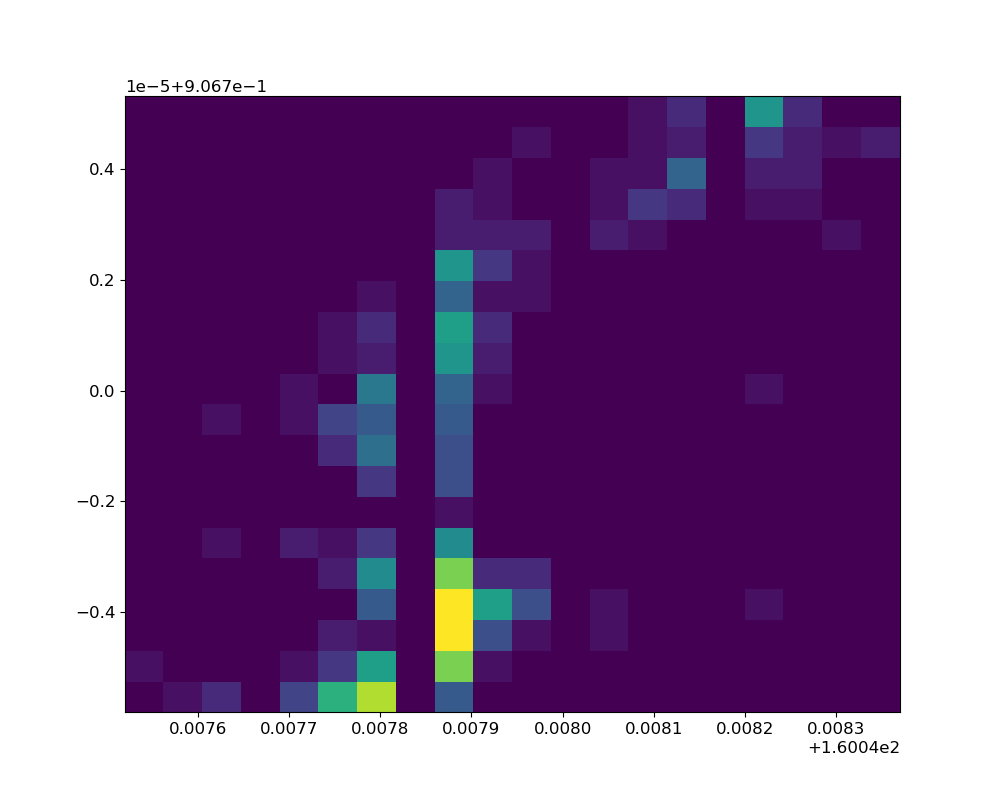

In [47]:
fig, ax = plt.subplots()
ax.hist2d(df_['Magnet Current [A]'], df_['NMR [T]'], bins=20);

<IPython.core.display.Javascript object>


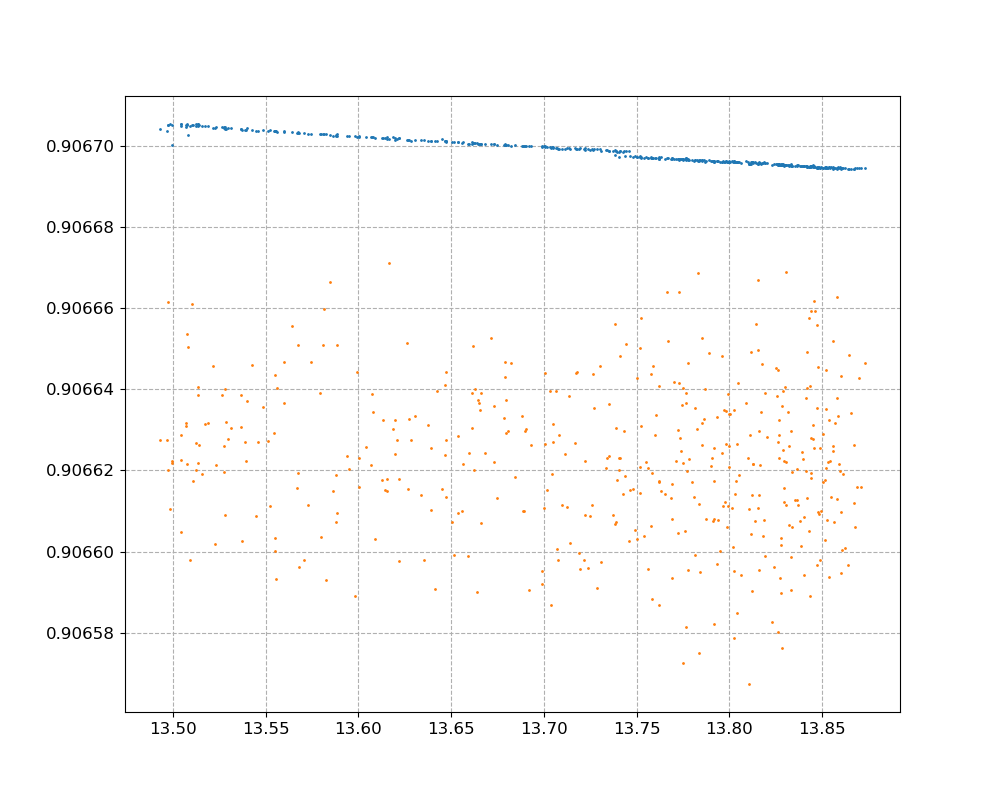

In [48]:
fig, ax = plt.subplots()
ax.scatter(df_['Yoke (center magnet)'], df_['NMR [T]'], s=1)
ax.scatter(df_['Yoke (center magnet)'], df_[f'{probe}_Cal_Bmag'], s=1)

# Regress Temperatures ["Processing"]

In [72]:
lm.__version__

'1.0.2'

In [73]:
import matplotlib

In [74]:
matplotlib.__version__

'3.3.4'

In [51]:
def lin_NMR(temp, **params):
    return params['b'] + params['m'] * temp

def lin_Hall(temp, **params):
    return params['offset'] + params['b'] + params['m'] * temp

In [178]:
def regress_temp_NMR(df, x='Yoke (center magnet)', y='NMR [T]', I=160, dI=5., make_plot=True, verbose=True):
    # prep data
    df_ = df.query(f'{I-dI} <= `Magnet Current [A]` <= {I+dI}')
    Imean = df_['Magnet Current [A]'].mean()
    x = df_[x].values
    y = df_[y].values
    ix = np.argsort(x)
    x = x[ix]
    y = y[ix]
    # lmfit
    model = lm.Model(lin_NMR, independent_vars=['temp'])
    params = lm.Parameters()
    params.add('b', value=0, vary=True)
    params.add('m', value=0, vary=True)
    result = model.fit(y, temp=x, params=params, weights=1/(1e-6) * np.ones_like(x),)# scale_covar=False)
    if verbose:
        print(result.fit_report())
    if make_plot:
        result.plot()
    return result, x, y, Imean

def regress_temp_Hall(df, result_NMR, x='Yoke (center magnet)', y=f'{probe}_Cal_Bmag', I=160, dI=5., make_plot=True, verbose=True):
    # prep data
    df_ = df.query(f'{I-dI} <= `Magnet Current [A]` <= {I+dI}')
    Imean = df_['Magnet Current [A]'].mean()
    x = df_[x].values
    y = df_[y].values
    ix = np.argsort(x)
    x = x[ix]
    y = y[ix]
    # lmfit
    model = lm.Model(lin_Hall, independent_vars=['temp'])
    params = lm.Parameters()
    params.add('offset', value=0, vary=True)
    params.add('b', value=result_NMR.params['b'].value, vary=False)
    params.add('m', value=result_NMR.params['m'].value, vary=False)
    result = model.fit(y, temp=x, params=params, weights=1/(3e-5) * np.ones_like(x),)# scale_covar=False)
    if verbose:
        print(result.fit_report())
    if make_plot:
        result.plot()
    return result, x, y, Imean

def B_Hall_div_B_NMR(df, I, T0=15., verbose=False):
    result_NMR, x_NMR, y_NMR, Imean_NMR = regress_temp_NMR(df, I=I, make_plot=False, verbose=verbose)
    result_Hall, x_Hall, y_Hall, Imean_Hall = regress_temp_Hall(df, result_NMR, I=I, make_plot=False, verbose=verbose)
    Bratio = lin_Hall(T0, **result_Hall.params) / lin_NMR(T0, **result_NMR.params)
    # ERRORS
    return Imean_NMR, Bratio

In [179]:
I0s = [128., 144., 160., 176., 192., 208., 224., 240., 256., 272., 282.]
Is = []
Bratios = []
for I in I0s:
    I_, Br_ = B_Hall_div_B_NMR(df, I)
    Is.append(I_)
    Bratios.append(Br_)
    print(f'I={I}, <I>={I_}, B_Hall/B_NMR={Bratios[-1]}')
Bratios = np.array(Bratios)
Is = np.array(Is)

I=128.0, <I>=128.03894602668987, B_Hall/B_NMR=0.9999666539151278
I=144.0, <I>=144.044131975578, B_Hall/B_NMR=0.9999464271359159
I=160.0, <I>=160.04788416114064, B_Hall/B_NMR=0.9999161991822912
I=176.0, <I>=176.05125564283674, B_Hall/B_NMR=0.9998771433598651
I=192.0, <I>=192.0562178678362, B_Hall/B_NMR=0.9997924197173963
I=208.0, <I>=208.06074528552355, B_Hall/B_NMR=0.9996647962311186
I=224.0, <I>=224.06536232856416, B_Hall/B_NMR=0.9995401704531424
I=240.0, <I>=240.06882422055284, B_Hall/B_NMR=0.9993895728387399
I=256.0, <I>=256.0711304534841, B_Hall/B_NMR=0.9992354433788991
I=272.0, <I>=272.07558876542697, B_Hall/B_NMR=0.999074479275391
I=282.0, <I>=281.67745380543346, B_Hall/B_NMR=0.9989904881915361


In [188]:
f = interp1d(Is, Bratios, kind='cubic', fill_value='extrapolate')
I_f = np.linspace(125, 285, 100)
B_f = f(I_f)

<IPython.core.display.Javascript object>


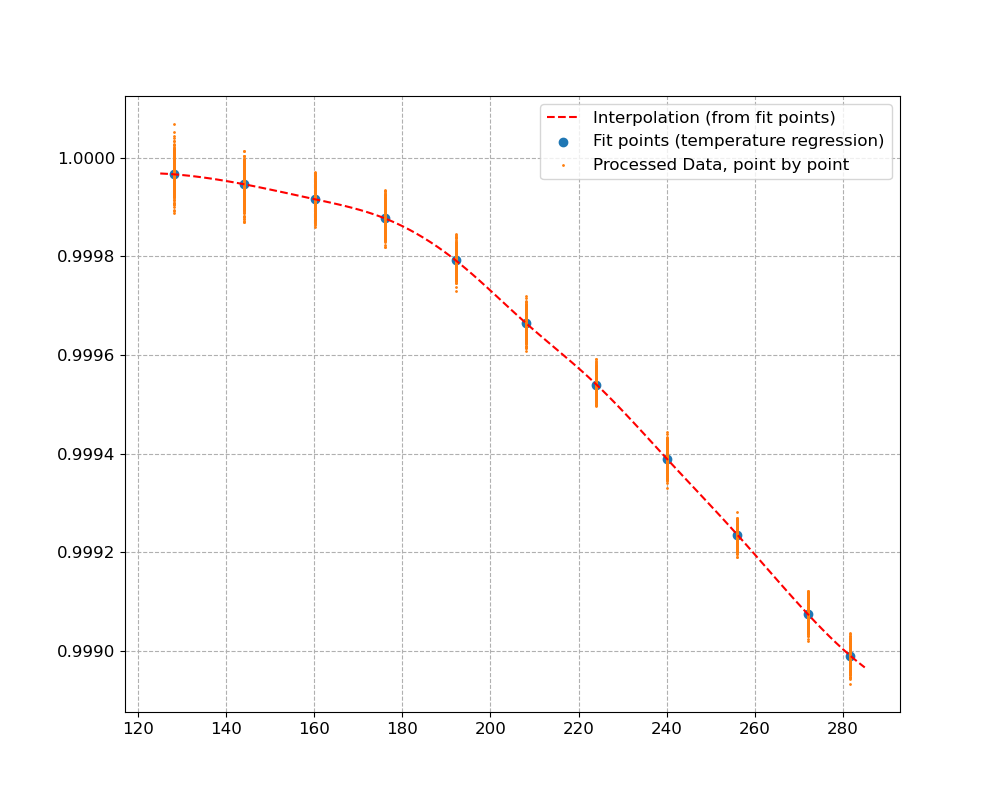

In [190]:
fig, ax = plt.subplots()
ax.scatter(Is, Bratios, label='Fit points (temperature regression)')
ax.scatter(df['Magnet Current [A]'], df[f'{probe}_Cal_Bmag']/df['NMR [T]'], s=1, label='Processed Data, point by point')
ax.plot(I_f, B_f, 'r--', label='Interpolation (from fit points)')
ax.legend()
#ax.set_xlim([120, 290])
#ax.set_ylim([0.9986, 1.0001])

# FEMM for B_Hall / B_NMR

In [199]:
# HALL PROBE HEIGHT ESTIMATION IN MAGNET
45.228395125223614 - -101.1969096601074, -45.61406686046516- -101.1969096601074

(146.425304785331, 55.582842799642236)

In [200]:
h_full = 45.228395125223614 - -101.1969096601074
h_under = -45.61406686046516- -101.1969096601074
h_real = h_full - h_under

In [201]:
h_full, h_under, h_real

(146.425304785331, 55.582842799642236, 90.84246198568877)

In [202]:
r_real = 125-h_real

In [203]:
r_real

34.15753801431123

- Read results from FEMM

In [232]:
FEMM_file = pkldir+'ramp_2021-02-24_guess_gap75_B_vs_I_results.txt'

In [233]:
df_FEMM = pd.read_csv(FEMM_file, skiprows=8, names=['Location', 'I', 'Br', 'Bz', 'B'])

In [234]:
df_FEMM

,Location,I,Br,Bz,B
0,NMR,0,0.000000e+00,0.000000,0.000000
1,Hall,0,0.000000e+00,0.000000,0.000000
2,NMR,1,-3.379209e-06,0.011764,0.011764
3,Hall,1,-7.154376e-07,0.011756,0.011756
4,NMR,2,-6.758821e-06,0.023529,0.023529
...,...,...,...,...,...
287,Hall,143,-6.196000e-04,1.346661,1.346661
288,NMR,144,-2.990933e-03,1.356397,1.356401
289,Hall,144,-6.314839e-04,1.350181,1.350181
290,NMR,145,-3.045870e-03,1.359992,1.359996


In [235]:
B_Hall_FEMM = df_FEMM.query('Location == "Hall"')['B'].values
B_NMR_FEMM = df_FEMM.query('Location == "NMR"')['B'].values
Bratio_FEMM = B_Hall_FEMM / B_NMR_FEMM
Is_FEMM = df_FEMM.query('Location == "Hall"')['I'].values * 2

<ipython-input-235-7390986f87c7>:3: RuntimeWarning:

invalid value encountered in true_divide



In [236]:
Is_FEMM, Bratio_FEMM

(array([  0,   2,   4,   6,   8,  10,  12,  14,  16,  18,  20,  22,  24,
         26,  28,  30,  32,  34,  36,  38,  40,  42,  44,  46,  48,  50,
         52,  54,  56,  58,  60,  62,  64,  66,  68,  70,  72,  74,  76,
         78,  80,  82,  84,  86,  88,  90,  92,  94,  96,  98, 100, 102,
        104, 106, 108, 110, 112, 114, 116, 118, 120, 122, 124, 126, 128,
        130, 132, 134, 136, 138, 140, 142, 144, 146, 148, 150, 152, 154,
        156, 158, 160, 162, 164, 166, 168, 170, 172, 174, 176, 178, 180,
        182, 184, 186, 188, 190, 192, 194, 196, 198, 200, 202, 204, 206,
        208, 210, 212, 214, 216, 218, 220, 222, 224, 226, 228, 230, 232,
        234, 236, 238, 240, 242, 244, 246, 248, 250, 252, 254, 256, 258,
        260, 262, 264, 266, 268, 270, 272, 274, 276, 278, 280, 282, 284,
        286, 288, 290]),
 array([       nan, 0.99932343, 0.99932341, 0.99932339, 0.99932337,
        0.99932333, 0.99932329, 0.99932324, 0.99932318, 0.99932311,
        0.99932305, 0.99932297, 0.99

In [237]:
# old FEMM results
df_f0 = pd.read_csv(pkldir+'gap75_B_vs_I_r0z0_0-300_results.txt', skiprows=8, names=['I','B'], delimiter=',')
df_fp = pd.read_csv(pkldir+'gap75_B_vs_I_r0z37.5_results.txt', skiprows=8, names=['I', 'B'], delimiter=',')
df_f0 = df_f0.query('I <= 140').copy()
df_f0.eval('I = I*2', inplace=True)
df_fp = df_fp.query('I <= 140').copy()
df_fp.eval('I = I*2', inplace=True)
df_f0['B_ratio'] = df_f0.B / df_fp.B

<IPython.core.display.Javascript object>


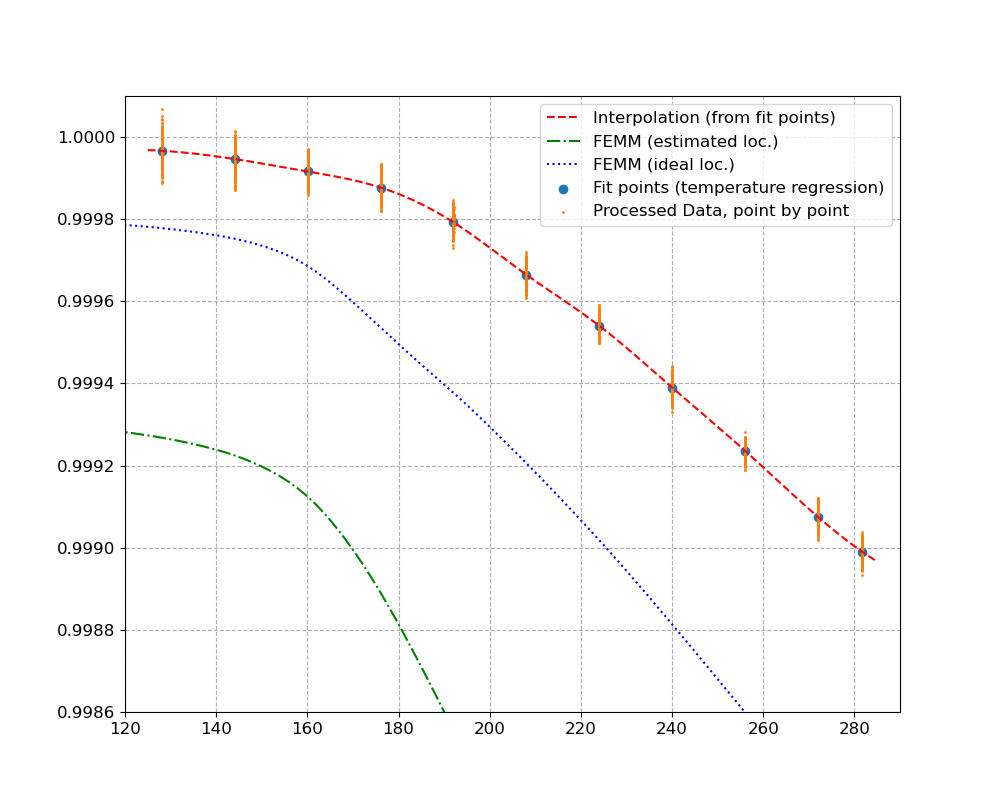

(0.9986, 1.0001)

In [238]:
fig, ax = plt.subplots()
ax.scatter(Is, Bratios, label='Fit points (temperature regression)')
ax.scatter(df['Magnet Current [A]'], df[f'{probe}_Cal_Bmag']/df['NMR [T]'], s=1, label='Processed Data, point by point')
ax.plot(I_f, B_f, 'r--', label='Interpolation (from fit points)')
ax.plot(Is_FEMM, Bratio_FEMM, 'g-.', label='FEMM (estimated loc.)')
ax.plot(df_f0['I'], df_f0['B_ratio'], 'b:', label='FEMM (ideal loc.)')
ax.legend()
ax.set_xlim([120, 290])
ax.set_ylim([0.9986, 1.0001])

[[Model]]
    Model(lin_NMR)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 61
    # data points      = 980
    # variables        = 2
    chi-square         = 1227.19719
    reduced chi-square = 1.25480285
    Akaike info crit   = 224.436859
    Bayesian info crit = 234.211964
[[Variables]]
    b:  0.98463495 +/- 3.6200e-06 (0.00%) (init = 0)
    m: -4.7602e-05 +/- 2.5388e-07 (0.53%) (init = 0)
[[Correlations]] (unreported correlations are < 0.100)
    C(b, m) = -1.000


<IPython.core.display.Javascript object>


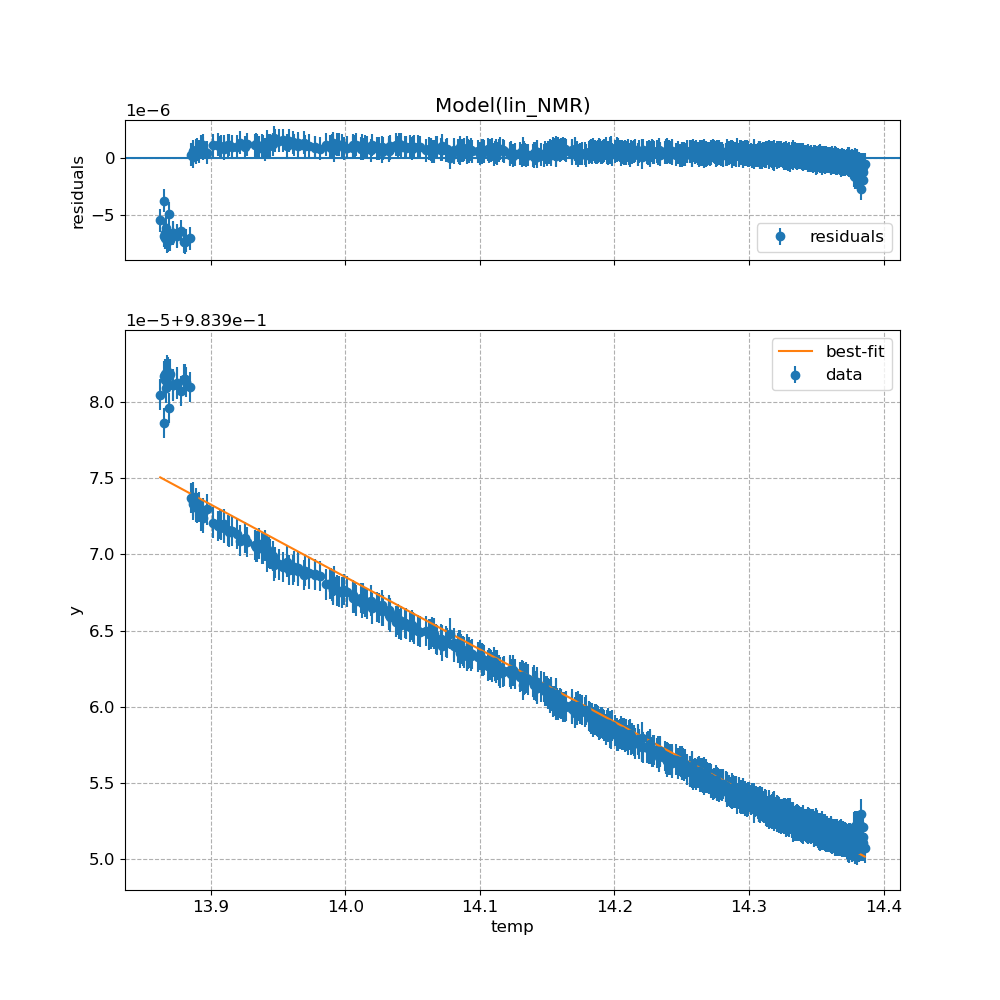

[[Model]]
    Model(lin_Hall)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 7
    # data points      = 980
    # variables        = 1
    chi-square         = 382.049454
    reduced chi-square = 0.39024459
    Akaike info crit   = -921.162462
    Bayesian info crit = -916.274909
[[Variables]]
    offset: -1.2088e-04 +/- 5.9866e-07 (0.50%) (init = 0)
    b:       0.9846349 (fixed)
    m:      -4.760185e-05 (fixed)


<IPython.core.display.Javascript object>


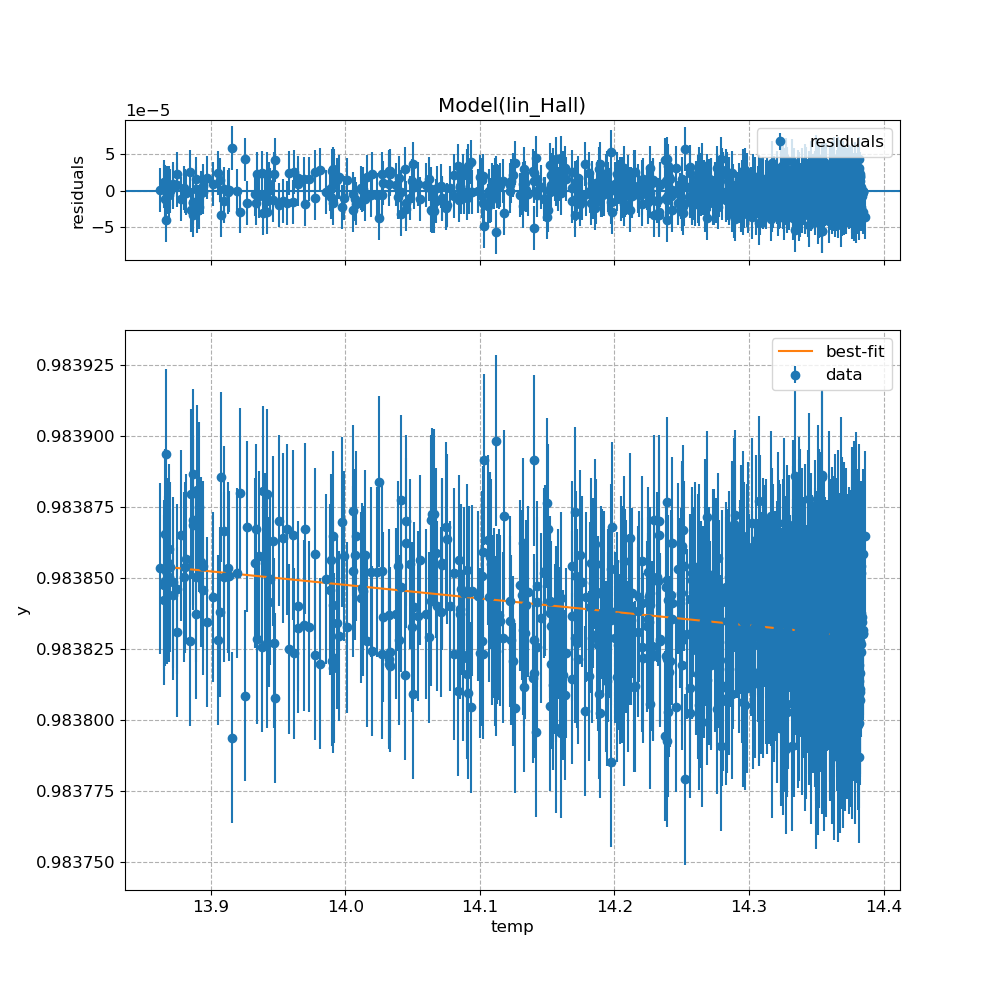

In [147]:
I = 176 # 160
result_NMR, x_NMR, y_NMR = regress_temp_NMR(df, I=I)
result_Hall, x_Hall, y_Hall = regress_temp_Hall(df, result_NMR, I=I)

In [148]:
T0 = 15.

In [149]:
lin_Hall(T0, **result_Hall.params), lin_NMR(T0, **result_NMR.params)

(0.9838000397466234, 0.9839209209651316)

In [150]:
lin_Hall(T0, **result_Hall.params) / lin_NMR(T0, **result_NMR.params)

0.9998771433598651

In [138]:
lin_Hall(T0, **result_Hall.params) / lin_NMR(T0, **result_NMR.params)

0.9999161991822912

In [136]:
lin_NMR(T0, **result_NMR.params)

0.9066599721545276

In [130]:
Bratio = (yfit + result_Hall.params['offset']) / yfit

In [131]:
np.mean(Bratio), np.std(Bratio, ddof=1)

(0.9999162027350187, 3.062647633621753e-10)

<IPython.core.display.Javascript object>


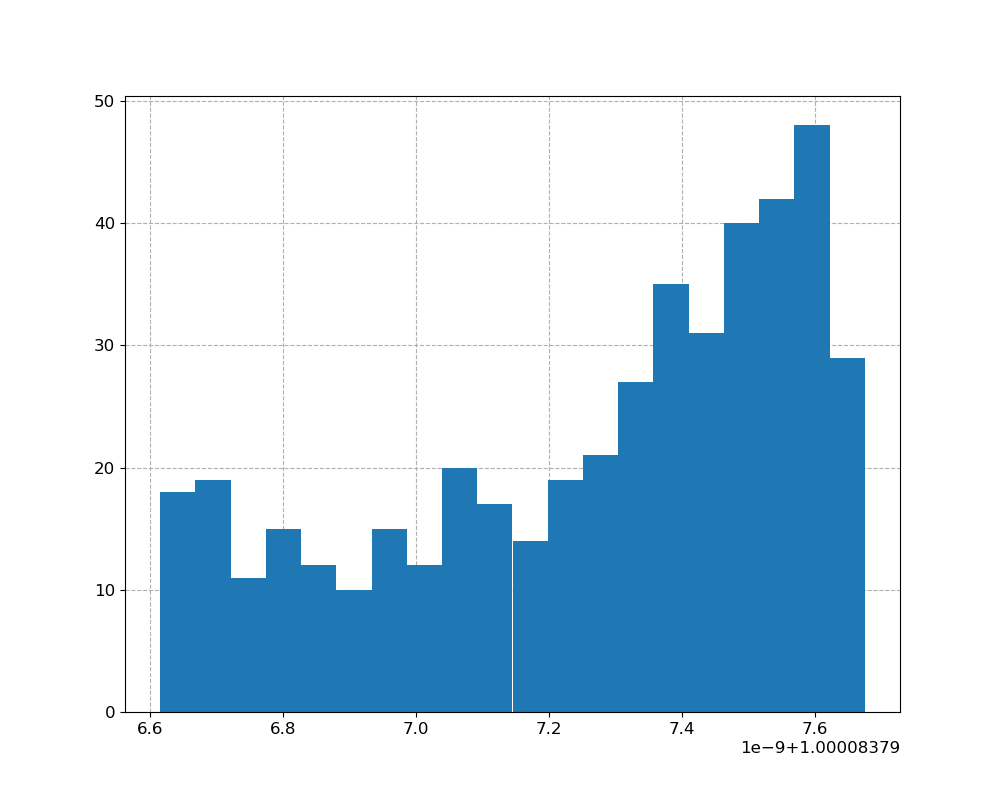

(array([18., 19., 11., 15., 12., 10., 15., 12., 20., 17., 14., 19., 21.,
        27., 35., 31., 40., 42., 48., 29.]),
 array([1.0000838, 1.0000838, 1.0000838, 1.0000838, 1.0000838, 1.0000838,
        1.0000838, 1.0000838, 1.0000838, 1.0000838, 1.0000838, 1.0000838,
        1.0000838, 1.0000838, 1.0000838, 1.0000838, 1.0000838, 1.0000838,
        1.0000838, 1.0000838, 1.0000838]),
 <BarContainer object of 20 artists>)

In [126]:
fig, ax = plt.subplots()
ax.hist((yfit + result_Hall.params['offset']) / yfit, bins=20)

In [108]:
yfit = lin_NMR(x, **result.params)

<IPython.core.display.Javascript object>


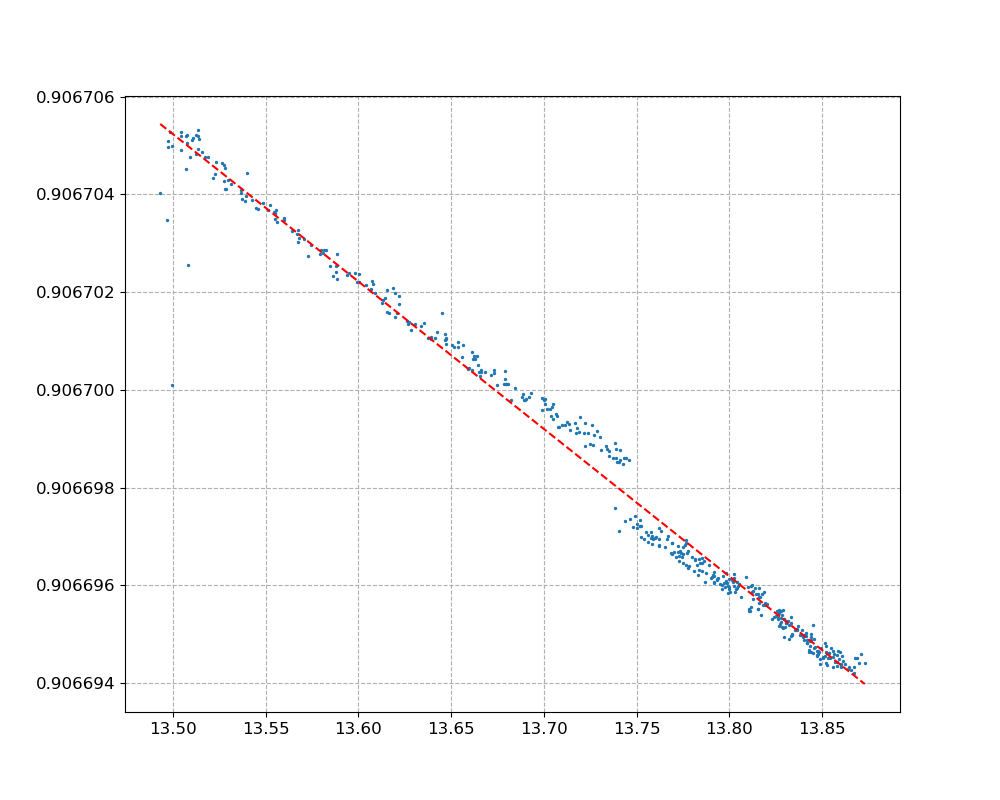

In [112]:
fig, ax = plt.subplots()
ax.scatter(x, y, s=2)
ax.plot(x, yfit, 'r--')

In [107]:
lin_NMR(np.array([14,15,16]), **result.params)

array([0.90669015, 0.90665997, 0.9066298 ])

In [104]:
type(result.params)

lmfit.parameter.Parameters

In [92]:
type(result)

lmfit.model.ModelResult

<IPython.core.display.Javascript object>


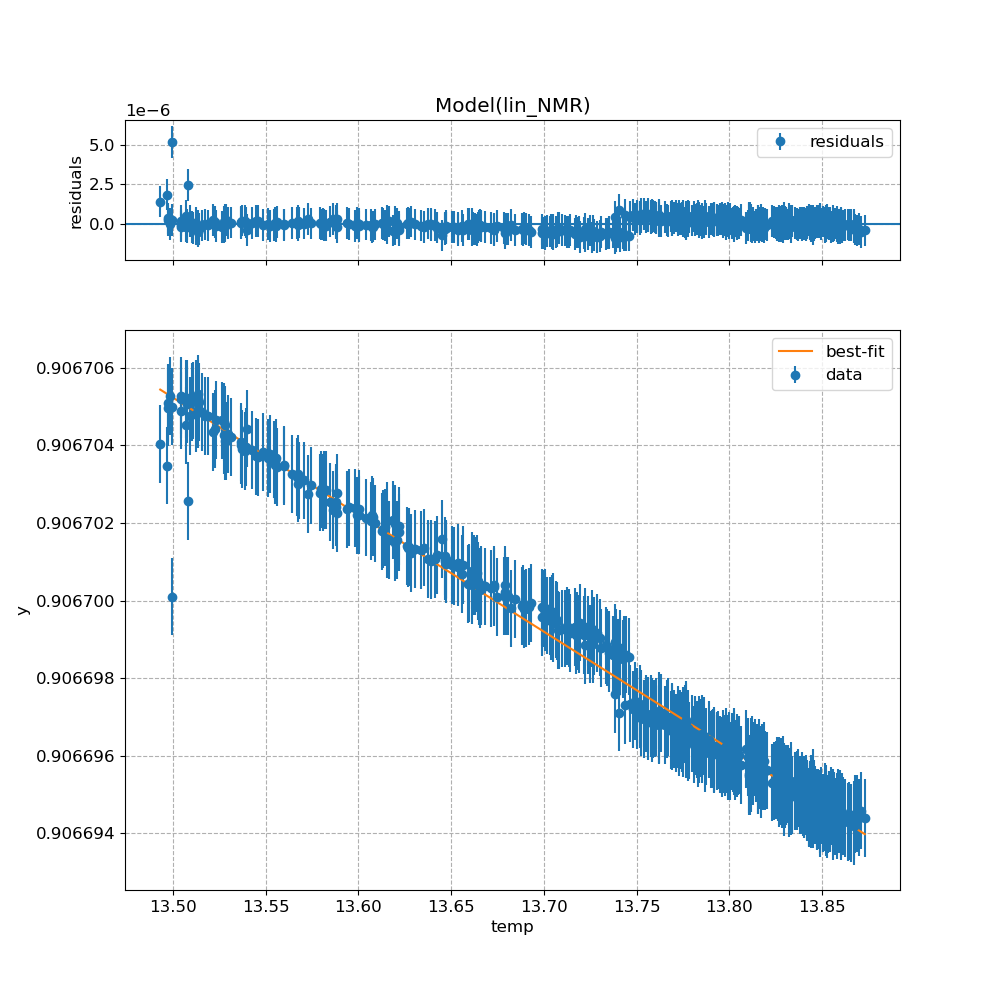

(<Figure size 1000x1000 with 2 Axes>, GridSpec(2, 1, height_ratios=[1, 4]))

In [97]:
result.plot()

<IPython.core.display.Javascript object>


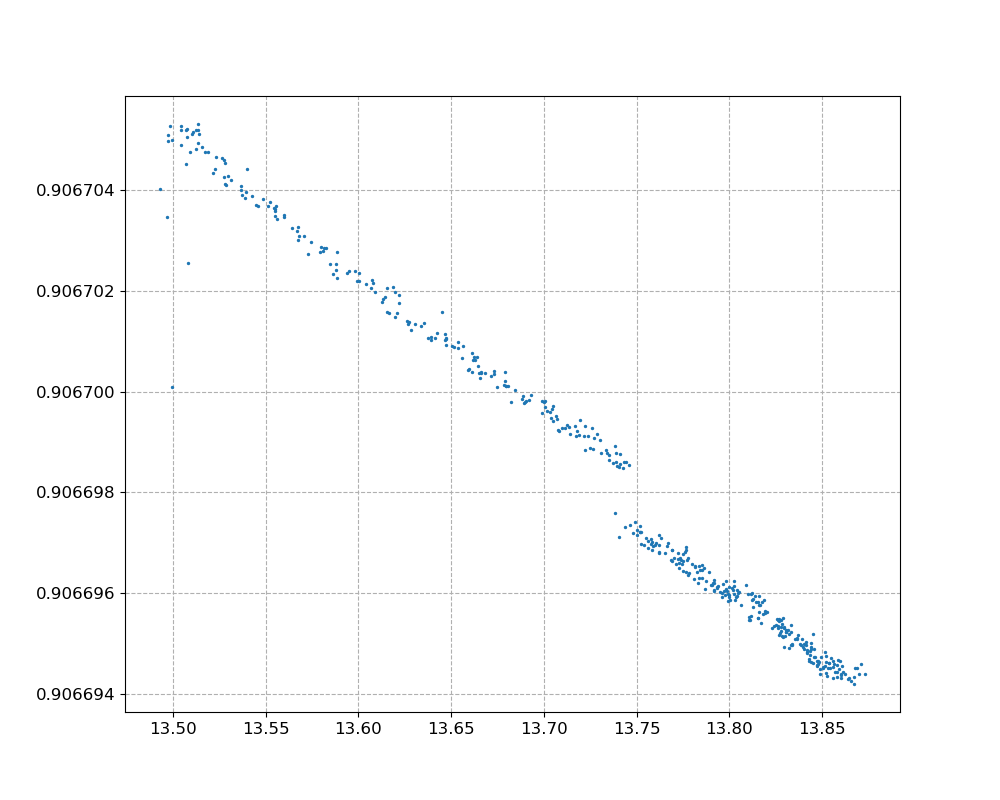

In [77]:
fig, ax = plt.subplots()
ax.scatter(x, y, s=2)

<IPython.core.display.Javascript object>


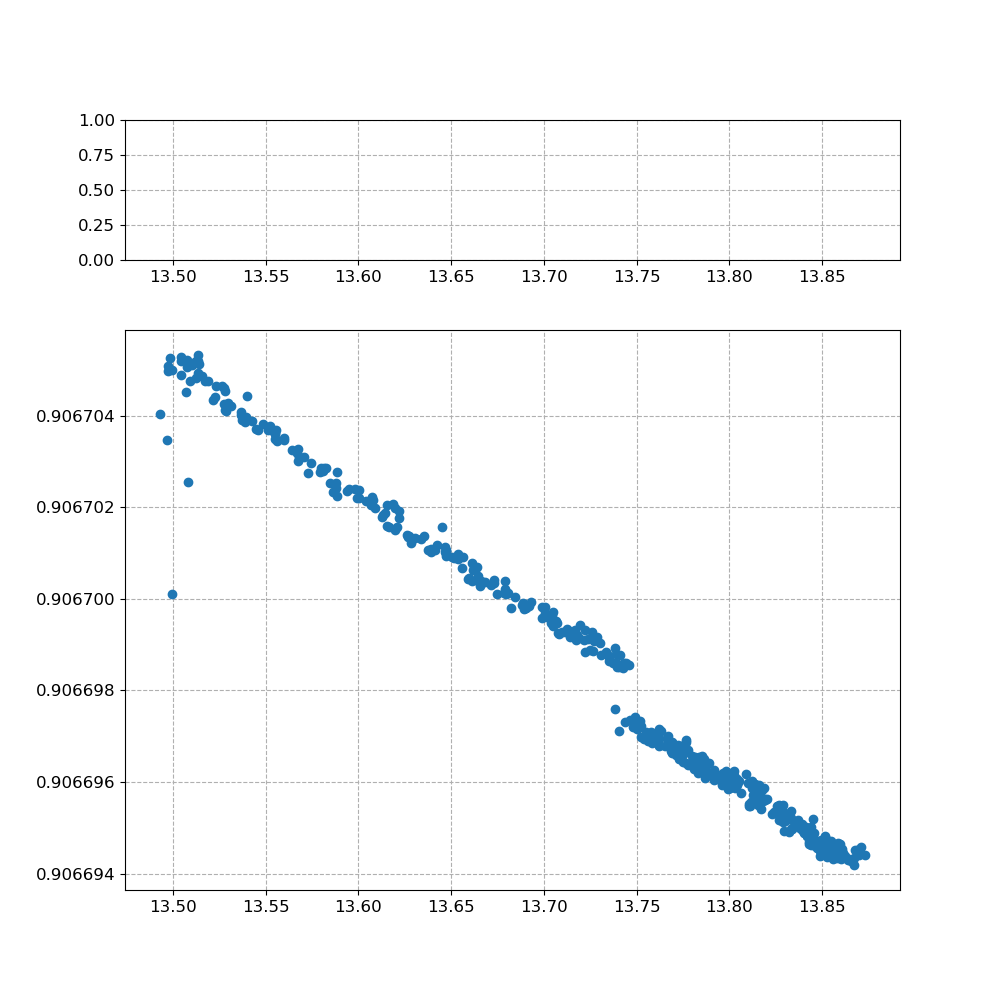

AttributeError: 'float' object has no attribute 'shape'

In [71]:
result.plot()

<IPython.core.display.Javascript object>


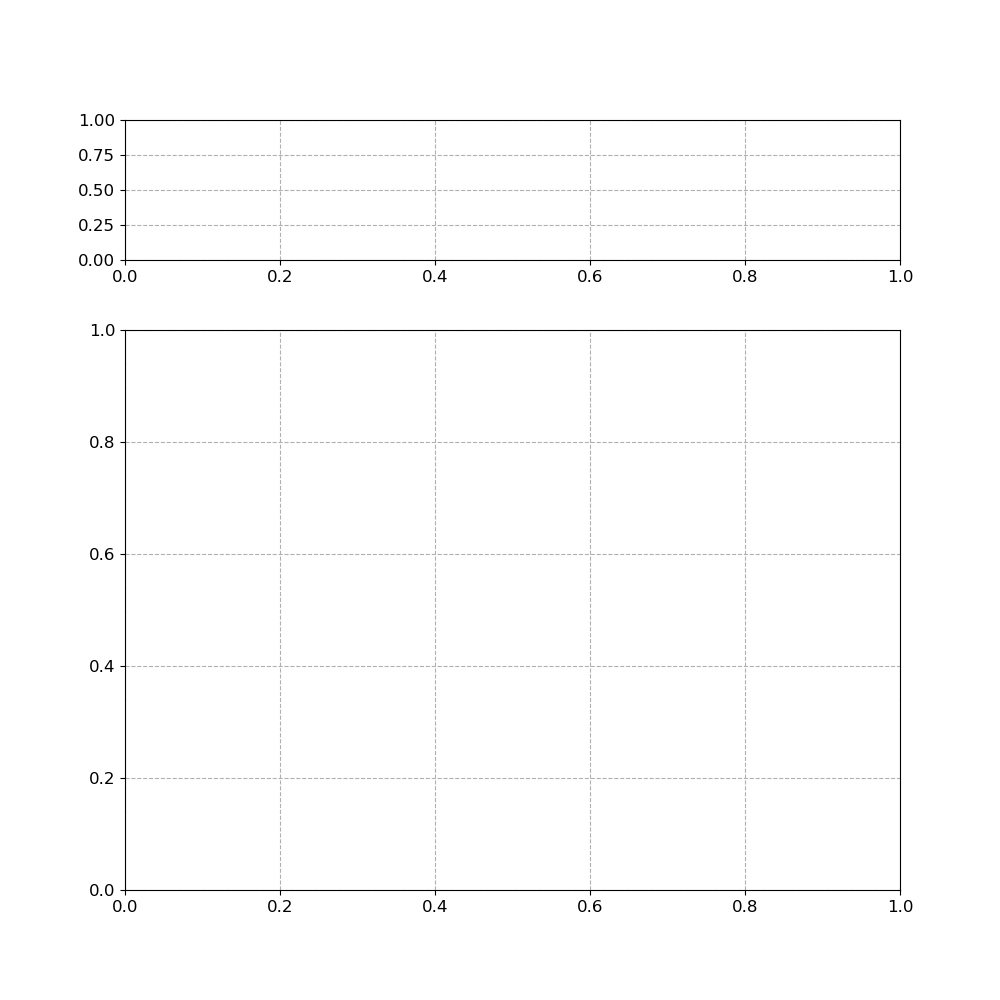

AttributeError: 'float' object has no attribute 'shape'

In [63]:
result.plot()

In [ ]:
################################################

## Python Scripts

No handles with labels found to put in legend.


max(DF0000000D5E803A_Cal_Bmag) = 0.7311087740869862 T
processed: max(DF0000000D5E803A_Cal_Bmag) = 0.7245312813720227 T
max(C90000000D53983A_Cal_Bmag) = 0.003165716540324323 T
processed: max(C90000000D53983A_Cal_Bmag) = 0.0029942966619291417 T
max(C50000000D5E473A_Cal_Bmag) = 0.020109926721830637 T
processed: max(C50000000D5E473A_Cal_Bmag) = 0.020109926721830637 T
max(6A0000000D61333A_Cal_Bmag) = 1.3199048407200449 T
processed: max(6A0000000D61333A_Cal_Bmag) = 1.3071311696867465 T
                                     Time  Magnet Current [A]  \
Datetime                                                        
2021-03-11 17:46:47  3/11/2021 5:46:47 PM          281.677420   
2021-03-11 17:47:47  3/11/2021 5:47:47 PM          281.677477   
2021-03-11 17:48:47  3/11/2021 5:48:47 PM          281.677647   
2021-03-11 17:49:47  3/11/2021 5:49:47 PM          281.677420   
2021-03-11 17:50:47  3/11/2021 5:50:47 PM          281.677533   

                     Magnet Voltage [V]  Coil 1 (new)  Coil

No handles with labels found to put in legend.


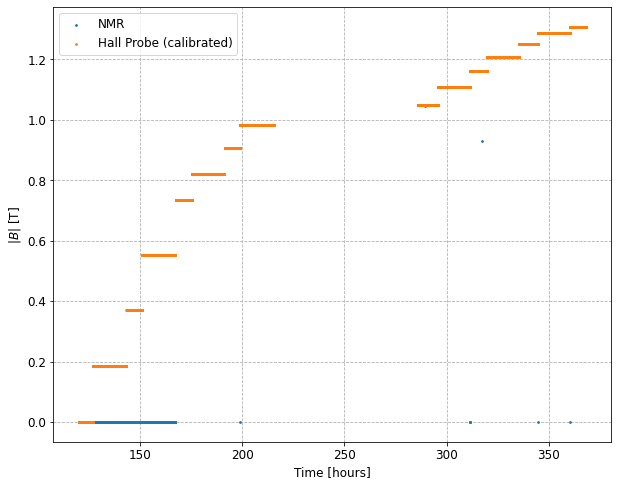

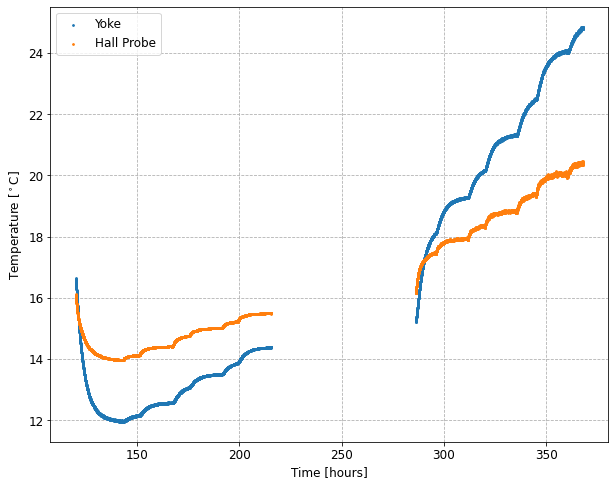

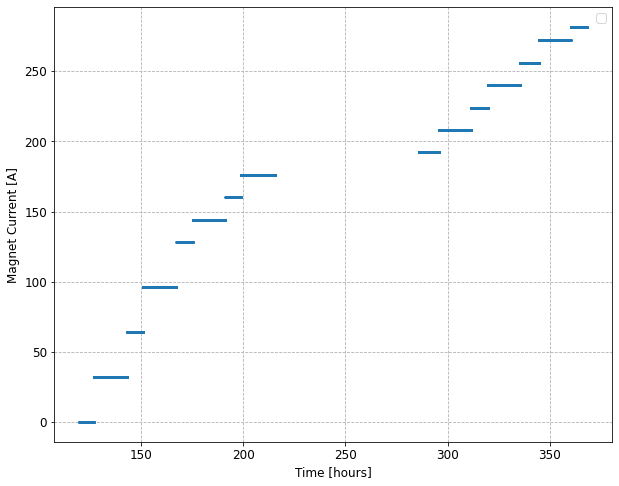

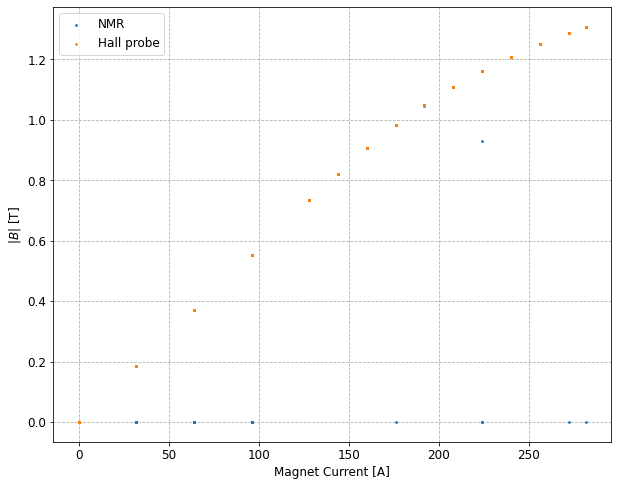

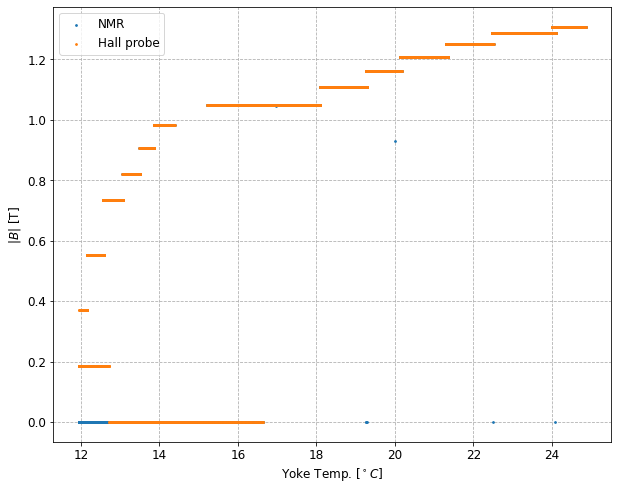

...

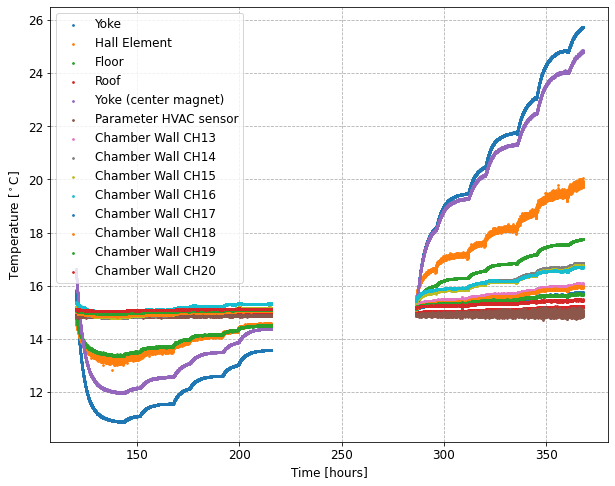

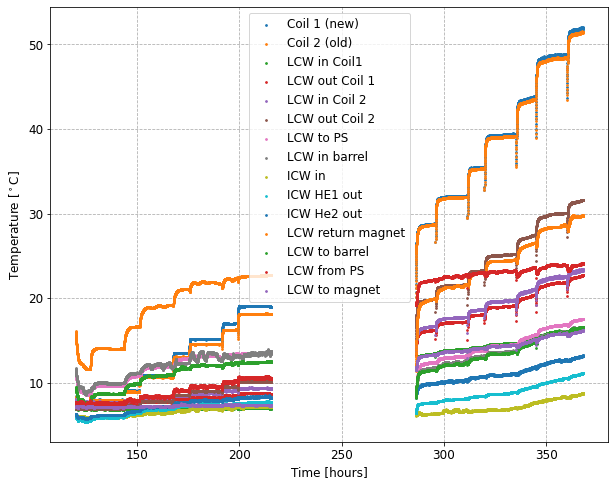

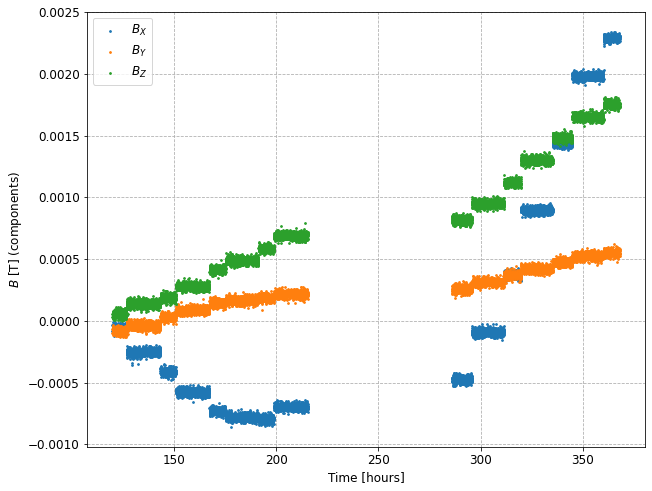

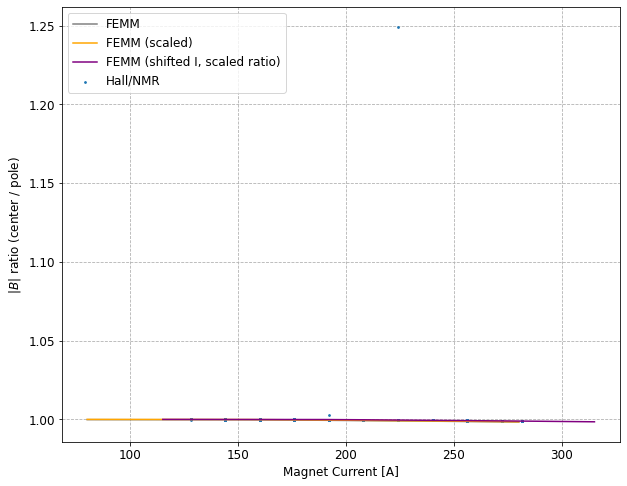

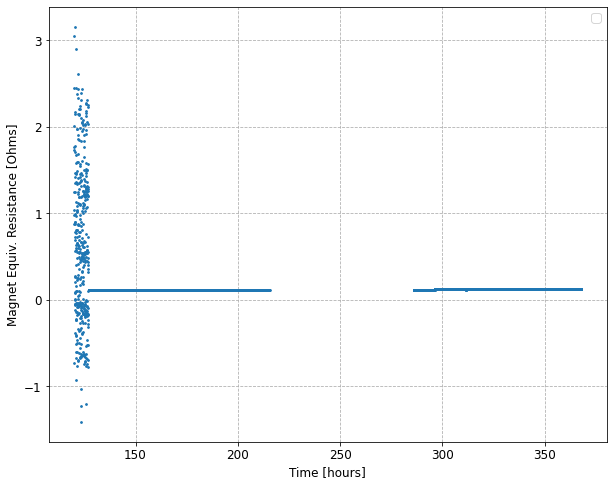

In [1]:
# process and generate plots
from plot_slow_controls import *

mean(I) = 8.702E-04
[[Model]]
    Model(lin)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 3
    # data points      = 357
    # variables        = 2
    chi-square         = 3.570e-248
    reduced chi-square = 0.00000000
    Akaike info crit   = -205501.720
    Bayesian info crit = -205493.964
##  Warning: uncertainties could not be estimated:
[[Variables]]
    b:  0.00000000 +/- 0.00000000 (nan%) (init = 0)
    m:  0.00000000 +/- 0.00000000 (nan%) (init = 0)
m / b =  NAN
m / I =  0.000E+00


/home/ckampa/anaconda3/envs/mu2e/lib/python3.8/site-packages/lmfit/printfuncs.py:180: RuntimeWarning: invalid value encountered in double_scalars
  spercent = '({:.2%})'.format(abs(par.stderr/par.value))
/home/ckampa/coding/hallprobecalib/scripts/magnet_ramp_Feb_2021/slow_temp_regress.py:102: RuntimeWarning: invalid value encountered in double_scalars
  print(f'm / b = {result2.params["m"].value / result2.params["b"].value : 0.3E}')


AttributeError: 'float' object has no attribute 'shape'

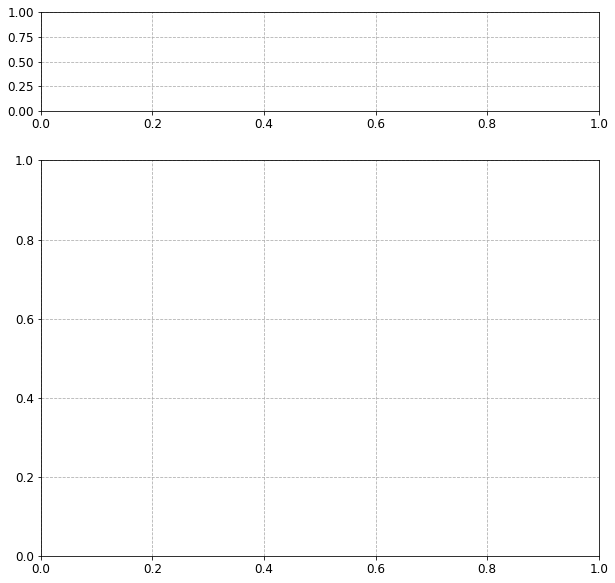

In [3]:
# analyze data
from slow_temp_regress import *

## Setup

In [5]:
df = pd.read_pickle(ddir+'ramp_2021-02-24_processed.pkl')

In [6]:
df

,Time,Magnet Current [A],Magnet Voltage [V],Coil 1 (new),Coil 2 (old),LCW in Coil1,LCW out Coil 1,LCW in Coil 2,LCW out Coil 2,Yoke,...,SmarAct_Meas_Rotation_Angle_1,SmarAct_Meas_Angle_2,SmarAct_Meas_Rotation_Angle_2,seconds_delta,hours_delta,days_delta,DF0000000D5E803A_Cal_Bmag,C90000000D53983A_Cal_Bmag,C50000000D5E473A_Cal_Bmag,6A0000000D61333A_Cal_Bmag
Datetime,,,,,,,,,,,,,,,,,,,,,
2021-03-01 09:51:43,3/1/2021 9:51:43 AM,0.000672,0.001643,8.435831,8.354500,6.909949,7.484150,8.040173,7.108479,15.836957,...,0.0,0.001119,0.0,432021.0,120.005833,5.000243,0.000474,0.000116,0.000127,0.000927
2021-03-01 09:52:43,3/1/2021 9:52:43 AM,0.000700,0.000691,8.337690,8.323365,6.913098,7.457797,8.036749,7.106894,15.808518,...,0.0,0.001115,0.0,432081.0,120.022500,5.000938,0.000450,0.000108,0.000121,0.000898
2021-03-01 09:53:43,3/1/2021 9:53:43 AM,0.000703,0.001220,8.288239,8.268475,6.896706,7.444767,7.997497,7.073971,15.785650,...,0.0,0.001119,0.0,432141.0,120.039167,5.001632,0.000497,0.000118,0.000132,0.000933
2021-03-01 09:54:43,3/1/2021 9:54:43 AM,0.000727,0.001281,8.240237,8.222038,6.878652,7.405972,7.997888,7.039308,15.758918,...,0.0,0.001119,0.0,432201.0,120.055833,5.002326,0.000444,0.000118,0.000142,0.000902
2021-03-01 09:55:43,3/1/2021 9:55:43 AM,0.000547,0.001102,8.167383,8.192588,6.912902,7.430858,8.020038,7.067418,15.736776,...,0.0,0.001119,0.0,432261.0,120.072500,5.003021,0.000475,0.000093,0.000124,0.000915
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-11 17:46:47,3/11/2021 5:46:47 PM,281.677420,36.814150,51.974365,51.455513,16.494814,22.697769,23.309382,31.614250,25.736761,...,0.0,0.001049,0.0,1324525.0,367.923611,15.330150,0.724450,0.002921,0.020067,1.306971
2021-03-11 17:47:47,3/11/2021 5:47:47 PM,281.677477,36.814183,51.953983,51.460171,16.498129,22.703094,23.390150,31.622131,25.739260,...,0.0,0.001047,0.0,1324585.0,367.940278,15.330845,0.724439,0.002959,0.020051,1.306981
2021-03-11 17:48:47,3/11/2021 5:48:47 PM,281.677647,36.814433,51.900555,51.444550,16.515627,22.720036,23.383900,31.625975,25.749882,...,0.0,0.001051,0.0,1324645.0,367.956944,15.331539,0.724415,0.002932,0.020051,1.306977


## Data Processing

The following processing cuts / steps are applied:
- f

See below a comparison of $B$ vs. $I$ before and after processing.

### Before

### After

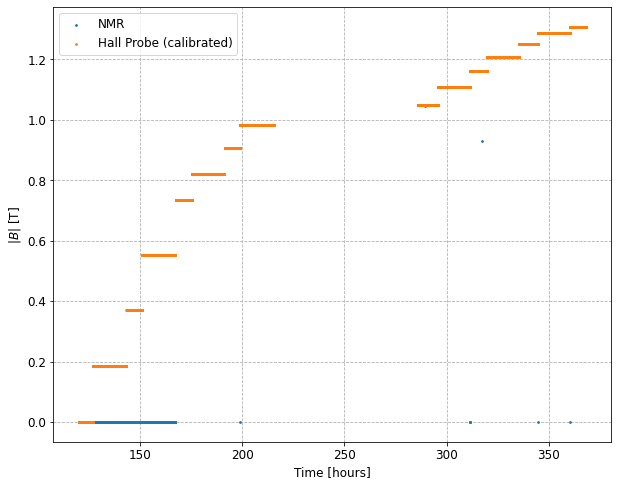

In [4]:
fig1

## Results

### Modeling $B$ vs. $I$

#### Interpolation

#### Polynomial Model

### $B$ Location Dependence

### Finite Element Comparison

To compare to some expectation, a 2D-axisymmetric finite element method was employed. The magnet modeling can be found at https://github.com/FMS-Mu2e/CalibMagnetCalc. This utilizes the Finite Element Method Magnetics (FEMM) software and is a reasonable approximation of the calibration magnet, except for the yoke, which is not axisymmetric.

## Conclusions / Next Steps

Given the planned reliance on the NMR measurement of $|B|$ as an indicator of $|B|$ at the location of the Hall probe, there is a serious need to resolve the 